# 보안 뉴스 크롤링

보안뉴스 서버가 가지고 있는 모든 뉴스를 크롤링한다.

https://www.boannews.com/default.asp

보안뉴스의 뉴스는 아래와 같은 url로 호출할 수 있다.  
https://www.boannews.com/media/view.asp?idx=100431

`idx=` 뒤에 번호를 넣는 것으로 지금까지 나온 뉴스를 받을 수 있다.

지금까지 100431 개의 뉴스가 존재한다.

---
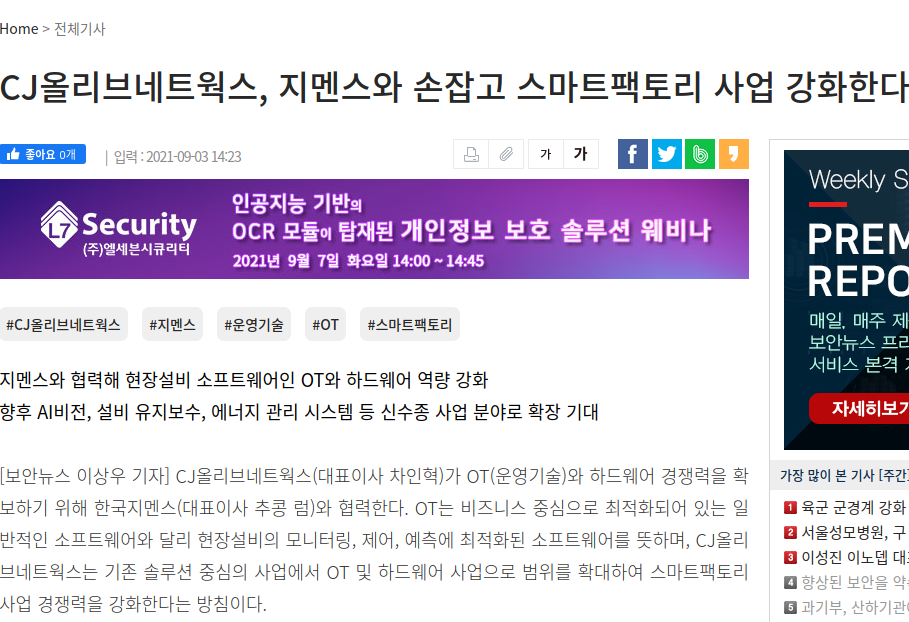

---

보안 뉴스에 들어가면 위와 같이 뉴스기사가 나온다.

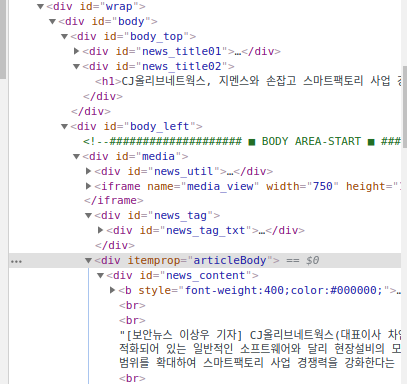

\< div id="news_title02"\>태그 안에 뉴스의 제목이 있고,  
\< div id="new_tag_txt"\>태그 안에 뉴스의 태그,  
\< div id="new_content"\>태그 안에 뉴스의 내용이 담겨 있다.

아래는 각각을 가져오는 코드이다.

In [23]:
from bs4 import BeautifulSoup
from urllib.request import urlopen

url = 'https://www.boannews.com/media/view.asp?idx=100431'
a=[]
html = urlopen(url)
bs = BeautifulSoup(html)
title=bs.select_one("div#news_title02")
print(title.text.strip())


CJ올리브네트웍스, 지멘스와 손잡고 스마트팩토리 사업 강화한다


In [24]:
from bs4 import BeautifulSoup
from urllib.request import urlopen

url = 'https://www.boannews.com/media/view.asp?idx=100431'
a=[]
html = urlopen(url)
bs = BeautifulSoup(html)
tag=bs.select_one("div#news_tag_txt")
rows=tag.select("a")
for row in rows:
    print(row.text.strip())
    a.append(row.text.strip())
    print()
print(a)

#CJ올리브네트웍스

#지멘스

#운영기술

#OT

#스마트팩토리

['#CJ올리브네트웍스', '#지멘스', '#운영기술', '#OT', '#스마트팩토리']


In [43]:
from bs4 import BeautifulSoup
from urllib.request import urlopen

url = 'https://www.boannews.com/media/view.asp?idx=100431'

html = urlopen(url)
bs = BeautifulSoup(html)
news=bs.select_one("div#news_content")
news

<div id="news_content">
<b style="font-weight:400;color:#000000;">지멘스와 협력해 현장설비 소프트웨어인 OT와 하드웨어 역량 강화<br/>향후 AI비전, 설비 유지보수, 에너지 관리 시스템 등 신수종 사업 분야로 확장 기대</b><br/><br/>[보안뉴스 이상우 기자] CJ올리브네트웍스(대표이사 차인혁)가 OT(운영기술)와 하드웨어 경쟁력을 확보하기 위해 한국지멘스(대표이사 추콩 럼)와 협력한다. OT는 비즈니스 중심으로 최적화되어 있는 일반적인 소프트웨어와 달리 현장설비의 모니터링, 제어, 예측에 최적화된 소프트웨어를 뜻하며, CJ올리브네트웍스는 기존 솔루션 중심의 사업에서 OT 및 하드웨어 사업으로 범위를 확대하여 스마트팩토리 사업 경쟁력을 강화한다는 방침이다.<br/><br/><div class="news_image"><span class="img"><img border="1" src="http://www.boannews.com/media/upFiles2/2021/09/201612676_9645.jpg"/></span><p class="txt">▲왼쪽부터 CJ올리브네트웍스 차인혁 대표, 한국지멘스 토마스 슈미드 디지털 인더스트리 부문 대표[사진=CJ올리브네트웍스]</p></div><br/>CJ올리브네트웍스는 지멘스와 지난 2일 충정로에 있는 한국지멘스 본사에서 전략적 제휴를 위한 업무협약을 맺었다. 이번 협약을 통해 CJ올리브네트웍스는 스마트팩토리 구축과 설비에 대한 관리, 운영 및 사업 인벤토리 공동 개발을 책임진다. 지멘스는 PLC(설비 컨트롤러)와 SCADA(원격 감시 제어) 제품을 공급하고 구축 노하우를 제공하며, CJ올리브네트웍스 스마트팩토리 부문 임직원을 대상으로 OT 및 하드웨어 기술 교육을 지원할 예정이다. 또한, 양사는 온·오프라인 채널을 활용해 스마트팩토리 설계와 구축, 영업확대, 마케팅, 기술지원 등에 상호협력할 예정이다.<br/><br/>차인혁 CJ올리브네트웍스 대표는 “솔루션 중

가져온 뉴스기사의 내용은 아래와 같이 처리했다.

In [46]:
body=''
for row in news.children:
    if not isinstance(row, NavigableString):
        if row.text.strip() !='':
            body=body+row.text.strip() +'\n'
    else :
        body=body+row.strip() +'\n'
print(body)


지멘스와 협력해 현장설비 소프트웨어인 OT와 하드웨어 역량 강화향후 AI비전, 설비 유지보수, 에너지 관리 시스템 등 신수종 사업 분야로 확장 기대
[보안뉴스 이상우 기자] CJ올리브네트웍스(대표이사 차인혁)가 OT(운영기술)와 하드웨어 경쟁력을 확보하기 위해 한국지멘스(대표이사 추콩 럼)와 협력한다. OT는 비즈니스 중심으로 최적화되어 있는 일반적인 소프트웨어와 달리 현장설비의 모니터링, 제어, 예측에 최적화된 소프트웨어를 뜻하며, CJ올리브네트웍스는 기존 솔루션 중심의 사업에서 OT 및 하드웨어 사업으로 범위를 확대하여 스마트팩토리 사업 경쟁력을 강화한다는 방침이다.
▲왼쪽부터 CJ올리브네트웍스 차인혁 대표, 한국지멘스 토마스 슈미드 디지털 인더스트리 부문 대표[사진=CJ올리브네트웍스]
CJ올리브네트웍스는 지멘스와 지난 2일 충정로에 있는 한국지멘스 본사에서 전략적 제휴를 위한 업무협약을 맺었다. 이번 협약을 통해 CJ올리브네트웍스는 스마트팩토리 구축과 설비에 대한 관리, 운영 및 사업 인벤토리 공동 개발을 책임진다. 지멘스는 PLC(설비 컨트롤러)와 SCADA(원격 감시 제어) 제품을 공급하고 구축 노하우를 제공하며, CJ올리브네트웍스 스마트팩토리 부문 임직원을 대상으로 OT 및 하드웨어 기술 교육을 지원할 예정이다. 또한, 양사는 온·오프라인 채널을 활용해 스마트팩토리 설계와 구축, 영업확대, 마케팅, 기술지원 등에 상호협력할 예정이다.
차인혁 CJ올리브네트웍스 대표는 “솔루션 중심의 사업에 OT와 하드웨어 역량을 더해 스마트팩토리 토탈 서비스 플랫폼을 마련하고 사업 경쟁력을 높이고자 한다”며. “이번 협업을 통해 산업용 IoT와 AI 기반의 설비 예지보전, 공장 에너지 관리 시스템 등 4차산업 신수종 분야로 사업을 확대할 수 있을 것”이라고 말했다.
한편, 스마트팩토리 수요 기업들은 자동화 기술뿐 아니라 이를 구현하는 자동화 설비를 함께 필요로 한다. CJ올리브네트웍스는 고객사의 불편과 품질 문제를 해소하고 스마트팩토리 사업 경쟁력을 강화하기 위해 

# 크롤링 실패 요소

1. idx에 기사가 없을때
2. idx에 할당된 기사는 있지만 html코드가 다를때
3. 태그가 없는 뉴스도 있다.

### idx에 기사가 없을때
해당 인덱스에서 호출되는 뉴스가 없을때 bs는 다음과 같이 된다.

그래서 등록된 정보가 없다면 해당 url을 넘긴다.

In [29]:
from bs4 import BeautifulSoup
from urllib.request import urlopen
import pandas as pd
import time

url = "https://www.boannews.com/media/view.asp?idx=5"
html = urlopen(url)

bs = BeautifulSoup(html,'lxml')
bs

<html><head><script language="JavaScript">alert('등록된 정보가 없습니다.');</script><meta content="0;url=/default.asp" http-equiv="refresh"/></head></html>

In [37]:
bs.select_one('script').text

"alert('등록된 정보가 없습니다.');"

In [39]:
"등록된 정보가 없습니다." in bs.select_one('script').text

True

### idx에 할당된 기사는 있지만 html코드가 다를때

아래와 같이 url에 호출되는 뉴스가 있고 그것을 호출했음에도 html코드가 달라 스크래핑을 못하는 경우가 있다.

In [21]:
url='https://www.boannews.com/media/view.asp?idx=3039'
html=urlopen(url)
bs = BeautifulSoup(html)
bs

<!DOCTYPE html>
<html lang="ko" xml:lang="ko" xmlns="http://www.w3.org/1999/xhtml">
<head>
<title>소리바다, 56개 음반제작사로 부터 형사피소</title>
<link href="https://www.boannews.com/images/favicon.ico" rel="shortcut icon" type="image/x-icon"/>
<meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
<link href="../css/media_view.css?version=3.4" rel="stylesheet" type="text/css"/>
<link href="http://www.boannews.com/media/view.asp?idx=3039" rel="canonical"/>
<meta content="소리바다, 56개 음반제작사로 부터 형사피소" name="title"/>
</head></html>

이런 경우가 발생할 것은 크롤링이 끝난 뒤에 아래와 같이 발생했다.

에러가 발생하는 것이 무엇인지 알기위해 fails라는 리스트에 해당 idx를 저장했다.

In [9]:
boan.fasils

[3039,
 7527,
 10050,
 12378,
 14460,
 16453,
 18253,
 20712,
 21065,
 22296,
 30853,
 31941,
 37483,
 37500,
 37586,
 38013,
 39581,
 43376,
 57429,
 57913,
 62362,
 66148,
 77418,
 82272,
 94809,
 95376,
 97777,
 99357]

### 태그가 없는 뉴스도 있다.

태그가 없을 경우 빈 리스트를 저장한다.

# 전체 코드

In [20]:
from bs4 import BeautifulSoup
from urllib.request import urlopen
from bs4.element import NavigableString
import pandas as pd
import time


class Crawl_boan:
    def __init__(self):
        self.url='https://www.boannews.com'
        self.fail_index=[]
        self.fail_tag=[]
        self.fail_news=[]
        self.save_num=0
        self.scra_pd = pd.DataFrame([])
        self.fasils=[]
        
    def get_bs(self, url):
        bs=''
        for i in range(2):
            try:
                html = urlopen(url)
                time.sleep(2)
                bs = BeautifulSoup(html,'lxml')
            except:
                pass
            else:
                break
        return bs
     
    def scrap_main(self):
        for i in range(1,100431,1):#100437
            total= 100437-i
            print(total)
            try:
                
                loop=self.scrap(i)
                if not loop:
                    print("a")
                    break
            except Exception as e:
                print("total_fail",e)
                self.fasils.append(i)
            if ((i%50==0 and i !=0) or i==total-1):
                print(i,"- save")
                self.scra_pd.to_json("security_news_{}.json".format(self.save_num), orient = 'table')
                if(i%500==0 ):
                    print("format save : ",self.save_num)
                    self.save_num+=1
                    self.scra_pd = pd.DataFrame([])
                
    def scrap_fail(self):
        temp=self.fail_news
        self.fail_news=[]
        for i in temp:
            self.scrap(i)
        self.to_json("security_news_fails_.json")
        
    def scrap(self,index):
        

        url = 'https://www.boannews.com/media/view.asp?idx={}'.format(index)
        body=''
        tags=[]
        tag=''
        title=''
        for _ in range(2):
            try:
                bs = self.get_bs(url)
                if "alert('등록된 정보가 없습니다.');" in bs.text:
                    self.fail_index.append(index)
                    return True
            except:
                pass
            else:
                break
            print("읽기문제")
            

        for n in range(2):
            if n!=0: 
                bs = self.get_bs(url)
            if tag=='':
                try:  
                    tag=bs.select_one("div#news_tag_txt")
                    rows=tag.select("a")
                    for row in rows:
                        one_tag=row.text.strip()
    #                         print(one_tag)
                        tags.append(one_tag)
                except KeyboardInterrupt:
                    return False
                except Exception as e:
                    print('- Tag : ',url,e)
                    self.fail_tag.append(url)
                    
            if body=='':
                try:  
                    title = bs.select_one("div#news_title02").text.strip()
                    news=bs.select_one("div#news_content")
                    for row in news.children:
                        if not isinstance(row, NavigableString):
                            if row.text.strip() !='':
                                body=body+row.text.strip() +'\n'
                        else :
                            body=body+row.strip() +'\n'

                except KeyboardInterrupt:
                    return False
                except Exception as e:
                    print('-Body: ', e,url)
                    self.fail_news.append(url)
                else:
                    break
        
        self.scra_pd=self.scra_pd.append({"title":title,"url":url,"body":body,"tag":tags},ignore_index=True)                


        return True

### 함수 선언

In [2]:
boan = Crawl_boan()

### 크롤링

In [3]:
boan.scrap_main()

100436
100435
100434
100433
100432
100431
100430
100429
100428
100427
100426
100425
100424
100423
100422
100421
100420
100419
100418
100417
100416
100415
100414
100413
100412
100411
100410
100409
100408
100407
100406
100405
100404
100403
100402
- Tag :  https://www.boannews.com/media/view.asp?idx=35 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=35 'NoneType' object has no attribute 'select'
100401
- Tag :  https://www.boannews.com/media/view.asp?idx=36 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=36 'NoneType' object has no attribute 'select'
100400
- Tag :  https://www.boannews.com/media/view.asp?idx=37 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=37 'NoneType' object has no attribute 'select'
100399
- Tag :  https://www.boannews.com/media/view.asp?idx=38 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/

- Tag :  https://www.boannews.com/media/view.asp?idx=74 'NoneType' object has no attribute 'select'
100362
- Tag :  https://www.boannews.com/media/view.asp?idx=75 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=75 'NoneType' object has no attribute 'select'
100361
- Tag :  https://www.boannews.com/media/view.asp?idx=76 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=76 'NoneType' object has no attribute 'select'
100360
- Tag :  https://www.boannews.com/media/view.asp?idx=77 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=77 'NoneType' object has no attribute 'select'
100359
- Tag :  https://www.boannews.com/media/view.asp?idx=78 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=78 'NoneType' object has no attribute 'select'
100358
- Tag :  https://www.boannews.com/media/view.asp?idx=79 'NoneType

- Tag :  https://www.boannews.com/media/view.asp?idx=123 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=123 'NoneType' object has no attribute 'select'
100313
- Tag :  https://www.boannews.com/media/view.asp?idx=124 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=124 'NoneType' object has no attribute 'select'
100312
- Tag :  https://www.boannews.com/media/view.asp?idx=125 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=125 'NoneType' object has no attribute 'select'
100311
- Tag :  https://www.boannews.com/media/view.asp?idx=126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=126 'NoneType' object has no attribute 'select'
100310
- Tag :  https://www.boannews.com/media/view.asp?idx=127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=127 'NoneT

- Tag :  https://www.boannews.com/media/view.asp?idx=195 'NoneType' object has no attribute 'select'
100241
- Tag :  https://www.boannews.com/media/view.asp?idx=196 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=196 'NoneType' object has no attribute 'select'
100240
- Tag :  https://www.boannews.com/media/view.asp?idx=197 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=197 'NoneType' object has no attribute 'select'
100239
- Tag :  https://www.boannews.com/media/view.asp?idx=198 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=198 'NoneType' object has no attribute 'select'
100238
- Tag :  https://www.boannews.com/media/view.asp?idx=199 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=199 'NoneType' object has no attribute 'select'
100237
- Tag :  https://www.boannews.com/media/view.asp?idx=200

- Tag :  https://www.boannews.com/media/view.asp?idx=238 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=238 'NoneType' object has no attribute 'select'
100198
- Tag :  https://www.boannews.com/media/view.asp?idx=239 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=239 'NoneType' object has no attribute 'select'
100197
- Tag :  https://www.boannews.com/media/view.asp?idx=240 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=240 'NoneType' object has no attribute 'select'
100196
100195
- Tag :  https://www.boannews.com/media/view.asp?idx=242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=242 'NoneType' object has no attribute 'select'
100194
- Tag :  https://www.boannews.com/media/view.asp?idx=243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=243

- Tag :  https://www.boannews.com/media/view.asp?idx=280 'NoneType' object has no attribute 'select'
100156
- Tag :  https://www.boannews.com/media/view.asp?idx=281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=281 'NoneType' object has no attribute 'select'
100155
- Tag :  https://www.boannews.com/media/view.asp?idx=282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=282 'NoneType' object has no attribute 'select'
100154
- Tag :  https://www.boannews.com/media/view.asp?idx=283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=283 'NoneType' object has no attribute 'select'
100153
- Tag :  https://www.boannews.com/media/view.asp?idx=284 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=284 'NoneType' object has no attribute 'select'
100152
- Tag :  https://www.boannews.com/media/view.asp?idx=285

- Tag :  https://www.boannews.com/media/view.asp?idx=320 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=320 'NoneType' object has no attribute 'select'
100116
- Tag :  https://www.boannews.com/media/view.asp?idx=321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=321 'NoneType' object has no attribute 'select'
100115
- Tag :  https://www.boannews.com/media/view.asp?idx=322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=322 'NoneType' object has no attribute 'select'
100114
- Tag :  https://www.boannews.com/media/view.asp?idx=323 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=323 'NoneType' object has no attribute 'select'
100113
- Tag :  https://www.boannews.com/media/view.asp?idx=324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=324 'NoneT

- Tag :  https://www.boannews.com/media/view.asp?idx=361 'NoneType' object has no attribute 'select'
100075
- Tag :  https://www.boannews.com/media/view.asp?idx=362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=362 'NoneType' object has no attribute 'select'
100074
- Tag :  https://www.boannews.com/media/view.asp?idx=363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=363 'NoneType' object has no attribute 'select'
100073
- Tag :  https://www.boannews.com/media/view.asp?idx=364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=364 'NoneType' object has no attribute 'select'
100072
- Tag :  https://www.boannews.com/media/view.asp?idx=365 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=365 'NoneType' object has no attribute 'select'
100071
- Tag :  https://www.boannews.com/media/view.asp?idx=366

- Tag :  https://www.boannews.com/media/view.asp?idx=408 'NoneType' object has no attribute 'select'
100028
- Tag :  https://www.boannews.com/media/view.asp?idx=409 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=409 'NoneType' object has no attribute 'select'
100027
- Tag :  https://www.boannews.com/media/view.asp?idx=410 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=410 'NoneType' object has no attribute 'select'
100026
- Tag :  https://www.boannews.com/media/view.asp?idx=411 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=411 'NoneType' object has no attribute 'select'
100025
- Tag :  https://www.boannews.com/media/view.asp?idx=412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=412 'NoneType' object has no attribute 'select'
100024
- Tag :  https://www.boannews.com/media/view.asp?idx=413

- Tag :  https://www.boannews.com/media/view.asp?idx=452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=452 'NoneType' object has no attribute 'select'
99984
- Tag :  https://www.boannews.com/media/view.asp?idx=453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=453 'NoneType' object has no attribute 'select'
99983
- Tag :  https://www.boannews.com/media/view.asp?idx=454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=454 'NoneType' object has no attribute 'select'
99982
- Tag :  https://www.boannews.com/media/view.asp?idx=455 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=455 'NoneType' object has no attribute 'select'
99981
- Tag :  https://www.boannews.com/media/view.asp?idx=456 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=456 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=501 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=501 'NoneType' object has no attribute 'select'
99935
- Tag :  https://www.boannews.com/media/view.asp?idx=502 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=502 'NoneType' object has no attribute 'select'
99934
- Tag :  https://www.boannews.com/media/view.asp?idx=503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=503 'NoneType' object has no attribute 'select'
99933
- Tag :  https://www.boannews.com/media/view.asp?idx=504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=504 'NoneType' object has no attribute 'select'
99932
- Tag :  https://www.boannews.com/media/view.asp?idx=505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=505 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=546 'NoneType' object has no attribute 'select'
99890
- Tag :  https://www.boannews.com/media/view.asp?idx=547 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=547 'NoneType' object has no attribute 'select'
99889
- Tag :  https://www.boannews.com/media/view.asp?idx=548 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=548 'NoneType' object has no attribute 'select'
99888
- Tag :  https://www.boannews.com/media/view.asp?idx=549 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=549 'NoneType' object has no attribute 'select'
99887
- Tag :  https://www.boannews.com/media/view.asp?idx=550 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=550 'NoneType' object has no attribute 'select'
550 - save
99886
- Tag :  https://www.boannews.com/media/view.asp?i

- Tag :  https://www.boannews.com/media/view.asp?idx=589 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=589 'NoneType' object has no attribute 'select'
99847
- Tag :  https://www.boannews.com/media/view.asp?idx=590 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=590 'NoneType' object has no attribute 'select'
99846
99845
- Tag :  https://www.boannews.com/media/view.asp?idx=592 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=592 'NoneType' object has no attribute 'select'
99844
- Tag :  https://www.boannews.com/media/view.asp?idx=593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=593 'NoneType' object has no attribute 'select'
99843
- Tag :  https://www.boannews.com/media/view.asp?idx=594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=594 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=638 'NoneType' object has no attribute 'select'
99798
- Tag :  https://www.boannews.com/media/view.asp?idx=639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=639 'NoneType' object has no attribute 'select'
99797
- Tag :  https://www.boannews.com/media/view.asp?idx=640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=640 'NoneType' object has no attribute 'select'
99796
- Tag :  https://www.boannews.com/media/view.asp?idx=641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=641 'NoneType' object has no attribute 'select'
99795
- Tag :  https://www.boannews.com/media/view.asp?idx=642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=642 'NoneType' object has no attribute 'select'
99794
- Tag :  https://www.boannews.com/media/view.asp?idx=643 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=680 'NoneType' object has no attribute 'select'
99756
- Tag :  https://www.boannews.com/media/view.asp?idx=681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=681 'NoneType' object has no attribute 'select'
99755
- Tag :  https://www.boannews.com/media/view.asp?idx=682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=682 'NoneType' object has no attribute 'select'
99754
99753
- Tag :  https://www.boannews.com/media/view.asp?idx=684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=684 'NoneType' object has no attribute 'select'
99752
99751
- Tag :  https://www.boannews.com/media/view.asp?idx=686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=68

- Tag :  https://www.boannews.com/media/view.asp?idx=729 'NoneType' object has no attribute 'select'
99707
- Tag :  https://www.boannews.com/media/view.asp?idx=730 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=730 'NoneType' object has no attribute 'select'
99706
- Tag :  https://www.boannews.com/media/view.asp?idx=731 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=731 'NoneType' object has no attribute 'select'
99705
- Tag :  https://www.boannews.com/media/view.asp?idx=732 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=732 'NoneType' object has no attribute 'select'
99704
- Tag :  https://www.boannews.com/media/view.asp?idx=733 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=733 'NoneType' object has no attribute 'select'
99703
- Tag :  https://www.boannews.com/media/view.asp?idx=734 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=773 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=773 'NoneType' object has no attribute 'select'
99663
- Tag :  https://www.boannews.com/media/view.asp?idx=774 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=774 'NoneType' object has no attribute 'select'
99662
- Tag :  https://www.boannews.com/media/view.asp?idx=775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=775 'NoneType' object has no attribute 'select'
99661
- Tag :  https://www.boannews.com/media/view.asp?idx=776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=776 'NoneType' object has no attribute 'select'
99660
- Tag :  https://www.boannews.com/media/view.asp?idx=777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=777 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=816 'NoneType' object has no attribute 'select'
99620
- Tag :  https://www.boannews.com/media/view.asp?idx=817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=817 'NoneType' object has no attribute 'select'
99619
- Tag :  https://www.boannews.com/media/view.asp?idx=818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=818 'NoneType' object has no attribute 'select'
99618
- Tag :  https://www.boannews.com/media/view.asp?idx=819 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=819 'NoneType' object has no attribute 'select'
99617
- Tag :  https://www.boannews.com/media/view.asp?idx=820 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=820 'NoneType' object has no attribute 'select'
99616
- Tag :  https://www.boannews.com/media/view.asp?idx=821 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=860 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=860 'NoneType' object has no attribute 'select'
99576
- Tag :  https://www.boannews.com/media/view.asp?idx=861 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=861 'NoneType' object has no attribute 'select'
99575
- Tag :  https://www.boannews.com/media/view.asp?idx=862 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=862 'NoneType' object has no attribute 'select'
99574
- Tag :  https://www.boannews.com/media/view.asp?idx=863 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=863 'NoneType' object has no attribute 'select'
99573
- Tag :  https://www.boannews.com/media/view.asp?idx=864 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=864 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=902 'NoneType' object has no attribute 'select'
99534
- Tag :  https://www.boannews.com/media/view.asp?idx=903 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=903 'NoneType' object has no attribute 'select'
99533
- Tag :  https://www.boannews.com/media/view.asp?idx=904 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=904 'NoneType' object has no attribute 'select'
99532
- Tag :  https://www.boannews.com/media/view.asp?idx=905 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=905 'NoneType' object has no attribute 'select'
99531
- Tag :  https://www.boannews.com/media/view.asp?idx=906 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=906 'NoneType' object has no attribute 'select'
99530
- Tag :  https://www.boannews.com/media/view.asp?idx=907 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=944 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=944 'NoneType' object has no attribute 'select'
99492
- Tag :  https://www.boannews.com/media/view.asp?idx=945 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=945 'NoneType' object has no attribute 'select'
99491
- Tag :  https://www.boannews.com/media/view.asp?idx=946 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=946 'NoneType' object has no attribute 'select'
99490
99489
- Tag :  https://www.boannews.com/media/view.asp?idx=948 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=948 'NoneType' object has no attribute 'select'
99488
- Tag :  https://www.boannews.com/media/view.asp?idx=949 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=949 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=987 'NoneType' object has no attribute 'select'
99449
- Tag :  https://www.boannews.com/media/view.asp?idx=988 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=988 'NoneType' object has no attribute 'select'
99448
- Tag :  https://www.boannews.com/media/view.asp?idx=989 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=989 'NoneType' object has no attribute 'select'
99447
- Tag :  https://www.boannews.com/media/view.asp?idx=990 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=990 'NoneType' object has no attribute 'select'
99446
- Tag :  https://www.boannews.com/media/view.asp?idx=991 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=991 'NoneType' object has no attribute 'select'
99445
- Tag :  https://www.boannews.com/media/view.asp?idx=992 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=1027 'NoneType' object has no attribute 'select'
99409
- Tag :  https://www.boannews.com/media/view.asp?idx=1028 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1028 'NoneType' object has no attribute 'select'
99408
- Tag :  https://www.boannews.com/media/view.asp?idx=1029 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1029 'NoneType' object has no attribute 'select'
99407
- Tag :  https://www.boannews.com/media/view.asp?idx=1030 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1030 'NoneType' object has no attribute 'select'
99406
- Tag :  https://www.boannews.com/media/view.asp?idx=1031 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1031 'NoneType' object has no attribute 'select'
99405
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1067 'NoneType' object has no attribute 'select'
99369
- Tag :  https://www.boannews.com/media/view.asp?idx=1068 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1068 'NoneType' object has no attribute 'select'
99368
- Tag :  https://www.boannews.com/media/view.asp?idx=1069 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1069 'NoneType' object has no attribute 'select'
99367
- Tag :  https://www.boannews.com/media/view.asp?idx=1070 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1070 'NoneType' object has no attribute 'select'
99366
- Tag :  https://www.boannews.com/media/view.asp?idx=1071 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1071 'NoneType' object has no attribute 'select'
99365
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1106 'NoneType' object has no attribute 'select'
99330
- Tag :  https://www.boannews.com/media/view.asp?idx=1107 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1107 'NoneType' object has no attribute 'select'
99329
- Tag :  https://www.boannews.com/media/view.asp?idx=1108 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1108 'NoneType' object has no attribute 'select'
99328
- Tag :  https://www.boannews.com/media/view.asp?idx=1109 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1109 'NoneType' object has no attribute 'select'
99327
- Tag :  https://www.boannews.com/media/view.asp?idx=1110 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1110 'NoneType' object has no attribute 'select'
99326
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1149 'NoneType' object has no attribute 'select'
99287
- Tag :  https://www.boannews.com/media/view.asp?idx=1150 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1150 'NoneType' object has no attribute 'select'
1150 - save
99286
- Tag :  https://www.boannews.com/media/view.asp?idx=1151 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1151 'NoneType' object has no attribute 'select'
99285
- Tag :  https://www.boannews.com/media/view.asp?idx=1152 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1152 'NoneType' object has no attribute 'select'
99284
- Tag :  https://www.boannews.com/media/view.asp?idx=1153 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1153 'NoneType' object has no attribute 'select'
99283
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=1188 'NoneType' object has no attribute 'select'
99248
- Tag :  https://www.boannews.com/media/view.asp?idx=1189 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1189 'NoneType' object has no attribute 'select'
99247
- Tag :  https://www.boannews.com/media/view.asp?idx=1190 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1190 'NoneType' object has no attribute 'select'
99246
- Tag :  https://www.boannews.com/media/view.asp?idx=1191 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1191 'NoneType' object has no attribute 'select'
99245
- Tag :  https://www.boannews.com/media/view.asp?idx=1192 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1192 'NoneType' object has no attribute 'select'
99244
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1227 'NoneType' object has no attribute 'select'
99209
- Tag :  https://www.boannews.com/media/view.asp?idx=1228 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1228 'NoneType' object has no attribute 'select'
99208
- Tag :  https://www.boannews.com/media/view.asp?idx=1229 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1229 'NoneType' object has no attribute 'select'
99207
- Tag :  https://www.boannews.com/media/view.asp?idx=1230 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1230 'NoneType' object has no attribute 'select'
99206
- Tag :  https://www.boannews.com/media/view.asp?idx=1231 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1231 'NoneType' object has no attribute 'select'
99205
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1268 'NoneType' object has no attribute 'select'
99168
- Tag :  https://www.boannews.com/media/view.asp?idx=1269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1269 'NoneType' object has no attribute 'select'
99167
- Tag :  https://www.boannews.com/media/view.asp?idx=1270 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1270 'NoneType' object has no attribute 'select'
99166
- Tag :  https://www.boannews.com/media/view.asp?idx=1271 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1271 'NoneType' object has no attribute 'select'
99165
- Tag :  https://www.boannews.com/media/view.asp?idx=1272 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1272 'NoneType' object has no attribute 'select'
99164
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1308 'NoneType' object has no attribute 'select'
99128
- Tag :  https://www.boannews.com/media/view.asp?idx=1309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1309 'NoneType' object has no attribute 'select'
99127
- Tag :  https://www.boannews.com/media/view.asp?idx=1310 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1310 'NoneType' object has no attribute 'select'
99126
- Tag :  https://www.boannews.com/media/view.asp?idx=1311 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1311 'NoneType' object has no attribute 'select'
99125
- Tag :  https://www.boannews.com/media/view.asp?idx=1312 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1312 'NoneType' object has no attribute 'select'
99124
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1348 'NoneType' object has no attribute 'select'
99088
- Tag :  https://www.boannews.com/media/view.asp?idx=1349 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1349 'NoneType' object has no attribute 'select'
99087
- Tag :  https://www.boannews.com/media/view.asp?idx=1350 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1350 'NoneType' object has no attribute 'select'
1350 - save
99086
- Tag :  https://www.boannews.com/media/view.asp?idx=1351 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1351 'NoneType' object has no attribute 'select'
99085
- Tag :  https://www.boannews.com/media/view.asp?idx=1352 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1352 'NoneType' object has no attribute 'select'
99084
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=1389 'NoneType' object has no attribute 'select'
99047
- Tag :  https://www.boannews.com/media/view.asp?idx=1390 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1390 'NoneType' object has no attribute 'select'
99046
- Tag :  https://www.boannews.com/media/view.asp?idx=1391 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1391 'NoneType' object has no attribute 'select'
99045
- Tag :  https://www.boannews.com/media/view.asp?idx=1392 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1392 'NoneType' object has no attribute 'select'
99044
- Tag :  https://www.boannews.com/media/view.asp?idx=1393 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1393 'NoneType' object has no attribute 'select'
99043
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1429 'NoneType' object has no attribute 'select'
99007
- Tag :  https://www.boannews.com/media/view.asp?idx=1430 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1430 'NoneType' object has no attribute 'select'
99006
- Tag :  https://www.boannews.com/media/view.asp?idx=1431 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1431 'NoneType' object has no attribute 'select'
99005
- Tag :  https://www.boannews.com/media/view.asp?idx=1432 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1432 'NoneType' object has no attribute 'select'
99004
- Tag :  https://www.boannews.com/media/view.asp?idx=1433 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1433 'NoneType' object has no attribute 'select'
99003
99002
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1470 'NoneType' object has no attribute 'select'
98966
- Tag :  https://www.boannews.com/media/view.asp?idx=1471 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1471 'NoneType' object has no attribute 'select'
98965
- Tag :  https://www.boannews.com/media/view.asp?idx=1472 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1472 'NoneType' object has no attribute 'select'
98964
- Tag :  https://www.boannews.com/media/view.asp?idx=1473 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1473 'NoneType' object has no attribute 'select'
98963
- Tag :  https://www.boannews.com/media/view.asp?idx=1474 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1474 'NoneType' object has no attribute 'select'
98962
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1509 'NoneType' object has no attribute 'select'
98927
- Tag :  https://www.boannews.com/media/view.asp?idx=1510 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1510 'NoneType' object has no attribute 'select'
98926
- Tag :  https://www.boannews.com/media/view.asp?idx=1511 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1511 'NoneType' object has no attribute 'select'
98925
- Tag :  https://www.boannews.com/media/view.asp?idx=1512 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1512 'NoneType' object has no attribute 'select'
98924
- Tag :  https://www.boannews.com/media/view.asp?idx=1513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1513 'NoneType' object has no attribute 'select'
98923
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1549 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1549 'NoneType' object has no attribute 'select'
98887
- Tag :  https://www.boannews.com/media/view.asp?idx=1550 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1550 'NoneType' object has no attribute 'select'
1550 - save
98886
- Tag :  https://www.boannews.com/media/view.asp?idx=1551 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1551 'NoneType' object has no attribute 'select'
98885
- Tag :  https://www.boannews.com/media/view.asp?idx=1552 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1552 'NoneType' object has no attribute 'select'
98884
- Tag :  https://www.boannews.com/media/view.asp?idx=1553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1591 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1591 'NoneType' object has no attribute 'select'
98845
- Tag :  https://www.boannews.com/media/view.asp?idx=1592 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1592 'NoneType' object has no attribute 'select'
98844
- Tag :  https://www.boannews.com/media/view.asp?idx=1593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1593 'NoneType' object has no attribute 'select'
98843
- Tag :  https://www.boannews.com/media/view.asp?idx=1594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1594 'NoneType' object has no attribute 'select'
98842
- Tag :  https://www.boannews.com/media/view.asp?idx=1595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1595 

- Tag :  https://www.boannews.com/media/view.asp?idx=1632 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1632 'NoneType' object has no attribute 'select'
98804
- Tag :  https://www.boannews.com/media/view.asp?idx=1633 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1633 'NoneType' object has no attribute 'select'
98803
- Tag :  https://www.boannews.com/media/view.asp?idx=1634 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1634 'NoneType' object has no attribute 'select'
98802
- Tag :  https://www.boannews.com/media/view.asp?idx=1635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1635 'NoneType' object has no attribute 'select'
98801
98800
98799
- Tag :  https://www.boannews.com/media/view.asp?idx=1638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1677 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1677 'NoneType' object has no attribute 'select'
98759
- Tag :  https://www.boannews.com/media/view.asp?idx=1678 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1678 'NoneType' object has no attribute 'select'
98758
- Tag :  https://www.boannews.com/media/view.asp?idx=1679 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1679 'NoneType' object has no attribute 'select'
98757
- Tag :  https://www.boannews.com/media/view.asp?idx=1680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1680 'NoneType' object has no attribute 'select'
98756
- Tag :  https://www.boannews.com/media/view.asp?idx=1681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1681 

- Tag :  https://www.boannews.com/media/view.asp?idx=1717 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1717 'NoneType' object has no attribute 'select'
98719
- Tag :  https://www.boannews.com/media/view.asp?idx=1718 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1718 'NoneType' object has no attribute 'select'
98718
98717
- Tag :  https://www.boannews.com/media/view.asp?idx=1720 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1720 'NoneType' object has no attribute 'select'
98716
- Tag :  https://www.boannews.com/media/view.asp?idx=1721 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1721 'NoneType' object has no attribute 'select'
98715
- Tag :  https://www.boannews.com/media/view.asp?idx=1722 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1759 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1759 'NoneType' object has no attribute 'select'
98677
- Tag :  https://www.boannews.com/media/view.asp?idx=1760 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1760 'NoneType' object has no attribute 'select'
98676
- Tag :  https://www.boannews.com/media/view.asp?idx=1761 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1761 'NoneType' object has no attribute 'select'
98675
- Tag :  https://www.boannews.com/media/view.asp?idx=1762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1762 'NoneType' object has no attribute 'select'
98674
- Tag :  https://www.boannews.com/media/view.asp?idx=1763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1763 

- Tag :  https://www.boannews.com/media/view.asp?idx=1798 'NoneType' object has no attribute 'select'
98638
- Tag :  https://www.boannews.com/media/view.asp?idx=1799 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1799 'NoneType' object has no attribute 'select'
98637
- Tag :  https://www.boannews.com/media/view.asp?idx=1800 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1800 'NoneType' object has no attribute 'select'
1800 - save
98636
- Tag :  https://www.boannews.com/media/view.asp?idx=1801 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1801 'NoneType' object has no attribute 'select'
98635
- Tag :  https://www.boannews.com/media/view.asp?idx=1802 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1802 'NoneType' object has no attribute 'select'
98634
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=1837 'NoneType' object has no attribute 'select'
98599
- Tag :  https://www.boannews.com/media/view.asp?idx=1838 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1838 'NoneType' object has no attribute 'select'
98598
- Tag :  https://www.boannews.com/media/view.asp?idx=1839 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1839 'NoneType' object has no attribute 'select'
98597
- Tag :  https://www.boannews.com/media/view.asp?idx=1840 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1840 'NoneType' object has no attribute 'select'
98596
- Tag :  https://www.boannews.com/media/view.asp?idx=1841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1841 'NoneType' object has no attribute 'select'
98595
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1877 'NoneType' object has no attribute 'select'
98559
- Tag :  https://www.boannews.com/media/view.asp?idx=1878 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1878 'NoneType' object has no attribute 'select'
98558
- Tag :  https://www.boannews.com/media/view.asp?idx=1879 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1879 'NoneType' object has no attribute 'select'
98557
- Tag :  https://www.boannews.com/media/view.asp?idx=1880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1880 'NoneType' object has no attribute 'select'
98556
- Tag :  https://www.boannews.com/media/view.asp?idx=1881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1881 'NoneType' object has no attribute 'select'
98555
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1917 'NoneType' object has no attribute 'select'
98519
- Tag :  https://www.boannews.com/media/view.asp?idx=1918 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1918 'NoneType' object has no attribute 'select'
98518
- Tag :  https://www.boannews.com/media/view.asp?idx=1919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1919 'NoneType' object has no attribute 'select'
98517
- Tag :  https://www.boannews.com/media/view.asp?idx=1920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1920 'NoneType' object has no attribute 'select'
98516
- Tag :  https://www.boannews.com/media/view.asp?idx=1921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1921 'NoneType' object has no attribute 'select'
98515
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1958 'NoneType' object has no attribute 'select'
98478
- Tag :  https://www.boannews.com/media/view.asp?idx=1959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1959 'NoneType' object has no attribute 'select'
98477
- Tag :  https://www.boannews.com/media/view.asp?idx=1960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1960 'NoneType' object has no attribute 'select'
98476
- Tag :  https://www.boannews.com/media/view.asp?idx=1961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1961 'NoneType' object has no attribute 'select'
98475
98474
- Tag :  https://www.boannews.com/media/view.asp?idx=1963 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1963 'NoneType' object has no attribute 'select'
98473
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1998 'NoneType' object has no attribute 'select'
98438
- Tag :  https://www.boannews.com/media/view.asp?idx=1999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1999 'NoneType' object has no attribute 'select'
98437
- Tag :  https://www.boannews.com/media/view.asp?idx=2000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2000 'NoneType' object has no attribute 'select'
2000 - save
format save :  3
98436
- Tag :  https://www.boannews.com/media/view.asp?idx=2001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2001 'NoneType' object has no attribute 'select'
98435
- Tag :  https://www.boannews.com/media/view.asp?idx=2002 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2002 'NoneType' object has no attribute 'select'
98434
- Tag :  https://www.bo

- Tag :  https://www.boannews.com/media/view.asp?idx=2042 'NoneType' object has no attribute 'select'
98394
- Tag :  https://www.boannews.com/media/view.asp?idx=2043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2043 'NoneType' object has no attribute 'select'
98393
- Tag :  https://www.boannews.com/media/view.asp?idx=2044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2044 'NoneType' object has no attribute 'select'
98392
- Tag :  https://www.boannews.com/media/view.asp?idx=2045 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2045 'NoneType' object has no attribute 'select'
98391
- Tag :  https://www.boannews.com/media/view.asp?idx=2046 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2046 'NoneType' object has no attribute 'select'
98390
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2084 'NoneType' object has no attribute 'select'
98352
- Tag :  https://www.boannews.com/media/view.asp?idx=2085 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2085 'NoneType' object has no attribute 'select'
98351
- Tag :  https://www.boannews.com/media/view.asp?idx=2086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2086 'NoneType' object has no attribute 'select'
98350
- Tag :  https://www.boannews.com/media/view.asp?idx=2087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2087 'NoneType' object has no attribute 'select'
98349
- Tag :  https://www.boannews.com/media/view.asp?idx=2088 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2088 'NoneType' object has no attribute 'select'
98348
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2143 'NoneType' object has no attribute 'select'
98293
98292
- Tag :  https://www.boannews.com/media/view.asp?idx=2145 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2145 'NoneType' object has no attribute 'select'
98291
- Tag :  https://www.boannews.com/media/view.asp?idx=2146 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2146 'NoneType' object has no attribute 'select'
98290
- Tag :  https://www.boannews.com/media/view.asp?idx=2147 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2147 'NoneType' object has no attribute 'select'
98289
98288
- Tag :  https://www.boannews.com/media/view.asp?idx=2149 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=2184 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2184 'NoneType' object has no attribute 'select'
98252
- Tag :  https://www.boannews.com/media/view.asp?idx=2185 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2185 'NoneType' object has no attribute 'select'
98251
- Tag :  https://www.boannews.com/media/view.asp?idx=2186 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2186 'NoneType' object has no attribute 'select'
98250
- Tag :  https://www.boannews.com/media/view.asp?idx=2187 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2187 'NoneType' object has no attribute 'select'
98249
- Tag :  https://www.boannews.com/media/view.asp?idx=2188 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2188 

- Tag :  https://www.boannews.com/media/view.asp?idx=2223 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2223 'NoneType' object has no attribute 'select'
98213
- Tag :  https://www.boannews.com/media/view.asp?idx=2224 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2224 'NoneType' object has no attribute 'select'
98212
- Tag :  https://www.boannews.com/media/view.asp?idx=2225 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2225 'NoneType' object has no attribute 'select'
98211
- Tag :  https://www.boannews.com/media/view.asp?idx=2226 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2226 'NoneType' object has no attribute 'select'
98210
- Tag :  https://www.boannews.com/media/view.asp?idx=2227 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2227 

- Tag :  https://www.boannews.com/media/view.asp?idx=2265 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2265 'NoneType' object has no attribute 'select'
98171
- Tag :  https://www.boannews.com/media/view.asp?idx=2266 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2266 'NoneType' object has no attribute 'select'
98170
- Tag :  https://www.boannews.com/media/view.asp?idx=2267 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2267 'NoneType' object has no attribute 'select'
98169
- Tag :  https://www.boannews.com/media/view.asp?idx=2268 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2268 'NoneType' object has no attribute 'select'
98168
- Tag :  https://www.boannews.com/media/view.asp?idx=2269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2269 

- Tag :  https://www.boannews.com/media/view.asp?idx=2305 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2305 'NoneType' object has no attribute 'select'
98131
- Tag :  https://www.boannews.com/media/view.asp?idx=2306 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2306 'NoneType' object has no attribute 'select'
98130
- Tag :  https://www.boannews.com/media/view.asp?idx=2307 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2307 'NoneType' object has no attribute 'select'
98129
- Tag :  https://www.boannews.com/media/view.asp?idx=2308 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2308 'NoneType' object has no attribute 'select'
98128
- Tag :  https://www.boannews.com/media/view.asp?idx=2309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2309 

- Tag :  https://www.boannews.com/media/view.asp?idx=2345 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2345 'NoneType' object has no attribute 'select'
98091
- Tag :  https://www.boannews.com/media/view.asp?idx=2346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2346 'NoneType' object has no attribute 'select'
98090
- Tag :  https://www.boannews.com/media/view.asp?idx=2347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2347 'NoneType' object has no attribute 'select'
98089
- Tag :  https://www.boannews.com/media/view.asp?idx=2348 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2348 'NoneType' object has no attribute 'select'
98088
- Tag :  https://www.boannews.com/media/view.asp?idx=2349 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2349 

- Tag :  https://www.boannews.com/media/view.asp?idx=2385 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2385 'NoneType' object has no attribute 'select'
98051
- Tag :  https://www.boannews.com/media/view.asp?idx=2386 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2386 'NoneType' object has no attribute 'select'
98050
- Tag :  https://www.boannews.com/media/view.asp?idx=2387 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2387 'NoneType' object has no attribute 'select'
98049
- Tag :  https://www.boannews.com/media/view.asp?idx=2388 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2388 'NoneType' object has no attribute 'select'
98048
- Tag :  https://www.boannews.com/media/view.asp?idx=2389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2389 

- Tag :  https://www.boannews.com/media/view.asp?idx=2431 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2431 'NoneType' object has no attribute 'select'
98005
- Tag :  https://www.boannews.com/media/view.asp?idx=2432 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2432 'NoneType' object has no attribute 'select'
98004
- Tag :  https://www.boannews.com/media/view.asp?idx=2433 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2433 'NoneType' object has no attribute 'select'
98003
- Tag :  https://www.boannews.com/media/view.asp?idx=2434 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2434 'NoneType' object has no attribute 'select'
98002
- Tag :  https://www.boannews.com/media/view.asp?idx=2435 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2435 

97964
- Tag :  https://www.boannews.com/media/view.asp?idx=2473 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2473 'NoneType' object has no attribute 'select'
97963
97962
- Tag :  https://www.boannews.com/media/view.asp?idx=2475 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2475 'NoneType' object has no attribute 'select'
97961
- Tag :  https://www.boannews.com/media/view.asp?idx=2476 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2476 'NoneType' object has no attribute 'select'
97960
- Tag :  https://www.boannews.com/media/view.asp?idx=2477 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2477 'NoneType' object has no attribute 'select'
97959
- Tag :  https://www.boannews.com/media/view.asp?idx=2478 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=2513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2513 'NoneType' object has no attribute 'select'
97923
- Tag :  https://www.boannews.com/media/view.asp?idx=2514 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2514 'NoneType' object has no attribute 'select'
97922
- Tag :  https://www.boannews.com/media/view.asp?idx=2515 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2515 'NoneType' object has no attribute 'select'
97921
- Tag :  https://www.boannews.com/media/view.asp?idx=2516 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2516 'NoneType' object has no attribute 'select'
97920
- Tag :  https://www.boannews.com/media/view.asp?idx=2517 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2517 

97884
- Tag :  https://www.boannews.com/media/view.asp?idx=2553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2553 'NoneType' object has no attribute 'select'
97883
- Tag :  https://www.boannews.com/media/view.asp?idx=2554 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2554 'NoneType' object has no attribute 'select'
97882
- Tag :  https://www.boannews.com/media/view.asp?idx=2555 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2555 'NoneType' object has no attribute 'select'
97881
- Tag :  https://www.boannews.com/media/view.asp?idx=2556 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2556 'NoneType' object has no attribute 'select'
97880
- Tag :  https://www.boannews.com/media/view.asp?idx=2557 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2594 'NoneType' object has no attribute 'select'
97842
- Tag :  https://www.boannews.com/media/view.asp?idx=2595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2595 'NoneType' object has no attribute 'select'
97841
- Tag :  https://www.boannews.com/media/view.asp?idx=2596 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2596 'NoneType' object has no attribute 'select'
97840
- Tag :  https://www.boannews.com/media/view.asp?idx=2597 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2597 'NoneType' object has no attribute 'select'
97839
- Tag :  https://www.boannews.com/media/view.asp?idx=2598 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2598 

- Tag :  https://www.boannews.com/media/view.asp?idx=2635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2635 'NoneType' object has no attribute 'select'
97801
- Tag :  https://www.boannews.com/media/view.asp?idx=2636 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2636 'NoneType' object has no attribute 'select'
97800
- Tag :  https://www.boannews.com/media/view.asp?idx=2637 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2637 'NoneType' object has no attribute 'select'
97799
- Tag :  https://www.boannews.com/media/view.asp?idx=2638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2638 'NoneType' object has no attribute 'select'
97798
- Tag :  https://www.boannews.com/media/view.asp?idx=2639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2639 

- Tag :  https://www.boannews.com/media/view.asp?idx=2685 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2685 'NoneType' object has no attribute 'select'
97751
- Tag :  https://www.boannews.com/media/view.asp?idx=2686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2686 'NoneType' object has no attribute 'select'
97750
- Tag :  https://www.boannews.com/media/view.asp?idx=2687 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2687 'NoneType' object has no attribute 'select'
97749
97748
- Tag :  https://www.boannews.com/media/view.asp?idx=2689 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2689 'NoneType' object has no attribute 'select'
97747
- Tag :  https://www.boannews.com/media/view.asp?idx=2690 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2727 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2727 'NoneType' object has no attribute 'select'
97709
- Tag :  https://www.boannews.com/media/view.asp?idx=2728 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2728 'NoneType' object has no attribute 'select'
97708
- Tag :  https://www.boannews.com/media/view.asp?idx=2729 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2729 'NoneType' object has no attribute 'select'
97707
- Tag :  https://www.boannews.com/media/view.asp?idx=2730 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2730 'NoneType' object has no attribute 'select'
97706
- Tag :  https://www.boannews.com/media/view.asp?idx=2731 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2731 

- Tag :  https://www.boannews.com/media/view.asp?idx=2774 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2774 'NoneType' object has no attribute 'select'
97662
- Tag :  https://www.boannews.com/media/view.asp?idx=2775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2775 'NoneType' object has no attribute 'select'
97661
- Tag :  https://www.boannews.com/media/view.asp?idx=2776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2776 'NoneType' object has no attribute 'select'
97660
- Tag :  https://www.boannews.com/media/view.asp?idx=2777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2777 'NoneType' object has no attribute 'select'
97659
- Tag :  https://www.boannews.com/media/view.asp?idx=2778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2778 

- Tag :  https://www.boannews.com/media/view.asp?idx=2840 'NoneType' object has no attribute 'select'
97596
- Tag :  https://www.boannews.com/media/view.asp?idx=2841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2841 'NoneType' object has no attribute 'select'
97595
- Tag :  https://www.boannews.com/media/view.asp?idx=2842 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2842 'NoneType' object has no attribute 'select'
97594
- Tag :  https://www.boannews.com/media/view.asp?idx=2843 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2843 'NoneType' object has no attribute 'select'
97593
- Tag :  https://www.boannews.com/media/view.asp?idx=2844 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2844 'NoneType' object has no attribute 'select'
97592
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2879 'NoneType' object has no attribute 'select'
97557
- Tag :  https://www.boannews.com/media/view.asp?idx=2880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2880 'NoneType' object has no attribute 'select'
97556
- Tag :  https://www.boannews.com/media/view.asp?idx=2881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2881 'NoneType' object has no attribute 'select'
97555
- Tag :  https://www.boannews.com/media/view.asp?idx=2882 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2882 'NoneType' object has no attribute 'select'
97554
- Tag :  https://www.boannews.com/media/view.asp?idx=2883 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2883 'NoneType' object has no attribute 'select'
97553
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2918 'NoneType' object has no attribute 'select'
97518
- Tag :  https://www.boannews.com/media/view.asp?idx=2919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2919 'NoneType' object has no attribute 'select'
97517
- Tag :  https://www.boannews.com/media/view.asp?idx=2920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2920 'NoneType' object has no attribute 'select'
97516
- Tag :  https://www.boannews.com/media/view.asp?idx=2921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2921 'NoneType' object has no attribute 'select'
97515
- Tag :  https://www.boannews.com/media/view.asp?idx=2922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2922 'NoneType' object has no attribute 'select'
97514
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2957 'NoneType' object has no attribute 'select'
97479
- Tag :  https://www.boannews.com/media/view.asp?idx=2958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2958 'NoneType' object has no attribute 'select'
97478
- Tag :  https://www.boannews.com/media/view.asp?idx=2959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2959 'NoneType' object has no attribute 'select'
97477
- Tag :  https://www.boannews.com/media/view.asp?idx=2960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2960 'NoneType' object has no attribute 'select'
97476
- Tag :  https://www.boannews.com/media/view.asp?idx=2961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2961 'NoneType' object has no attribute 'select'
97475
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2997 'NoneType' object has no attribute 'select'
97439
- Tag :  https://www.boannews.com/media/view.asp?idx=2998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2998 'NoneType' object has no attribute 'select'
97438
- Tag :  https://www.boannews.com/media/view.asp?idx=2999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2999 'NoneType' object has no attribute 'select'
97437
- Tag :  https://www.boannews.com/media/view.asp?idx=3000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3000 'NoneType' object has no attribute 'select'
3000 - save
format save :  5
97436
- Tag :  https://www.boannews.com/media/view.asp?idx=3001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3001 'NoneType' object has no attribute 'select'
97435
- Tag :  https://www.bo

- Tag :  https://www.boannews.com/media/view.asp?idx=3039 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=3039
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=3039
total_fail local variable 'title' referenced before assignment
97397
- Tag :  https://www.boannews.com/media/view.asp?idx=3040 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3040 'NoneType' object has no attribute 'select'
97396
- Tag :  https://www.boannews.com/media/view.asp?idx=3041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3041 'NoneType' object has no attribute 'select'
97395
- Tag :  https://www.boannews.com/media/view.asp?idx=3042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3042 'NoneType' object has no attribute 'select'
97394
-

- Tag :  https://www.boannews.com/media/view.asp?idx=3077 'NoneType' object has no attribute 'select'
97359
- Tag :  https://www.boannews.com/media/view.asp?idx=3078 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3078 'NoneType' object has no attribute 'select'
97358
- Tag :  https://www.boannews.com/media/view.asp?idx=3079 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3079 'NoneType' object has no attribute 'select'
97357
- Tag :  https://www.boannews.com/media/view.asp?idx=3080 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3080 'NoneType' object has no attribute 'select'
97356
- Tag :  https://www.boannews.com/media/view.asp?idx=3081 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3081 'NoneType' object has no attribute 'select'
97355
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3119 'NoneType' object has no attribute 'select'
97317
- Tag :  https://www.boannews.com/media/view.asp?idx=3120 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3120 'NoneType' object has no attribute 'select'
97316
- Tag :  https://www.boannews.com/media/view.asp?idx=3121 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3121 'NoneType' object has no attribute 'select'
97315
- Tag :  https://www.boannews.com/media/view.asp?idx=3122 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3122 'NoneType' object has no attribute 'select'
97314
- Tag :  https://www.boannews.com/media/view.asp?idx=3123 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3123 'NoneType' object has no attribute 'select'
97313
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3159 'NoneType' object has no attribute 'select'
97277
- Tag :  https://www.boannews.com/media/view.asp?idx=3160 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3160 'NoneType' object has no attribute 'select'
97276
- Tag :  https://www.boannews.com/media/view.asp?idx=3161 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3161 'NoneType' object has no attribute 'select'
97275
- Tag :  https://www.boannews.com/media/view.asp?idx=3162 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3162 'NoneType' object has no attribute 'select'
97274
- Tag :  https://www.boannews.com/media/view.asp?idx=3163 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3163 'NoneType' object has no attribute 'select'
97273
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3199 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3199 'NoneType' object has no attribute 'select'
97237
- Tag :  https://www.boannews.com/media/view.asp?idx=3200 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3200 'NoneType' object has no attribute 'select'
3200 - save
97236
- Tag :  https://www.boannews.com/media/view.asp?idx=3201 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3201 'NoneType' object has no attribute 'select'
97235
- Tag :  https://www.boannews.com/media/view.asp?idx=3202 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3202 'NoneType' object has no attribute 'select'
97234
- Tag :  https://www.boannews.com/media/view.asp?idx=3203 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=3239 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3239 'NoneType' object has no attribute 'select'
97197
- Tag :  https://www.boannews.com/media/view.asp?idx=3240 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3240 'NoneType' object has no attribute 'select'
97196
- Tag :  https://www.boannews.com/media/view.asp?idx=3241 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3241 'NoneType' object has no attribute 'select'
97195
- Tag :  https://www.boannews.com/media/view.asp?idx=3242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3242 'NoneType' object has no attribute 'select'
97194
- Tag :  https://www.boannews.com/media/view.asp?idx=3243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3243 

- Tag :  https://www.boannews.com/media/view.asp?idx=3279 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3279 'NoneType' object has no attribute 'select'
97157
- Tag :  https://www.boannews.com/media/view.asp?idx=3280 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3280 'NoneType' object has no attribute 'select'
97156
- Tag :  https://www.boannews.com/media/view.asp?idx=3281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3281 'NoneType' object has no attribute 'select'
97155
- Tag :  https://www.boannews.com/media/view.asp?idx=3282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3282 'NoneType' object has no attribute 'select'
97154
- Tag :  https://www.boannews.com/media/view.asp?idx=3283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3283 

- Tag :  https://www.boannews.com/media/view.asp?idx=3318 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3318 'NoneType' object has no attribute 'select'
97118
- Tag :  https://www.boannews.com/media/view.asp?idx=3319 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3319 'NoneType' object has no attribute 'select'
97117
- Tag :  https://www.boannews.com/media/view.asp?idx=3320 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3320 'NoneType' object has no attribute 'select'
97116
- Tag :  https://www.boannews.com/media/view.asp?idx=3321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3321 'NoneType' object has no attribute 'select'
97115
- Tag :  https://www.boannews.com/media/view.asp?idx=3322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3322 

- Tag :  https://www.boannews.com/media/view.asp?idx=3357 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3357 'NoneType' object has no attribute 'select'
97079
- Tag :  https://www.boannews.com/media/view.asp?idx=3358 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3358 'NoneType' object has no attribute 'select'
97078
- Tag :  https://www.boannews.com/media/view.asp?idx=3359 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3359 'NoneType' object has no attribute 'select'
97077
- Tag :  https://www.boannews.com/media/view.asp?idx=3360 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3360 'NoneType' object has no attribute 'select'
97076
- Tag :  https://www.boannews.com/media/view.asp?idx=3361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3361 

- Tag :  https://www.boannews.com/media/view.asp?idx=3396 'NoneType' object has no attribute 'select'
97040
- Tag :  https://www.boannews.com/media/view.asp?idx=3397 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3397 'NoneType' object has no attribute 'select'
97039
- Tag :  https://www.boannews.com/media/view.asp?idx=3398 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3398 'NoneType' object has no attribute 'select'
97038
- Tag :  https://www.boannews.com/media/view.asp?idx=3399 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3399 'NoneType' object has no attribute 'select'
97037
- Tag :  https://www.boannews.com/media/view.asp?idx=3400 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3400 'NoneType' object has no attribute 'select'
3400 - save
97036
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=3436 'NoneType' object has no attribute 'select'
97000
- Tag :  https://www.boannews.com/media/view.asp?idx=3437 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3437 'NoneType' object has no attribute 'select'
96999
- Tag :  https://www.boannews.com/media/view.asp?idx=3438 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3438 'NoneType' object has no attribute 'select'
96998
- Tag :  https://www.boannews.com/media/view.asp?idx=3439 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3439 'NoneType' object has no attribute 'select'
96997
- Tag :  https://www.boannews.com/media/view.asp?idx=3440 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3440 'NoneType' object has no attribute 'select'
96996
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3479 'NoneType' object has no attribute 'select'
96957
- Tag :  https://www.boannews.com/media/view.asp?idx=3480 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3480 'NoneType' object has no attribute 'select'
96956
- Tag :  https://www.boannews.com/media/view.asp?idx=3481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3481 'NoneType' object has no attribute 'select'
96955
- Tag :  https://www.boannews.com/media/view.asp?idx=3482 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3482 'NoneType' object has no attribute 'select'
96954
96953
- Tag :  https://www.boannews.com/media/view.asp?idx=3484 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3484 'NoneType' object has no attribute 'select'
96952
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=3519 'NoneType' object has no attribute 'select'
96917
- Tag :  https://www.boannews.com/media/view.asp?idx=3520 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3520 'NoneType' object has no attribute 'select'
96916
- Tag :  https://www.boannews.com/media/view.asp?idx=3521 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3521 'NoneType' object has no attribute 'select'
96915
- Tag :  https://www.boannews.com/media/view.asp?idx=3522 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3522 'NoneType' object has no attribute 'select'
96914
- Tag :  https://www.boannews.com/media/view.asp?idx=3523 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3523 'NoneType' object has no attribute 'select'
96913
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3560 'NoneType' object has no attribute 'select'
96876
- Tag :  https://www.boannews.com/media/view.asp?idx=3561 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3561 'NoneType' object has no attribute 'select'
96875
- Tag :  https://www.boannews.com/media/view.asp?idx=3562 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3562 'NoneType' object has no attribute 'select'
96874
- Tag :  https://www.boannews.com/media/view.asp?idx=3563 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3563 'NoneType' object has no attribute 'select'
96873
- Tag :  https://www.boannews.com/media/view.asp?idx=3564 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3564 'NoneType' object has no attribute 'select'
96872
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3600 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3600 'NoneType' object has no attribute 'select'
3600 - save
96836
- Tag :  https://www.boannews.com/media/view.asp?idx=3601 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3601 'NoneType' object has no attribute 'select'
96835
- Tag :  https://www.boannews.com/media/view.asp?idx=3602 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3602 'NoneType' object has no attribute 'select'
96834
- Tag :  https://www.boannews.com/media/view.asp?idx=3603 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3603 'NoneType' object has no attribute 'select'
96833
- Tag :  https://www.boannews.com/media/view.asp?idx=3604 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=3640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3640 'NoneType' object has no attribute 'select'
96796
- Tag :  https://www.boannews.com/media/view.asp?idx=3641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3641 'NoneType' object has no attribute 'select'
96795
- Tag :  https://www.boannews.com/media/view.asp?idx=3642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3642 'NoneType' object has no attribute 'select'
96794
- Tag :  https://www.boannews.com/media/view.asp?idx=3643 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3643 'NoneType' object has no attribute 'select'
96793
- Tag :  https://www.boannews.com/media/view.asp?idx=3644 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3644 

- Tag :  https://www.boannews.com/media/view.asp?idx=3680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3680 'NoneType' object has no attribute 'select'
96756
- Tag :  https://www.boannews.com/media/view.asp?idx=3681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3681 'NoneType' object has no attribute 'select'
96755
- Tag :  https://www.boannews.com/media/view.asp?idx=3682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3682 'NoneType' object has no attribute 'select'
96754
- Tag :  https://www.boannews.com/media/view.asp?idx=3683 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3683 'NoneType' object has no attribute 'select'
96753
- Tag :  https://www.boannews.com/media/view.asp?idx=3684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3684 

- Tag :  https://www.boannews.com/media/view.asp?idx=3720 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3720 'NoneType' object has no attribute 'select'
96716
- Tag :  https://www.boannews.com/media/view.asp?idx=3721 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3721 'NoneType' object has no attribute 'select'
96715
- Tag :  https://www.boannews.com/media/view.asp?idx=3722 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3722 'NoneType' object has no attribute 'select'
96714
- Tag :  https://www.boannews.com/media/view.asp?idx=3723 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3723 'NoneType' object has no attribute 'select'
96713
- Tag :  https://www.boannews.com/media/view.asp?idx=3724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3724 

- Tag :  https://www.boannews.com/media/view.asp?idx=3760 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3760 'NoneType' object has no attribute 'select'
96676
- Tag :  https://www.boannews.com/media/view.asp?idx=3761 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3761 'NoneType' object has no attribute 'select'
96675
- Tag :  https://www.boannews.com/media/view.asp?idx=3762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3762 'NoneType' object has no attribute 'select'
96674
- Tag :  https://www.boannews.com/media/view.asp?idx=3763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3763 'NoneType' object has no attribute 'select'
96673
- Tag :  https://www.boannews.com/media/view.asp?idx=3764 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3764 

- Tag :  https://www.boannews.com/media/view.asp?idx=3799 'NoneType' object has no attribute 'select'
96637
- Tag :  https://www.boannews.com/media/view.asp?idx=3800 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3800 'NoneType' object has no attribute 'select'
3800 - save
96636
- Tag :  https://www.boannews.com/media/view.asp?idx=3801 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3801 'NoneType' object has no attribute 'select'
96635
- Tag :  https://www.boannews.com/media/view.asp?idx=3802 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3802 'NoneType' object has no attribute 'select'
96634
- Tag :  https://www.boannews.com/media/view.asp?idx=3803 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3803 'NoneType' object has no attribute 'select'
96633
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=3838 'NoneType' object has no attribute 'select'
96598
- Tag :  https://www.boannews.com/media/view.asp?idx=3839 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3839 'NoneType' object has no attribute 'select'
96597
- Tag :  https://www.boannews.com/media/view.asp?idx=3840 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3840 'NoneType' object has no attribute 'select'
96596
- Tag :  https://www.boannews.com/media/view.asp?idx=3841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3841 'NoneType' object has no attribute 'select'
96595
- Tag :  https://www.boannews.com/media/view.asp?idx=3842 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3842 'NoneType' object has no attribute 'select'
96594
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3878 'NoneType' object has no attribute 'select'
96558
- Tag :  https://www.boannews.com/media/view.asp?idx=3879 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3879 'NoneType' object has no attribute 'select'
96557
- Tag :  https://www.boannews.com/media/view.asp?idx=3880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3880 'NoneType' object has no attribute 'select'
96556
- Tag :  https://www.boannews.com/media/view.asp?idx=3881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3881 'NoneType' object has no attribute 'select'
96555
- Tag :  https://www.boannews.com/media/view.asp?idx=3882 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3882 'NoneType' object has no attribute 'select'
96554
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3920 'NoneType' object has no attribute 'select'
96516
- Tag :  https://www.boannews.com/media/view.asp?idx=3921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3921 'NoneType' object has no attribute 'select'
96515
- Tag :  https://www.boannews.com/media/view.asp?idx=3922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3922 'NoneType' object has no attribute 'select'
96514
- Tag :  https://www.boannews.com/media/view.asp?idx=3923 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3923 'NoneType' object has no attribute 'select'
96513
- Tag :  https://www.boannews.com/media/view.asp?idx=3924 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3924 'NoneType' object has no attribute 'select'
96512
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3960 'NoneType' object has no attribute 'select'
96476
- Tag :  https://www.boannews.com/media/view.asp?idx=3961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3961 'NoneType' object has no attribute 'select'
96475
- Tag :  https://www.boannews.com/media/view.asp?idx=3962 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3962 'NoneType' object has no attribute 'select'
96474
- Tag :  https://www.boannews.com/media/view.asp?idx=3963 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3963 'NoneType' object has no attribute 'select'
96473
- Tag :  https://www.boannews.com/media/view.asp?idx=3964 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3964 'NoneType' object has no attribute 'select'
96472
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4000 'NoneType' object has no attribute 'select'
4000 - save
format save :  7
96436
- Tag :  https://www.boannews.com/media/view.asp?idx=4001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4001 'NoneType' object has no attribute 'select'
96435
- Tag :  https://www.boannews.com/media/view.asp?idx=4002 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4002 'NoneType' object has no attribute 'select'
96434
- Tag :  https://www.boannews.com/media/view.asp?idx=4003 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4003 'NoneType' object has no attribute 'select'
96433
- Tag :  https://www.boannews.com/media/view.asp?idx=4004 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4004 'NoneType' object has no attribute 'select'
96432
- Tag :  https://www.bo

- Tag :  https://www.boannews.com/media/view.asp?idx=4040 'NoneType' object has no attribute 'select'
96396
- Tag :  https://www.boannews.com/media/view.asp?idx=4041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4041 'NoneType' object has no attribute 'select'
96395
- Tag :  https://www.boannews.com/media/view.asp?idx=4042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4042 'NoneType' object has no attribute 'select'
96394
- Tag :  https://www.boannews.com/media/view.asp?idx=4043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4043 'NoneType' object has no attribute 'select'
96393
- Tag :  https://www.boannews.com/media/view.asp?idx=4044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4044 'NoneType' object has no attribute 'select'
96392
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4081 'NoneType' object has no attribute 'select'
96355
- Tag :  https://www.boannews.com/media/view.asp?idx=4082 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4082 'NoneType' object has no attribute 'select'
96354
96353
- Tag :  https://www.boannews.com/media/view.asp?idx=4084 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4084 'NoneType' object has no attribute 'select'
96352
- Tag :  https://www.boannews.com/media/view.asp?idx=4085 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4085 'NoneType' object has no attribute 'select'
96351
- Tag :  https://www.boannews.com/media/view.asp?idx=4086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4086 'NoneType' object has no attribute 'select'
96350
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=4123 'NoneType' object has no attribute 'select'
96313
- Tag :  https://www.boannews.com/media/view.asp?idx=4124 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4124 'NoneType' object has no attribute 'select'
96312
- Tag :  https://www.boannews.com/media/view.asp?idx=4125 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4125 'NoneType' object has no attribute 'select'
96311
- Tag :  https://www.boannews.com/media/view.asp?idx=4126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4126 'NoneType' object has no attribute 'select'
96310
- Tag :  https://www.boannews.com/media/view.asp?idx=4127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4127 'NoneType' object has no attribute 'select'
96309
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4162 'NoneType' object has no attribute 'select'
96274
- Tag :  https://www.boannews.com/media/view.asp?idx=4163 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4163 'NoneType' object has no attribute 'select'
96273
- Tag :  https://www.boannews.com/media/view.asp?idx=4164 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4164 'NoneType' object has no attribute 'select'
96272
- Tag :  https://www.boannews.com/media/view.asp?idx=4165 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4165 'NoneType' object has no attribute 'select'
96271
- Tag :  https://www.boannews.com/media/view.asp?idx=4166 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4166 'NoneType' object has no attribute 'select'
96270
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4202 'NoneType' object has no attribute 'select'
96234
- Tag :  https://www.boannews.com/media/view.asp?idx=4203 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4203 'NoneType' object has no attribute 'select'
96233
- Tag :  https://www.boannews.com/media/view.asp?idx=4204 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4204 'NoneType' object has no attribute 'select'
96232
- Tag :  https://www.boannews.com/media/view.asp?idx=4205 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4205 'NoneType' object has no attribute 'select'
96231
- Tag :  https://www.boannews.com/media/view.asp?idx=4206 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4206 'NoneType' object has no attribute 'select'
96230
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4242 'NoneType' object has no attribute 'select'
96194
- Tag :  https://www.boannews.com/media/view.asp?idx=4243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4243 'NoneType' object has no attribute 'select'
96193
- Tag :  https://www.boannews.com/media/view.asp?idx=4244 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4244 'NoneType' object has no attribute 'select'
96192
- Tag :  https://www.boannews.com/media/view.asp?idx=4245 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4245 'NoneType' object has no attribute 'select'
96191
- Tag :  https://www.boannews.com/media/view.asp?idx=4246 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4246 

- Tag :  https://www.boannews.com/media/view.asp?idx=4281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4281 'NoneType' object has no attribute 'select'
96155
- Tag :  https://www.boannews.com/media/view.asp?idx=4282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4282 'NoneType' object has no attribute 'select'
96154
- Tag :  https://www.boannews.com/media/view.asp?idx=4283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4283 'NoneType' object has no attribute 'select'
96153
- Tag :  https://www.boannews.com/media/view.asp?idx=4284 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4284 'NoneType' object has no attribute 'select'
96152
- Tag :  https://www.boannews.com/media/view.asp?idx=4285 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4285 

- Tag :  https://www.boannews.com/media/view.asp?idx=4322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4322 'NoneType' object has no attribute 'select'
96114
- Tag :  https://www.boannews.com/media/view.asp?idx=4323 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4323 'NoneType' object has no attribute 'select'
96113
- Tag :  https://www.boannews.com/media/view.asp?idx=4324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4324 'NoneType' object has no attribute 'select'
96112
- Tag :  https://www.boannews.com/media/view.asp?idx=4325 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4325 'NoneType' object has no attribute 'select'
96111
- Tag :  https://www.boannews.com/media/view.asp?idx=4326 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4326 

- Tag :  https://www.boannews.com/media/view.asp?idx=4361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4361 'NoneType' object has no attribute 'select'
96075
- Tag :  https://www.boannews.com/media/view.asp?idx=4362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4362 'NoneType' object has no attribute 'select'
96074
- Tag :  https://www.boannews.com/media/view.asp?idx=4363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4363 'NoneType' object has no attribute 'select'
96073
- Tag :  https://www.boannews.com/media/view.asp?idx=4364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4364 'NoneType' object has no attribute 'select'
96072
- Tag :  https://www.boannews.com/media/view.asp?idx=4365 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4365 

- Tag :  https://www.boannews.com/media/view.asp?idx=4402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4402 'NoneType' object has no attribute 'select'
96034
- Tag :  https://www.boannews.com/media/view.asp?idx=4403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4403 'NoneType' object has no attribute 'select'
96033
- Tag :  https://www.boannews.com/media/view.asp?idx=4404 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4404 'NoneType' object has no attribute 'select'
96032
- Tag :  https://www.boannews.com/media/view.asp?idx=4405 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4405 'NoneType' object has no attribute 'select'
96031
- Tag :  https://www.boannews.com/media/view.asp?idx=4406 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4406 

- Tag :  https://www.boannews.com/media/view.asp?idx=4442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4442 'NoneType' object has no attribute 'select'
95994
95993
- Tag :  https://www.boannews.com/media/view.asp?idx=4444 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4444 'NoneType' object has no attribute 'select'
95992
95991
95990
- Tag :  https://www.boannews.com/media/view.asp?idx=4447 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4447 'NoneType' object has no attribute 'select'
95989
- Tag :  https://www.boannews.com/media/view.asp?idx=4448 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4448 'NoneType' object has no attribute 'select'
95988
- Tag :  https://www.boannews.com/media/view.asp?idx=4449 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=4486 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4486 'NoneType' object has no attribute 'select'
95950
- Tag :  https://www.boannews.com/media/view.asp?idx=4487 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4487 'NoneType' object has no attribute 'select'
95949
- Tag :  https://www.boannews.com/media/view.asp?idx=4488 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4488 'NoneType' object has no attribute 'select'
95948
- Tag :  https://www.boannews.com/media/view.asp?idx=4489 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4489 'NoneType' object has no attribute 'select'
95947
- Tag :  https://www.boannews.com/media/view.asp?idx=4490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4490 

- Tag :  https://www.boannews.com/media/view.asp?idx=4525 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4525 'NoneType' object has no attribute 'select'
95911
- Tag :  https://www.boannews.com/media/view.asp?idx=4526 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4526 'NoneType' object has no attribute 'select'
95910
- Tag :  https://www.boannews.com/media/view.asp?idx=4527 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4527 'NoneType' object has no attribute 'select'
95909
- Tag :  https://www.boannews.com/media/view.asp?idx=4528 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4528 'NoneType' object has no attribute 'select'
95908
- Tag :  https://www.boannews.com/media/view.asp?idx=4529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4529 

- Tag :  https://www.boannews.com/media/view.asp?idx=4572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4572 'NoneType' object has no attribute 'select'
95864
- Tag :  https://www.boannews.com/media/view.asp?idx=4573 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4573 'NoneType' object has no attribute 'select'
95863
- Tag :  https://www.boannews.com/media/view.asp?idx=4574 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4574 'NoneType' object has no attribute 'select'
95862
- Tag :  https://www.boannews.com/media/view.asp?idx=4575 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4575 'NoneType' object has no attribute 'select'
95861
- Tag :  https://www.boannews.com/media/view.asp?idx=4576 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4576 

- Tag :  https://www.boannews.com/media/view.asp?idx=4612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4612 'NoneType' object has no attribute 'select'
95824
- Tag :  https://www.boannews.com/media/view.asp?idx=4613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4613 'NoneType' object has no attribute 'select'
95823
- Tag :  https://www.boannews.com/media/view.asp?idx=4614 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4614 'NoneType' object has no attribute 'select'
95822
- Tag :  https://www.boannews.com/media/view.asp?idx=4615 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4615 'NoneType' object has no attribute 'select'
95821
95820
- Tag :  https://www.boannews.com/media/view.asp?idx=4617 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

95776
- Tag :  https://www.boannews.com/media/view.asp?idx=4661 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4661 'NoneType' object has no attribute 'select'
95775
95774
95773
- Tag :  https://www.boannews.com/media/view.asp?idx=4664 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4664 'NoneType' object has no attribute 'select'
95772
- Tag :  https://www.boannews.com/media/view.asp?idx=4665 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4665 'NoneType' object has no attribute 'select'
95771
95770
95769
95768
95767
- Tag :  https://www.boannews.com/media/view.asp?idx=4670 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4670 'NoneType' object has no attribute 'select'
95766
- Tag :  https://www.boannews.com/media/view.asp?idx=4671 'NoneType' object has no attribute 'select'
- Tag :  https:/

- Tag :  https://www.boannews.com/media/view.asp?idx=4708 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4708 'NoneType' object has no attribute 'select'
95728
- Tag :  https://www.boannews.com/media/view.asp?idx=4709 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4709 'NoneType' object has no attribute 'select'
95727
- Tag :  https://www.boannews.com/media/view.asp?idx=4710 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4710 'NoneType' object has no attribute 'select'
95726
- Tag :  https://www.boannews.com/media/view.asp?idx=4711 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4711 'NoneType' object has no attribute 'select'
95725
- Tag :  https://www.boannews.com/media/view.asp?idx=4712 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4712 

95684
- Tag :  https://www.boannews.com/media/view.asp?idx=4753 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4753 'NoneType' object has no attribute 'select'
95683
- Tag :  https://www.boannews.com/media/view.asp?idx=4754 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4754 'NoneType' object has no attribute 'select'
95682
- Tag :  https://www.boannews.com/media/view.asp?idx=4755 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4755 'NoneType' object has no attribute 'select'
95681
95680
95679
95678
95677
95676
95675
95674
95673
95672
- Tag :  https://www.boannews.com/media/view.asp?idx=4765 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4765 'NoneType' object has no attribute 'select'
95671
- Tag :  https://www.boannews.com/media/view.asp?idx=4766 'NoneType' object has no attribute 'select

- Tag :  https://www.boannews.com/media/view.asp?idx=4805 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4805 'NoneType' object has no attribute 'select'
95631
- Tag :  https://www.boannews.com/media/view.asp?idx=4806 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4806 'NoneType' object has no attribute 'select'
95630
- Tag :  https://www.boannews.com/media/view.asp?idx=4807 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4807 'NoneType' object has no attribute 'select'
95629
- Tag :  https://www.boannews.com/media/view.asp?idx=4808 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4808 'NoneType' object has no attribute 'select'
95628
- Tag :  https://www.boannews.com/media/view.asp?idx=4809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4809 

- Tag :  https://www.boannews.com/media/view.asp?idx=4874 'NoneType' object has no attribute 'select'
95562
- Tag :  https://www.boannews.com/media/view.asp?idx=4875 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4875 'NoneType' object has no attribute 'select'
95561
- Tag :  https://www.boannews.com/media/view.asp?idx=4876 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4876 'NoneType' object has no attribute 'select'
95560
- Tag :  https://www.boannews.com/media/view.asp?idx=4877 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4877 'NoneType' object has no attribute 'select'
95559
- Tag :  https://www.boannews.com/media/view.asp?idx=4878 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4878 'NoneType' object has no attribute 'select'
95558
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4918 'NoneType' object has no attribute 'select'
95518
- Tag :  https://www.boannews.com/media/view.asp?idx=4919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4919 'NoneType' object has no attribute 'select'
95517
- Tag :  https://www.boannews.com/media/view.asp?idx=4920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4920 'NoneType' object has no attribute 'select'
95516
- Tag :  https://www.boannews.com/media/view.asp?idx=4921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4921 'NoneType' object has no attribute 'select'
95515
- Tag :  https://www.boannews.com/media/view.asp?idx=4922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4922 'NoneType' object has no attribute 'select'
95514
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4965 'NoneType' object has no attribute 'select'
95471
- Tag :  https://www.boannews.com/media/view.asp?idx=4966 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4966 'NoneType' object has no attribute 'select'
95470
- Tag :  https://www.boannews.com/media/view.asp?idx=4967 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4967 'NoneType' object has no attribute 'select'
95469
- Tag :  https://www.boannews.com/media/view.asp?idx=4968 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4968 'NoneType' object has no attribute 'select'
95468
- Tag :  https://www.boannews.com/media/view.asp?idx=4969 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4969 'NoneType' object has no attribute 'select'
95467
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5004 'NoneType' object has no attribute 'select'
95432
- Tag :  https://www.boannews.com/media/view.asp?idx=5005 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5005 'NoneType' object has no attribute 'select'
95431
- Tag :  https://www.boannews.com/media/view.asp?idx=5006 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5006 'NoneType' object has no attribute 'select'
95430
- Tag :  https://www.boannews.com/media/view.asp?idx=5007 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5007 'NoneType' object has no attribute 'select'
95429
- Tag :  https://www.boannews.com/media/view.asp?idx=5008 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5008 'NoneType' object has no attribute 'select'
95428
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5044 'NoneType' object has no attribute 'select'
95392
- Tag :  https://www.boannews.com/media/view.asp?idx=5045 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5045 'NoneType' object has no attribute 'select'
95391
- Tag :  https://www.boannews.com/media/view.asp?idx=5046 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5046 'NoneType' object has no attribute 'select'
95390
- Tag :  https://www.boannews.com/media/view.asp?idx=5047 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5047 'NoneType' object has no attribute 'select'
95389
- Tag :  https://www.boannews.com/media/view.asp?idx=5048 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5048 

- Tag :  https://www.boannews.com/media/view.asp?idx=5086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5086 'NoneType' object has no attribute 'select'
95350
- Tag :  https://www.boannews.com/media/view.asp?idx=5087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5087 'NoneType' object has no attribute 'select'
95349
- Tag :  https://www.boannews.com/media/view.asp?idx=5088 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5088 'NoneType' object has no attribute 'select'
95348
- Tag :  https://www.boannews.com/media/view.asp?idx=5089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5089 'NoneType' object has no attribute 'select'
95347
- Tag :  https://www.boannews.com/media/view.asp?idx=5090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5090 

- Tag :  https://www.boannews.com/media/view.asp?idx=5126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5126 'NoneType' object has no attribute 'select'
95310
- Tag :  https://www.boannews.com/media/view.asp?idx=5127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5127 'NoneType' object has no attribute 'select'
95309
- Tag :  https://www.boannews.com/media/view.asp?idx=5128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5128 'NoneType' object has no attribute 'select'
95308
- Tag :  https://www.boannews.com/media/view.asp?idx=5129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5129 'NoneType' object has no attribute 'select'
95307
- Tag :  https://www.boannews.com/media/view.asp?idx=5130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5130 

- Tag :  https://www.boannews.com/media/view.asp?idx=5168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5168 'NoneType' object has no attribute 'select'
95268
- Tag :  https://www.boannews.com/media/view.asp?idx=5169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5169 'NoneType' object has no attribute 'select'
95267
- Tag :  https://www.boannews.com/media/view.asp?idx=5170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5170 'NoneType' object has no attribute 'select'
95266
- Tag :  https://www.boannews.com/media/view.asp?idx=5171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5171 'NoneType' object has no attribute 'select'
95265
- Tag :  https://www.boannews.com/media/view.asp?idx=5172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5172 

- Tag :  https://www.boannews.com/media/view.asp?idx=5207 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5207 'NoneType' object has no attribute 'select'
95229
- Tag :  https://www.boannews.com/media/view.asp?idx=5208 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5208 'NoneType' object has no attribute 'select'
95228
- Tag :  https://www.boannews.com/media/view.asp?idx=5209 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5209 'NoneType' object has no attribute 'select'
95227
- Tag :  https://www.boannews.com/media/view.asp?idx=5210 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5210 'NoneType' object has no attribute 'select'
95226
- Tag :  https://www.boannews.com/media/view.asp?idx=5211 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5211 

- Tag :  https://www.boannews.com/media/view.asp?idx=5247 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5247 'NoneType' object has no attribute 'select'
95189
- Tag :  https://www.boannews.com/media/view.asp?idx=5248 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5248 'NoneType' object has no attribute 'select'
95188
- Tag :  https://www.boannews.com/media/view.asp?idx=5249 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5249 'NoneType' object has no attribute 'select'
95187
- Tag :  https://www.boannews.com/media/view.asp?idx=5250 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5250 'NoneType' object has no attribute 'select'
5250 - save
95186
- Tag :  https://www.boannews.com/media/view.asp?idx=5251 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=5286 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5286 'NoneType' object has no attribute 'select'
95150
95149
- Tag :  https://www.boannews.com/media/view.asp?idx=5288 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5288 'NoneType' object has no attribute 'select'
95148
- Tag :  https://www.boannews.com/media/view.asp?idx=5289 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5289 'NoneType' object has no attribute 'select'
95147
- Tag :  https://www.boannews.com/media/view.asp?idx=5290 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5290 'NoneType' object has no attribute 'select'
95146
- Tag :  https://www.boannews.com/media/view.asp?idx=5291 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5327 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5327 'NoneType' object has no attribute 'select'
95109
- Tag :  https://www.boannews.com/media/view.asp?idx=5328 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5328 'NoneType' object has no attribute 'select'
95108
- Tag :  https://www.boannews.com/media/view.asp?idx=5329 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5329 'NoneType' object has no attribute 'select'
95107
- Tag :  https://www.boannews.com/media/view.asp?idx=5330 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5330 'NoneType' object has no attribute 'select'
95106
- Tag :  https://www.boannews.com/media/view.asp?idx=5331 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5331 

95068
- Tag :  https://www.boannews.com/media/view.asp?idx=5369 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5369 'NoneType' object has no attribute 'select'
95067
- Tag :  https://www.boannews.com/media/view.asp?idx=5370 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5370 'NoneType' object has no attribute 'select'
95066
- Tag :  https://www.boannews.com/media/view.asp?idx=5371 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5371 'NoneType' object has no attribute 'select'
95065
- Tag :  https://www.boannews.com/media/view.asp?idx=5372 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5372 'NoneType' object has no attribute 'select'
95064
- Tag :  https://www.boannews.com/media/view.asp?idx=5373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5408 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5408 'NoneType' object has no attribute 'select'
95028
- Tag :  https://www.boannews.com/media/view.asp?idx=5409 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5409 'NoneType' object has no attribute 'select'
95027
- Tag :  https://www.boannews.com/media/view.asp?idx=5410 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5410 'NoneType' object has no attribute 'select'
95026
- Tag :  https://www.boannews.com/media/view.asp?idx=5411 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5411 'NoneType' object has no attribute 'select'
95025
- Tag :  https://www.boannews.com/media/view.asp?idx=5412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5412 

- Tag :  https://www.boannews.com/media/view.asp?idx=5450 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5450 'NoneType' object has no attribute 'select'
5450 - save
94986
- Tag :  https://www.boannews.com/media/view.asp?idx=5451 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5451 'NoneType' object has no attribute 'select'
94985
- Tag :  https://www.boannews.com/media/view.asp?idx=5452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5452 'NoneType' object has no attribute 'select'
94984
- Tag :  https://www.boannews.com/media/view.asp?idx=5453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5453 'NoneType' object has no attribute 'select'
94983
- Tag :  https://www.boannews.com/media/view.asp?idx=5454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=5490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5490 'NoneType' object has no attribute 'select'
94946
- Tag :  https://www.boannews.com/media/view.asp?idx=5491 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5491 'NoneType' object has no attribute 'select'
94945
- Tag :  https://www.boannews.com/media/view.asp?idx=5492 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5492 'NoneType' object has no attribute 'select'
94944
- Tag :  https://www.boannews.com/media/view.asp?idx=5493 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5493 'NoneType' object has no attribute 'select'
94943
- Tag :  https://www.boannews.com/media/view.asp?idx=5494 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5494 

- Tag :  https://www.boannews.com/media/view.asp?idx=5529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5529 'NoneType' object has no attribute 'select'
94907
- Tag :  https://www.boannews.com/media/view.asp?idx=5530 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5530 'NoneType' object has no attribute 'select'
94906
- Tag :  https://www.boannews.com/media/view.asp?idx=5531 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5531 'NoneType' object has no attribute 'select'
94905
- Tag :  https://www.boannews.com/media/view.asp?idx=5532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5532 'NoneType' object has no attribute 'select'
94904
- Tag :  https://www.boannews.com/media/view.asp?idx=5533 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5533 

- Tag :  https://www.boannews.com/media/view.asp?idx=5569 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5569 'NoneType' object has no attribute 'select'
94867
- Tag :  https://www.boannews.com/media/view.asp?idx=5570 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5570 'NoneType' object has no attribute 'select'
94866
- Tag :  https://www.boannews.com/media/view.asp?idx=5571 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5571 'NoneType' object has no attribute 'select'
94865
- Tag :  https://www.boannews.com/media/view.asp?idx=5572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5572 'NoneType' object has no attribute 'select'
94864
- Tag :  https://www.boannews.com/media/view.asp?idx=5573 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5573 

- Tag :  https://www.boannews.com/media/view.asp?idx=5610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5610 'NoneType' object has no attribute 'select'
94826
- Tag :  https://www.boannews.com/media/view.asp?idx=5611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5611 'NoneType' object has no attribute 'select'
94825
- Tag :  https://www.boannews.com/media/view.asp?idx=5612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5612 'NoneType' object has no attribute 'select'
94824
- Tag :  https://www.boannews.com/media/view.asp?idx=5613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5613 'NoneType' object has no attribute 'select'
94823
- Tag :  https://www.boannews.com/media/view.asp?idx=5614 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5614 

- Tag :  https://www.boannews.com/media/view.asp?idx=5649 'NoneType' object has no attribute 'select'
94787
- Tag :  https://www.boannews.com/media/view.asp?idx=5650 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5650 'NoneType' object has no attribute 'select'
5650 - save
94786
- Tag :  https://www.boannews.com/media/view.asp?idx=5651 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5651 'NoneType' object has no attribute 'select'
94785
- Tag :  https://www.boannews.com/media/view.asp?idx=5652 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5652 'NoneType' object has no attribute 'select'
94784
- Tag :  https://www.boannews.com/media/view.asp?idx=5653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5653 'NoneType' object has no attribute 'select'
94783
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=5690 'NoneType' object has no attribute 'select'
94746
- Tag :  https://www.boannews.com/media/view.asp?idx=5691 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5691 'NoneType' object has no attribute 'select'
94745
- Tag :  https://www.boannews.com/media/view.asp?idx=5692 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5692 'NoneType' object has no attribute 'select'
94744
- Tag :  https://www.boannews.com/media/view.asp?idx=5693 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5693 'NoneType' object has no attribute 'select'
94743
- Tag :  https://www.boannews.com/media/view.asp?idx=5694 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5694 'NoneType' object has no attribute 'select'
94742
94741
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=5734 'NoneType' object has no attribute 'select'
94702
- Tag :  https://www.boannews.com/media/view.asp?idx=5735 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5735 'NoneType' object has no attribute 'select'
94701
- Tag :  https://www.boannews.com/media/view.asp?idx=5736 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5736 'NoneType' object has no attribute 'select'
94700
- Tag :  https://www.boannews.com/media/view.asp?idx=5737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5737 'NoneType' object has no attribute 'select'
94699
- Tag :  https://www.boannews.com/media/view.asp?idx=5738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5738 'NoneType' object has no attribute 'select'
94698
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5775 'NoneType' object has no attribute 'select'
94661
- Tag :  https://www.boannews.com/media/view.asp?idx=5776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5776 'NoneType' object has no attribute 'select'
94660
- Tag :  https://www.boannews.com/media/view.asp?idx=5777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5777 'NoneType' object has no attribute 'select'
94659
- Tag :  https://www.boannews.com/media/view.asp?idx=5778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5778 'NoneType' object has no attribute 'select'
94658
- Tag :  https://www.boannews.com/media/view.asp?idx=5779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5779 'NoneType' object has no attribute 'select'
94657
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5814 'NoneType' object has no attribute 'select'
94622
- Tag :  https://www.boannews.com/media/view.asp?idx=5815 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5815 'NoneType' object has no attribute 'select'
94621
- Tag :  https://www.boannews.com/media/view.asp?idx=5816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5816 'NoneType' object has no attribute 'select'
94620
- Tag :  https://www.boannews.com/media/view.asp?idx=5817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5817 'NoneType' object has no attribute 'select'
94619
- Tag :  https://www.boannews.com/media/view.asp?idx=5818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5818 'NoneType' object has no attribute 'select'
94618
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5853 'NoneType' object has no attribute 'select'
94583
- Tag :  https://www.boannews.com/media/view.asp?idx=5854 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5854 'NoneType' object has no attribute 'select'
94582
- Tag :  https://www.boannews.com/media/view.asp?idx=5855 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5855 'NoneType' object has no attribute 'select'
94581
- Tag :  https://www.boannews.com/media/view.asp?idx=5856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5856 'NoneType' object has no attribute 'select'
94580
- Tag :  https://www.boannews.com/media/view.asp?idx=5857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5857 'NoneType' object has no attribute 'select'
94579
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5893 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5893 'NoneType' object has no attribute 'select'
94543
- Tag :  https://www.boannews.com/media/view.asp?idx=5894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5894 'NoneType' object has no attribute 'select'
94542
- Tag :  https://www.boannews.com/media/view.asp?idx=5895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5895 'NoneType' object has no attribute 'select'
94541
- Tag :  https://www.boannews.com/media/view.asp?idx=5896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5896 'NoneType' object has no attribute 'select'
94540
- Tag :  https://www.boannews.com/media/view.asp?idx=5897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5897 

- Tag :  https://www.boannews.com/media/view.asp?idx=5934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5934 'NoneType' object has no attribute 'select'
94502
- Tag :  https://www.boannews.com/media/view.asp?idx=5935 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5935 'NoneType' object has no attribute 'select'
94501
- Tag :  https://www.boannews.com/media/view.asp?idx=5936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5936 'NoneType' object has no attribute 'select'
94500
- Tag :  https://www.boannews.com/media/view.asp?idx=5937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5937 'NoneType' object has no attribute 'select'
94499
- Tag :  https://www.boannews.com/media/view.asp?idx=5938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5938 

- Tag :  https://www.boannews.com/media/view.asp?idx=5973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5973 'NoneType' object has no attribute 'select'
94463
- Tag :  https://www.boannews.com/media/view.asp?idx=5974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5974 'NoneType' object has no attribute 'select'
94462
- Tag :  https://www.boannews.com/media/view.asp?idx=5975 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5975 'NoneType' object has no attribute 'select'
94461
- Tag :  https://www.boannews.com/media/view.asp?idx=5976 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5976 'NoneType' object has no attribute 'select'
94460
- Tag :  https://www.boannews.com/media/view.asp?idx=5977 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5977 

- Tag :  https://www.boannews.com/media/view.asp?idx=6014 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6014 'NoneType' object has no attribute 'select'
94422
- Tag :  https://www.boannews.com/media/view.asp?idx=6015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6015 'NoneType' object has no attribute 'select'
94421
- Tag :  https://www.boannews.com/media/view.asp?idx=6016 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6016 'NoneType' object has no attribute 'select'
94420
- Tag :  https://www.boannews.com/media/view.asp?idx=6017 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6017 'NoneType' object has no attribute 'select'
94419
- Tag :  https://www.boannews.com/media/view.asp?idx=6018 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6018 

- Tag :  https://www.boannews.com/media/view.asp?idx=6054 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6054 'NoneType' object has no attribute 'select'
94382
- Tag :  https://www.boannews.com/media/view.asp?idx=6055 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6055 'NoneType' object has no attribute 'select'
94381
- Tag :  https://www.boannews.com/media/view.asp?idx=6056 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6056 'NoneType' object has no attribute 'select'
94380
- Tag :  https://www.boannews.com/media/view.asp?idx=6057 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6057 'NoneType' object has no attribute 'select'
94379
- Tag :  https://www.boannews.com/media/view.asp?idx=6058 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6058 

- Tag :  https://www.boannews.com/media/view.asp?idx=6094 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6094 'NoneType' object has no attribute 'select'
94342
- Tag :  https://www.boannews.com/media/view.asp?idx=6095 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6095 'NoneType' object has no attribute 'select'
94341
- Tag :  https://www.boannews.com/media/view.asp?idx=6096 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6096 'NoneType' object has no attribute 'select'
94340
- Tag :  https://www.boannews.com/media/view.asp?idx=6097 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6097 'NoneType' object has no attribute 'select'
94339
- Tag :  https://www.boannews.com/media/view.asp?idx=6098 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6098 

- Tag :  https://www.boannews.com/media/view.asp?idx=6134 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6134 'NoneType' object has no attribute 'select'
94302
- Tag :  https://www.boannews.com/media/view.asp?idx=6135 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6135 'NoneType' object has no attribute 'select'
94301
- Tag :  https://www.boannews.com/media/view.asp?idx=6136 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6136 'NoneType' object has no attribute 'select'
94300
- Tag :  https://www.boannews.com/media/view.asp?idx=6137 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6137 'NoneType' object has no attribute 'select'
94299
- Tag :  https://www.boannews.com/media/view.asp?idx=6138 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6138 

- Tag :  https://www.boannews.com/media/view.asp?idx=6174 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6174 'NoneType' object has no attribute 'select'
94262
- Tag :  https://www.boannews.com/media/view.asp?idx=6175 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6175 'NoneType' object has no attribute 'select'
94261
- Tag :  https://www.boannews.com/media/view.asp?idx=6176 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6176 'NoneType' object has no attribute 'select'
94260
- Tag :  https://www.boannews.com/media/view.asp?idx=6177 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6177 'NoneType' object has no attribute 'select'
94259
- Tag :  https://www.boannews.com/media/view.asp?idx=6178 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6178 

- Tag :  https://www.boannews.com/media/view.asp?idx=6214 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6214 'NoneType' object has no attribute 'select'
94222
- Tag :  https://www.boannews.com/media/view.asp?idx=6215 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6215 'NoneType' object has no attribute 'select'
94221
- Tag :  https://www.boannews.com/media/view.asp?idx=6216 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6216 'NoneType' object has no attribute 'select'
94220
- Tag :  https://www.boannews.com/media/view.asp?idx=6217 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6217 'NoneType' object has no attribute 'select'
94219
- Tag :  https://www.boannews.com/media/view.asp?idx=6218 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6218 

- Tag :  https://www.boannews.com/media/view.asp?idx=6253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6253 'NoneType' object has no attribute 'select'
94183
- Tag :  https://www.boannews.com/media/view.asp?idx=6254 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6254 'NoneType' object has no attribute 'select'
94182
- Tag :  https://www.boannews.com/media/view.asp?idx=6255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6255 'NoneType' object has no attribute 'select'
94181
- Tag :  https://www.boannews.com/media/view.asp?idx=6256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6256 'NoneType' object has no attribute 'select'
94180
- Tag :  https://www.boannews.com/media/view.asp?idx=6257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6257 

- Tag :  https://www.boannews.com/media/view.asp?idx=6293 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6293 'NoneType' object has no attribute 'select'
94143
- Tag :  https://www.boannews.com/media/view.asp?idx=6294 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6294 'NoneType' object has no attribute 'select'
94142
- Tag :  https://www.boannews.com/media/view.asp?idx=6295 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6295 'NoneType' object has no attribute 'select'
94141
- Tag :  https://www.boannews.com/media/view.asp?idx=6296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6296 'NoneType' object has no attribute 'select'
94140
- Tag :  https://www.boannews.com/media/view.asp?idx=6297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6297 

- Tag :  https://www.boannews.com/media/view.asp?idx=6333 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6333 'NoneType' object has no attribute 'select'
94103
- Tag :  https://www.boannews.com/media/view.asp?idx=6334 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6334 'NoneType' object has no attribute 'select'
94102
- Tag :  https://www.boannews.com/media/view.asp?idx=6335 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6335 'NoneType' object has no attribute 'select'
94101
- Tag :  https://www.boannews.com/media/view.asp?idx=6336 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6336 'NoneType' object has no attribute 'select'
94100
- Tag :  https://www.boannews.com/media/view.asp?idx=6337 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6337 

- Tag :  https://www.boannews.com/media/view.asp?idx=6373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6373 'NoneType' object has no attribute 'select'
94063
- Tag :  https://www.boannews.com/media/view.asp?idx=6374 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6374 'NoneType' object has no attribute 'select'
94062
- Tag :  https://www.boannews.com/media/view.asp?idx=6375 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6375 'NoneType' object has no attribute 'select'
94061
- Tag :  https://www.boannews.com/media/view.asp?idx=6376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6376 'NoneType' object has no attribute 'select'
94060
- Tag :  https://www.boannews.com/media/view.asp?idx=6377 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6377 

- Tag :  https://www.boannews.com/media/view.asp?idx=6413 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6413 'NoneType' object has no attribute 'select'
94023
- Tag :  https://www.boannews.com/media/view.asp?idx=6414 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6414 'NoneType' object has no attribute 'select'
94022
- Tag :  https://www.boannews.com/media/view.asp?idx=6415 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6415 'NoneType' object has no attribute 'select'
94021
- Tag :  https://www.boannews.com/media/view.asp?idx=6416 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6416 'NoneType' object has no attribute 'select'
94020
- Tag :  https://www.boannews.com/media/view.asp?idx=6417 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6417 

- Tag :  https://www.boannews.com/media/view.asp?idx=6452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6452 'NoneType' object has no attribute 'select'
93984
- Tag :  https://www.boannews.com/media/view.asp?idx=6453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6453 'NoneType' object has no attribute 'select'
93983
- Tag :  https://www.boannews.com/media/view.asp?idx=6454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6454 'NoneType' object has no attribute 'select'
93982
- Tag :  https://www.boannews.com/media/view.asp?idx=6455 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6455 'NoneType' object has no attribute 'select'
93981
- Tag :  https://www.boannews.com/media/view.asp?idx=6456 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6456 

- Tag :  https://www.boannews.com/media/view.asp?idx=6492 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6492 'NoneType' object has no attribute 'select'
93944
- Tag :  https://www.boannews.com/media/view.asp?idx=6493 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6493 'NoneType' object has no attribute 'select'
93943
- Tag :  https://www.boannews.com/media/view.asp?idx=6494 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6494 'NoneType' object has no attribute 'select'
93942
- Tag :  https://www.boannews.com/media/view.asp?idx=6495 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6495 'NoneType' object has no attribute 'select'
93941
- Tag :  https://www.boannews.com/media/view.asp?idx=6496 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6496 

- Tag :  https://www.boannews.com/media/view.asp?idx=6532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6532 'NoneType' object has no attribute 'select'
93904
- Tag :  https://www.boannews.com/media/view.asp?idx=6533 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6533 'NoneType' object has no attribute 'select'
93903
- Tag :  https://www.boannews.com/media/view.asp?idx=6534 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6534 'NoneType' object has no attribute 'select'
93902
- Tag :  https://www.boannews.com/media/view.asp?idx=6535 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6535 'NoneType' object has no attribute 'select'
93901
- Tag :  https://www.boannews.com/media/view.asp?idx=6536 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6536 

93865
- Tag :  https://www.boannews.com/media/view.asp?idx=6572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6572 'NoneType' object has no attribute 'select'
93864
- Tag :  https://www.boannews.com/media/view.asp?idx=6573 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6573 'NoneType' object has no attribute 'select'
93863
- Tag :  https://www.boannews.com/media/view.asp?idx=6574 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6574 'NoneType' object has no attribute 'select'
93862
- Tag :  https://www.boannews.com/media/view.asp?idx=6575 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6575 'NoneType' object has no attribute 'select'
93861
- Tag :  https://www.boannews.com/media/view.asp?idx=6576 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=6611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6611 'NoneType' object has no attribute 'select'
93825
- Tag :  https://www.boannews.com/media/view.asp?idx=6612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6612 'NoneType' object has no attribute 'select'
93824
- Tag :  https://www.boannews.com/media/view.asp?idx=6613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6613 'NoneType' object has no attribute 'select'
93823
- Tag :  https://www.boannews.com/media/view.asp?idx=6614 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6614 'NoneType' object has no attribute 'select'
93822
- Tag :  https://www.boannews.com/media/view.asp?idx=6615 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6615 

- Tag :  https://www.boannews.com/media/view.asp?idx=6652 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6652 'NoneType' object has no attribute 'select'
93784
- Tag :  https://www.boannews.com/media/view.asp?idx=6653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6653 'NoneType' object has no attribute 'select'
93783
- Tag :  https://www.boannews.com/media/view.asp?idx=6654 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6654 'NoneType' object has no attribute 'select'
93782
- Tag :  https://www.boannews.com/media/view.asp?idx=6655 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6655 'NoneType' object has no attribute 'select'
93781
- Tag :  https://www.boannews.com/media/view.asp?idx=6656 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6656 

- Tag :  https://www.boannews.com/media/view.asp?idx=6694 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6694 'NoneType' object has no attribute 'select'
93742
- Tag :  https://www.boannews.com/media/view.asp?idx=6695 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6695 'NoneType' object has no attribute 'select'
93741
- Tag :  https://www.boannews.com/media/view.asp?idx=6696 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6696 'NoneType' object has no attribute 'select'
93740
- Tag :  https://www.boannews.com/media/view.asp?idx=6697 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6697 'NoneType' object has no attribute 'select'
93739
- Tag :  https://www.boannews.com/media/view.asp?idx=6698 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6698 

- Tag :  https://www.boannews.com/media/view.asp?idx=6736 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6736 'NoneType' object has no attribute 'select'
93700
- Tag :  https://www.boannews.com/media/view.asp?idx=6737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6737 'NoneType' object has no attribute 'select'
93699
- Tag :  https://www.boannews.com/media/view.asp?idx=6738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6738 'NoneType' object has no attribute 'select'
93698
- Tag :  https://www.boannews.com/media/view.asp?idx=6739 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6739 'NoneType' object has no attribute 'select'
93697
- Tag :  https://www.boannews.com/media/view.asp?idx=6740 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6740 

- Tag :  https://www.boannews.com/media/view.asp?idx=6775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6775 'NoneType' object has no attribute 'select'
93661
- Tag :  https://www.boannews.com/media/view.asp?idx=6776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6776 'NoneType' object has no attribute 'select'
93660
- Tag :  https://www.boannews.com/media/view.asp?idx=6777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6777 'NoneType' object has no attribute 'select'
93659
- Tag :  https://www.boannews.com/media/view.asp?idx=6778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6778 'NoneType' object has no attribute 'select'
93658
- Tag :  https://www.boannews.com/media/view.asp?idx=6779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6779 

- Tag :  https://www.boannews.com/media/view.asp?idx=6814 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6814 'NoneType' object has no attribute 'select'
93622
- Tag :  https://www.boannews.com/media/view.asp?idx=6815 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6815 'NoneType' object has no attribute 'select'
93621
- Tag :  https://www.boannews.com/media/view.asp?idx=6816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6816 'NoneType' object has no attribute 'select'
93620
- Tag :  https://www.boannews.com/media/view.asp?idx=6817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6817 'NoneType' object has no attribute 'select'
93619
- Tag :  https://www.boannews.com/media/view.asp?idx=6818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6818 

93581
- Tag :  https://www.boannews.com/media/view.asp?idx=6856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6856 'NoneType' object has no attribute 'select'
93580
- Tag :  https://www.boannews.com/media/view.asp?idx=6857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6857 'NoneType' object has no attribute 'select'
93579
- Tag :  https://www.boannews.com/media/view.asp?idx=6858 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6858 'NoneType' object has no attribute 'select'
93578
- Tag :  https://www.boannews.com/media/view.asp?idx=6859 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6859 'NoneType' object has no attribute 'select'
93577
- Tag :  https://www.boannews.com/media/view.asp?idx=6860 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=6896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6896 'NoneType' object has no attribute 'select'
93540
- Tag :  https://www.boannews.com/media/view.asp?idx=6897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6897 'NoneType' object has no attribute 'select'
93539
- Tag :  https://www.boannews.com/media/view.asp?idx=6898 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6898 'NoneType' object has no attribute 'select'
93538
- Tag :  https://www.boannews.com/media/view.asp?idx=6899 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6899 'NoneType' object has no attribute 'select'
93537
- Tag :  https://www.boannews.com/media/view.asp?idx=6900 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6900 

- Tag :  https://www.boannews.com/media/view.asp?idx=6938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6938 'NoneType' object has no attribute 'select'
93498
- Tag :  https://www.boannews.com/media/view.asp?idx=6939 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6939 'NoneType' object has no attribute 'select'
93497
- Tag :  https://www.boannews.com/media/view.asp?idx=6940 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6940 'NoneType' object has no attribute 'select'
93496
- Tag :  https://www.boannews.com/media/view.asp?idx=6941 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6941 'NoneType' object has no attribute 'select'
93495
- Tag :  https://www.boannews.com/media/view.asp?idx=6942 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6942 

- Tag :  https://www.boannews.com/media/view.asp?idx=6982 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6982 'NoneType' object has no attribute 'select'
93454
- Tag :  https://www.boannews.com/media/view.asp?idx=6983 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6983 'NoneType' object has no attribute 'select'
93453
- Tag :  https://www.boannews.com/media/view.asp?idx=6984 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6984 'NoneType' object has no attribute 'select'
93452
- Tag :  https://www.boannews.com/media/view.asp?idx=6985 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6985 'NoneType' object has no attribute 'select'
93451
- Tag :  https://www.boannews.com/media/view.asp?idx=6986 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6986 

- Tag :  https://www.boannews.com/media/view.asp?idx=7022 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7022 'NoneType' object has no attribute 'select'
93414
- Tag :  https://www.boannews.com/media/view.asp?idx=7023 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7023 'NoneType' object has no attribute 'select'
93413
- Tag :  https://www.boannews.com/media/view.asp?idx=7024 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7024 'NoneType' object has no attribute 'select'
93412
- Tag :  https://www.boannews.com/media/view.asp?idx=7025 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7025 'NoneType' object has no attribute 'select'
93411
- Tag :  https://www.boannews.com/media/view.asp?idx=7026 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7026 

- Tag :  https://www.boannews.com/media/view.asp?idx=7061 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7061 'NoneType' object has no attribute 'select'
93375
- Tag :  https://www.boannews.com/media/view.asp?idx=7062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7062 'NoneType' object has no attribute 'select'
93374
- Tag :  https://www.boannews.com/media/view.asp?idx=7063 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7063 'NoneType' object has no attribute 'select'
93373
- Tag :  https://www.boannews.com/media/view.asp?idx=7064 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7064 'NoneType' object has no attribute 'select'
93372
- Tag :  https://www.boannews.com/media/view.asp?idx=7065 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7065 

- Tag :  https://www.boannews.com/media/view.asp?idx=7101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7101 'NoneType' object has no attribute 'select'
93335
- Tag :  https://www.boannews.com/media/view.asp?idx=7102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7102 'NoneType' object has no attribute 'select'
93334
- Tag :  https://www.boannews.com/media/view.asp?idx=7103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7103 'NoneType' object has no attribute 'select'
93333
- Tag :  https://www.boannews.com/media/view.asp?idx=7104 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7104 'NoneType' object has no attribute 'select'
93332
93331
- Tag :  https://www.boannews.com/media/view.asp?idx=7106 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7141 'NoneType' object has no attribute 'select'
93295
- Tag :  https://www.boannews.com/media/view.asp?idx=7142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7142 'NoneType' object has no attribute 'select'
93294
- Tag :  https://www.boannews.com/media/view.asp?idx=7143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7143 'NoneType' object has no attribute 'select'
93293
- Tag :  https://www.boannews.com/media/view.asp?idx=7144 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7144 'NoneType' object has no attribute 'select'
93292
- Tag :  https://www.boannews.com/media/view.asp?idx=7145 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7145 

93252
- Tag :  https://www.boannews.com/media/view.asp?idx=7185 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7185 'NoneType' object has no attribute 'select'
93251
- Tag :  https://www.boannews.com/media/view.asp?idx=7186 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7186 'NoneType' object has no attribute 'select'
93250
- Tag :  https://www.boannews.com/media/view.asp?idx=7187 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7187 'NoneType' object has no attribute 'select'
93249
- Tag :  https://www.boannews.com/media/view.asp?idx=7188 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7188 'NoneType' object has no attribute 'select'
93248
- Tag :  https://www.boannews.com/media/view.asp?idx=7189 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7226 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7226 'NoneType' object has no attribute 'select'
93210
- Tag :  https://www.boannews.com/media/view.asp?idx=7227 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7227 'NoneType' object has no attribute 'select'
93209
- Tag :  https://www.boannews.com/media/view.asp?idx=7228 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7228 'NoneType' object has no attribute 'select'
93208
- Tag :  https://www.boannews.com/media/view.asp?idx=7229 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7229 'NoneType' object has no attribute 'select'
93207
- Tag :  https://www.boannews.com/media/view.asp?idx=7230 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7230 

- Tag :  https://www.boannews.com/media/view.asp?idx=7266 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7266 'NoneType' object has no attribute 'select'
93170
- Tag :  https://www.boannews.com/media/view.asp?idx=7267 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7267 'NoneType' object has no attribute 'select'
93169
- Tag :  https://www.boannews.com/media/view.asp?idx=7268 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7268 'NoneType' object has no attribute 'select'
93168
- Tag :  https://www.boannews.com/media/view.asp?idx=7269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7269 'NoneType' object has no attribute 'select'
93167
- Tag :  https://www.boannews.com/media/view.asp?idx=7270 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7270 

- Tag :  https://www.boannews.com/media/view.asp?idx=7305 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7305 'NoneType' object has no attribute 'select'
93131
- Tag :  https://www.boannews.com/media/view.asp?idx=7306 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7306 'NoneType' object has no attribute 'select'
93130
- Tag :  https://www.boannews.com/media/view.asp?idx=7307 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7307 'NoneType' object has no attribute 'select'
93129
- Tag :  https://www.boannews.com/media/view.asp?idx=7308 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7308 'NoneType' object has no attribute 'select'
93128
- Tag :  https://www.boannews.com/media/view.asp?idx=7309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7309 

- Tag :  https://www.boannews.com/media/view.asp?idx=7345 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7345 'NoneType' object has no attribute 'select'
93091
- Tag :  https://www.boannews.com/media/view.asp?idx=7346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7346 'NoneType' object has no attribute 'select'
93090
- Tag :  https://www.boannews.com/media/view.asp?idx=7347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7347 'NoneType' object has no attribute 'select'
93089
- Tag :  https://www.boannews.com/media/view.asp?idx=7348 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7348 'NoneType' object has no attribute 'select'
93088
93087
7350 - save
93086
- Tag :  https://www.boannews.com/media/view.asp?idx=7351 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/

- Tag :  https://www.boannews.com/media/view.asp?idx=7389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7389 'NoneType' object has no attribute 'select'
93047
- Tag :  https://www.boannews.com/media/view.asp?idx=7390 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7390 'NoneType' object has no attribute 'select'
93046
- Tag :  https://www.boannews.com/media/view.asp?idx=7391 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7391 'NoneType' object has no attribute 'select'
93045
- Tag :  https://www.boannews.com/media/view.asp?idx=7392 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7392 'NoneType' object has no attribute 'select'
93044
- Tag :  https://www.boannews.com/media/view.asp?idx=7393 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7393 

- Tag :  https://www.boannews.com/media/view.asp?idx=7431 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7431 'NoneType' object has no attribute 'select'
93005
- Tag :  https://www.boannews.com/media/view.asp?idx=7432 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7432 'NoneType' object has no attribute 'select'
93004
- Tag :  https://www.boannews.com/media/view.asp?idx=7433 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7433 'NoneType' object has no attribute 'select'
93003
- Tag :  https://www.boannews.com/media/view.asp?idx=7434 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7434 'NoneType' object has no attribute 'select'
93002
- Tag :  https://www.boannews.com/media/view.asp?idx=7435 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7435 

- Tag :  https://www.boannews.com/media/view.asp?idx=7473 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7473 'NoneType' object has no attribute 'select'
92963
- Tag :  https://www.boannews.com/media/view.asp?idx=7474 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7474 'NoneType' object has no attribute 'select'
92962
- Tag :  https://www.boannews.com/media/view.asp?idx=7475 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7475 'NoneType' object has no attribute 'select'
92961
- Tag :  https://www.boannews.com/media/view.asp?idx=7476 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7476 'NoneType' object has no attribute 'select'
92960
- Tag :  https://www.boannews.com/media/view.asp?idx=7477 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7477 

- Tag :  https://www.boannews.com/media/view.asp?idx=7512 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7512 'NoneType' object has no attribute 'select'
92924
- Tag :  https://www.boannews.com/media/view.asp?idx=7513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7513 'NoneType' object has no attribute 'select'
92923
- Tag :  https://www.boannews.com/media/view.asp?idx=7514 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7514 'NoneType' object has no attribute 'select'
92922
- Tag :  https://www.boannews.com/media/view.asp?idx=7515 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7515 'NoneType' object has no attribute 'select'
92921
- Tag :  https://www.boannews.com/media/view.asp?idx=7516 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7516 

- Tag :  https://www.boannews.com/media/view.asp?idx=7551 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7551 'NoneType' object has no attribute 'select'
92885
- Tag :  https://www.boannews.com/media/view.asp?idx=7552 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7552 'NoneType' object has no attribute 'select'
92884
- Tag :  https://www.boannews.com/media/view.asp?idx=7553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7553 'NoneType' object has no attribute 'select'
92883
- Tag :  https://www.boannews.com/media/view.asp?idx=7554 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7554 'NoneType' object has no attribute 'select'
92882
- Tag :  https://www.boannews.com/media/view.asp?idx=7555 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7555 

- Tag :  https://www.boannews.com/media/view.asp?idx=7591 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7591 'NoneType' object has no attribute 'select'
92845
- Tag :  https://www.boannews.com/media/view.asp?idx=7592 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7592 'NoneType' object has no attribute 'select'
92844
- Tag :  https://www.boannews.com/media/view.asp?idx=7593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7593 'NoneType' object has no attribute 'select'
92843
- Tag :  https://www.boannews.com/media/view.asp?idx=7594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7594 'NoneType' object has no attribute 'select'
92842
- Tag :  https://www.boannews.com/media/view.asp?idx=7595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7595 

- Tag :  https://www.boannews.com/media/view.asp?idx=7630 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7630 'NoneType' object has no attribute 'select'
92806
- Tag :  https://www.boannews.com/media/view.asp?idx=7631 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7631 'NoneType' object has no attribute 'select'
92805
92804
92803
- Tag :  https://www.boannews.com/media/view.asp?idx=7634 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7634 'NoneType' object has no attribute 'select'
92802
- Tag :  https://www.boannews.com/media/view.asp?idx=7635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7635 'NoneType' object has no attribute 'select'
92801
- Tag :  https://www.boannews.com/media/view.asp?idx=7636 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=7682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7682 'NoneType' object has no attribute 'select'
92754
92753
- Tag :  https://www.boannews.com/media/view.asp?idx=7684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7684 'NoneType' object has no attribute 'select'
92752
- Tag :  https://www.boannews.com/media/view.asp?idx=7685 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7685 'NoneType' object has no attribute 'select'
92751
- Tag :  https://www.boannews.com/media/view.asp?idx=7686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7686 'NoneType' object has no attribute 'select'
92750
- Tag :  https://www.boannews.com/media/view.asp?idx=7687 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7724 'NoneType' object has no attribute 'select'
92712
- Tag :  https://www.boannews.com/media/view.asp?idx=7725 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7725 'NoneType' object has no attribute 'select'
92711
- Tag :  https://www.boannews.com/media/view.asp?idx=7726 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7726 'NoneType' object has no attribute 'select'
92710
- Tag :  https://www.boannews.com/media/view.asp?idx=7727 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7727 'NoneType' object has no attribute 'select'
92709
- Tag :  https://www.boannews.com/media/view.asp?idx=7728 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7728 

- Tag :  https://www.boannews.com/media/view.asp?idx=7768 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7768 'NoneType' object has no attribute 'select'
92668
- Tag :  https://www.boannews.com/media/view.asp?idx=7769 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7769 'NoneType' object has no attribute 'select'
92667
- Tag :  https://www.boannews.com/media/view.asp?idx=7770 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7770 'NoneType' object has no attribute 'select'
92666
- Tag :  https://www.boannews.com/media/view.asp?idx=7771 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7771 'NoneType' object has no attribute 'select'
92665
- Tag :  https://www.boannews.com/media/view.asp?idx=7772 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7772 

- Tag :  https://www.boannews.com/media/view.asp?idx=7808 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7808 'NoneType' object has no attribute 'select'
92628
- Tag :  https://www.boannews.com/media/view.asp?idx=7809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7809 'NoneType' object has no attribute 'select'
92627
- Tag :  https://www.boannews.com/media/view.asp?idx=7810 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7810 'NoneType' object has no attribute 'select'
92626
- Tag :  https://www.boannews.com/media/view.asp?idx=7811 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7811 'NoneType' object has no attribute 'select'
92625
- Tag :  https://www.boannews.com/media/view.asp?idx=7812 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7812 

- Tag :  https://www.boannews.com/media/view.asp?idx=7850 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7850 'NoneType' object has no attribute 'select'
7850 - save
92586
- Tag :  https://www.boannews.com/media/view.asp?idx=7851 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7851 'NoneType' object has no attribute 'select'
92585
- Tag :  https://www.boannews.com/media/view.asp?idx=7852 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7852 'NoneType' object has no attribute 'select'
92584
- Tag :  https://www.boannews.com/media/view.asp?idx=7853 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7853 'NoneType' object has no attribute 'select'
92583
- Tag :  https://www.boannews.com/media/view.asp?idx=7854 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=7891 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7891 'NoneType' object has no attribute 'select'
92545
- Tag :  https://www.boannews.com/media/view.asp?idx=7892 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7892 'NoneType' object has no attribute 'select'
92544
- Tag :  https://www.boannews.com/media/view.asp?idx=7893 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7893 'NoneType' object has no attribute 'select'
92543
- Tag :  https://www.boannews.com/media/view.asp?idx=7894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7894 'NoneType' object has no attribute 'select'
92542
- Tag :  https://www.boannews.com/media/view.asp?idx=7895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7895 

92501
- Tag :  https://www.boannews.com/media/view.asp?idx=7936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7936 'NoneType' object has no attribute 'select'
92500
- Tag :  https://www.boannews.com/media/view.asp?idx=7937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7937 'NoneType' object has no attribute 'select'
92499
- Tag :  https://www.boannews.com/media/view.asp?idx=7938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7938 'NoneType' object has no attribute 'select'
92498
- Tag :  https://www.boannews.com/media/view.asp?idx=7939 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7939 'NoneType' object has no attribute 'select'
92497
- Tag :  https://www.boannews.com/media/view.asp?idx=7940 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7978 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7978 'NoneType' object has no attribute 'select'
92458
- Tag :  https://www.boannews.com/media/view.asp?idx=7979 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7979 'NoneType' object has no attribute 'select'
92457
- Tag :  https://www.boannews.com/media/view.asp?idx=7980 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7980 'NoneType' object has no attribute 'select'
92456
- Tag :  https://www.boannews.com/media/view.asp?idx=7981 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7981 'NoneType' object has no attribute 'select'
92455
- Tag :  https://www.boannews.com/media/view.asp?idx=7982 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7982 

92418
- Tag :  https://www.boannews.com/media/view.asp?idx=8019 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8019 'NoneType' object has no attribute 'select'
92417
- Tag :  https://www.boannews.com/media/view.asp?idx=8020 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8020 'NoneType' object has no attribute 'select'
92416
- Tag :  https://www.boannews.com/media/view.asp?idx=8021 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8021 'NoneType' object has no attribute 'select'
92415
- Tag :  https://www.boannews.com/media/view.asp?idx=8022 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8022 'NoneType' object has no attribute 'select'
92414
- Tag :  https://www.boannews.com/media/view.asp?idx=8023 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8060 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8060 'NoneType' object has no attribute 'select'
92376
- Tag :  https://www.boannews.com/media/view.asp?idx=8061 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8061 'NoneType' object has no attribute 'select'
92375
- Tag :  https://www.boannews.com/media/view.asp?idx=8062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8062 'NoneType' object has no attribute 'select'
92374
- Tag :  https://www.boannews.com/media/view.asp?idx=8063 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8063 'NoneType' object has no attribute 'select'
92373
- Tag :  https://www.boannews.com/media/view.asp?idx=8064 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8064 

- Tag :  https://www.boannews.com/media/view.asp?idx=8099 'NoneType' object has no attribute 'select'
92337
- Tag :  https://www.boannews.com/media/view.asp?idx=8100 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8100 'NoneType' object has no attribute 'select'
8100 - save
92336
- Tag :  https://www.boannews.com/media/view.asp?idx=8101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8101 'NoneType' object has no attribute 'select'
92335
- Tag :  https://www.boannews.com/media/view.asp?idx=8102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8102 'NoneType' object has no attribute 'select'
92334
- Tag :  https://www.boannews.com/media/view.asp?idx=8103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8103 'NoneType' object has no attribute 'select'
92333
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=8138 'NoneType' object has no attribute 'select'
92298
- Tag :  https://www.boannews.com/media/view.asp?idx=8139 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8139 'NoneType' object has no attribute 'select'
92297
- Tag :  https://www.boannews.com/media/view.asp?idx=8140 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8140 'NoneType' object has no attribute 'select'
92296
- Tag :  https://www.boannews.com/media/view.asp?idx=8141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8141 'NoneType' object has no attribute 'select'
92295
- Tag :  https://www.boannews.com/media/view.asp?idx=8142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8142 'NoneType' object has no attribute 'select'
92294
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8177 'NoneType' object has no attribute 'select'
92259
- Tag :  https://www.boannews.com/media/view.asp?idx=8178 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8178 'NoneType' object has no attribute 'select'
92258
- Tag :  https://www.boannews.com/media/view.asp?idx=8179 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8179 'NoneType' object has no attribute 'select'
92257
- Tag :  https://www.boannews.com/media/view.asp?idx=8180 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8180 'NoneType' object has no attribute 'select'
92256
- Tag :  https://www.boannews.com/media/view.asp?idx=8181 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8181 'NoneType' object has no attribute 'select'
92255
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8219 'NoneType' object has no attribute 'select'
92217
- Tag :  https://www.boannews.com/media/view.asp?idx=8220 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8220 'NoneType' object has no attribute 'select'
92216
- Tag :  https://www.boannews.com/media/view.asp?idx=8221 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8221 'NoneType' object has no attribute 'select'
92215
- Tag :  https://www.boannews.com/media/view.asp?idx=8222 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8222 'NoneType' object has no attribute 'select'
92214
92213
- Tag :  https://www.boannews.com/media/view.asp?idx=8224 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8224 'NoneType' object has no attribute 'select'
92212
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=8260 'NoneType' object has no attribute 'select'
92176
- Tag :  https://www.boannews.com/media/view.asp?idx=8261 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8261 'NoneType' object has no attribute 'select'
92175
- Tag :  https://www.boannews.com/media/view.asp?idx=8262 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8262 'NoneType' object has no attribute 'select'
92174
92173
- Tag :  https://www.boannews.com/media/view.asp?idx=8264 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8264 'NoneType' object has no attribute 'select'
92172
- Tag :  https://www.boannews.com/media/view.asp?idx=8265 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8265 'NoneType' object has no attribute 'select'
92171
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=8301 'NoneType' object has no attribute 'select'
92135
- Tag :  https://www.boannews.com/media/view.asp?idx=8302 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8302 'NoneType' object has no attribute 'select'
92134
- Tag :  https://www.boannews.com/media/view.asp?idx=8303 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8303 'NoneType' object has no attribute 'select'
92133
- Tag :  https://www.boannews.com/media/view.asp?idx=8304 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8304 'NoneType' object has no attribute 'select'
92132
92131
- Tag :  https://www.boannews.com/media/view.asp?idx=8306 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8306 'NoneType' object has no attribute 'select'
92130
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=8342 'NoneType' object has no attribute 'select'
92094
- Tag :  https://www.boannews.com/media/view.asp?idx=8343 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8343 'NoneType' object has no attribute 'select'
92093
- Tag :  https://www.boannews.com/media/view.asp?idx=8344 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8344 'NoneType' object has no attribute 'select'
92092
- Tag :  https://www.boannews.com/media/view.asp?idx=8345 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8345 'NoneType' object has no attribute 'select'
92091
- Tag :  https://www.boannews.com/media/view.asp?idx=8346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8346 'NoneType' object has no attribute 'select'
92090
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8381 'NoneType' object has no attribute 'select'
92055
- Tag :  https://www.boannews.com/media/view.asp?idx=8382 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8382 'NoneType' object has no attribute 'select'
92054
- Tag :  https://www.boannews.com/media/view.asp?idx=8383 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8383 'NoneType' object has no attribute 'select'
92053
- Tag :  https://www.boannews.com/media/view.asp?idx=8384 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8384 'NoneType' object has no attribute 'select'
92052
- Tag :  https://www.boannews.com/media/view.asp?idx=8385 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8385 'NoneType' object has no attribute 'select'
92051
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8421 'NoneType' object has no attribute 'select'
92015
- Tag :  https://www.boannews.com/media/view.asp?idx=8422 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8422 'NoneType' object has no attribute 'select'
92014
- Tag :  https://www.boannews.com/media/view.asp?idx=8423 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8423 'NoneType' object has no attribute 'select'
92013
- Tag :  https://www.boannews.com/media/view.asp?idx=8424 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8424 'NoneType' object has no attribute 'select'
92012
- Tag :  https://www.boannews.com/media/view.asp?idx=8425 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8425 'NoneType' object has no attribute 'select'
92011
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8461 'NoneType' object has no attribute 'select'
91975
- Tag :  https://www.boannews.com/media/view.asp?idx=8462 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8462 'NoneType' object has no attribute 'select'
91974
- Tag :  https://www.boannews.com/media/view.asp?idx=8463 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8463 'NoneType' object has no attribute 'select'
91973
- Tag :  https://www.boannews.com/media/view.asp?idx=8464 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8464 'NoneType' object has no attribute 'select'
91972
- Tag :  https://www.boannews.com/media/view.asp?idx=8465 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8465 'NoneType' object has no attribute 'select'
91971
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8501 'NoneType' object has no attribute 'select'
91935
- Tag :  https://www.boannews.com/media/view.asp?idx=8502 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8502 'NoneType' object has no attribute 'select'
91934
- Tag :  https://www.boannews.com/media/view.asp?idx=8503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8503 'NoneType' object has no attribute 'select'
91933
- Tag :  https://www.boannews.com/media/view.asp?idx=8504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8504 'NoneType' object has no attribute 'select'
91932
- Tag :  https://www.boannews.com/media/view.asp?idx=8505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8505 'NoneType' object has no attribute 'select'
91931
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8542 'NoneType' object has no attribute 'select'
91894
- Tag :  https://www.boannews.com/media/view.asp?idx=8543 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8543 'NoneType' object has no attribute 'select'
91893
- Tag :  https://www.boannews.com/media/view.asp?idx=8544 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8544 'NoneType' object has no attribute 'select'
91892
- Tag :  https://www.boannews.com/media/view.asp?idx=8545 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8545 'NoneType' object has no attribute 'select'
91891
- Tag :  https://www.boannews.com/media/view.asp?idx=8546 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8546 'NoneType' object has no attribute 'select'
91890
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8584 'NoneType' object has no attribute 'select'
91852
- Tag :  https://www.boannews.com/media/view.asp?idx=8585 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8585 'NoneType' object has no attribute 'select'
91851
- Tag :  https://www.boannews.com/media/view.asp?idx=8586 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8586 'NoneType' object has no attribute 'select'
91850
- Tag :  https://www.boannews.com/media/view.asp?idx=8587 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8587 'NoneType' object has no attribute 'select'
91849
- Tag :  https://www.boannews.com/media/view.asp?idx=8588 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8588 'NoneType' object has no attribute 'select'
91848
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8624 'NoneType' object has no attribute 'select'
91812
- Tag :  https://www.boannews.com/media/view.asp?idx=8625 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8625 'NoneType' object has no attribute 'select'
91811
- Tag :  https://www.boannews.com/media/view.asp?idx=8626 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8626 'NoneType' object has no attribute 'select'
91810
- Tag :  https://www.boannews.com/media/view.asp?idx=8627 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8627 'NoneType' object has no attribute 'select'
91809
- Tag :  https://www.boannews.com/media/view.asp?idx=8628 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8628 'NoneType' object has no attribute 'select'
91808
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8665 'NoneType' object has no attribute 'select'
91771
- Tag :  https://www.boannews.com/media/view.asp?idx=8666 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8666 'NoneType' object has no attribute 'select'
91770
- Tag :  https://www.boannews.com/media/view.asp?idx=8667 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8667 'NoneType' object has no attribute 'select'
91769
- Tag :  https://www.boannews.com/media/view.asp?idx=8668 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8668 'NoneType' object has no attribute 'select'
91768
- Tag :  https://www.boannews.com/media/view.asp?idx=8669 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8669 'NoneType' object has no attribute 'select'
91767
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8709 'NoneType' object has no attribute 'select'
91727
- Tag :  https://www.boannews.com/media/view.asp?idx=8710 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8710 'NoneType' object has no attribute 'select'
91726
- Tag :  https://www.boannews.com/media/view.asp?idx=8711 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8711 'NoneType' object has no attribute 'select'
91725
- Tag :  https://www.boannews.com/media/view.asp?idx=8712 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8712 'NoneType' object has no attribute 'select'
91724
- Tag :  https://www.boannews.com/media/view.asp?idx=8713 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8713 'NoneType' object has no attribute 'select'
91723
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8752 'NoneType' object has no attribute 'select'
91684
- Tag :  https://www.boannews.com/media/view.asp?idx=8753 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8753 'NoneType' object has no attribute 'select'
91683
- Tag :  https://www.boannews.com/media/view.asp?idx=8754 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8754 'NoneType' object has no attribute 'select'
91682
- Tag :  https://www.boannews.com/media/view.asp?idx=8755 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8755 'NoneType' object has no attribute 'select'
91681
- Tag :  https://www.boannews.com/media/view.asp?idx=8756 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8756 'NoneType' object has no attribute 'select'
91680
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8795 'NoneType' object has no attribute 'select'
91641
- Tag :  https://www.boannews.com/media/view.asp?idx=8796 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8796 'NoneType' object has no attribute 'select'
91640
- Tag :  https://www.boannews.com/media/view.asp?idx=8797 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8797 'NoneType' object has no attribute 'select'
91639
- Tag :  https://www.boannews.com/media/view.asp?idx=8798 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8798 'NoneType' object has no attribute 'select'
91638
- Tag :  https://www.boannews.com/media/view.asp?idx=8799 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8799 'NoneType' object has no attribute 'select'
91637
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8834 'str' object has no attribute 'select_one'
-Body:  'str' object has no attribute 'select_one' https://www.boannews.com/media/view.asp?idx=8834
91602
- Tag :  https://www.boannews.com/media/view.asp?idx=8835 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8835 'NoneType' object has no attribute 'select'
91601
- Tag :  https://www.boannews.com/media/view.asp?idx=8836 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8836 'NoneType' object has no attribute 'select'
91600
- Tag :  https://www.boannews.com/media/view.asp?idx=8837 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8837 'NoneType' object has no attribute 'select'
91599
- Tag :  https://www.boannews.com/media/view.asp?idx=8838 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8838 'No

- Tag :  https://www.boannews.com/media/view.asp?idx=8874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8874 'NoneType' object has no attribute 'select'
91562
- Tag :  https://www.boannews.com/media/view.asp?idx=8875 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8875 'NoneType' object has no attribute 'select'
91561
- Tag :  https://www.boannews.com/media/view.asp?idx=8876 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8876 'NoneType' object has no attribute 'select'
91560
- Tag :  https://www.boannews.com/media/view.asp?idx=8877 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8877 'NoneType' object has no attribute 'select'
91559
- Tag :  https://www.boannews.com/media/view.asp?idx=8878 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8878 

- Tag :  https://www.boannews.com/media/view.asp?idx=8917 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8917 'NoneType' object has no attribute 'select'
91519
- Tag :  https://www.boannews.com/media/view.asp?idx=8918 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8918 'NoneType' object has no attribute 'select'
91518
- Tag :  https://www.boannews.com/media/view.asp?idx=8919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8919 'NoneType' object has no attribute 'select'
91517
- Tag :  https://www.boannews.com/media/view.asp?idx=8920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8920 'NoneType' object has no attribute 'select'
91516
- Tag :  https://www.boannews.com/media/view.asp?idx=8921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8921 

- Tag :  https://www.boannews.com/media/view.asp?idx=8956 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8956 'NoneType' object has no attribute 'select'
91480
- Tag :  https://www.boannews.com/media/view.asp?idx=8957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8957 'NoneType' object has no attribute 'select'
91479
- Tag :  https://www.boannews.com/media/view.asp?idx=8958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8958 'NoneType' object has no attribute 'select'
91478
- Tag :  https://www.boannews.com/media/view.asp?idx=8959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8959 'NoneType' object has no attribute 'select'
91477
- Tag :  https://www.boannews.com/media/view.asp?idx=8960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8960 

- Tag :  https://www.boannews.com/media/view.asp?idx=8998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8998 'NoneType' object has no attribute 'select'
91438
- Tag :  https://www.boannews.com/media/view.asp?idx=8999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8999 'NoneType' object has no attribute 'select'
91437
- Tag :  https://www.boannews.com/media/view.asp?idx=9000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9000 'NoneType' object has no attribute 'select'
9000 - save
format save :  17
91436
- Tag :  https://www.boannews.com/media/view.asp?idx=9001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9001 'NoneType' object has no attribute 'select'
91435
- Tag :  https://www.boannews.com/media/view.asp?idx=9002 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannew

- Tag :  https://www.boannews.com/media/view.asp?idx=9037 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9037 'NoneType' object has no attribute 'select'
91399
- Tag :  https://www.boannews.com/media/view.asp?idx=9038 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9038 'NoneType' object has no attribute 'select'
91398
- Tag :  https://www.boannews.com/media/view.asp?idx=9039 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9039 'NoneType' object has no attribute 'select'
91397
- Tag :  https://www.boannews.com/media/view.asp?idx=9040 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9040 'NoneType' object has no attribute 'select'
91396
- Tag :  https://www.boannews.com/media/view.asp?idx=9041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9041 

- Tag :  https://www.boannews.com/media/view.asp?idx=9077 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9077 'NoneType' object has no attribute 'select'
91359
- Tag :  https://www.boannews.com/media/view.asp?idx=9078 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9078 'NoneType' object has no attribute 'select'
91358
- Tag :  https://www.boannews.com/media/view.asp?idx=9079 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9079 'NoneType' object has no attribute 'select'
91357
- Tag :  https://www.boannews.com/media/view.asp?idx=9080 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9080 'NoneType' object has no attribute 'select'
91356
- Tag :  https://www.boannews.com/media/view.asp?idx=9081 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9081 

- Tag :  https://www.boannews.com/media/view.asp?idx=9117 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9117 'NoneType' object has no attribute 'select'
91319
- Tag :  https://www.boannews.com/media/view.asp?idx=9118 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9118 'NoneType' object has no attribute 'select'
91318
- Tag :  https://www.boannews.com/media/view.asp?idx=9119 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9119 'NoneType' object has no attribute 'select'
91317
- Tag :  https://www.boannews.com/media/view.asp?idx=9120 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9120 'NoneType' object has no attribute 'select'
91316
- Tag :  https://www.boannews.com/media/view.asp?idx=9121 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9121 

- Tag :  https://www.boannews.com/media/view.asp?idx=9156 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9156 'NoneType' object has no attribute 'select'
91280
- Tag :  https://www.boannews.com/media/view.asp?idx=9157 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9157 'NoneType' object has no attribute 'select'
91279
- Tag :  https://www.boannews.com/media/view.asp?idx=9158 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9158 'NoneType' object has no attribute 'select'
91278
- Tag :  https://www.boannews.com/media/view.asp?idx=9159 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9159 'NoneType' object has no attribute 'select'
91277
- Tag :  https://www.boannews.com/media/view.asp?idx=9160 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9160 

- Tag :  https://www.boannews.com/media/view.asp?idx=9198 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9198 'NoneType' object has no attribute 'select'
91238
- Tag :  https://www.boannews.com/media/view.asp?idx=9199 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9199 'NoneType' object has no attribute 'select'
91237
- Tag :  https://www.boannews.com/media/view.asp?idx=9200 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9200 'NoneType' object has no attribute 'select'
9200 - save
91236
- Tag :  https://www.boannews.com/media/view.asp?idx=9201 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9201 'NoneType' object has no attribute 'select'
91235
- Tag :  https://www.boannews.com/media/view.asp?idx=9202 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=9238 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9238 'NoneType' object has no attribute 'select'
91198
- Tag :  https://www.boannews.com/media/view.asp?idx=9239 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9239 'NoneType' object has no attribute 'select'
91197
- Tag :  https://www.boannews.com/media/view.asp?idx=9240 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9240 'NoneType' object has no attribute 'select'
91196
- Tag :  https://www.boannews.com/media/view.asp?idx=9241 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9241 'NoneType' object has no attribute 'select'
91195
- Tag :  https://www.boannews.com/media/view.asp?idx=9242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9242 

- Tag :  https://www.boannews.com/media/view.asp?idx=9277 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9277 'NoneType' object has no attribute 'select'
91159
- Tag :  https://www.boannews.com/media/view.asp?idx=9278 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9278 'NoneType' object has no attribute 'select'
91158
- Tag :  https://www.boannews.com/media/view.asp?idx=9279 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9279 'NoneType' object has no attribute 'select'
91157
- Tag :  https://www.boannews.com/media/view.asp?idx=9280 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9280 'NoneType' object has no attribute 'select'
91156
- Tag :  https://www.boannews.com/media/view.asp?idx=9281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9281 

- Tag :  https://www.boannews.com/media/view.asp?idx=9317 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9317 'NoneType' object has no attribute 'select'
91119
- Tag :  https://www.boannews.com/media/view.asp?idx=9318 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9318 'NoneType' object has no attribute 'select'
91118
- Tag :  https://www.boannews.com/media/view.asp?idx=9319 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9319 'NoneType' object has no attribute 'select'
91117
- Tag :  https://www.boannews.com/media/view.asp?idx=9320 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9320 'NoneType' object has no attribute 'select'
91116
- Tag :  https://www.boannews.com/media/view.asp?idx=9321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9321 

- Tag :  https://www.boannews.com/media/view.asp?idx=9359 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9359 'NoneType' object has no attribute 'select'
91077
- Tag :  https://www.boannews.com/media/view.asp?idx=9360 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9360 'NoneType' object has no attribute 'select'
91076
- Tag :  https://www.boannews.com/media/view.asp?idx=9361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9361 'NoneType' object has no attribute 'select'
91075
- Tag :  https://www.boannews.com/media/view.asp?idx=9362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9362 'NoneType' object has no attribute 'select'
91074
- Tag :  https://www.boannews.com/media/view.asp?idx=9363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9363 

- Tag :  https://www.boannews.com/media/view.asp?idx=9401 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9401 'NoneType' object has no attribute 'select'
91035
- Tag :  https://www.boannews.com/media/view.asp?idx=9402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9402 'NoneType' object has no attribute 'select'
91034
- Tag :  https://www.boannews.com/media/view.asp?idx=9403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9403 'NoneType' object has no attribute 'select'
91033
- Tag :  https://www.boannews.com/media/view.asp?idx=9404 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9404 'NoneType' object has no attribute 'select'
91032
- Tag :  https://www.boannews.com/media/view.asp?idx=9405 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9405 

- Tag :  https://www.boannews.com/media/view.asp?idx=9441 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9441 'NoneType' object has no attribute 'select'
90995
- Tag :  https://www.boannews.com/media/view.asp?idx=9442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9442 'NoneType' object has no attribute 'select'
90994
- Tag :  https://www.boannews.com/media/view.asp?idx=9443 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9443 'NoneType' object has no attribute 'select'
90993
- Tag :  https://www.boannews.com/media/view.asp?idx=9444 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9444 'NoneType' object has no attribute 'select'
90992
- Tag :  https://www.boannews.com/media/view.asp?idx=9445 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9445 

- Tag :  https://www.boannews.com/media/view.asp?idx=9481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9481 'NoneType' object has no attribute 'select'
90955
- Tag :  https://www.boannews.com/media/view.asp?idx=9482 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9482 'NoneType' object has no attribute 'select'
90954
- Tag :  https://www.boannews.com/media/view.asp?idx=9483 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9483 'NoneType' object has no attribute 'select'
90953
- Tag :  https://www.boannews.com/media/view.asp?idx=9484 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9484 'NoneType' object has no attribute 'select'
90952
- Tag :  https://www.boannews.com/media/view.asp?idx=9485 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9485 

- Tag :  https://www.boannews.com/media/view.asp?idx=9521 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9521 'NoneType' object has no attribute 'select'
90915
- Tag :  https://www.boannews.com/media/view.asp?idx=9522 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9522 'NoneType' object has no attribute 'select'
90914
- Tag :  https://www.boannews.com/media/view.asp?idx=9523 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9523 'NoneType' object has no attribute 'select'
90913
- Tag :  https://www.boannews.com/media/view.asp?idx=9524 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9524 'NoneType' object has no attribute 'select'
90912
- Tag :  https://www.boannews.com/media/view.asp?idx=9525 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9525 

- Tag :  https://www.boannews.com/media/view.asp?idx=9564 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9564 'NoneType' object has no attribute 'select'
90872
- Tag :  https://www.boannews.com/media/view.asp?idx=9565 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9565 'NoneType' object has no attribute 'select'
90871
- Tag :  https://www.boannews.com/media/view.asp?idx=9566 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9566 'NoneType' object has no attribute 'select'
90870
- Tag :  https://www.boannews.com/media/view.asp?idx=9567 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9567 'NoneType' object has no attribute 'select'
90869
- Tag :  https://www.boannews.com/media/view.asp?idx=9568 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9568 

- Tag :  https://www.boannews.com/media/view.asp?idx=9609 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9609 'NoneType' object has no attribute 'select'
90827
- Tag :  https://www.boannews.com/media/view.asp?idx=9610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9610 'NoneType' object has no attribute 'select'
90826
- Tag :  https://www.boannews.com/media/view.asp?idx=9611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9611 'NoneType' object has no attribute 'select'
90825
- Tag :  https://www.boannews.com/media/view.asp?idx=9612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9612 'NoneType' object has no attribute 'select'
90824
- Tag :  https://www.boannews.com/media/view.asp?idx=9613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9613 

- Tag :  https://www.boannews.com/media/view.asp?idx=9650 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9650 'NoneType' object has no attribute 'select'
9650 - save
90786
- Tag :  https://www.boannews.com/media/view.asp?idx=9651 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9651 'NoneType' object has no attribute 'select'
90785
90784
- Tag :  https://www.boannews.com/media/view.asp?idx=9653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9653 'NoneType' object has no attribute 'select'
90783
90782
- Tag :  https://www.boannews.com/media/view.asp?idx=9655 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9655 'NoneType' object has no attribute 'select'
90781
- Tag :  https://www.boannews.com/media/view.asp?idx=9656 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/

- Tag :  https://www.boannews.com/media/view.asp?idx=9692 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9692 'NoneType' object has no attribute 'select'
90744
- Tag :  https://www.boannews.com/media/view.asp?idx=9693 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9693 'NoneType' object has no attribute 'select'
90743
- Tag :  https://www.boannews.com/media/view.asp?idx=9694 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9694 'NoneType' object has no attribute 'select'
90742
- Tag :  https://www.boannews.com/media/view.asp?idx=9695 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9695 'NoneType' object has no attribute 'select'
90741
- Tag :  https://www.boannews.com/media/view.asp?idx=9696 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9696 

- Tag :  https://www.boannews.com/media/view.asp?idx=9731 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9731 'NoneType' object has no attribute 'select'
90705
- Tag :  https://www.boannews.com/media/view.asp?idx=9732 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9732 'NoneType' object has no attribute 'select'
90704
- Tag :  https://www.boannews.com/media/view.asp?idx=9733 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9733 'NoneType' object has no attribute 'select'
90703
- Tag :  https://www.boannews.com/media/view.asp?idx=9734 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9734 'NoneType' object has no attribute 'select'
90702
- Tag :  https://www.boannews.com/media/view.asp?idx=9735 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9735 

- Tag :  https://www.boannews.com/media/view.asp?idx=9771 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9771 'NoneType' object has no attribute 'select'
90665
- Tag :  https://www.boannews.com/media/view.asp?idx=9772 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9772 'NoneType' object has no attribute 'select'
90664
- Tag :  https://www.boannews.com/media/view.asp?idx=9773 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9773 'NoneType' object has no attribute 'select'
90663
- Tag :  https://www.boannews.com/media/view.asp?idx=9774 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9774 'NoneType' object has no attribute 'select'
90662
- Tag :  https://www.boannews.com/media/view.asp?idx=9775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9775 

- Tag :  https://www.boannews.com/media/view.asp?idx=9810 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9810 'NoneType' object has no attribute 'select'
90626
- Tag :  https://www.boannews.com/media/view.asp?idx=9811 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9811 'NoneType' object has no attribute 'select'
90625
- Tag :  https://www.boannews.com/media/view.asp?idx=9812 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9812 'NoneType' object has no attribute 'select'
90624
- Tag :  https://www.boannews.com/media/view.asp?idx=9813 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9813 'NoneType' object has no attribute 'select'
90623
- Tag :  https://www.boannews.com/media/view.asp?idx=9814 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9814 

- Tag :  https://www.boannews.com/media/view.asp?idx=9849 'NoneType' object has no attribute 'select'
90587
- Tag :  https://www.boannews.com/media/view.asp?idx=9850 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9850 'NoneType' object has no attribute 'select'
9850 - save
90586
- Tag :  https://www.boannews.com/media/view.asp?idx=9851 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9851 'NoneType' object has no attribute 'select'
90585
- Tag :  https://www.boannews.com/media/view.asp?idx=9852 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9852 'NoneType' object has no attribute 'select'
90584
- Tag :  https://www.boannews.com/media/view.asp?idx=9853 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9853 'NoneType' object has no attribute 'select'
90583
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=9888 'NoneType' object has no attribute 'select'
90548
- Tag :  https://www.boannews.com/media/view.asp?idx=9889 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9889 'NoneType' object has no attribute 'select'
90547
- Tag :  https://www.boannews.com/media/view.asp?idx=9890 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9890 'NoneType' object has no attribute 'select'
90546
- Tag :  https://www.boannews.com/media/view.asp?idx=9891 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9891 'NoneType' object has no attribute 'select'
90545
- Tag :  https://www.boannews.com/media/view.asp?idx=9892 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9892 'NoneType' object has no attribute 'select'
90544
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=9930 'NoneType' object has no attribute 'select'
90506
- Tag :  https://www.boannews.com/media/view.asp?idx=9931 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9931 'NoneType' object has no attribute 'select'
90505
- Tag :  https://www.boannews.com/media/view.asp?idx=9932 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9932 'NoneType' object has no attribute 'select'
90504
- Tag :  https://www.boannews.com/media/view.asp?idx=9933 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9933 'NoneType' object has no attribute 'select'
90503
- Tag :  https://www.boannews.com/media/view.asp?idx=9934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9934 'NoneType' object has no attribute 'select'
90502
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=9970 'NoneType' object has no attribute 'select'
90466
- Tag :  https://www.boannews.com/media/view.asp?idx=9971 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9971 'NoneType' object has no attribute 'select'
90465
- Tag :  https://www.boannews.com/media/view.asp?idx=9972 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9972 'NoneType' object has no attribute 'select'
90464
- Tag :  https://www.boannews.com/media/view.asp?idx=9973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9973 'NoneType' object has no attribute 'select'
90463
- Tag :  https://www.boannews.com/media/view.asp?idx=9974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9974 'NoneType' object has no attribute 'select'
90462
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=10013 'NoneType' object has no attribute 'select'
90423
- Tag :  https://www.boannews.com/media/view.asp?idx=10014 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10014 'NoneType' object has no attribute 'select'
90422
- Tag :  https://www.boannews.com/media/view.asp?idx=10015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10015 'NoneType' object has no attribute 'select'
90421
- Tag :  https://www.boannews.com/media/view.asp?idx=10016 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10016 'NoneType' object has no attribute 'select'
90420
- Tag :  https://www.boannews.com/media/view.asp?idx=10017 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10017 'NoneType' object has no attribute 'select'
90419
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10055 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10055 'NoneType' object has no attribute 'select'
90381
- Tag :  https://www.boannews.com/media/view.asp?idx=10056 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10056 'NoneType' object has no attribute 'select'
90380
- Tag :  https://www.boannews.com/media/view.asp?idx=10057 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10057 'NoneType' object has no attribute 'select'
90379
90378
- Tag :  https://www.boannews.com/media/view.asp?idx=10059 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10059 'NoneType' object has no attribute 'select'
90377
- Tag :  https://www.boannews.com/media/view.asp?idx=10060 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10099 'NoneType' object has no attribute 'select'
90337
- Tag :  https://www.boannews.com/media/view.asp?idx=10100 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10100 'NoneType' object has no attribute 'select'
10100 - save
90336
- Tag :  https://www.boannews.com/media/view.asp?idx=10101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10101 'NoneType' object has no attribute 'select'
90335
- Tag :  https://www.boannews.com/media/view.asp?idx=10102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10102 'NoneType' object has no attribute 'select'
90334
- Tag :  https://www.boannews.com/media/view.asp?idx=10103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10103 'NoneType' object has no attribute 'select'
90333
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=10139 'NoneType' object has no attribute 'select'
90297
- Tag :  https://www.boannews.com/media/view.asp?idx=10140 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10140 'NoneType' object has no attribute 'select'
90296
- Tag :  https://www.boannews.com/media/view.asp?idx=10141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10141 'NoneType' object has no attribute 'select'
90295
- Tag :  https://www.boannews.com/media/view.asp?idx=10142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10142 'NoneType' object has no attribute 'select'
90294
- Tag :  https://www.boannews.com/media/view.asp?idx=10143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10143 'NoneType' object has no attribute 'select'
90293
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10178 'NoneType' object has no attribute 'select'
90258
- Tag :  https://www.boannews.com/media/view.asp?idx=10179 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10179 'NoneType' object has no attribute 'select'
90257
- Tag :  https://www.boannews.com/media/view.asp?idx=10180 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10180 'NoneType' object has no attribute 'select'
90256
- Tag :  https://www.boannews.com/media/view.asp?idx=10181 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10181 'NoneType' object has no attribute 'select'
90255
- Tag :  https://www.boannews.com/media/view.asp?idx=10182 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10182 'NoneType' object has no attribute 'select'
90254
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10217 'NoneType' object has no attribute 'select'
90219
- Tag :  https://www.boannews.com/media/view.asp?idx=10218 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10218 'NoneType' object has no attribute 'select'
90218
- Tag :  https://www.boannews.com/media/view.asp?idx=10219 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10219 'NoneType' object has no attribute 'select'
90217
- Tag :  https://www.boannews.com/media/view.asp?idx=10220 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10220 'NoneType' object has no attribute 'select'
90216
- Tag :  https://www.boannews.com/media/view.asp?idx=10221 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10221 'NoneType' object has no attribute 'select'
90215
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10256 'NoneType' object has no attribute 'select'
90180
- Tag :  https://www.boannews.com/media/view.asp?idx=10257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10257 'NoneType' object has no attribute 'select'
90179
- Tag :  https://www.boannews.com/media/view.asp?idx=10258 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10258 'NoneType' object has no attribute 'select'
90178
- Tag :  https://www.boannews.com/media/view.asp?idx=10259 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10259 'NoneType' object has no attribute 'select'
90177
- Tag :  https://www.boannews.com/media/view.asp?idx=10260 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10260 'NoneType' object has no attribute 'select'
90176
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10295 'NoneType' object has no attribute 'select'
90141
- Tag :  https://www.boannews.com/media/view.asp?idx=10296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10296 'NoneType' object has no attribute 'select'
90140
- Tag :  https://www.boannews.com/media/view.asp?idx=10297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10297 'NoneType' object has no attribute 'select'
90139
- Tag :  https://www.boannews.com/media/view.asp?idx=10298 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10298 'NoneType' object has no attribute 'select'
90138
- Tag :  https://www.boannews.com/media/view.asp?idx=10299 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10299 'NoneType' object has no attribute 'select'
90137
10300 - save
90136
- Tag :  https://www.boa

- Tag :  https://www.boannews.com/media/view.asp?idx=10342 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10342 'NoneType' object has no attribute 'select'
90094
- Tag :  https://www.boannews.com/media/view.asp?idx=10343 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10343 'NoneType' object has no attribute 'select'
90093
- Tag :  https://www.boannews.com/media/view.asp?idx=10344 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10344 'NoneType' object has no attribute 'select'
90092
90091
- Tag :  https://www.boannews.com/media/view.asp?idx=10346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10346 'NoneType' object has no attribute 'select'
90090
- Tag :  https://www.boannews.com/media/view.asp?idx=10347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10385 'NoneType' object has no attribute 'select'
90051
- Tag :  https://www.boannews.com/media/view.asp?idx=10386 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10386 'NoneType' object has no attribute 'select'
90050
- Tag :  https://www.boannews.com/media/view.asp?idx=10387 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10387 'NoneType' object has no attribute 'select'
90049
- Tag :  https://www.boannews.com/media/view.asp?idx=10388 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10388 'NoneType' object has no attribute 'select'
90048
- Tag :  https://www.boannews.com/media/view.asp?idx=10389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10389 'NoneType' object has no attribute 'select'
90047
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10425 'NoneType' object has no attribute 'select'
90011
- Tag :  https://www.boannews.com/media/view.asp?idx=10426 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10426 'NoneType' object has no attribute 'select'
90010
- Tag :  https://www.boannews.com/media/view.asp?idx=10427 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10427 'NoneType' object has no attribute 'select'
90009
- Tag :  https://www.boannews.com/media/view.asp?idx=10428 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10428 'NoneType' object has no attribute 'select'
90008
- Tag :  https://www.boannews.com/media/view.asp?idx=10429 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10429 'NoneType' object has no attribute 'select'
90007
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10465 'NoneType' object has no attribute 'select'
89971
- Tag :  https://www.boannews.com/media/view.asp?idx=10466 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10466 'NoneType' object has no attribute 'select'
89970
- Tag :  https://www.boannews.com/media/view.asp?idx=10467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10467 'NoneType' object has no attribute 'select'
89969
- Tag :  https://www.boannews.com/media/view.asp?idx=10468 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10468 'NoneType' object has no attribute 'select'
89968
- Tag :  https://www.boannews.com/media/view.asp?idx=10469 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10469 'NoneType' object has no attribute 'select'
89967
- Tag :  https://www.boannews.com/media/vie

89931
- Tag :  https://www.boannews.com/media/view.asp?idx=10506 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10506 'NoneType' object has no attribute 'select'
89930
- Tag :  https://www.boannews.com/media/view.asp?idx=10507 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10507 'NoneType' object has no attribute 'select'
89929
- Tag :  https://www.boannews.com/media/view.asp?idx=10508 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10508 'NoneType' object has no attribute 'select'
89928
- Tag :  https://www.boannews.com/media/view.asp?idx=10509 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10509 'NoneType' object has no attribute 'select'
89927
- Tag :  https://www.boannews.com/media/view.asp?idx=10510 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10548 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10548 'NoneType' object has no attribute 'select'
89888
- Tag :  https://www.boannews.com/media/view.asp?idx=10549 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10549 'NoneType' object has no attribute 'select'
89887
10550 - save
89886
- Tag :  https://www.boannews.com/media/view.asp?idx=10551 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10551 'NoneType' object has no attribute 'select'
89885
- Tag :  https://www.boannews.com/media/view.asp?idx=10552 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10552 'NoneType' object has no attribute 'select'
89884
- Tag :  https://www.boannews.com/media/view.asp?idx=10553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=10591 'NoneType' object has no attribute 'select'
89845
89844
- Tag :  https://www.boannews.com/media/view.asp?idx=10593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10593 'NoneType' object has no attribute 'select'
89843
- Tag :  https://www.boannews.com/media/view.asp?idx=10594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10594 'NoneType' object has no attribute 'select'
89842
89841
- Tag :  https://www.boannews.com/media/view.asp?idx=10596 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10596 'NoneType' object has no attribute 'select'
89840
- Tag :  https://www.boannews.com/media/view.asp?idx=10597 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10597 'NoneType' object has no attribute 'select'
89839
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=10638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10638 'NoneType' object has no attribute 'select'
89798
- Tag :  https://www.boannews.com/media/view.asp?idx=10639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10639 'NoneType' object has no attribute 'select'
89797
- Tag :  https://www.boannews.com/media/view.asp?idx=10640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10640 'NoneType' object has no attribute 'select'
89796
- Tag :  https://www.boannews.com/media/view.asp?idx=10641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10641 'NoneType' object has no attribute 'select'
89795
- Tag :  https://www.boannews.com/media/view.asp?idx=10642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=10680 'NoneType' object has no attribute 'select'
89756
- Tag :  https://www.boannews.com/media/view.asp?idx=10681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10681 'NoneType' object has no attribute 'select'
89755
- Tag :  https://www.boannews.com/media/view.asp?idx=10682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10682 'NoneType' object has no attribute 'select'
89754
- Tag :  https://www.boannews.com/media/view.asp?idx=10683 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10683 'NoneType' object has no attribute 'select'
89753
- Tag :  https://www.boannews.com/media/view.asp?idx=10684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10684 'NoneType' object has no attribute 'select'
89752
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10720 'NoneType' object has no attribute 'select'
89716
- Tag :  https://www.boannews.com/media/view.asp?idx=10721 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10721 'NoneType' object has no attribute 'select'
89715
- Tag :  https://www.boannews.com/media/view.asp?idx=10722 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10722 'NoneType' object has no attribute 'select'
89714
- Tag :  https://www.boannews.com/media/view.asp?idx=10723 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10723 'NoneType' object has no attribute 'select'
89713
- Tag :  https://www.boannews.com/media/view.asp?idx=10724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10724 'NoneType' object has no attribute 'select'
89712
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10762 'NoneType' object has no attribute 'select'
89674
- Tag :  https://www.boannews.com/media/view.asp?idx=10763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10763 'NoneType' object has no attribute 'select'
89673
- Tag :  https://www.boannews.com/media/view.asp?idx=10764 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10764 'NoneType' object has no attribute 'select'
89672
- Tag :  https://www.boannews.com/media/view.asp?idx=10765 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10765 'NoneType' object has no attribute 'select'
89671
- Tag :  https://www.boannews.com/media/view.asp?idx=10766 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

89633
89632
- Tag :  https://www.boannews.com/media/view.asp?idx=10805 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10805 'NoneType' object has no attribute 'select'
89631
89630
- Tag :  https://www.boannews.com/media/view.asp?idx=10807 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10807 'NoneType' object has no attribute 'select'
89629
- Tag :  https://www.boannews.com/media/view.asp?idx=10808 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10808 'NoneType' object has no attribute 'select'
89628
- Tag :  https://www.boannews.com/media/view.asp?idx=10809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10809 'NoneType' object has no attribute 'select'
89627
- Tag :  https://www.boannews.com/media/view.asp?idx=10810 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=10847 'NoneType' object has no attribute 'select'
89589
89588
- Tag :  https://www.boannews.com/media/view.asp?idx=10849 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10849 'NoneType' object has no attribute 'select'
89587
- Tag :  https://www.boannews.com/media/view.asp?idx=10850 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10850 'NoneType' object has no attribute 'select'
10850 - save
89586
- Tag :  https://www.boannews.com/media/view.asp?idx=10851 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10851 'NoneType' object has no attribute 'select'
89585
- Tag :  https://www.boannews.com/media/view.asp?idx=10852 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10852 'NoneType' object has no attribute 'select'
89584
- Tag :  https://www.boa

- Tag :  https://www.boannews.com/media/view.asp?idx=10897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10897 'NoneType' object has no attribute 'select'
89539
- Tag :  https://www.boannews.com/media/view.asp?idx=10898 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10898 'NoneType' object has no attribute 'select'
89538
- Tag :  https://www.boannews.com/media/view.asp?idx=10899 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10899 'NoneType' object has no attribute 'select'
89537
- Tag :  https://www.boannews.com/media/view.asp?idx=10900 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10900 'NoneType' object has no attribute 'select'
10900 - save
89536
- Tag :  https://www.boannews.com/media/view.asp?idx=10901 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=10936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10936 'NoneType' object has no attribute 'select'
89500
- Tag :  https://www.boannews.com/media/view.asp?idx=10937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10937 'NoneType' object has no attribute 'select'
89499
- Tag :  https://www.boannews.com/media/view.asp?idx=10938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10938 'NoneType' object has no attribute 'select'
89498
- Tag :  https://www.boannews.com/media/view.asp?idx=10939 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10939 'NoneType' object has no attribute 'select'
89497
- Tag :  https://www.boannews.com/media/view.asp?idx=10940 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=10976 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10976 'NoneType' object has no attribute 'select'
89460
- Tag :  https://www.boannews.com/media/view.asp?idx=10977 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10977 'NoneType' object has no attribute 'select'
89459
- Tag :  https://www.boannews.com/media/view.asp?idx=10978 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10978 'NoneType' object has no attribute 'select'
89458
- Tag :  https://www.boannews.com/media/view.asp?idx=10979 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10979 'NoneType' object has no attribute 'select'
89457
- Tag :  https://www.boannews.com/media/view.asp?idx=10980 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11015 'NoneType' object has no attribute 'select'
89421
- Tag :  https://www.boannews.com/media/view.asp?idx=11016 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11016 'NoneType' object has no attribute 'select'
89420
- Tag :  https://www.boannews.com/media/view.asp?idx=11017 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11017 'NoneType' object has no attribute 'select'
89419
- Tag :  https://www.boannews.com/media/view.asp?idx=11018 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11018 'NoneType' object has no attribute 'select'
89418
- Tag :  https://www.boannews.com/media/view.asp?idx=11019 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11058 'NoneType' object has no attribute 'select'
89378
- Tag :  https://www.boannews.com/media/view.asp?idx=11059 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11059 'NoneType' object has no attribute 'select'
89377
- Tag :  https://www.boannews.com/media/view.asp?idx=11060 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11060 'NoneType' object has no attribute 'select'
89376
- Tag :  https://www.boannews.com/media/view.asp?idx=11061 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11061 'NoneType' object has no attribute 'select'
89375
- Tag :  https://www.boannews.com/media/view.asp?idx=11062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11062 'NoneType' object has no attribute 'select'
89374
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11130 'NoneType' object has no attribute 'select'
89306
- Tag :  https://www.boannews.com/media/view.asp?idx=11131 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11131 'NoneType' object has no attribute 'select'
89305
- Tag :  https://www.boannews.com/media/view.asp?idx=11132 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11132 'NoneType' object has no attribute 'select'
89304
- Tag :  https://www.boannews.com/media/view.asp?idx=11133 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11133 'NoneType' object has no attribute 'select'
89303
- Tag :  https://www.boannews.com/media/view.asp?idx=11134 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11134 'NoneType' object has no attribute 'select'
89302
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11169 'NoneType' object has no attribute 'select'
89267
- Tag :  https://www.boannews.com/media/view.asp?idx=11170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11170 'NoneType' object has no attribute 'select'
89266
- Tag :  https://www.boannews.com/media/view.asp?idx=11171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11171 'NoneType' object has no attribute 'select'
89265
- Tag :  https://www.boannews.com/media/view.asp?idx=11172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11172 'NoneType' object has no attribute 'select'
89264
- Tag :  https://www.boannews.com/media/view.asp?idx=11173 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11173 'NoneType' object has no attribute 'select'
89263
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11208 'NoneType' object has no attribute 'select'
89228
- Tag :  https://www.boannews.com/media/view.asp?idx=11209 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11209 'NoneType' object has no attribute 'select'
89227
89226
89225
- Tag :  https://www.boannews.com/media/view.asp?idx=11212 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11212 'NoneType' object has no attribute 'select'
89224
- Tag :  https://www.boannews.com/media/view.asp?idx=11213 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11213 'NoneType' object has no attribute 'select'
89223
- Tag :  https://www.boannews.com/media/view.asp?idx=11214 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11214 'NoneType' object has no attribute 'select'
89222
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=11255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11255 'NoneType' object has no attribute 'select'
89181
- Tag :  https://www.boannews.com/media/view.asp?idx=11256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11256 'NoneType' object has no attribute 'select'
89180
- Tag :  https://www.boannews.com/media/view.asp?idx=11257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11257 'NoneType' object has no attribute 'select'
89179
- Tag :  https://www.boannews.com/media/view.asp?idx=11258 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11258 'NoneType' object has no attribute 'select'
89178
- Tag :  https://www.boannews.com/media/view.asp?idx=11259 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11294 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11294 'NoneType' object has no attribute 'select'
89142
- Tag :  https://www.boannews.com/media/view.asp?idx=11295 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11295 'NoneType' object has no attribute 'select'
89141
- Tag :  https://www.boannews.com/media/view.asp?idx=11296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11296 'NoneType' object has no attribute 'select'
89140
- Tag :  https://www.boannews.com/media/view.asp?idx=11297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11297 'NoneType' object has no attribute 'select'
89139
- Tag :  https://www.boannews.com/media/view.asp?idx=11298 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11334 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11334 'NoneType' object has no attribute 'select'
89102
- Tag :  https://www.boannews.com/media/view.asp?idx=11335 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11335 'NoneType' object has no attribute 'select'
89101
- Tag :  https://www.boannews.com/media/view.asp?idx=11336 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11336 'NoneType' object has no attribute 'select'
89100
- Tag :  https://www.boannews.com/media/view.asp?idx=11337 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11337 'NoneType' object has no attribute 'select'
89099
89098
- Tag :  https://www.boannews.com/media/view.asp?idx=11339 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11374 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11374 'NoneType' object has no attribute 'select'
89062
- Tag :  https://www.boannews.com/media/view.asp?idx=11375 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11375 'NoneType' object has no attribute 'select'
89061
- Tag :  https://www.boannews.com/media/view.asp?idx=11376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11376 'NoneType' object has no attribute 'select'
89060
- Tag :  https://www.boannews.com/media/view.asp?idx=11377 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11377 'NoneType' object has no attribute 'select'
89059
- Tag :  https://www.boannews.com/media/view.asp?idx=11378 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11415 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11415 'NoneType' object has no attribute 'select'
89021
- Tag :  https://www.boannews.com/media/view.asp?idx=11416 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11416 'NoneType' object has no attribute 'select'
89020
- Tag :  https://www.boannews.com/media/view.asp?idx=11417 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11417 'NoneType' object has no attribute 'select'
89019
- Tag :  https://www.boannews.com/media/view.asp?idx=11418 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11418 'NoneType' object has no attribute 'select'
89018
- Tag :  https://www.boannews.com/media/view.asp?idx=11419 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11454 'NoneType' object has no attribute 'select'
88982
- Tag :  https://www.boannews.com/media/view.asp?idx=11455 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11455 'NoneType' object has no attribute 'select'
88981
- Tag :  https://www.boannews.com/media/view.asp?idx=11456 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11456 'NoneType' object has no attribute 'select'
88980
- Tag :  https://www.boannews.com/media/view.asp?idx=11457 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11457 'NoneType' object has no attribute 'select'
88979
- Tag :  https://www.boannews.com/media/view.asp?idx=11458 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

88941
88940
- Tag :  https://www.boannews.com/media/view.asp?idx=11497 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11497 'NoneType' object has no attribute 'select'
88939
- Tag :  https://www.boannews.com/media/view.asp?idx=11498 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11498 'NoneType' object has no attribute 'select'
88938
- Tag :  https://www.boannews.com/media/view.asp?idx=11499 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11499 'NoneType' object has no attribute 'select'
88937
- Tag :  https://www.boannews.com/media/view.asp?idx=11500 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11500 'NoneType' object has no attribute 'select'
11500 - save
format save :  22
88936
- Tag :  https://www.boannews.com/media/view.asp?idx=11501 'NoneType' object has no attribute 'select'
- Tag 

- Tag :  https://www.boannews.com/media/view.asp?idx=11535 'NoneType' object has no attribute 'select'
88901
- Tag :  https://www.boannews.com/media/view.asp?idx=11536 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11536 'NoneType' object has no attribute 'select'
88900
- Tag :  https://www.boannews.com/media/view.asp?idx=11537 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11537 'NoneType' object has no attribute 'select'
88899
88898
- Tag :  https://www.boannews.com/media/view.asp?idx=11539 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11539 'NoneType' object has no attribute 'select'
88897
- Tag :  https://www.boannews.com/media/view.asp?idx=11540 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11540 'NoneType' object has no attribute 'select'
88896
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=11577 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11577 'NoneType' object has no attribute 'select'
88859
- Tag :  https://www.boannews.com/media/view.asp?idx=11578 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11578 'NoneType' object has no attribute 'select'
88858
- Tag :  https://www.boannews.com/media/view.asp?idx=11579 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11579 'NoneType' object has no attribute 'select'
88857
- Tag :  https://www.boannews.com/media/view.asp?idx=11580 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11580 'NoneType' object has no attribute 'select'
88856
- Tag :  https://www.boannews.com/media/view.asp?idx=11581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11620 'NoneType' object has no attribute 'select'
88816
- Tag :  https://www.boannews.com/media/view.asp?idx=11621 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11621 'NoneType' object has no attribute 'select'
88815
- Tag :  https://www.boannews.com/media/view.asp?idx=11622 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11622 'NoneType' object has no attribute 'select'
88814
- Tag :  https://www.boannews.com/media/view.asp?idx=11623 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11623 'NoneType' object has no attribute 'select'
88813
- Tag :  https://www.boannews.com/media/view.asp?idx=11624 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11624 'NoneType' object has no attribute 'select'
88812
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11663 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11663 'NoneType' object has no attribute 'select'
88773
- Tag :  https://www.boannews.com/media/view.asp?idx=11664 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11664 'NoneType' object has no attribute 'select'
88772
- Tag :  https://www.boannews.com/media/view.asp?idx=11665 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11665 'NoneType' object has no attribute 'select'
88771
- Tag :  https://www.boannews.com/media/view.asp?idx=11666 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11666 'NoneType' object has no attribute 'select'
88770
- Tag :  https://www.boannews.com/media/view.asp?idx=11667 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11703 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11703 'NoneType' object has no attribute 'select'
88733
- Tag :  https://www.boannews.com/media/view.asp?idx=11704 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11704 'NoneType' object has no attribute 'select'
88732
- Tag :  https://www.boannews.com/media/view.asp?idx=11705 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11705 'NoneType' object has no attribute 'select'
88731
- Tag :  https://www.boannews.com/media/view.asp?idx=11706 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11706 'NoneType' object has no attribute 'select'
88730
- Tag :  https://www.boannews.com/media/view.asp?idx=11707 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11745 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11745 'NoneType' object has no attribute 'select'
88691
- Tag :  https://www.boannews.com/media/view.asp?idx=11746 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11746 'NoneType' object has no attribute 'select'
88690
- Tag :  https://www.boannews.com/media/view.asp?idx=11747 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11747 'NoneType' object has no attribute 'select'
88689
- Tag :  https://www.boannews.com/media/view.asp?idx=11748 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11748 'NoneType' object has no attribute 'select'
88688
- Tag :  https://www.boannews.com/media/view.asp?idx=11749 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11786 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11786 'NoneType' object has no attribute 'select'
88650
- Tag :  https://www.boannews.com/media/view.asp?idx=11787 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11787 'NoneType' object has no attribute 'select'
88649
읽기문제
읽기문제
- Tag :  https://www.boannews.com/media/view.asp?idx=11788 'str' object has no attribute 'select_one'
- Tag :  https://www.boannews.com/media/view.asp?idx=11788 'NoneType' object has no attribute 'select'
88648
- Tag :  https://www.boannews.com/media/view.asp?idx=11789 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11789 'NoneType' object has no attribute 'select'
88647
- Tag :  https://www.boannews.com/media/view.asp?idx=11790 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=11828 'NoneType' object has no attribute 'select'
88608
- Tag :  https://www.boannews.com/media/view.asp?idx=11829 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11829 'NoneType' object has no attribute 'select'
88607
- Tag :  https://www.boannews.com/media/view.asp?idx=11830 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11830 'NoneType' object has no attribute 'select'
88606
- Tag :  https://www.boannews.com/media/view.asp?idx=11831 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11831 'NoneType' object has no attribute 'select'
88605
- Tag :  https://www.boannews.com/media/view.asp?idx=11832 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11832 'NoneType' object has no attribute 'select'
88604
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11870 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11870 'NoneType' object has no attribute 'select'
88566
- Tag :  https://www.boannews.com/media/view.asp?idx=11871 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11871 'NoneType' object has no attribute 'select'
88565
- Tag :  https://www.boannews.com/media/view.asp?idx=11872 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11872 'NoneType' object has no attribute 'select'
88564
- Tag :  https://www.boannews.com/media/view.asp?idx=11873 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11873 'NoneType' object has no attribute 'select'
88563
- Tag :  https://www.boannews.com/media/view.asp?idx=11874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11912 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11912 'NoneType' object has no attribute 'select'
88524
- Tag :  https://www.boannews.com/media/view.asp?idx=11913 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11913 'NoneType' object has no attribute 'select'
88523
- Tag :  https://www.boannews.com/media/view.asp?idx=11914 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11914 'NoneType' object has no attribute 'select'
88522
- Tag :  https://www.boannews.com/media/view.asp?idx=11915 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11915 'NoneType' object has no attribute 'select'
88521
88520
- Tag :  https://www.boannews.com/media/view.asp?idx=11917 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11954 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11954 'NoneType' object has no attribute 'select'
88482
88481
- Tag :  https://www.boannews.com/media/view.asp?idx=11956 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11956 'NoneType' object has no attribute 'select'
88480
- Tag :  https://www.boannews.com/media/view.asp?idx=11957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11957 'NoneType' object has no attribute 'select'
88479
- Tag :  https://www.boannews.com/media/view.asp?idx=11958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11958 'NoneType' object has no attribute 'select'
88478
- Tag :  https://www.boannews.com/media/view.asp?idx=11959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11997 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11997 'NoneType' object has no attribute 'select'
88439
- Tag :  https://www.boannews.com/media/view.asp?idx=11998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11998 'NoneType' object has no attribute 'select'
88438
- Tag :  https://www.boannews.com/media/view.asp?idx=11999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11999 'NoneType' object has no attribute 'select'
88437
- Tag :  https://www.boannews.com/media/view.asp?idx=12000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12000 'NoneType' object has no attribute 'select'
12000 - save
format save :  23
88436
- Tag :  https://www.boannews.com/media/view.asp?idx=12001 'NoneType' object has no attribute 'select'
- Tag :  https://w

- Tag :  https://www.boannews.com/media/view.asp?idx=12040 'NoneType' object has no attribute 'select'
88396
- Tag :  https://www.boannews.com/media/view.asp?idx=12041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12041 'NoneType' object has no attribute 'select'
88395
- Tag :  https://www.boannews.com/media/view.asp?idx=12042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12042 'NoneType' object has no attribute 'select'
88394
- Tag :  https://www.boannews.com/media/view.asp?idx=12043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12043 'NoneType' object has no attribute 'select'
88393
- Tag :  https://www.boannews.com/media/view.asp?idx=12044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12044 'NoneType' object has no attribute 'select'
88392
- Tag :  https://www.boannews.com/media/vie

88352
- Tag :  https://www.boannews.com/media/view.asp?idx=12085 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12085 'NoneType' object has no attribute 'select'
88351
- Tag :  https://www.boannews.com/media/view.asp?idx=12086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12086 'NoneType' object has no attribute 'select'
88350
- Tag :  https://www.boannews.com/media/view.asp?idx=12087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12087 'NoneType' object has no attribute 'select'
88349
88348
- Tag :  https://www.boannews.com/media/view.asp?idx=12089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12089 'NoneType' object has no attribute 'select'
88347
- Tag :  https://www.boannews.com/media/view.asp?idx=12090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=12126 'NoneType' object has no attribute 'select'
88310
- Tag :  https://www.boannews.com/media/view.asp?idx=12127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12127 'NoneType' object has no attribute 'select'
88309
- Tag :  https://www.boannews.com/media/view.asp?idx=12128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12128 'NoneType' object has no attribute 'select'
88308
- Tag :  https://www.boannews.com/media/view.asp?idx=12129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12129 'NoneType' object has no attribute 'select'
88307
- Tag :  https://www.boannews.com/media/view.asp?idx=12130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12130 'NoneType' object has no attribute 'select'
88306
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=12168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12168 'NoneType' object has no attribute 'select'
88268
- Tag :  https://www.boannews.com/media/view.asp?idx=12169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12169 'NoneType' object has no attribute 'select'
88267
- Tag :  https://www.boannews.com/media/view.asp?idx=12170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12170 'NoneType' object has no attribute 'select'
88266
- Tag :  https://www.boannews.com/media/view.asp?idx=12171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12171 'NoneType' object has no attribute 'select'
88265
- Tag :  https://www.boannews.com/media/view.asp?idx=12172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=12210 'NoneType' object has no attribute 'select'
88226
- Tag :  https://www.boannews.com/media/view.asp?idx=12211 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12211 'NoneType' object has no attribute 'select'
88225
- Tag :  https://www.boannews.com/media/view.asp?idx=12212 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12212 'NoneType' object has no attribute 'select'
88224
- Tag :  https://www.boannews.com/media/view.asp?idx=12213 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12213 'NoneType' object has no attribute 'select'
88223
88222
- Tag :  https://www.boannews.com/media/view.asp?idx=12215 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12215 'NoneType' object has no attribute 'select'
88221
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=12252 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12252 'NoneType' object has no attribute 'select'
88184
- Tag :  https://www.boannews.com/media/view.asp?idx=12253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12253 'NoneType' object has no attribute 'select'
88183
- Tag :  https://www.boannews.com/media/view.asp?idx=12254 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12254 'NoneType' object has no attribute 'select'
88182
- Tag :  https://www.boannews.com/media/view.asp?idx=12255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12255 'NoneType' object has no attribute 'select'
88181
- Tag :  https://www.boannews.com/media/view.asp?idx=12256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=12298 'NoneType' object has no attribute 'select'
88138
- Tag :  https://www.boannews.com/media/view.asp?idx=12299 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12299 'NoneType' object has no attribute 'select'
88137
- Tag :  https://www.boannews.com/media/view.asp?idx=12300 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12300 'NoneType' object has no attribute 'select'
12300 - save
88136
- Tag :  https://www.boannews.com/media/view.asp?idx=12301 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12301 'NoneType' object has no attribute 'select'
88135
- Tag :  https://www.boannews.com/media/view.asp?idx=12302 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12302 'NoneType' object has no attribute 'select'
88134
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=12338 'NoneType' object has no attribute 'select'
88098
- Tag :  https://www.boannews.com/media/view.asp?idx=12339 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12339 'NoneType' object has no attribute 'select'
88097
- Tag :  https://www.boannews.com/media/view.asp?idx=12340 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12340 'NoneType' object has no attribute 'select'
88096
- Tag :  https://www.boannews.com/media/view.asp?idx=12341 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12341 'NoneType' object has no attribute 'select'
88095
- Tag :  https://www.boannews.com/media/view.asp?idx=12342 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12342 'NoneType' object has no attribute 'select'
88094
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=12381 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12381 'NoneType' object has no attribute 'select'
88055
- Tag :  https://www.boannews.com/media/view.asp?idx=12382 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12382 'NoneType' object has no attribute 'select'
88054
- Tag :  https://www.boannews.com/media/view.asp?idx=12383 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12383 'NoneType' object has no attribute 'select'
88053
- Tag :  https://www.boannews.com/media/view.asp?idx=12384 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12384 'NoneType' object has no attribute 'select'
88052
- Tag :  https://www.boannews.com/media/view.asp?idx=12385 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=12423 'NoneType' object has no attribute 'select'
88013
- Tag :  https://www.boannews.com/media/view.asp?idx=12424 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12424 'NoneType' object has no attribute 'select'
88012
88011
- Tag :  https://www.boannews.com/media/view.asp?idx=12426 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12426 'NoneType' object has no attribute 'select'
88010
- Tag :  https://www.boannews.com/media/view.asp?idx=12427 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12427 'NoneType' object has no attribute 'select'
88009
- Tag :  https://www.boannews.com/media/view.asp?idx=12428 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12428 'NoneType' object has no attribute 'select'
88008
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=12467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12467 'NoneType' object has no attribute 'select'
87969
- Tag :  https://www.boannews.com/media/view.asp?idx=12468 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12468 'NoneType' object has no attribute 'select'
87968
87967
- Tag :  https://www.boannews.com/media/view.asp?idx=12470 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12470 'NoneType' object has no attribute 'select'
87966
- Tag :  https://www.boannews.com/media/view.asp?idx=12471 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12471 'NoneType' object has no attribute 'select'
87965
- Tag :  https://www.boannews.com/media/view.asp?idx=12472 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=12510 'NoneType' object has no attribute 'select'
87926
- Tag :  https://www.boannews.com/media/view.asp?idx=12511 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12511 'NoneType' object has no attribute 'select'
87925
- Tag :  https://www.boannews.com/media/view.asp?idx=12512 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12512 'NoneType' object has no attribute 'select'
87924
- Tag :  https://www.boannews.com/media/view.asp?idx=12513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12513 'NoneType' object has no attribute 'select'
87923
- Tag :  https://www.boannews.com/media/view.asp?idx=12514 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12514 'NoneType' object has no attribute 'select'
87922
- Tag :  https://www.boannews.com/media/vie

87194
87193
87192
87191
87190
87189
87188
87187
13250 - save
87186
87185
87184
87183
87182
87181
87180
87179
87178
87177
87176
87175
87174
87173
87172
87171
87170
87169
87168
87167
87166
87165
87164
87163
87162
87161
87160
87159
87158
87157
87156
87155
87154
87153
87152
87151
87150
87149
87148
87147
87146
87145
87144
87143
87142
87141
87140
87139
87138
87137
13300 - save
87136
87135
87134
87133
87132
87131
87130
87129
87128
87127
87126
87125
87124
87123
87122
87121
87120
87119
87118
87117
87116
87115
87114
87113
87112
87111
87110
87109
87108
87107
87106
87105
87104
87103
87102
87101
87100
87099
87098
87097
87096
87095
87094
87093
87092
87091
87090
87089
87088
87087
13350 - save
87086
87085
87084
87083
87082
87081
87080
87079
87078
87077
87076
87075
87074
87073
87072
87071
87070
87069
87068
87067
87066
87065
87064
87063
87062
87061
87060
87059
87058
87057
87056
87055
87054
87053
87052
87051
87050
87049
87048
87047
87046
87045
87044
87043
87042
87041
87040
87039
87038
87037
13400 - save


85968
85967
85966
85965
85964
85963
85962
85961
85960
85959
85958
85957
85956
85955
85954
85953
85952
85951
85950
85949
85948
85947
85946
85945
85944
85943
85942
85941
85940
85939
85938
85937
14500 - save
format save :  28
85936
85935
85934
85933
85932
85931
85930
85929
85928
85927
85926
85925
85924
85923
85922
85921
85920
85919
85918
85917
85916
85915
85914
85913
85912
85911
85910
85909
85908
85907
85906
85905
85904
85903
85902
85901
85900
85899
85898
85897
85896
85895
85894
85893
85892
85891
85890
85889
85888
85887
14550 - save
85886
85885
85884
85883
85882
85881
85880
85879
85878
85877
85876
85875
85874
85873
85872
85871
85870
85869
85868
85867
85866
85865
85864
85863
85862
85861
85860
85859
85858
85857
85856
85855
85854
85853
85852
85851
85850
85849
85848
85847
85846
85845
85844
85843
85842
85841
85840
85839
85838
85837
14600 - save
85836
85835
85834
85833
85832
85831
85830
85829
85828
85827
85826
85825
85824
85823
85822
85821
85820
85819
85818
85817
85816
85815
85814
85813
85812
8

84667
84666
84665
84664
84663
84662
84661
84660
84659
84658
84657
84656
84655
84654
84653
84652
84651
84650
84649
84648
84647
84646
84645
84644
84643
84642
84641
84640
84639
84638
84637
15800 - save
84636
84635
84634
84633
84632
84631
84630
84629
84628
84627
84626
84625
84624
84623
84622
84621
84620
84619
84618
84617
84616
84615
84614
84613
84612
84611
84610
84609
84608
84607
84606
84605
84604
84603
84602
84601
84600
84599
84598
84597
84596
84595
84594
84593
84592
84591
84590
84589
84588
84587
15850 - save
84586
84585
84584
84583
84582
84581
84580
84579
84578
84577
84576
84575
84574
84573
84572
84571
84570
84569
84568
84567
84566
84565
84564
84563
84562
84561
84560
84559
84558
84557
84556
84555
84554
84553
84552
84551
84550
84549
84548
84547
84546
84545
84544
84543
84542
84541
84540
84539
84538
84537
15900 - save
84536
84535
84534
84533
84532
84531
84530
84529
84528
84527
84526
84525
84524
84523
84522
84521
84520
84519
84518
84517
84516
84515
84514
84513
84512
84511
84510
84509
84508
8

83472
83471
83470
83469
83468
83467
83466
83465
83464
83463
83462
83461
83460
83459
83458
83457
83456
83455
83454
83453
83452
83451
83450
83449
83448
83447
83446
83445
83444
83443
83442
83441
83440
83439
83438
83437
17000 - save
format save :  33
83436
83435
83434
83433
83432
83431
83430
83429
83428
83427
83426
83425
83424
83423
83422
83421
83420
83419
83418
83417
83416
83415
83414
83413
83412
83411
83410
83409
83408
83407
83406
83405
83404
83403
83402
83401
83400
83399
83398
83397
83396
83395
83394
83393
83392
83391
83390
83389
83388
83387
17050 - save
83386
83385
83384
83383
83382
83381
83380
83379
83378
83377
83376
83375
83374
83373
83372
83371
83370
83369
83368
83367
83366
83365
83364
83363
83362
83361
83360
83359
83358
83357
83356
83355
83354
83353
83352
83351
83350
83349
83348
83347
83346
83345
83344
83343
83342
83341
83340
83339
83338
83337
17100 - save
83336
83335
83334
83333
83332
83331
83330
83329
83328
83327
83326
83325
83324
83323
83322
83321
83320
83319
83318
83317
83316
8

82222
82221
82220
82219
82218
82217
82216
82215
82214
82213
82212
82211
82210
82209
82208
82207
82206
82205
82204
82203
82202
82201
82200
82199
82198
82197
82196
82195
82194
82193
82192
82191
82190
82189
82188
82187
18250 - save
82186
82185
82184
- Tag :  https://www.boannews.com/media/view.asp?idx=18253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=18253 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=18253
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=18253
total_fail local variable 'title' referenced before assignment
82183
82182
82181
82180
82179
82178
82177
82176
82175
82174
82173
82172
82171
82170
82169
82168
82167
82166
82165
82164
82163
82162
82161
82160
82159
82158
82157
82156
82155
82154
82153
82152
82151
82150
82149
82148
82147
82146
82145
82144
82143
82142
82141
82140
82139
82138
82137
18

80992
80991
80990
80989
80988
80987
19450 - save
80986
80985
80984
80983
80982
80981
80980
80979
80978
80977
80976
80975
80974
80973
80972
80971
80970
80969
80968
80967
80966
80965
80964
80963
80962
80961
80960
80959
80958
80957
80956
80955
80954
80953
80952
80951
80950
80949
80948
80947
80946
80945
80944
80943
80942
80941
80940
80939
80938
80937
19500 - save
format save :  38
80936
80935
80934
80933
80932
80931
80930
80929
80928
80927
80926
80925
80924
80923
80922
80921
80920
80919
80918
80917
80916
80915
80914
80913
80912
80911
80910
80909
80908
80907
80906
80905
80904
80903
80902
80901
80900
80899
80898
80897
80896
80895
80894
80893
80892
80891
80890
80889
80888
80887
19550 - save
80886
80885
80884
80883
80882
80881
80880
80879
80878
80877
80876
80875
80874
80873
80872
80871
80870
80869
80868
80867
80866
80865
80864
80863
80862
80861
80860
80859
80858
80857
80856
80855
80854
80853
80852
80851
80850
80849
80848
80847
80846
80845
80844
80843
80842
80841
80840
80839
80838
80837
19600 -

-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=20712
total_fail local variable 'title' referenced before assignment
79724
79723
79722
79721
79720
79719
79718
79717
79716
79715
79714
79713
79712
79711
79710
79709
79708
79707
79706
79705
79704
79703
79702
79701
79700
79699
79698
79697
79696
79695
79694
79693
79692
79691
79690
79689
79688
79687
20750 - save
79686
79685
79684
79683
79682
79681
79680
79679
79678
79677
79676
79675
79674
79673
79672
79671
79670
79669
79668
79667
79666
79665
79664
79663
79662
79661
79660
79659
79658
79657
79656
79655
79654
79653
79652
79651
79650
79649
79648
79647
79646
79645
79644
79643
79642
79641
79640
79639
79638
79637
20800 - save
79636
79635
79634
79633
79632
79631
79630
79629
79628
79627
79626
79625
79624
79623
79622
79621
79620
79619
79618
79617
79616
79615
79614
79613
79612
79611
79610
79609
79608
79607
79606
79605
79604
79603
79602
79601
79600
79599
79598
79597
79596
79595
79594
79593
79592
79591
79590
7

78554
78553
78552
78551
78550
78549
78548
78547
78546
78545
78544
78543
78542
78541
78540
78539
78538
78537
21900 - save
78536
78535
78534
78533
78532
78531
78530
78529
78528
78527
78526
78525
78524
78523
78522
78521
78520
78519
78518
78517
78516
78515
78514
78513
78512
78511
78510
78509
78508
78507
78506
78505
78504
78503
78502
78501
78500
78499
78498
78497
78496
78495
78494
78493
78492
78491
78490
78489
78488
78487
21950 - save
78486
78485
78484
78483
78482
78481
78480
78479
78478
78477
78476
78475
78474
78473
78472
78471
78470
78469
78468
78467
78466
78465
78464
78463
78462
78461
78460
78459
78458
78457
78456
78455
78454
78453
78452
78451
78450
78449
78448
78447
78446
78445
78444
78443
78442
78441
78440
78439
78438
78437
22000 - save
format save :  43
78436
78435
78434
78433
78432
78431
78430
78429
78428
78427
78426
78425
78424
78423
78422
78421
78420
78419
78418
78417
78416
78415
78414
78413
78412
78411
78410
78409
78408
78407
78406
78405
78404
78403
78402
78401
78400
78399
78398
7

77329
77328
77327
77326
77325
77324
77323
77322
77321
77320
77319
77318
77317
77316
77315
77314
77313
77312
77311
77310
77309
77308
77307
77306
77305
77304
77303
77302
77301
77300
77299
77298
77297
77296
77295
77294
77293
77292
77291
77290
77289
77288
77287
23150 - save
77286
77285
77284
77283
77282
77281
77280
77279
77278
77277
77276
77275
77274
77273
77272
77271
77270
77269
77268
77267
77266
77265
77264
77263
77262
77261
77260
77259
77258
77257
77256
77255
77254
77253
77252
77251
77250
77249
77248
77247
77246
77245
77244
77243
77242
77241
77240
77239
77238
77237
23200 - save
77236
77235
77234
77233
77232
77231
77230
77229
77228
77227
77226
77225
77224
77223
77222
77221
77220
77219
77218
77217
77216
77215
77214
77213
77212
77211
77210
77209
77208
77207
77206
77205
77204
77203
77202
77201
77200
77199
77198
77197
77196
77195
77194
77193
77192
77191
77190
77189
77188
77187
23250 - save
77186
77185
77184
77183
77182
77181
77180
77179
77178
77177
77176
77175
77174
77173
77172
77171
77170
7

76025
76024
76023
76022
76021
76020
76019
76018
76017
76016
76015
76014
76013
76012
76011
76010
76009
76008
76007
76006
76005
76004
76003
76002
76001
76000
75999
75998
75997
75996
75995
75994
75993
75992
75991
75990
75989
75988
75987
24450 - save
75986
75985
75984
75983
75982
75981
75980
75979
75978
75977
75976
75975
75974
75973
75972
75971
75970
75969
75968
75967
75966
75965
75964
75963
75962
75961
75960
75959
75958
75957
75956
75955
75954
75953
75952
75951
75950
75949
75948
75947
75946
75945
75944
75943
75942
75941
75940
75939
75938
75937
24500 - save
format save :  48
75936
75935
75934
75933
75932
75931
75930
75929
75928
75927
75926
75925
75924
75923
75922
75921
75920
75919
75918
75917
75916
75915
75914
75913
75912
75911
75910
75909
75908
75907
75906
75905
75904
75903
75902
75901
75900
75899
75898
75897
75896
75895
75894
75893
75892
75891
75890
75889
75888
75887
24550 - save
75886
75885
75884
75883
75882
75881
75880
75879
75878
75877
75876
75875
75874
75873
75872
75871
75870
75869
7

74724
74723
74722
74721
74720
74719
74718
74717
74716
74715
74714
74713
74712
74711
74710
74709
74708
74707
74706
74705
74704
74703
74702
74701
74700
74699
74698
74697
74696
74695
74694
74693
74692
74691
74690
74689
74688
74687
25750 - save
74686
74685
74684
74683
74682
74681
74680
74679
74678
74677
74676
74675
74674
74673
74672
74671
74670
74669
74668
74667
74666
74665
74664
74663
74662
74661
74660
74659
74658
74657
74656
74655
74654
74653
74652
74651
74650
74649
74648
74647
74646
74645
74644
74643
74642
74641
74640
74639
74638
74637
25800 - save
74636
74635
74634
74633
74632
74631
74630
74629
74628
74627
74626
74625
74624
74623
74622
74621
74620
74619
74618
74617
74616
74615
74614
74613
74612
74611
74610
74609
74608
74607
74606
74605
74604
74603
74602
74601
74600
74599
74598
74597
74596
74595
74594
74593
74592
74591
74590
74589
74588
74587
25850 - save
74586
74585
74584
74583
74582
74581
74580
74579
74578
74577
74576
74575
74574
74573
74572
74571
74570
74569
74568
74567
74566
74565
7

73423
73422
73421
73420
73419
73418
73417
73416
73415
73414
73413
73412
73411
73410
73409
73408
73407
73406
73405
73404
73403
73402
73401
73400
73399
73398
73397
73396
73395
73394
73393
73392
73391
73390
73389
73388
73387
27050 - save
73386
73385
73384
73383
73382
73381
73380
73379
73378
73377
73376
73375
73374
73373
73372
73371
73370
73369
73368
73367
73366
73365
73364
73363
73362
73361
73360
73359
73358
73357
73356
73355
73354
73353
73352
73351
73350
73349
73348
73347
73346
73345
73344
73343
73342
73341
73340
73339
73338
73337
27100 - save
73336
73335
73334
73333
73332
73331
73330
73329
73328
73327
73326
73325
73324
73323
73322
73321
73320
73319
73318
73317
73316
73315
73314
73313
73312
73311
73310
73309
73308
73307
73306
73305
73304
73303
73302
73301
73300
73299
73298
73297
73296
73295
73294
73293
73292
73291
73290
73289
73288
73287
27150 - save
73286
73285
73284
73283
73282
73281
73280
73279
73278
73277
73276
73275
73274
73273
73272
73271
73270
73269
73268
73267
73266
73265
73264
7

72119
72118
72117
72116
72115
72114
72113
72112
72111
72110
72109
72108
72107
72106
72105
72104
72103
72102
72101
72100
72099
72098
72097
72096
72095
72094
72093
72092
72091
72090
72089
72088
72087
28350 - save
72086
72085
72084
72083
72082
72081
72080
72079
72078
72077
72076
72075
72074
72073
72072
72071
72070
72069
72068
72067
72066
72065
72064
72063
72062
72061
72060
72059
72058
72057
72056
72055
72054
72053
72052
72051
72050
72049
72048
72047
72046
72045
72044
72043
72042
72041
72040
72039
72038
72037
28400 - save
72036
72035
72034
72033
72032
72031
72030
72029
72028
72027
72026
72025
72024
72023
72022
72021
72020
72019
72018
72017
72016
72015
72014
72013
72012
72011
72010
72009
72008
72007
72006
72005
72004
72003
72002
72001
72000
71999
71998
71997
71996
71995
71994
71993
71992
71991
71990
71989
71988
71987
28450 - save
71986
71985
71984
71983
71982
71981
71980
71979
71978
71977
71976
71975
71974
71973
71972
71971
71970
71969
71968
71967
71966
71965
71964
71963
71962
71961
71960
7

70819
70818
70817
70816
70815
70814
70813
70812
70811
70810
70809
70808
70807
70806
70805
70804
70803
70802
70801
70800
70799
70798
70797
70796
70795
70794
70793
70792
70791
70790
70789
70788
70787
29650 - save
70786
70785
70784
70783
70782
70781
70780
70779
70778
70777
70776
70775
70774
70773
70772
70771
70770
70769
70768
70767
70766
70765
70764
70763
70762
70761
70760
70759
70758
70757
70756
70755
70754
70753
70752
70751
70750
70749
70748
70747
70746
70745
70744
70743
70742
70741
70740
70739
70738
70737
29700 - save
70736
70735
70734
70733
70732
70731
70730
70729
70728
70727
70726
70725
70724
70723
70722
70721
70720
70719
70718
70717
70716
70715
70714
70713
70712
70711
70710
70709
70708
70707
70706
70705
70704
70703
70702
70701
70700
70699
70698
70697
70696
70695
70694
70693
70692
70691
70690
70689
70688
70687
29750 - save
70686
70685
70684
70683
70682
70681
70680
70679
70678
70677
70676
70675
70674
70673
70672
70671
70670
70669
70668
70667
70666
70665
70664
70663
70662
70661
70660
7

-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=30853
total_fail local variable 'title' referenced before assignment
69583
69582
69581
69580
69579
69578
69577
69576
69575
69574
69573
69572
69571
69570
69569
69568
69567
69566
69565
69564
69563
69562
69561
69560
69559
69558
69557
69556
69555
69554
69553
69552
69551
69550
69549
69548
69547
69546
69545
69544
69543
69542
69541
69540
69539
69538
69537
30900 - save
69536
69535
69534
69533
69532
69531
69530
69529
69528
69527
69526
69525
69524
69523
69522
69521
69520
69519
69518
69517
69516
69515
69514
69513
69512
69511
69510
69509
69508
69507
69506
69505
69504
69503
69502
69501
69500
69499
69498
69497
69496
69495
69494
69493
69492
69491
69490
69489
69488
69487
30950 - save
69486
69485
69484
69483
69482
69481
69480
69479
69478
69477
69476
69475
69474
69473
69472
69471
69470
69469
69468
69467
69466
69465
69464
69463
69462
69461
69460
69459
69458
69457
69456
69455
69454
69453
69452
69451
69450
69449
6

68416
68415
68414
68413
68412
68411
68410
68409
68408
68407
68406
68405
68404
68403
68402
68401
68400
68399
68398
68397
68396
68395
68394
68393
68392
68391
68390
68389
68388
68387
32050 - save
68386
68385
68384
68383
68382
68381
68380
68379
68378
68377
68376
68375
68374
68373
68372
68371
68370
68369
68368
68367
68366
68365
68364
68363
68362
68361
68360
68359
68358
68357
68356
68355
68354
68353
68352
68351
68350
68349
68348
68347
68346
68345
68344
68343
68342
68341
68340
68339
68338
68337
32100 - save
68336
68335
68334
68333
68332
68331
68330
68329
68328
68327
68326
68325
68324
68323
68322
68321
68320
68319
68318
68317
68316
68315
68314
68313
68312
68311
68310
68309
68308
68307
68306
68305
68304
68303
68302
68301
68300
68299
68298
68297
68296
68295
68294
68293
68292
68291
68290
68289
68288
68287
32150 - save
68286
68285
68284
68283
68282
68281
68280
68279
68278
68277
68276
68275
68274
68273
68272
68271
68270
68269
68268
68267
68266
68265
68264
68263
68262
68261
68260
68259
68258
68257
6

67112
67111
67110
67109
67108
67107
67106
67105
67104
67103
67102
67101
67100
67099
67098
67097
67096
67095
67094
67093
67092
67091
67090
67089
67088
67087
33350 - save
67086
67085
67084
67083
67082
67081
67080
67079
67078
67077
67076
67075
67074
67073
67072
67071
67070
67069
67068
67067
67066
67065
67064
67063
67062
67061
67060
67059
67058
67057
67056
67055
67054
67053
67052
67051
67050
67049
67048
67047
67046
67045
67044
67043
67042
67041
67040
67039
67038
67037
33400 - save
67036
67035
67034
67033
67032
67031
67030
67029
67028
67027
67026
67025
67024
67023
67022
67021
67020
67019
67018
67017
67016
67015
67014
67013
67012
67011
67010
67009
67008
67007
67006
67005
67004
67003
67002
67001
67000
66999
66998
66997
66996
66995
66994
66993
66992
66991
66990
66989
66988
66987
33450 - save
66986
66985
66984
66983
66982
66981
66980
66979
66978
66977
66976
66975
66974
66973
66972
66971
66970
66969
66968
66967
66966
66965
66964
66963
66962
66961
66960
66959
66958
66957
66956
66955
66954
66953
6

65811
65810
65809
65808
65807
65806
65805
65804
65803
65802
65801
65800
65799
65798
65797
65796
65795
65794
65793
65792
65791
65790
65789
65788
65787
34650 - save
65786
65785
65784
65783
65782
65781
65780
65779
65778
65777
65776
65775
65774
65773
65772
65771
65770
65769
65768
65767
65766
65765
65764
65763
65762
65761
65760
65759
65758
65757
65756
65755
65754
65753
65752
65751
65750
65749
65748
65747
65746
65745
65744
65743
65742
65741
65740
65739
65738
65737
34700 - save
65736
65735
65734
65733
65732
65731
65730
65729
65728
65727
65726
65725
65724
65723
65722
65721
65720
65719
65718
65717
65716
65715
65714
65713
65712
65711
65710
65709
65708
65707
65706
65705
65704
65703
65702
65701
65700
65699
65698
65697
65696
65695
65694
65693
65692
65691
65690
65689
65688
65687
34750 - save
65686
65685
65684
65683
65682
65681
65680
65679
65678
65677
65676
65675
65674
65673
65672
65671
65670
65669
65668
65667
65666
65665
65664
65663
65662
65661
65660
65659
65658
65657
65656
65655
65654
65653
65652
6

64507
64506
64505
64504
64503
64502
64501
64500
64499
64498
64497
64496
64495
64494
64493
64492
64491
64490
64489
64488
64487
35950 - save
64486
64485
64484
64483
64482
64481
64480
64479
64478
64477
64476
64475
64474
64473
64472
64471
64470
64469
64468
64467
64466
64465
64464
64463
64462
64461
64460
64459
64458
64457
64456
64455
64454
64453
64452
64451
64450
64449
64448
64447
64446
64445
64444
64443
64442
64441
64440
64439
64438
64437
36000 - save
format save :  71
64436
64435
64434
64433
64432
64431
64430
64429
64428
64427
64426
64425
64424
64423
64422
64421
64420
64419
64418
64417
64416
64415
64414
64413
64412
64411
64410
64409
64408
64407
64406
64405
64404
64403
64402
64401
64400
64399
64398
64397
64396
64395
64394
64393
64392
64391
64390
64389
64388
64387
36050 - save
64386
64385
64384
64383
64382
64381
64380
64379
64378
64377
64376
64375
64374
64373
64372
64371
64370
64369
64368
64367
64366
64365
64364
64363
64362
64361
64360
64359
64358
64357
64356
64355
64354
64353
64352
64351
6

63239
63238
63237
37200 - save
63236
63235
63234
63233
63232
63231
63230
63229
63228
63227
63226
63225
63224
63223
63222
63221
63220
63219
63218
63217
63216
63215
63214
63213
63212
63211
63210
63209
63208
63207
63206
63205
63204
63203
63202
63201
63200
63199
- Tag :  https://www.boannews.com/media/view.asp?idx=37238 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=37238 'NoneType' object has no attribute 'select'
63198
63197
63196
63195
63194
63193
63192
63191
63190
63189
63188
63187
37250 - save
63186
63185
63184
63183
63182
63181
63180
63179
63178
63177
63176
63175
63174
63173
63172
63171
63170
63169
63168
63167
63166
63165
63164
63163
63162
63161
63160
63159
63158
63157
63156
63155
63154
63153
63152
63151
63150
63149
63148
63147
63146
63145
63144
63143
63142
63141
63140
63139
63138
63137
37300 - save
63136
63135
63134
63133
63132
63131
63130
63129
63128
63127
63126
63125
63124
63123
63122
63121
63120
63119
63118
63117
63116
63115
63114

62269
62268
62267
62266
62265
62264
62263
62262
62261
62260
62259
62258
62257
62256
62255
62254
62253
62252
62251
62250
62249
62248
62247
62246
62245
62244
62243
62242
62241
62240
62239
62238
62237
38200 - save
62236
62235
62234
62233
62232
62231
62230
62229
62228
62227
62226
62225
62224
62223
62222
62221
62220
62219
62218
62217
62216
62215
62214
62213
62212
62211
62210
62209
62208
62207
62206
62205
62204
62203
62202
62201
62200
62199
62198
62197
62196
62195
62194
62193
62192
62191
62190
62189
62188
62187
38250 - save
62186
62185
62184
62183
62182
62181
62180
62179
62178
62177
62176
62175
62174
62173
62172
62171
62170
62169
62168
62167
62166
62165
62164
62163
62162
62161
62160
62159
62158
62157
62156
62155
62154
62153
62152
62151
62150
62149
62148
62147
62146
62145
62144
62143
62142
62141
62140
62139
62138
62137
38300 - save
62136
62135
62134
62133
62132
62131
62130
62129
62128
62127
62126
62125
62124
62123
62122
62121
62120
62119
62118
62117
62116
62115
62114
62113
62112
62111
62110
6

60966
60965
60964
60963
60962
60961
60960
60959
60958
60957
60956
60955
60954
60953
60952
60951
60950
60949
60948
60947
60946
60945
60944
60943
60942
60941
60940
60939
60938
60937
39500 - save
format save :  78
60936
60935
60934
60933
60932
60931
60930
60929
60928
60927
60926
60925
60924
60923
60922
60921
60920
60919
60918
60917
60916
60915
60914
60913
60912
60911
60910
60909
60908
60907
60906
60905
60904
60903
60902
60901
60900
60899
60898
60897
60896
60895
60894
60893
60892
60891
60890
60889
60888
60887
39550 - save
60886
60885
60884
60883
60882
60881
60880
60879
60878
60877
60876
60875
60874
60873
60872
60871
60870
60869
60868
60867
60866
60865
60864
60863
60862
60861
60860
60859
60858
60857
60856
- Tag :  https://www.boannews.com/media/view.asp?idx=39581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=39581 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/vie

59739
59738
59737
40700 - save
59736
59735
59734
59733
59732
59731
59730
59729
59728
59727
59726
59725
59724
59723
59722
59721
59720
59719
59718
59717
59716
59715
59714
59713
59712
59711
59710
59709
59708
59707
59706
59705
59704
59703
59702
59701
59700
59699
59698
59697
59696
59695
59694
59693
59692
59691
59690
59689
59688
59687
40750 - save
59686
59685
59684
59683
59682
59681
59680
59679
59678
59677
59676
59675
59674
59673
59672
59671
59670
59669
59668
59667
59666
59665
59664
59663
59662
59661
59660
59659
59658
59657
59656
59655
59654
59653
59652
59651
59650
59649
59648
59647
59646
59645
59644
59643
59642
59641
59640
59639
59638
59637
40800 - save
59636
59635
59634
59633
59632
59631
59630
59629
59628
59627
59626
59625
59624
59623
59622
59621
59620
59619
59618
59617
59616
59615
59614
59613
59612
59611
59610
59609
59608
59607
59606
59605
59604
59603
59602
59601
59600
59599
59598
59597
59596
59595
59594
59593
59592
59591
59590
59589
59588
59587
40850 - save
59586
59585
59584
59583
59582


58435
58434
58433
58432
58431
58430
58429
58428
58427
58426
58425
58424
58423
58422
58421
58420
58419
58418
58417
58416
58415
58414
58413
58412
58411
58410
58409
58408
58407
58406
58405
58404
58403
58402
58401
58400
58399
58398
58397
58396
58395
58394
58393
58392
58391
58390
58389
58388
58387
42050 - save
58386
58385
58384
58383
58382
58381
58380
58379
58378
58377
58376
58375
58374
58373
58372
58371
58370
58369
58368
58367
58366
58365
58364
58363
58362
58361
58360
58359
58358
58357
58356
58355
58354
58353
58352
58351
58350
58349
58348
58347
58346
58345
58344
58343
58342
58341
58340
58339
58338
58337
42100 - save
58336
58335
58334
58333
58332
58331
58330
58329
58328
58327
58326
58325
58324
58323
58322
58321
58320
58319
58318
58317
58316
58315
58314
58313
58312
58311
58310
58309
58308
58307
58306
58305
58304
58303
58302
58301
58300
58299
58298
58297
58296
58295
58294
58293
58292
58291
58290
58289
58288
58287
42150 - save
58286
58285
58284
58283
58282
58281
58280
58279
58278
58277
58276
5

57131
57130
57129
57128
57127
57126
57125
57124
57123
57122
57121
57120
57119
57118
57117
57116
57115
57114
57113
57112
57111
57110
57109
57108
57107
57106
57105
57104
57103
57102
57101
57100
57099
57098
57097
57096
57095
57094
57093
57092
57091
57090
57089
57088
57087
43350 - save
57086
57085
57084
57083
57082
57081
57080
57079
57078
57077
57076
57075
57074
57073
57072
57071
57070
57069
57068
57067
57066
57065
57064
57063
57062
57061
- Tag :  https://www.boannews.com/media/view.asp?idx=43376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=43376 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=43376
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=43376
total_fail local variable 'title' referenced before assignment
57060
57059
57058
57057
57056
57055
57054
57053
57052
57051
57050
57049
57048
57047
57046
57

55904
55903
55902
55901
55900
55899
55898
55897
55896
55895
55894
55893
55892
55891
55890
55889
55888
55887
44550 - save
55886
55885
55884
55883
55882
55881
55880
55879
55878
55877
55876
55875
55874
55873
55872
55871
55870
55869
55868
55867
55866
55865
55864
55863
55862
55861
55860
55859
55858
55857
55856
55855
55854
55853
55852
55851
55850
55849
55848
55847
55846
55845
55844
55843
55842
55841
55840
55839
55838
55837
44600 - save
55836
55835
55834
55833
55832
55831
55830
55829
55828
55827
55826
55825
55824
55823
55822
55821
55820
55819
55818
55817
55816
55815
55814
55813
55812
55811
55810
55809
55808
55807
55806
55805
55804
55803
55802
55801
55800
55799
55798
55797
55796
55795
55794
55793
55792
55791
55790
55789
55788
55787
44650 - save
55786
55785
55784
55783
55782
55781
55780
55779
55778
55777
55776
55775
55774
55773
55772
55771
55770
55769
55768
55767
55766
55765
55764
55763
55762
55761
55760
55759
55758
55757
55756
55755
55754
55753
55752
55751
55750
55749
55748
55747
55746
55745
5

54600
54599
54598
54597
54596
54595
54594
54593
54592
54591
54590
54589
54588
54587
45850 - save
54586
54585
54584
54583
54582
54581
54580
54579
54578
54577
54576
54575
54574
54573
54572
54571
54570
54569
54568
54567
54566
54565
54564
54563
54562
54561
54560
54559
54558
54557
54556
54555
54554
54553
54552
54551
54550
54549
54548
54547
54546
54545
54544
54543
54542
54541
54540
54539
54538
54537
45900 - save
54536
54535
54534
54533
54532
54531
54530
54529
54528
54527
54526
54525
54524
54523
54522
54521
54520
54519
54518
54517
54516
54515
54514
54513
54512
54511
54510
54509
54508
54507
54506
54505
54504
54503
54502
54501
54500
54499
54498
54497
54496
54495
54494
54493
54492
54491
54490
54489
54488
54487
45950 - save
54486
54485
54484
54483
54482
54481
54480
54479
54478
54477
54476
54475
54474
54473
54472
54471
54470
54469
54468
54467
54466
54465
54464
54463
54462
54461
54460
54459
54458
54457
54456
54455
54454
54453
54452
54451
54450
54449
54448
54447
54446
54445
54444
54443
54442
54441
5

53334
53333
53332
53331
53330
53329
53328
53327
53326
53325
53324
53323
53322
53321
53320
53319
53318
53317
53316
53315
53314
53313
53312
53311
53310
53309
53308
53307
53306
53305
53304
53303
53302
53301
53300
53299
53298
53297
53296
53295
53294
53293
53292
53291
53290
53289
53288
53287
47150 - save
53286
53285
53284
53283
53282
53281
53280
53279
53278
53277
53276
53275
53274
53273
53272
53271
53270
53269
53268
53267
53266
53265
53264
53263
53262
53261
53260
53259
53258
53257
53256
53255
53254
53253
53252
53251
53250
53249
53248
53247
53246
53245
53244
53243
53242
53241
53240
53239
53238
53237
47200 - save
53236
53235
53234
53233
53232
53231
53230
53229
53228
53227
53226
53225
53224
53223
53222
53221
53220
53219
53218
53217
53216
53215
53214
53213
53212
53211
53210
53209
53208
53207
53206
53205
53204
53203
53202
53201
53200
53199
53198
53197
53196
53195
53194
53193
53192
53191
53190
53189
53188
53187
47250 - save
53186
53185
53184
53183
53182
53181
53180
53179
53178
53177
53176
53175
5

52030
52029
52028
52027
52026
52025
52024
52023
52022
52021
52020
52019
52018
52017
52016
52015
52014
52013
52012
52011
52010
52009
52008
52007
52006
52005
52004
52003
52002
52001
52000
51999
51998
51997
51996
51995
51994
51993
51992
51991
51990
51989
51988
51987
48450 - save
51986
51985
51984
51983
51982
51981
51980
51979
51978
51977
51976
51975
51974
51973
51972
51971
51970
51969
51968
51967
51966
51965
51964
51963
51962
51961
51960
51959
51958
51957
51956
51955
51954
51953
51952
51951
51950
51949
51948
51947
51946
51945
51944
51943
51942
51941
51940
51939
51938
51937
48500 - save
format save :  96
51936
51935
51934
51933
51932
51931
51930
51929
51928
51927
51926
51925
51924
51923
51922
51921
51920
51919
51918
51917
51916
51915
51914
51913
51912
51911
51910
51909
51908
51907
51906
51905
51904
51903
51902
51901
51900
51899
51898
51897
51896
51895
51894
51893
51892
51891
51890
51889
51888
51887
48550 - save
51886
51885
51884
51883
51882
51881
51880
51879
51878
51877
51876
51875
51874
5

50729
50728
50727
50726
50725
50724
50723
50722
50721
50720
50719
50718
50717
50716
50715
50714
50713
50712
50711
50710
50709
50708
50707
50706
50705
50704
50703
50702
50701
50700
50699
50698
50697
50696
50695
50694
50693
50692
50691
50690
50689
50688
50687
49750 - save
50686
50685
50684
50683
50682
50681
50680
50679
50678
50677
50676
50675
50674
50673
50672
50671
50670
50669
50668
50667
50666
50665
50664
50663
50662
50661
50660
50659
50658
50657
50656
50655
50654
50653
50652
50651
50650
50649
50648
50647
50646
50645
50644
50643
50642
50641
50640
50639
50638
50637
49800 - save
50636
50635
50634
50633
50632
50631
50630
50629
50628
50627
50626
50625
50624
50623
50622
50621
50620
50619
50618
50617
50616
50615
50614
- Tag :  https://www.boannews.com/media/view.asp?idx=49823 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=49823 'NoneType' object has no attribute 'select'
50613
50612
50611
50610
50609
50608
50607
50606
50605
50604
50603
50602


49526
49525
49524
49523
49522
49521
49520
49519
49518
49517
49516
49515
49514
49513
49512
49511
49510
49509
49508
49507
49506
49505
49504
49503
49502
49501
49500
49499
49498
49497
49496
49495
49494
49493
49492
49491
49490
49489
49488
49487
50950 - save
49486
49485
49484
49483
49482
49481
49480
49479
49478
49477
49476
49475
49474
49473
49472
49471
49470
49469
49468
49467
49466
49465
49464
49463
49462
49461
49460
49459
49458
49457
49456
49455
49454
49453
49452
49451
49450
49449
49448
49447
49446
49445
49444
49443
49442
49441
49440
49439
49438
49437
51000 - save
format save :  101
49436
49435
49434
49433
49432
49431
49430
49429
49428
49427
49426
49425
49424
49423
49422
49421
49420
49419
49418
49417
49416
49415
49414
49413
49412
49411
49410
49409
49408
49407
49406
49405
49404
49403
49402
49401
49400
49399
49398
49397
49396
49395
49394
49393
49392
49391
49390
49389
49388
49387
51050 - save
49386
49385
49384
49383
49382
49381
49380
49379
49378
49377
49376
49375
49374
49373
49372
49371
49370


48390
48389
48388
48387
52050 - save
48386
48385
48384
48383
48382
48381
48380
48379
48378
48377
48376
48375
48374
48373
48372
48371
48370
48369
48368
48367
48366
48365
48364
48363
48362
48361
48360
48359
48358
48357
48356
48355
48354
48353
48352
48351
48350
48349
48348
48347
48346
48345
48344
48343
48342
48341
48340
48339
48338
48337
52100 - save
48336
48335
48334
48333
48332
48331
48330
48329
48328
48327
48326
48325
48324
48323
48322
48321
48320
48319
48318
48317
48316
48315
48314
48313
48312
48311
48310
48309
48308
48307
48306
48305
48304
48303
48302
48301
48300
48299
48298
48297
48296
48295
48294
48293
48292
48291
48290
48289
48288
48287
52150 - save
48286
48285
48284
48283
48282
48281
48280
48279
48278
48277
48276
48275
48274
48273
48272
48271
48270
48269
48268
48267
48266
48265
48264
48263
48262
48261
48260
48259
48258
48257
48256
48255
48254
48253
48252
48251
48250
48249
48248
48247
48246
48245
48244
48243
48242
48241
48240
48239
48238
48237
52200 - save
48236
48235
48234
48233


47121
47120
47119
47118
47117
47116
47115
47114
47113
47112
47111
47110
47109
47108
47107
47106
47105
47104
47103
47102
47101
47100
47099
47098
47097
47096
47095
47094
47093
47092
47091
47090
47089
47088
47087
53350 - save
47086
47085
47084
47083
47082
47081
47080
47079
47078
47077
47076
47075
47074
47073
47072
47071
47070
47069
47068
47067
47066
47065
47064
47063
47062
47061
47060
47059
47058
47057
47056
47055
47054
47053
47052
47051
47050
47049
47048
47047
47046
47045
47044
47043
47042
47041
47040
47039
47038
47037
53400 - save
47036
47035
47034
47033
47032
47031
47030
47029
47028
47027
47026
47025
47024
47023
47022
47021
47020
47019
47018
47017
47016
47015
47014
47013
47012
47011
47010
47009
47008
47007
47006
47005
47004
47003
47002
47001
47000
46999
46998
46997
46996
46995
46994
46993
46992
46991
46990
46989
46988
46987
53450 - save
46986
46985
46984
46983
46982
46981
46980
46979
46978
46977
46976
46975
46974
46973
46972
46971
46970
46969
46968
46967
46966
46965
46964
46963
46962
4

45885
45884
45883
45882
45881
45880
45879
45878
45877
45876
45875
45874
45873
45872
45871
45870
45869
45868
45867
45866
45865
45864
45863
45862
45861
45860
45859
45858
45857
45856
45855
45854
45853
45852
45851
45850
45849
45848
45847
45846
45845
45844
45843
45842
45841
45840
45839
45838
45837
54600 - save
45836
45835
45834
45833
45832
45831
45830
45829
45828
45827
45826
45825
45824
45823
45822
45821
45820
45819
45818
45817
45816
45815
45814
45813
45812
45811
45810
45809
45808
45807
45806
45805
45804
45803
45802
45801
45800
45799
45798
45797
45796
45795
45794
45793
45792
45791
45790
45789
45788
45787
54650 - save
45786
45785
45784
45783
45782
45781
45780
45779
45778
45777
45776
45775
45774
45773
45772
45771
45770
45769
45768
45767
45766
45765
45764
45763
45762
45761
45760
45759
45758
45757
45756
45755
45754
45753
45752
45751
45750
45749
45748
45747
45746
45745
45744
45743
45742
45741
45740
45739
45738
45737
54700 - save
45736
45735
45734
45733
45732
45731
45730
45729
45728
45727
45726
4

44614
44613
44612
44611
44610
44609
44608
44607
44606
44605
44604
44603
44602
44601
44600
44599
44598
44597
44596
44595
44594
44593
44592
44591
44590
44589
44588
44587
55850 - save
44586
44585
44584
44583
44582
44581
44580
44579
44578
44577
44576
44575
44574
44573
44572
44571
44570
44569
44568
44567
44566
44565
44564
44563
- Tag :  https://www.boannews.com/media/view.asp?idx=55874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=55874 'NoneType' object has no attribute 'select'
44562
44561
44560
44559
44558
44557
44556
44555
44554
44553
44552
44551
44550
44549
44548
44547
44546
44545
44544
44543
44542
44541
44540
44539
44538
44537
55900 - save
44536
44535
44534
44533
44532
44531
44530
44529
44528
44527
44526
44525
44524
44523
44522
44521
44520
44519
44518
44517
44516
44515
44514
44513
44512
44511
44510
44509
44508
44507
44506
44505
44504
44503
44502
44501
44500
44499
44498
44497
44496
44495
44494
44493
44492
44491
44490
44489
44488
44487


43346
43345
43344
43343
43342
43341
43340
43339
43338
43337
57100 - save
43336
43335
43334
43333
43332
43331
43330
43329
43328
43327
43326
43325
43324
43323
43322
43321
43320
43319
43318
43317
43316
43315
43314
43313
43312
43311
43310
43309
43308
43307
43306
43305
43304
43303
43302
43301
43300
43299
43298
43297
43296
43295
43294
43293
43292
43291
43290
43289
43288
43287
57150 - save
43286
43285
43284
43283
43282
43281
43280
43279
43278
43277
43276
43275
43274
43273
43272
43271
43270
43269
43268
43267
43266
43265
43264
43263
43262
43261
43260
43259
43258
43257
43256
43255
43254
43253
43252
43251
43250
43249
43248
43247
43246
43245
43244
43243
43242
43241
43240
43239
43238
43237
57200 - save
43236
43235
43234
43233
43232
43231
43230
43229
43228
43227
43226
43225
43224
43223
43222
43221
43220
43219
43218
43217
43216
43215
43214
43213
43212
43211
43210
43209
43208
43207
43206
43205
43204
43203
43202
43201
43200
43199
43198
43197
43196
43195
43194
43193
43192
43191
43190
43189
43188
43187
5

42193
42192
42191
42190
42189
42188
42187
58250 - save
42186
42185
42184
42183
42182
42181
42180
42179
42178
42177
42176
42175
42174
42173
42172
42171
42170
42169
42168
42167
42166
42165
42164
42163
42162
42161
42160
42159
42158
42157
42156
42155
42154
42153
42152
42151
42150
42149
42148
42147
42146
42145
42144
42143
42142
42141
42140
42139
42138
42137
58300 - save
42136
42135
42134
42133
42132
42131
42130
42129
42128
42127
42126
42125
42124
42123
42122
42121
42120
42119
42118
42117
42116
42115
42114
42113
42112
42111
42110
42109
42108
42107
42106
42105
42104
42103
42102
42101
42100
42099
42098
42097
42096
42095
42094
42093
42092
42091
42090
42089
42088
42087
58350 - save
42086
42085
42084
42083
42082
42081
42080
42079
42078
42077
42076
42075
42074
42073
- Tag :  https://www.boannews.com/media/view.asp?idx=58364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=58364 'NoneType' object has no attribute 'select'
42072
42071
42070
42069
42068

40927
40926
40925
40924
40923
40922
40921
40920
40919
40918
40917
40916
40915
40914
40913
40912
40911
40910
40909
40908
40907
40906
40905
40904
40903
40902
40901
40900
40899
40898
40897
40896
40895
40894
40893
40892
40891
40890
40889
40888
40887
59550 - save
40886
40885
40884
40883
40882
40881
40880
40879
40878
40877
40876
40875
40874
40873
40872
40871
40870
40869
40868
40867
40866
40865
40864
40863
40862
40861
40860
40859
40858
40857
40856
40855
40854
40853
40852
40851
40850
40849
40848
40847
40846
40845
40844
40843
40842
40841
40840
40839
40838
40837
59600 - save
40836
40835
40834
40833
40832
40831
40830
40829
40828
40827
40826
40825
40824
40823
40822
40821
40820
40819
40818
40817
40816
40815
40814
40813
40812
40811
40810
40809
40808
40807
40806
40805
40804
40803
40802
40801
40800
40799
40798
40797
40796
40795
40794
40793
40792
40791
40790
40789
40788
40787
59650 - save
40786
40785
40784
40783
40782
40781
40780
40779
40778
40777
40776
40775
40774
40773
40772
40771
40770
40769
40768
4

- Tag :  https://www.boannews.com/media/view.asp?idx=60463 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60463 'NoneType' object has no attribute 'select'
39973
- Tag :  https://www.boannews.com/media/view.asp?idx=60464 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60464 'NoneType' object has no attribute 'select'
39972
- Tag :  https://www.boannews.com/media/view.asp?idx=60465 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60465 'NoneType' object has no attribute 'select'
39971
- Tag :  https://www.boannews.com/media/view.asp?idx=60466 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60466 'NoneType' object has no attribute 'select'
39970
- Tag :  https://www.boannews.com/media/view.asp?idx=60467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60502 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60502 'NoneType' object has no attribute 'select'
39934
- Tag :  https://www.boannews.com/media/view.asp?idx=60503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60503 'NoneType' object has no attribute 'select'
39933
- Tag :  https://www.boannews.com/media/view.asp?idx=60504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60504 'NoneType' object has no attribute 'select'
39932
- Tag :  https://www.boannews.com/media/view.asp?idx=60505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60505 'NoneType' object has no attribute 'select'
39931
- Tag :  https://www.boannews.com/media/view.asp?idx=60506 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60541 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60541 'NoneType' object has no attribute 'select'
39895
- Tag :  https://www.boannews.com/media/view.asp?idx=60542 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60542 'NoneType' object has no attribute 'select'
39894
- Tag :  https://www.boannews.com/media/view.asp?idx=60543 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60543 'NoneType' object has no attribute 'select'
39893
- Tag :  https://www.boannews.com/media/view.asp?idx=60544 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60544 'NoneType' object has no attribute 'select'
39892
- Tag :  https://www.boannews.com/media/view.asp?idx=60545 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60580 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60580 'NoneType' object has no attribute 'select'
39856
- Tag :  https://www.boannews.com/media/view.asp?idx=60581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60581 'NoneType' object has no attribute 'select'
39855
- Tag :  https://www.boannews.com/media/view.asp?idx=60582 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60582 'NoneType' object has no attribute 'select'
39854
- Tag :  https://www.boannews.com/media/view.asp?idx=60583 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60583 'NoneType' object has no attribute 'select'
39853
- Tag :  https://www.boannews.com/media/view.asp?idx=60584 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60619 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60619 'NoneType' object has no attribute 'select'
39817
- Tag :  https://www.boannews.com/media/view.asp?idx=60620 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60620 'NoneType' object has no attribute 'select'
39816
- Tag :  https://www.boannews.com/media/view.asp?idx=60621 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60621 'NoneType' object has no attribute 'select'
39815
- Tag :  https://www.boannews.com/media/view.asp?idx=60622 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60622 'NoneType' object has no attribute 'select'
39814
- Tag :  https://www.boannews.com/media/view.asp?idx=60623 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60658 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60658 'NoneType' object has no attribute 'select'
39778
- Tag :  https://www.boannews.com/media/view.asp?idx=60659 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60659 'NoneType' object has no attribute 'select'
39777
- Tag :  https://www.boannews.com/media/view.asp?idx=60660 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60660 'NoneType' object has no attribute 'select'
39776
- Tag :  https://www.boannews.com/media/view.asp?idx=60661 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60661 'NoneType' object has no attribute 'select'
39775
- Tag :  https://www.boannews.com/media/view.asp?idx=60662 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60697 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60697 'NoneType' object has no attribute 'select'
39739
- Tag :  https://www.boannews.com/media/view.asp?idx=60698 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60698 'NoneType' object has no attribute 'select'
39738
- Tag :  https://www.boannews.com/media/view.asp?idx=60699 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60699 'NoneType' object has no attribute 'select'
39737
- Tag :  https://www.boannews.com/media/view.asp?idx=60700 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60700 'NoneType' object has no attribute 'select'
60700 - save
39736
- Tag :  https://www.boannews.com/media/view.asp?idx=60701 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=60736 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60736 'NoneType' object has no attribute 'select'
39700
- Tag :  https://www.boannews.com/media/view.asp?idx=60737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60737 'NoneType' object has no attribute 'select'
39699
- Tag :  https://www.boannews.com/media/view.asp?idx=60738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60738 'NoneType' object has no attribute 'select'
39698
- Tag :  https://www.boannews.com/media/view.asp?idx=60739 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60739 'NoneType' object has no attribute 'select'
39697
- Tag :  https://www.boannews.com/media/view.asp?idx=60740 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60775 'NoneType' object has no attribute 'select'
39661
- Tag :  https://www.boannews.com/media/view.asp?idx=60776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60776 'NoneType' object has no attribute 'select'
39660
- Tag :  https://www.boannews.com/media/view.asp?idx=60777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60777 'NoneType' object has no attribute 'select'
39659
- Tag :  https://www.boannews.com/media/view.asp?idx=60778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60778 'NoneType' object has no attribute 'select'
39658
- Tag :  https://www.boannews.com/media/view.asp?idx=60779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60814 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60814 'NoneType' object has no attribute 'select'
39622
- Tag :  https://www.boannews.com/media/view.asp?idx=60815 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60815 'NoneType' object has no attribute 'select'
39621
- Tag :  https://www.boannews.com/media/view.asp?idx=60816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60816 'NoneType' object has no attribute 'select'
39620
- Tag :  https://www.boannews.com/media/view.asp?idx=60817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60817 'NoneType' object has no attribute 'select'
39619
- Tag :  https://www.boannews.com/media/view.asp?idx=60818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60853 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60853 'NoneType' object has no attribute 'select'
39583
- Tag :  https://www.boannews.com/media/view.asp?idx=60854 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60854 'NoneType' object has no attribute 'select'
39582
- Tag :  https://www.boannews.com/media/view.asp?idx=60855 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60855 'NoneType' object has no attribute 'select'
39581
- Tag :  https://www.boannews.com/media/view.asp?idx=60856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60856 'NoneType' object has no attribute 'select'
39580
- Tag :  https://www.boannews.com/media/view.asp?idx=60857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60892 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60892 'NoneType' object has no attribute 'select'
39544
- Tag :  https://www.boannews.com/media/view.asp?idx=60893 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60893 'NoneType' object has no attribute 'select'
39543
- Tag :  https://www.boannews.com/media/view.asp?idx=60894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60894 'NoneType' object has no attribute 'select'
39542
- Tag :  https://www.boannews.com/media/view.asp?idx=60895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60895 'NoneType' object has no attribute 'select'
39541
- Tag :  https://www.boannews.com/media/view.asp?idx=60896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60931 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60931 'NoneType' object has no attribute 'select'
39505
- Tag :  https://www.boannews.com/media/view.asp?idx=60932 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60932 'NoneType' object has no attribute 'select'
39504
- Tag :  https://www.boannews.com/media/view.asp?idx=60933 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60933 'NoneType' object has no attribute 'select'
39503
- Tag :  https://www.boannews.com/media/view.asp?idx=60934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60934 'NoneType' object has no attribute 'select'
39502
- Tag :  https://www.boannews.com/media/view.asp?idx=60935 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60970 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60970 'NoneType' object has no attribute 'select'
39466
- Tag :  https://www.boannews.com/media/view.asp?idx=60971 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60971 'NoneType' object has no attribute 'select'
39465
- Tag :  https://www.boannews.com/media/view.asp?idx=60972 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60972 'NoneType' object has no attribute 'select'
39464
- Tag :  https://www.boannews.com/media/view.asp?idx=60973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60973 'NoneType' object has no attribute 'select'
39463
- Tag :  https://www.boannews.com/media/view.asp?idx=60974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61009 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61009 'NoneType' object has no attribute 'select'
39427
- Tag :  https://www.boannews.com/media/view.asp?idx=61010 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61010 'NoneType' object has no attribute 'select'
39426
- Tag :  https://www.boannews.com/media/view.asp?idx=61011 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61011 'NoneType' object has no attribute 'select'
39425
- Tag :  https://www.boannews.com/media/view.asp?idx=61012 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61012 'NoneType' object has no attribute 'select'
39424
- Tag :  https://www.boannews.com/media/view.asp?idx=61013 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61048 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61048 'NoneType' object has no attribute 'select'
39388
- Tag :  https://www.boannews.com/media/view.asp?idx=61049 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61049 'NoneType' object has no attribute 'select'
39387
- Tag :  https://www.boannews.com/media/view.asp?idx=61050 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61050 'NoneType' object has no attribute 'select'
61050 - save
39386
- Tag :  https://www.boannews.com/media/view.asp?idx=61051 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61051 'NoneType' object has no attribute 'select'
39385
- Tag :  https://www.boannews.com/media/view.asp?idx=61052 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=61087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61087 'NoneType' object has no attribute 'select'
39349
- Tag :  https://www.boannews.com/media/view.asp?idx=61088 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61088 'NoneType' object has no attribute 'select'
39348
- Tag :  https://www.boannews.com/media/view.asp?idx=61089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61089 'NoneType' object has no attribute 'select'
39347
- Tag :  https://www.boannews.com/media/view.asp?idx=61090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61090 'NoneType' object has no attribute 'select'
39346
- Tag :  https://www.boannews.com/media/view.asp?idx=61091 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61126 'NoneType' object has no attribute 'select'
39310
- Tag :  https://www.boannews.com/media/view.asp?idx=61127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61127 'NoneType' object has no attribute 'select'
39309
- Tag :  https://www.boannews.com/media/view.asp?idx=61128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61128 'NoneType' object has no attribute 'select'
39308
- Tag :  https://www.boannews.com/media/view.asp?idx=61129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61129 'NoneType' object has no attribute 'select'
39307
- Tag :  https://www.boannews.com/media/view.asp?idx=61130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61165 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61165 'NoneType' object has no attribute 'select'
39271
- Tag :  https://www.boannews.com/media/view.asp?idx=61166 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61166 'NoneType' object has no attribute 'select'
39270
- Tag :  https://www.boannews.com/media/view.asp?idx=61167 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61167 'NoneType' object has no attribute 'select'
39269
- Tag :  https://www.boannews.com/media/view.asp?idx=61168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61168 'NoneType' object has no attribute 'select'
39268
- Tag :  https://www.boannews.com/media/view.asp?idx=61169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61204 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61204 'NoneType' object has no attribute 'select'
39232
- Tag :  https://www.boannews.com/media/view.asp?idx=61205 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61205 'NoneType' object has no attribute 'select'
39231
- Tag :  https://www.boannews.com/media/view.asp?idx=61206 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61206 'NoneType' object has no attribute 'select'
39230
- Tag :  https://www.boannews.com/media/view.asp?idx=61207 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61207 'NoneType' object has no attribute 'select'
39229
- Tag :  https://www.boannews.com/media/view.asp?idx=61208 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61243 'NoneType' object has no attribute 'select'
39193
- Tag :  https://www.boannews.com/media/view.asp?idx=61244 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61244 'NoneType' object has no attribute 'select'
39192
- Tag :  https://www.boannews.com/media/view.asp?idx=61245 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61245 'NoneType' object has no attribute 'select'
39191
- Tag :  https://www.boannews.com/media/view.asp?idx=61246 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61246 'NoneType' object has no attribute 'select'
39190
- Tag :  https://www.boannews.com/media/view.asp?idx=61247 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61282 'NoneType' object has no attribute 'select'
39154
- Tag :  https://www.boannews.com/media/view.asp?idx=61283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61283 'NoneType' object has no attribute 'select'
39153
- Tag :  https://www.boannews.com/media/view.asp?idx=61284 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61284 'NoneType' object has no attribute 'select'
39152
- Tag :  https://www.boannews.com/media/view.asp?idx=61285 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61285 'NoneType' object has no attribute 'select'
39151
- Tag :  https://www.boannews.com/media/view.asp?idx=61286 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61321 'NoneType' object has no attribute 'select'
39115
- Tag :  https://www.boannews.com/media/view.asp?idx=61322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61322 'NoneType' object has no attribute 'select'
39114
- Tag :  https://www.boannews.com/media/view.asp?idx=61323 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61323 'NoneType' object has no attribute 'select'
39113
- Tag :  https://www.boannews.com/media/view.asp?idx=61324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61324 'NoneType' object has no attribute 'select'
39112
- Tag :  https://www.boannews.com/media/view.asp?idx=61325 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61360 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61360 'NoneType' object has no attribute 'select'
39076
- Tag :  https://www.boannews.com/media/view.asp?idx=61361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61361 'NoneType' object has no attribute 'select'
39075
- Tag :  https://www.boannews.com/media/view.asp?idx=61362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61362 'NoneType' object has no attribute 'select'
39074
- Tag :  https://www.boannews.com/media/view.asp?idx=61363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61363 'NoneType' object has no attribute 'select'
39073
- Tag :  https://www.boannews.com/media/view.asp?idx=61364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61399 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61399 'NoneType' object has no attribute 'select'
39037
- Tag :  https://www.boannews.com/media/view.asp?idx=61400 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61400 'NoneType' object has no attribute 'select'
61400 - save
39036
- Tag :  https://www.boannews.com/media/view.asp?idx=61401 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61401 'NoneType' object has no attribute 'select'
39035
- Tag :  https://www.boannews.com/media/view.asp?idx=61402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61402 'NoneType' object has no attribute 'select'
39034
- Tag :  https://www.boannews.com/media/view.asp?idx=61403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=61438 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61438 'NoneType' object has no attribute 'select'
38998
- Tag :  https://www.boannews.com/media/view.asp?idx=61439 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61439 'NoneType' object has no attribute 'select'
38997
- Tag :  https://www.boannews.com/media/view.asp?idx=61440 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61440 'NoneType' object has no attribute 'select'
38996
- Tag :  https://www.boannews.com/media/view.asp?idx=61441 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61441 'NoneType' object has no attribute 'select'
38995
- Tag :  https://www.boannews.com/media/view.asp?idx=61442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61477 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61477 'NoneType' object has no attribute 'select'
38959
- Tag :  https://www.boannews.com/media/view.asp?idx=61478 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61478 'NoneType' object has no attribute 'select'
38958
- Tag :  https://www.boannews.com/media/view.asp?idx=61479 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61479 'NoneType' object has no attribute 'select'
38957
- Tag :  https://www.boannews.com/media/view.asp?idx=61480 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61480 'NoneType' object has no attribute 'select'
38956
- Tag :  https://www.boannews.com/media/view.asp?idx=61481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61516 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61516 'NoneType' object has no attribute 'select'
38920
- Tag :  https://www.boannews.com/media/view.asp?idx=61517 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61517 'NoneType' object has no attribute 'select'
38919
- Tag :  https://www.boannews.com/media/view.asp?idx=61518 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61518 'NoneType' object has no attribute 'select'
38918
- Tag :  https://www.boannews.com/media/view.asp?idx=61519 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61519 'NoneType' object has no attribute 'select'
38917
- Tag :  https://www.boannews.com/media/view.asp?idx=61520 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61555 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61555 'NoneType' object has no attribute 'select'
38881
- Tag :  https://www.boannews.com/media/view.asp?idx=61556 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61556 'NoneType' object has no attribute 'select'
38880
- Tag :  https://www.boannews.com/media/view.asp?idx=61557 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61557 'NoneType' object has no attribute 'select'
38879
- Tag :  https://www.boannews.com/media/view.asp?idx=61558 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61558 'NoneType' object has no attribute 'select'
38878
- Tag :  https://www.boannews.com/media/view.asp?idx=61559 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61594 'NoneType' object has no attribute 'select'
38842
- Tag :  https://www.boannews.com/media/view.asp?idx=61595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61595 'NoneType' object has no attribute 'select'
38841
- Tag :  https://www.boannews.com/media/view.asp?idx=61596 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61596 'NoneType' object has no attribute 'select'
38840
- Tag :  https://www.boannews.com/media/view.asp?idx=61597 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61597 'NoneType' object has no attribute 'select'
38839
- Tag :  https://www.boannews.com/media/view.asp?idx=61598 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61633 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61633 'NoneType' object has no attribute 'select'
38803
- Tag :  https://www.boannews.com/media/view.asp?idx=61634 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61634 'NoneType' object has no attribute 'select'
38802
- Tag :  https://www.boannews.com/media/view.asp?idx=61635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61635 'NoneType' object has no attribute 'select'
38801
- Tag :  https://www.boannews.com/media/view.asp?idx=61636 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61636 'NoneType' object has no attribute 'select'
38800
- Tag :  https://www.boannews.com/media/view.asp?idx=61637 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61672 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61672 'NoneType' object has no attribute 'select'
38764
- Tag :  https://www.boannews.com/media/view.asp?idx=61673 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61673 'NoneType' object has no attribute 'select'
38763
- Tag :  https://www.boannews.com/media/view.asp?idx=61674 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61674 'NoneType' object has no attribute 'select'
38762
- Tag :  https://www.boannews.com/media/view.asp?idx=61675 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61675 'NoneType' object has no attribute 'select'
38761
- Tag :  https://www.boannews.com/media/view.asp?idx=61676 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61711 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61711 'NoneType' object has no attribute 'select'
38725
- Tag :  https://www.boannews.com/media/view.asp?idx=61712 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61712 'NoneType' object has no attribute 'select'
38724
- Tag :  https://www.boannews.com/media/view.asp?idx=61713 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61713 'NoneType' object has no attribute 'select'
38723
- Tag :  https://www.boannews.com/media/view.asp?idx=61714 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61714 'NoneType' object has no attribute 'select'
38722
- Tag :  https://www.boannews.com/media/view.asp?idx=61715 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61750 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61750 'NoneType' object has no attribute 'select'
61750 - save
38686
- Tag :  https://www.boannews.com/media/view.asp?idx=61751 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61751 'NoneType' object has no attribute 'select'
38685
- Tag :  https://www.boannews.com/media/view.asp?idx=61752 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61752 'NoneType' object has no attribute 'select'
38684
- Tag :  https://www.boannews.com/media/view.asp?idx=61753 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61753 'NoneType' object has no attribute 'select'
38683
- Tag :  https://www.boannews.com/media/view.asp?idx=61754 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=61789 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61789 'NoneType' object has no attribute 'select'
38647
- Tag :  https://www.boannews.com/media/view.asp?idx=61790 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61790 'NoneType' object has no attribute 'select'
38646
- Tag :  https://www.boannews.com/media/view.asp?idx=61791 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61791 'NoneType' object has no attribute 'select'
38645
- Tag :  https://www.boannews.com/media/view.asp?idx=61792 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61792 'NoneType' object has no attribute 'select'
38644
- Tag :  https://www.boannews.com/media/view.asp?idx=61793 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61828 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61828 'NoneType' object has no attribute 'select'
38608
- Tag :  https://www.boannews.com/media/view.asp?idx=61829 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61829 'NoneType' object has no attribute 'select'
38607
- Tag :  https://www.boannews.com/media/view.asp?idx=61830 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61830 'NoneType' object has no attribute 'select'
38606
- Tag :  https://www.boannews.com/media/view.asp?idx=61831 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61831 'NoneType' object has no attribute 'select'
38605
- Tag :  https://www.boannews.com/media/view.asp?idx=61832 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61867 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61867 'NoneType' object has no attribute 'select'
38569
- Tag :  https://www.boannews.com/media/view.asp?idx=61868 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61868 'NoneType' object has no attribute 'select'
38568
- Tag :  https://www.boannews.com/media/view.asp?idx=61869 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61869 'NoneType' object has no attribute 'select'
38567
- Tag :  https://www.boannews.com/media/view.asp?idx=61870 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61870 'NoneType' object has no attribute 'select'
38566
- Tag :  https://www.boannews.com/media/view.asp?idx=61871 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61906 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61906 'NoneType' object has no attribute 'select'
38530
- Tag :  https://www.boannews.com/media/view.asp?idx=61907 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61907 'NoneType' object has no attribute 'select'
38529
- Tag :  https://www.boannews.com/media/view.asp?idx=61908 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61908 'NoneType' object has no attribute 'select'
38528
- Tag :  https://www.boannews.com/media/view.asp?idx=61909 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61909 'NoneType' object has no attribute 'select'
38527
- Tag :  https://www.boannews.com/media/view.asp?idx=61910 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61945 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61945 'NoneType' object has no attribute 'select'
38491
- Tag :  https://www.boannews.com/media/view.asp?idx=61946 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61946 'NoneType' object has no attribute 'select'
38490
- Tag :  https://www.boannews.com/media/view.asp?idx=61947 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61947 'NoneType' object has no attribute 'select'
38489
- Tag :  https://www.boannews.com/media/view.asp?idx=61948 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61948 'NoneType' object has no attribute 'select'
38488
- Tag :  https://www.boannews.com/media/view.asp?idx=61949 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61984 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61984 'NoneType' object has no attribute 'select'
38452
- Tag :  https://www.boannews.com/media/view.asp?idx=61985 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61985 'NoneType' object has no attribute 'select'
38451
- Tag :  https://www.boannews.com/media/view.asp?idx=61986 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61986 'NoneType' object has no attribute 'select'
38450
- Tag :  https://www.boannews.com/media/view.asp?idx=61987 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61987 'NoneType' object has no attribute 'select'
38449
- Tag :  https://www.boannews.com/media/view.asp?idx=61988 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62023 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62023 'NoneType' object has no attribute 'select'
38413
- Tag :  https://www.boannews.com/media/view.asp?idx=62024 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62024 'NoneType' object has no attribute 'select'
38412
- Tag :  https://www.boannews.com/media/view.asp?idx=62025 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62025 'NoneType' object has no attribute 'select'
38411
- Tag :  https://www.boannews.com/media/view.asp?idx=62026 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62026 'NoneType' object has no attribute 'select'
38410
- Tag :  https://www.boannews.com/media/view.asp?idx=62027 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62062 'NoneType' object has no attribute 'select'
38374
- Tag :  https://www.boannews.com/media/view.asp?idx=62063 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62063 'NoneType' object has no attribute 'select'
38373
- Tag :  https://www.boannews.com/media/view.asp?idx=62064 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62064 'NoneType' object has no attribute 'select'
38372
- Tag :  https://www.boannews.com/media/view.asp?idx=62065 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62065 'NoneType' object has no attribute 'select'
38371
- Tag :  https://www.boannews.com/media/view.asp?idx=62066 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62101 'NoneType' object has no attribute 'select'
38335
- Tag :  https://www.boannews.com/media/view.asp?idx=62102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62102 'NoneType' object has no attribute 'select'
38334
- Tag :  https://www.boannews.com/media/view.asp?idx=62103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62103 'NoneType' object has no attribute 'select'
38333
- Tag :  https://www.boannews.com/media/view.asp?idx=62104 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62104 'NoneType' object has no attribute 'select'
38332
- Tag :  https://www.boannews.com/media/view.asp?idx=62105 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62140 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62140 'NoneType' object has no attribute 'select'
38296
- Tag :  https://www.boannews.com/media/view.asp?idx=62141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62141 'NoneType' object has no attribute 'select'
38295
- Tag :  https://www.boannews.com/media/view.asp?idx=62142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62142 'NoneType' object has no attribute 'select'
38294
- Tag :  https://www.boannews.com/media/view.asp?idx=62143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62143 'NoneType' object has no attribute 'select'
38293
- Tag :  https://www.boannews.com/media/view.asp?idx=62144 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62179 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62179 'NoneType' object has no attribute 'select'
38257
- Tag :  https://www.boannews.com/media/view.asp?idx=62180 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62180 'NoneType' object has no attribute 'select'
38256
- Tag :  https://www.boannews.com/media/view.asp?idx=62181 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62181 'NoneType' object has no attribute 'select'
38255
- Tag :  https://www.boannews.com/media/view.asp?idx=62182 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62182 'NoneType' object has no attribute 'select'
38254
- Tag :  https://www.boannews.com/media/view.asp?idx=62183 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62218 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62218 'NoneType' object has no attribute 'select'
38218
- Tag :  https://www.boannews.com/media/view.asp?idx=62219 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62219 'NoneType' object has no attribute 'select'
38217
- Tag :  https://www.boannews.com/media/view.asp?idx=62220 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62220 'NoneType' object has no attribute 'select'
38216
- Tag :  https://www.boannews.com/media/view.asp?idx=62221 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62221 'NoneType' object has no attribute 'select'
38215
- Tag :  https://www.boannews.com/media/view.asp?idx=62222 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62257 'NoneType' object has no attribute 'select'
38179
- Tag :  https://www.boannews.com/media/view.asp?idx=62258 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62258 'NoneType' object has no attribute 'select'
38178
- Tag :  https://www.boannews.com/media/view.asp?idx=62259 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62259 'NoneType' object has no attribute 'select'
38177
- Tag :  https://www.boannews.com/media/view.asp?idx=62260 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62260 'NoneType' object has no attribute 'select'
38176
- Tag :  https://www.boannews.com/media/view.asp?idx=62261 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62296 'NoneType' object has no attribute 'select'
38140
- Tag :  https://www.boannews.com/media/view.asp?idx=62297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62297 'NoneType' object has no attribute 'select'
38139
- Tag :  https://www.boannews.com/media/view.asp?idx=62298 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62298 'NoneType' object has no attribute 'select'
38138
- Tag :  https://www.boannews.com/media/view.asp?idx=62299 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62299 'NoneType' object has no attribute 'select'
38137
- Tag :  https://www.boannews.com/media/view.asp?idx=62300 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62335 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62335 'NoneType' object has no attribute 'select'
38101
- Tag :  https://www.boannews.com/media/view.asp?idx=62336 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62336 'NoneType' object has no attribute 'select'
38100
- Tag :  https://www.boannews.com/media/view.asp?idx=62337 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62337 'NoneType' object has no attribute 'select'
38099
- Tag :  https://www.boannews.com/media/view.asp?idx=62338 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62338 'NoneType' object has no attribute 'select'
38098
- Tag :  https://www.boannews.com/media/view.asp?idx=62339 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62372 'NoneType' object has no attribute 'select'
38064
- Tag :  https://www.boannews.com/media/view.asp?idx=62373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62373 'NoneType' object has no attribute 'select'
38063
- Tag :  https://www.boannews.com/media/view.asp?idx=62374 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62374 'NoneType' object has no attribute 'select'
38062
- Tag :  https://www.boannews.com/media/view.asp?idx=62375 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62375 'NoneType' object has no attribute 'select'
38061
- Tag :  https://www.boannews.com/media/view.asp?idx=62376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62376 'NoneType' object has no attribute 'select'
38060
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=62411 'NoneType' object has no attribute 'select'
38025
- Tag :  https://www.boannews.com/media/view.asp?idx=62412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62412 'NoneType' object has no attribute 'select'
38024
- Tag :  https://www.boannews.com/media/view.asp?idx=62413 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62413 'NoneType' object has no attribute 'select'
38023
- Tag :  https://www.boannews.com/media/view.asp?idx=62414 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62414 'NoneType' object has no attribute 'select'
38022
- Tag :  https://www.boannews.com/media/view.asp?idx=62415 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62415 'NoneType' object has no attribute 'select'
38021
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=62450 'NoneType' object has no attribute 'select'
62450 - save
37986
- Tag :  https://www.boannews.com/media/view.asp?idx=62451 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62451 'NoneType' object has no attribute 'select'
37985
- Tag :  https://www.boannews.com/media/view.asp?idx=62452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62452 'NoneType' object has no attribute 'select'
37984
- Tag :  https://www.boannews.com/media/view.asp?idx=62453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62453 'NoneType' object has no attribute 'select'
37983
- Tag :  https://www.boannews.com/media/view.asp?idx=62454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62454 'NoneType' object has no attribute 'select'
37982
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=62489 'NoneType' object has no attribute 'select'
37947
- Tag :  https://www.boannews.com/media/view.asp?idx=62490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62490 'NoneType' object has no attribute 'select'
37946
- Tag :  https://www.boannews.com/media/view.asp?idx=62491 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62491 'NoneType' object has no attribute 'select'
37945
- Tag :  https://www.boannews.com/media/view.asp?idx=62492 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62492 'NoneType' object has no attribute 'select'
37944
- Tag :  https://www.boannews.com/media/view.asp?idx=62493 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62493 'NoneType' object has no attribute 'select'
37943
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=62528 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62528 'NoneType' object has no attribute 'select'
37908
- Tag :  https://www.boannews.com/media/view.asp?idx=62529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62529 'NoneType' object has no attribute 'select'
37907
- Tag :  https://www.boannews.com/media/view.asp?idx=62530 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62530 'NoneType' object has no attribute 'select'
37906
- Tag :  https://www.boannews.com/media/view.asp?idx=62531 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62531 'NoneType' object has no attribute 'select'
37905
- Tag :  https://www.boannews.com/media/view.asp?idx=62532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62567 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62567 'NoneType' object has no attribute 'select'
37869
- Tag :  https://www.boannews.com/media/view.asp?idx=62568 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62568 'NoneType' object has no attribute 'select'
37868
- Tag :  https://www.boannews.com/media/view.asp?idx=62569 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62569 'NoneType' object has no attribute 'select'
37867
- Tag :  https://www.boannews.com/media/view.asp?idx=62570 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62570 'NoneType' object has no attribute 'select'
37866
- Tag :  https://www.boannews.com/media/view.asp?idx=62571 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62606 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62606 'NoneType' object has no attribute 'select'
37830
- Tag :  https://www.boannews.com/media/view.asp?idx=62607 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62607 'NoneType' object has no attribute 'select'
37829
- Tag :  https://www.boannews.com/media/view.asp?idx=62608 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62608 'NoneType' object has no attribute 'select'
37828
- Tag :  https://www.boannews.com/media/view.asp?idx=62609 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62609 'NoneType' object has no attribute 'select'
37827
- Tag :  https://www.boannews.com/media/view.asp?idx=62610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62645 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62645 'NoneType' object has no attribute 'select'
37791
- Tag :  https://www.boannews.com/media/view.asp?idx=62646 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62646 'NoneType' object has no attribute 'select'
37790
- Tag :  https://www.boannews.com/media/view.asp?idx=62647 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62647 'NoneType' object has no attribute 'select'
37789
- Tag :  https://www.boannews.com/media/view.asp?idx=62648 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62648 'NoneType' object has no attribute 'select'
37788
- Tag :  https://www.boannews.com/media/view.asp?idx=62649 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62684 'NoneType' object has no attribute 'select'
37752
- Tag :  https://www.boannews.com/media/view.asp?idx=62685 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62685 'NoneType' object has no attribute 'select'
37751
- Tag :  https://www.boannews.com/media/view.asp?idx=62686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62686 'NoneType' object has no attribute 'select'
37750
- Tag :  https://www.boannews.com/media/view.asp?idx=62687 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62687 'NoneType' object has no attribute 'select'
37749
- Tag :  https://www.boannews.com/media/view.asp?idx=62688 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62723 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62723 'NoneType' object has no attribute 'select'
37713
- Tag :  https://www.boannews.com/media/view.asp?idx=62724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62724 'NoneType' object has no attribute 'select'
37712
- Tag :  https://www.boannews.com/media/view.asp?idx=62725 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62725 'NoneType' object has no attribute 'select'
37711
- Tag :  https://www.boannews.com/media/view.asp?idx=62726 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62726 'NoneType' object has no attribute 'select'
37710
- Tag :  https://www.boannews.com/media/view.asp?idx=62727 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62762 'NoneType' object has no attribute 'select'
37674
- Tag :  https://www.boannews.com/media/view.asp?idx=62763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62763 'NoneType' object has no attribute 'select'
37673
- Tag :  https://www.boannews.com/media/view.asp?idx=62764 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62764 'NoneType' object has no attribute 'select'
37672
- Tag :  https://www.boannews.com/media/view.asp?idx=62765 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62765 'NoneType' object has no attribute 'select'
37671
- Tag :  https://www.boannews.com/media/view.asp?idx=62766 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62801 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62801 'NoneType' object has no attribute 'select'
37635
- Tag :  https://www.boannews.com/media/view.asp?idx=62802 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62802 'NoneType' object has no attribute 'select'
37634
- Tag :  https://www.boannews.com/media/view.asp?idx=62803 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62803 'NoneType' object has no attribute 'select'
37633
- Tag :  https://www.boannews.com/media/view.asp?idx=62804 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62804 'NoneType' object has no attribute 'select'
37632
- Tag :  https://www.boannews.com/media/view.asp?idx=62805 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62840 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62840 'NoneType' object has no attribute 'select'
37596
- Tag :  https://www.boannews.com/media/view.asp?idx=62841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62841 'NoneType' object has no attribute 'select'
37595
- Tag :  https://www.boannews.com/media/view.asp?idx=62842 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62842 'NoneType' object has no attribute 'select'
37594
- Tag :  https://www.boannews.com/media/view.asp?idx=62843 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62843 'NoneType' object has no attribute 'select'
37593
- Tag :  https://www.boannews.com/media/view.asp?idx=62844 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62879 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62879 'NoneType' object has no attribute 'select'
37557
- Tag :  https://www.boannews.com/media/view.asp?idx=62880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62880 'NoneType' object has no attribute 'select'
37556
- Tag :  https://www.boannews.com/media/view.asp?idx=62881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62881 'NoneType' object has no attribute 'select'
37555
- Tag :  https://www.boannews.com/media/view.asp?idx=62882 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62882 'NoneType' object has no attribute 'select'
37554
- Tag :  https://www.boannews.com/media/view.asp?idx=62883 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62918 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62918 'NoneType' object has no attribute 'select'
37518
- Tag :  https://www.boannews.com/media/view.asp?idx=62919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62919 'NoneType' object has no attribute 'select'
37517
- Tag :  https://www.boannews.com/media/view.asp?idx=62920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62920 'NoneType' object has no attribute 'select'
37516
- Tag :  https://www.boannews.com/media/view.asp?idx=62921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62921 'NoneType' object has no attribute 'select'
37515
- Tag :  https://www.boannews.com/media/view.asp?idx=62922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62957 'NoneType' object has no attribute 'select'
37479
- Tag :  https://www.boannews.com/media/view.asp?idx=62958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62958 'NoneType' object has no attribute 'select'
37478
- Tag :  https://www.boannews.com/media/view.asp?idx=62959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62959 'NoneType' object has no attribute 'select'
37477
- Tag :  https://www.boannews.com/media/view.asp?idx=62960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62960 'NoneType' object has no attribute 'select'
37476
- Tag :  https://www.boannews.com/media/view.asp?idx=62961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62996 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62996 'NoneType' object has no attribute 'select'
37440
- Tag :  https://www.boannews.com/media/view.asp?idx=62997 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62997 'NoneType' object has no attribute 'select'
37439
- Tag :  https://www.boannews.com/media/view.asp?idx=62998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62998 'NoneType' object has no attribute 'select'
37438
- Tag :  https://www.boannews.com/media/view.asp?idx=62999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62999 'NoneType' object has no attribute 'select'
37437
- Tag :  https://www.boannews.com/media/view.asp?idx=63000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63035 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63035 'NoneType' object has no attribute 'select'
37401
- Tag :  https://www.boannews.com/media/view.asp?idx=63036 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63036 'NoneType' object has no attribute 'select'
37400
- Tag :  https://www.boannews.com/media/view.asp?idx=63037 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63037 'NoneType' object has no attribute 'select'
37399
- Tag :  https://www.boannews.com/media/view.asp?idx=63038 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63038 'NoneType' object has no attribute 'select'
37398
- Tag :  https://www.boannews.com/media/view.asp?idx=63039 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63074 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63074 'NoneType' object has no attribute 'select'
37362
- Tag :  https://www.boannews.com/media/view.asp?idx=63075 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63075 'NoneType' object has no attribute 'select'
37361
- Tag :  https://www.boannews.com/media/view.asp?idx=63076 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63076 'NoneType' object has no attribute 'select'
37360
- Tag :  https://www.boannews.com/media/view.asp?idx=63077 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63077 'NoneType' object has no attribute 'select'
37359
- Tag :  https://www.boannews.com/media/view.asp?idx=63078 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63113 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63113 'NoneType' object has no attribute 'select'
37323
- Tag :  https://www.boannews.com/media/view.asp?idx=63114 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63114 'NoneType' object has no attribute 'select'
37322
- Tag :  https://www.boannews.com/media/view.asp?idx=63115 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63115 'NoneType' object has no attribute 'select'
37321
- Tag :  https://www.boannews.com/media/view.asp?idx=63116 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63116 'NoneType' object has no attribute 'select'
37320
- Tag :  https://www.boannews.com/media/view.asp?idx=63117 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63152 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63152 'NoneType' object has no attribute 'select'
37284
- Tag :  https://www.boannews.com/media/view.asp?idx=63153 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63153 'NoneType' object has no attribute 'select'
37283
- Tag :  https://www.boannews.com/media/view.asp?idx=63154 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63154 'NoneType' object has no attribute 'select'
37282
- Tag :  https://www.boannews.com/media/view.asp?idx=63155 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63155 'NoneType' object has no attribute 'select'
37281
- Tag :  https://www.boannews.com/media/view.asp?idx=63156 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63191 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63191 'NoneType' object has no attribute 'select'
37245
- Tag :  https://www.boannews.com/media/view.asp?idx=63192 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63192 'NoneType' object has no attribute 'select'
37244
- Tag :  https://www.boannews.com/media/view.asp?idx=63193 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63193 'NoneType' object has no attribute 'select'
37243
- Tag :  https://www.boannews.com/media/view.asp?idx=63194 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63194 'NoneType' object has no attribute 'select'
37242
- Tag :  https://www.boannews.com/media/view.asp?idx=63195 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63230 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63230 'NoneType' object has no attribute 'select'
37206
- Tag :  https://www.boannews.com/media/view.asp?idx=63231 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63231 'NoneType' object has no attribute 'select'
37205
- Tag :  https://www.boannews.com/media/view.asp?idx=63232 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63232 'NoneType' object has no attribute 'select'
37204
- Tag :  https://www.boannews.com/media/view.asp?idx=63233 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63233 'NoneType' object has no attribute 'select'
37203
- Tag :  https://www.boannews.com/media/view.asp?idx=63234 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63269 'NoneType' object has no attribute 'select'
37167
- Tag :  https://www.boannews.com/media/view.asp?idx=63270 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63270 'NoneType' object has no attribute 'select'
37166
- Tag :  https://www.boannews.com/media/view.asp?idx=63271 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63271 'NoneType' object has no attribute 'select'
37165
- Tag :  https://www.boannews.com/media/view.asp?idx=63272 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63272 'NoneType' object has no attribute 'select'
37164
- Tag :  https://www.boannews.com/media/view.asp?idx=63273 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63308 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63308 'NoneType' object has no attribute 'select'
37128
- Tag :  https://www.boannews.com/media/view.asp?idx=63309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63309 'NoneType' object has no attribute 'select'
37127
- Tag :  https://www.boannews.com/media/view.asp?idx=63310 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63310 'NoneType' object has no attribute 'select'
37126
- Tag :  https://www.boannews.com/media/view.asp?idx=63311 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63311 'NoneType' object has no attribute 'select'
37125
- Tag :  https://www.boannews.com/media/view.asp?idx=63312 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63347 'NoneType' object has no attribute 'select'
37089
- Tag :  https://www.boannews.com/media/view.asp?idx=63348 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63348 'NoneType' object has no attribute 'select'
37088
- Tag :  https://www.boannews.com/media/view.asp?idx=63349 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63349 'NoneType' object has no attribute 'select'
37087
- Tag :  https://www.boannews.com/media/view.asp?idx=63350 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63350 'NoneType' object has no attribute 'select'
63350 - save
37086
- Tag :  https://www.boannews.com/media/view.asp?idx=63351 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=63386 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63386 'NoneType' object has no attribute 'select'
37050
- Tag :  https://www.boannews.com/media/view.asp?idx=63387 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63387 'NoneType' object has no attribute 'select'
37049
- Tag :  https://www.boannews.com/media/view.asp?idx=63388 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63388 'NoneType' object has no attribute 'select'
37048
- Tag :  https://www.boannews.com/media/view.asp?idx=63389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63389 'NoneType' object has no attribute 'select'
37047
- Tag :  https://www.boannews.com/media/view.asp?idx=63390 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63425 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63425 'NoneType' object has no attribute 'select'
37011
- Tag :  https://www.boannews.com/media/view.asp?idx=63426 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63426 'NoneType' object has no attribute 'select'
37010
- Tag :  https://www.boannews.com/media/view.asp?idx=63427 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63427 'NoneType' object has no attribute 'select'
37009
- Tag :  https://www.boannews.com/media/view.asp?idx=63428 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63428 'NoneType' object has no attribute 'select'
37008
- Tag :  https://www.boannews.com/media/view.asp?idx=63429 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63464 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63464 'NoneType' object has no attribute 'select'
36972
- Tag :  https://www.boannews.com/media/view.asp?idx=63465 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63465 'NoneType' object has no attribute 'select'
36971
- Tag :  https://www.boannews.com/media/view.asp?idx=63466 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63466 'NoneType' object has no attribute 'select'
36970
- Tag :  https://www.boannews.com/media/view.asp?idx=63467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63467 'NoneType' object has no attribute 'select'
36969
- Tag :  https://www.boannews.com/media/view.asp?idx=63468 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63503 'NoneType' object has no attribute 'select'
36933
- Tag :  https://www.boannews.com/media/view.asp?idx=63504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63504 'NoneType' object has no attribute 'select'
36932
- Tag :  https://www.boannews.com/media/view.asp?idx=63505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63505 'NoneType' object has no attribute 'select'
36931
- Tag :  https://www.boannews.com/media/view.asp?idx=63506 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63506 'NoneType' object has no attribute 'select'
36930
- Tag :  https://www.boannews.com/media/view.asp?idx=63507 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63542 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63542 'NoneType' object has no attribute 'select'
36894
- Tag :  https://www.boannews.com/media/view.asp?idx=63543 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63543 'NoneType' object has no attribute 'select'
36893
- Tag :  https://www.boannews.com/media/view.asp?idx=63544 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63544 'NoneType' object has no attribute 'select'
36892
- Tag :  https://www.boannews.com/media/view.asp?idx=63545 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63545 'NoneType' object has no attribute 'select'
36891
- Tag :  https://www.boannews.com/media/view.asp?idx=63546 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63581 'NoneType' object has no attribute 'select'
36855
- Tag :  https://www.boannews.com/media/view.asp?idx=63582 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63582 'NoneType' object has no attribute 'select'
36854
- Tag :  https://www.boannews.com/media/view.asp?idx=63583 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63583 'NoneType' object has no attribute 'select'
36853
- Tag :  https://www.boannews.com/media/view.asp?idx=63584 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63584 'NoneType' object has no attribute 'select'
36852
- Tag :  https://www.boannews.com/media/view.asp?idx=63585 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63620 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63620 'NoneType' object has no attribute 'select'
36816
- Tag :  https://www.boannews.com/media/view.asp?idx=63621 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63621 'NoneType' object has no attribute 'select'
36815
- Tag :  https://www.boannews.com/media/view.asp?idx=63622 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63622 'NoneType' object has no attribute 'select'
36814
- Tag :  https://www.boannews.com/media/view.asp?idx=63623 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63623 'NoneType' object has no attribute 'select'
36813
- Tag :  https://www.boannews.com/media/view.asp?idx=63624 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63659 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63659 'NoneType' object has no attribute 'select'
36777
- Tag :  https://www.boannews.com/media/view.asp?idx=63660 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63660 'NoneType' object has no attribute 'select'
36776
- Tag :  https://www.boannews.com/media/view.asp?idx=63661 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63661 'NoneType' object has no attribute 'select'
36775
- Tag :  https://www.boannews.com/media/view.asp?idx=63662 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63662 'NoneType' object has no attribute 'select'
36774
- Tag :  https://www.boannews.com/media/view.asp?idx=63663 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63698 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63698 'NoneType' object has no attribute 'select'
36738
- Tag :  https://www.boannews.com/media/view.asp?idx=63699 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63699 'NoneType' object has no attribute 'select'
36737
- Tag :  https://www.boannews.com/media/view.asp?idx=63700 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63700 'NoneType' object has no attribute 'select'
63700 - save
36736
- Tag :  https://www.boannews.com/media/view.asp?idx=63701 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63701 'NoneType' object has no attribute 'select'
36735
- Tag :  https://www.boannews.com/media/view.asp?idx=63702 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=63737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63737 'NoneType' object has no attribute 'select'
36699
- Tag :  https://www.boannews.com/media/view.asp?idx=63738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63738 'NoneType' object has no attribute 'select'
36698
- Tag :  https://www.boannews.com/media/view.asp?idx=63739 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63739 'NoneType' object has no attribute 'select'
36697
- Tag :  https://www.boannews.com/media/view.asp?idx=63740 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63740 'NoneType' object has no attribute 'select'
36696
- Tag :  https://www.boannews.com/media/view.asp?idx=63741 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63776 'NoneType' object has no attribute 'select'
36660
- Tag :  https://www.boannews.com/media/view.asp?idx=63777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63777 'NoneType' object has no attribute 'select'
36659
- Tag :  https://www.boannews.com/media/view.asp?idx=63778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63778 'NoneType' object has no attribute 'select'
36658
- Tag :  https://www.boannews.com/media/view.asp?idx=63779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63779 'NoneType' object has no attribute 'select'
36657
- Tag :  https://www.boannews.com/media/view.asp?idx=63780 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63816 'NoneType' object has no attribute 'select'
36620
- Tag :  https://www.boannews.com/media/view.asp?idx=63817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63817 'NoneType' object has no attribute 'select'
36619
- Tag :  https://www.boannews.com/media/view.asp?idx=63818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63818 'NoneType' object has no attribute 'select'
36618
- Tag :  https://www.boannews.com/media/view.asp?idx=63819 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63819 'NoneType' object has no attribute 'select'
36617
- Tag :  https://www.boannews.com/media/view.asp?idx=63820 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63855 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63855 'NoneType' object has no attribute 'select'
36581
- Tag :  https://www.boannews.com/media/view.asp?idx=63856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63856 'NoneType' object has no attribute 'select'
36580
- Tag :  https://www.boannews.com/media/view.asp?idx=63857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63857 'NoneType' object has no attribute 'select'
36579
- Tag :  https://www.boannews.com/media/view.asp?idx=63858 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63858 'NoneType' object has no attribute 'select'
36578
- Tag :  https://www.boannews.com/media/view.asp?idx=63859 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63894 'NoneType' object has no attribute 'select'
36542
- Tag :  https://www.boannews.com/media/view.asp?idx=63895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63895 'NoneType' object has no attribute 'select'
36541
- Tag :  https://www.boannews.com/media/view.asp?idx=63896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63896 'NoneType' object has no attribute 'select'
36540
- Tag :  https://www.boannews.com/media/view.asp?idx=63897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63897 'NoneType' object has no attribute 'select'
36539
- Tag :  https://www.boannews.com/media/view.asp?idx=63898 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63933 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63933 'NoneType' object has no attribute 'select'
36503
- Tag :  https://www.boannews.com/media/view.asp?idx=63934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63934 'NoneType' object has no attribute 'select'
36502
- Tag :  https://www.boannews.com/media/view.asp?idx=63935 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63935 'NoneType' object has no attribute 'select'
36501
- Tag :  https://www.boannews.com/media/view.asp?idx=63936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63936 'NoneType' object has no attribute 'select'
36500
- Tag :  https://www.boannews.com/media/view.asp?idx=63937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63972 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63972 'NoneType' object has no attribute 'select'
36464
- Tag :  https://www.boannews.com/media/view.asp?idx=63973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63973 'NoneType' object has no attribute 'select'
36463
- Tag :  https://www.boannews.com/media/view.asp?idx=63974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63974 'NoneType' object has no attribute 'select'
36462
- Tag :  https://www.boannews.com/media/view.asp?idx=63975 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63975 'NoneType' object has no attribute 'select'
36461
- Tag :  https://www.boannews.com/media/view.asp?idx=63976 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64011 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64011 'NoneType' object has no attribute 'select'
36425
- Tag :  https://www.boannews.com/media/view.asp?idx=64012 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64012 'NoneType' object has no attribute 'select'
36424
- Tag :  https://www.boannews.com/media/view.asp?idx=64013 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64013 'NoneType' object has no attribute 'select'
36423
- Tag :  https://www.boannews.com/media/view.asp?idx=64014 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64014 'NoneType' object has no attribute 'select'
36422
- Tag :  https://www.boannews.com/media/view.asp?idx=64015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64050 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64050 'NoneType' object has no attribute 'select'
64050 - save
36386
- Tag :  https://www.boannews.com/media/view.asp?idx=64051 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64051 'NoneType' object has no attribute 'select'
36385
- Tag :  https://www.boannews.com/media/view.asp?idx=64052 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64052 'NoneType' object has no attribute 'select'
36384
- Tag :  https://www.boannews.com/media/view.asp?idx=64053 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64053 'NoneType' object has no attribute 'select'
36383
- Tag :  https://www.boannews.com/media/view.asp?idx=64054 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=64089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64089 'NoneType' object has no attribute 'select'
36347
- Tag :  https://www.boannews.com/media/view.asp?idx=64090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64090 'NoneType' object has no attribute 'select'
36346
- Tag :  https://www.boannews.com/media/view.asp?idx=64091 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64091 'NoneType' object has no attribute 'select'
36345
- Tag :  https://www.boannews.com/media/view.asp?idx=64092 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64092 'NoneType' object has no attribute 'select'
36344
- Tag :  https://www.boannews.com/media/view.asp?idx=64093 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64128 'NoneType' object has no attribute 'select'
36308
- Tag :  https://www.boannews.com/media/view.asp?idx=64129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64129 'NoneType' object has no attribute 'select'
36307
- Tag :  https://www.boannews.com/media/view.asp?idx=64130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64130 'NoneType' object has no attribute 'select'
36306
- Tag :  https://www.boannews.com/media/view.asp?idx=64131 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64131 'NoneType' object has no attribute 'select'
36305
- Tag :  https://www.boannews.com/media/view.asp?idx=64132 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64168 'NoneType' object has no attribute 'select'
36268
- Tag :  https://www.boannews.com/media/view.asp?idx=64169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64169 'NoneType' object has no attribute 'select'
36267
- Tag :  https://www.boannews.com/media/view.asp?idx=64170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64170 'NoneType' object has no attribute 'select'
36266
- Tag :  https://www.boannews.com/media/view.asp?idx=64171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64171 'NoneType' object has no attribute 'select'
36265
- Tag :  https://www.boannews.com/media/view.asp?idx=64172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64207 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64207 'NoneType' object has no attribute 'select'
36229
- Tag :  https://www.boannews.com/media/view.asp?idx=64208 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64208 'NoneType' object has no attribute 'select'
36228
- Tag :  https://www.boannews.com/media/view.asp?idx=64209 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64209 'NoneType' object has no attribute 'select'
36227
- Tag :  https://www.boannews.com/media/view.asp?idx=64210 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64210 'NoneType' object has no attribute 'select'
36226
- Tag :  https://www.boannews.com/media/view.asp?idx=64211 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64246 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64246 'NoneType' object has no attribute 'select'
36190
- Tag :  https://www.boannews.com/media/view.asp?idx=64247 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64247 'NoneType' object has no attribute 'select'
36189
- Tag :  https://www.boannews.com/media/view.asp?idx=64248 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64248 'NoneType' object has no attribute 'select'
36188
- Tag :  https://www.boannews.com/media/view.asp?idx=64249 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64249 'NoneType' object has no attribute 'select'
36187
- Tag :  https://www.boannews.com/media/view.asp?idx=64250 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64285 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64285 'NoneType' object has no attribute 'select'
36151
- Tag :  https://www.boannews.com/media/view.asp?idx=64286 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64286 'NoneType' object has no attribute 'select'
36150
- Tag :  https://www.boannews.com/media/view.asp?idx=64287 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64287 'NoneType' object has no attribute 'select'
36149
- Tag :  https://www.boannews.com/media/view.asp?idx=64288 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64288 'NoneType' object has no attribute 'select'
36148
- Tag :  https://www.boannews.com/media/view.asp?idx=64289 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64324 'NoneType' object has no attribute 'select'
36112
- Tag :  https://www.boannews.com/media/view.asp?idx=64325 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64325 'NoneType' object has no attribute 'select'
36111
- Tag :  https://www.boannews.com/media/view.asp?idx=64326 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64326 'NoneType' object has no attribute 'select'
36110
- Tag :  https://www.boannews.com/media/view.asp?idx=64327 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64327 'NoneType' object has no attribute 'select'
36109
- Tag :  https://www.boannews.com/media/view.asp?idx=64328 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64363 'NoneType' object has no attribute 'select'
36073
- Tag :  https://www.boannews.com/media/view.asp?idx=64364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64364 'NoneType' object has no attribute 'select'
36072
- Tag :  https://www.boannews.com/media/view.asp?idx=64365 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64365 'NoneType' object has no attribute 'select'
36071
- Tag :  https://www.boannews.com/media/view.asp?idx=64366 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64366 'NoneType' object has no attribute 'select'
36070
- Tag :  https://www.boannews.com/media/view.asp?idx=64367 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64402 'NoneType' object has no attribute 'select'
36034
- Tag :  https://www.boannews.com/media/view.asp?idx=64403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64403 'NoneType' object has no attribute 'select'
36033
- Tag :  https://www.boannews.com/media/view.asp?idx=64404 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64404 'NoneType' object has no attribute 'select'
36032
- Tag :  https://www.boannews.com/media/view.asp?idx=64405 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64405 'NoneType' object has no attribute 'select'
36031
- Tag :  https://www.boannews.com/media/view.asp?idx=64406 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64442 'NoneType' object has no attribute 'select'
35994
- Tag :  https://www.boannews.com/media/view.asp?idx=64443 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64443 'NoneType' object has no attribute 'select'
35993
- Tag :  https://www.boannews.com/media/view.asp?idx=64444 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64444 'NoneType' object has no attribute 'select'
35992
- Tag :  https://www.boannews.com/media/view.asp?idx=64445 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64445 'NoneType' object has no attribute 'select'
35991
- Tag :  https://www.boannews.com/media/view.asp?idx=64446 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64481 'NoneType' object has no attribute 'select'
35955
- Tag :  https://www.boannews.com/media/view.asp?idx=64482 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64482 'NoneType' object has no attribute 'select'
35954
- Tag :  https://www.boannews.com/media/view.asp?idx=64483 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64483 'NoneType' object has no attribute 'select'
35953
- Tag :  https://www.boannews.com/media/view.asp?idx=64484 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64484 'NoneType' object has no attribute 'select'
35952
- Tag :  https://www.boannews.com/media/view.asp?idx=64485 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64520 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64520 'NoneType' object has no attribute 'select'
35916
- Tag :  https://www.boannews.com/media/view.asp?idx=64521 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64521 'NoneType' object has no attribute 'select'
35915
- Tag :  https://www.boannews.com/media/view.asp?idx=64522 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64522 'NoneType' object has no attribute 'select'
35914
- Tag :  https://www.boannews.com/media/view.asp?idx=64523 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64523 'NoneType' object has no attribute 'select'
35913
- Tag :  https://www.boannews.com/media/view.asp?idx=64524 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64559 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64559 'NoneType' object has no attribute 'select'
35877
- Tag :  https://www.boannews.com/media/view.asp?idx=64560 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64560 'NoneType' object has no attribute 'select'
35876
- Tag :  https://www.boannews.com/media/view.asp?idx=64561 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64561 'NoneType' object has no attribute 'select'
35875
- Tag :  https://www.boannews.com/media/view.asp?idx=64562 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64562 'NoneType' object has no attribute 'select'
35874
- Tag :  https://www.boannews.com/media/view.asp?idx=64563 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64599 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64599 'NoneType' object has no attribute 'select'
35837
- Tag :  https://www.boannews.com/media/view.asp?idx=64600 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64600 'NoneType' object has no attribute 'select'
64600 - save
35836
- Tag :  https://www.boannews.com/media/view.asp?idx=64601 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64601 'NoneType' object has no attribute 'select'
35835
- Tag :  https://www.boannews.com/media/view.asp?idx=64602 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64602 'NoneType' object has no attribute 'select'
35834
- Tag :  https://www.boannews.com/media/view.asp?idx=64603 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=64638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64638 'NoneType' object has no attribute 'select'
35798
- Tag :  https://www.boannews.com/media/view.asp?idx=64639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64639 'NoneType' object has no attribute 'select'
35797
- Tag :  https://www.boannews.com/media/view.asp?idx=64640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64640 'NoneType' object has no attribute 'select'
35796
- Tag :  https://www.boannews.com/media/view.asp?idx=64641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64641 'NoneType' object has no attribute 'select'
35795
- Tag :  https://www.boannews.com/media/view.asp?idx=64642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64677 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64677 'NoneType' object has no attribute 'select'
35759
- Tag :  https://www.boannews.com/media/view.asp?idx=64678 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64678 'NoneType' object has no attribute 'select'
35758
- Tag :  https://www.boannews.com/media/view.asp?idx=64679 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64679 'NoneType' object has no attribute 'select'
35757
- Tag :  https://www.boannews.com/media/view.asp?idx=64680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64680 'NoneType' object has no attribute 'select'
35756
- Tag :  https://www.boannews.com/media/view.asp?idx=64681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64716 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64716 'NoneType' object has no attribute 'select'
35720
- Tag :  https://www.boannews.com/media/view.asp?idx=64717 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64717 'NoneType' object has no attribute 'select'
35719
- Tag :  https://www.boannews.com/media/view.asp?idx=64718 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64718 'NoneType' object has no attribute 'select'
35718
- Tag :  https://www.boannews.com/media/view.asp?idx=64719 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64719 'NoneType' object has no attribute 'select'
35717
- Tag :  https://www.boannews.com/media/view.asp?idx=64720 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64755 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64755 'NoneType' object has no attribute 'select'
35681
- Tag :  https://www.boannews.com/media/view.asp?idx=64756 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64756 'NoneType' object has no attribute 'select'
35680
- Tag :  https://www.boannews.com/media/view.asp?idx=64757 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64757 'NoneType' object has no attribute 'select'
35679
- Tag :  https://www.boannews.com/media/view.asp?idx=64758 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64758 'NoneType' object has no attribute 'select'
35678
- Tag :  https://www.boannews.com/media/view.asp?idx=64759 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64794 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64794 'NoneType' object has no attribute 'select'
35642
- Tag :  https://www.boannews.com/media/view.asp?idx=64795 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64795 'NoneType' object has no attribute 'select'
35641
- Tag :  https://www.boannews.com/media/view.asp?idx=64796 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64796 'NoneType' object has no attribute 'select'
35640
- Tag :  https://www.boannews.com/media/view.asp?idx=64797 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64797 'NoneType' object has no attribute 'select'
35639
- Tag :  https://www.boannews.com/media/view.asp?idx=64798 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64833 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64833 'NoneType' object has no attribute 'select'
35603
- Tag :  https://www.boannews.com/media/view.asp?idx=64834 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64834 'NoneType' object has no attribute 'select'
35602
- Tag :  https://www.boannews.com/media/view.asp?idx=64835 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64835 'NoneType' object has no attribute 'select'
35601
- Tag :  https://www.boannews.com/media/view.asp?idx=64836 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64836 'NoneType' object has no attribute 'select'
35600
- Tag :  https://www.boannews.com/media/view.asp?idx=64837 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64872 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64872 'NoneType' object has no attribute 'select'
35564
- Tag :  https://www.boannews.com/media/view.asp?idx=64873 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64873 'NoneType' object has no attribute 'select'
35563
- Tag :  https://www.boannews.com/media/view.asp?idx=64874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64874 'NoneType' object has no attribute 'select'
35562
- Tag :  https://www.boannews.com/media/view.asp?idx=64875 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64875 'NoneType' object has no attribute 'select'
35561
- Tag :  https://www.boannews.com/media/view.asp?idx=64876 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64912 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64912 'NoneType' object has no attribute 'select'
35524
- Tag :  https://www.boannews.com/media/view.asp?idx=64913 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64913 'NoneType' object has no attribute 'select'
35523
- Tag :  https://www.boannews.com/media/view.asp?idx=64914 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64914 'NoneType' object has no attribute 'select'
35522
- Tag :  https://www.boannews.com/media/view.asp?idx=64915 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64915 'NoneType' object has no attribute 'select'
35521
- Tag :  https://www.boannews.com/media/view.asp?idx=64916 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64954 'NoneType' object has no attribute 'select'
35482
- Tag :  https://www.boannews.com/media/view.asp?idx=64955 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64955 'NoneType' object has no attribute 'select'
35481
- Tag :  https://www.boannews.com/media/view.asp?idx=64956 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64956 'NoneType' object has no attribute 'select'
35480
- Tag :  https://www.boannews.com/media/view.asp?idx=64957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64957 'NoneType' object has no attribute 'select'
35479
- Tag :  https://www.boannews.com/media/view.asp?idx=64958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64958 'NoneType' object has no attribute 'select'
35478
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=64993 'NoneType' object has no attribute 'select'
35443
- Tag :  https://www.boannews.com/media/view.asp?idx=64994 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64994 'NoneType' object has no attribute 'select'
35442
- Tag :  https://www.boannews.com/media/view.asp?idx=64995 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64995 'NoneType' object has no attribute 'select'
35441
35440
- Tag :  https://www.boannews.com/media/view.asp?idx=64997 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64997 'NoneType' object has no attribute 'select'
35439
- Tag :  https://www.boannews.com/media/view.asp?idx=64998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64998 'NoneType' object has no attribute 'select'
35438
35437
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=65041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65041 'NoneType' object has no attribute 'select'
35395
- Tag :  https://www.boannews.com/media/view.asp?idx=65042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65042 'NoneType' object has no attribute 'select'
35394
- Tag :  https://www.boannews.com/media/view.asp?idx=65043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65043 'NoneType' object has no attribute 'select'
35393
- Tag :  https://www.boannews.com/media/view.asp?idx=65044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65044 'NoneType' object has no attribute 'select'
35392
- Tag :  https://www.boannews.com/media/view.asp?idx=65045 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65092 'NoneType' object has no attribute 'select'
35344
- Tag :  https://www.boannews.com/media/view.asp?idx=65093 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65093 'NoneType' object has no attribute 'select'
35343
- Tag :  https://www.boannews.com/media/view.asp?idx=65094 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65094 'NoneType' object has no attribute 'select'
35342
- Tag :  https://www.boannews.com/media/view.asp?idx=65095 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65095 'NoneType' object has no attribute 'select'
35341
- Tag :  https://www.boannews.com/media/view.asp?idx=65096 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65096 'NoneType' object has no attribute 'select'
35340
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65134 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65134 'NoneType' object has no attribute 'select'
35302
- Tag :  https://www.boannews.com/media/view.asp?idx=65135 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65135 'NoneType' object has no attribute 'select'
35301
- Tag :  https://www.boannews.com/media/view.asp?idx=65136 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65136 'NoneType' object has no attribute 'select'
35300
35299
- Tag :  https://www.boannews.com/media/view.asp?idx=65138 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65138 'NoneType' object has no attribute 'select'
35298
- Tag :  https://www.boannews.com/media/view.asp?idx=65139 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65174 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65174 'NoneType' object has no attribute 'select'
35262
- Tag :  https://www.boannews.com/media/view.asp?idx=65175 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65175 'NoneType' object has no attribute 'select'
35261
- Tag :  https://www.boannews.com/media/view.asp?idx=65176 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65176 'NoneType' object has no attribute 'select'
35260
- Tag :  https://www.boannews.com/media/view.asp?idx=65177 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65177 'NoneType' object has no attribute 'select'
35259
- Tag :  https://www.boannews.com/media/view.asp?idx=65178 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65213 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65213 'NoneType' object has no attribute 'select'
35223
- Tag :  https://www.boannews.com/media/view.asp?idx=65214 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65214 'NoneType' object has no attribute 'select'
35222
- Tag :  https://www.boannews.com/media/view.asp?idx=65215 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65215 'NoneType' object has no attribute 'select'
35221
- Tag :  https://www.boannews.com/media/view.asp?idx=65216 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65216 'NoneType' object has no attribute 'select'
35220
- Tag :  https://www.boannews.com/media/view.asp?idx=65217 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65252 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65252 'NoneType' object has no attribute 'select'
35184
- Tag :  https://www.boannews.com/media/view.asp?idx=65253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65253 'NoneType' object has no attribute 'select'
35183
- Tag :  https://www.boannews.com/media/view.asp?idx=65254 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65254 'NoneType' object has no attribute 'select'
35182
- Tag :  https://www.boannews.com/media/view.asp?idx=65255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65255 'NoneType' object has no attribute 'select'
35181
- Tag :  https://www.boannews.com/media/view.asp?idx=65256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65291 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65291 'NoneType' object has no attribute 'select'
35145
- Tag :  https://www.boannews.com/media/view.asp?idx=65292 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65292 'NoneType' object has no attribute 'select'
35144
- Tag :  https://www.boannews.com/media/view.asp?idx=65293 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65293 'NoneType' object has no attribute 'select'
35143
- Tag :  https://www.boannews.com/media/view.asp?idx=65294 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65294 'NoneType' object has no attribute 'select'
35142
- Tag :  https://www.boannews.com/media/view.asp?idx=65295 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65330 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65330 'NoneType' object has no attribute 'select'
35106
- Tag :  https://www.boannews.com/media/view.asp?idx=65331 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65331 'NoneType' object has no attribute 'select'
35105
- Tag :  https://www.boannews.com/media/view.asp?idx=65332 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65332 'NoneType' object has no attribute 'select'
35104
- Tag :  https://www.boannews.com/media/view.asp?idx=65333 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65333 'NoneType' object has no attribute 'select'
35103
- Tag :  https://www.boannews.com/media/view.asp?idx=65334 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65369 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65369 'NoneType' object has no attribute 'select'
35067
- Tag :  https://www.boannews.com/media/view.asp?idx=65370 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65370 'NoneType' object has no attribute 'select'
35066
- Tag :  https://www.boannews.com/media/view.asp?idx=65371 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65371 'NoneType' object has no attribute 'select'
35065
- Tag :  https://www.boannews.com/media/view.asp?idx=65372 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65372 'NoneType' object has no attribute 'select'
35064
- Tag :  https://www.boannews.com/media/view.asp?idx=65373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65408 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65408 'NoneType' object has no attribute 'select'
35028
- Tag :  https://www.boannews.com/media/view.asp?idx=65409 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65409 'NoneType' object has no attribute 'select'
35027
- Tag :  https://www.boannews.com/media/view.asp?idx=65410 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65410 'NoneType' object has no attribute 'select'
35026
- Tag :  https://www.boannews.com/media/view.asp?idx=65411 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65411 'NoneType' object has no attribute 'select'
35025
- Tag :  https://www.boannews.com/media/view.asp?idx=65412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65448 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65448 'NoneType' object has no attribute 'select'
34988
- Tag :  https://www.boannews.com/media/view.asp?idx=65449 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65449 'NoneType' object has no attribute 'select'
34987
- Tag :  https://www.boannews.com/media/view.asp?idx=65450 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65450 'NoneType' object has no attribute 'select'
65450 - save
34986
- Tag :  https://www.boannews.com/media/view.asp?idx=65451 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65451 'NoneType' object has no attribute 'select'
34985
- Tag :  https://www.boannews.com/media/view.asp?idx=65452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=65487 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65487 'NoneType' object has no attribute 'select'
34949
- Tag :  https://www.boannews.com/media/view.asp?idx=65488 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65488 'NoneType' object has no attribute 'select'
34948
- Tag :  https://www.boannews.com/media/view.asp?idx=65489 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65489 'NoneType' object has no attribute 'select'
34947
- Tag :  https://www.boannews.com/media/view.asp?idx=65490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65490 'NoneType' object has no attribute 'select'
34946
- Tag :  https://www.boannews.com/media/view.asp?idx=65491 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65526 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65526 'NoneType' object has no attribute 'select'
34910
- Tag :  https://www.boannews.com/media/view.asp?idx=65527 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65527 'NoneType' object has no attribute 'select'
34909
34908
- Tag :  https://www.boannews.com/media/view.asp?idx=65529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65529 'NoneType' object has no attribute 'select'
34907
34906
- Tag :  https://www.boannews.com/media/view.asp?idx=65531 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65531 'NoneType' object has no attribute 'select'
34905
- Tag :  https://www.boannews.com/media/view.asp?idx=65532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=65568 'NoneType' object has no attribute 'select'
34868
- Tag :  https://www.boannews.com/media/view.asp?idx=65569 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65569 'NoneType' object has no attribute 'select'
34867
- Tag :  https://www.boannews.com/media/view.asp?idx=65570 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65570 'NoneType' object has no attribute 'select'
34866
- Tag :  https://www.boannews.com/media/view.asp?idx=65571 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65571 'NoneType' object has no attribute 'select'
34865
- Tag :  https://www.boannews.com/media/view.asp?idx=65572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65572 'NoneType' object has no attribute 'select'
34864
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65607 'NoneType' object has no attribute 'select'
34829
- Tag :  https://www.boannews.com/media/view.asp?idx=65608 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65608 'NoneType' object has no attribute 'select'
34828
- Tag :  https://www.boannews.com/media/view.asp?idx=65609 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65609 'NoneType' object has no attribute 'select'
34827
- Tag :  https://www.boannews.com/media/view.asp?idx=65610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65610 'NoneType' object has no attribute 'select'
34826
- Tag :  https://www.boannews.com/media/view.asp?idx=65611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65611 'NoneType' object has no attribute 'select'
34825
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65649 'NoneType' object has no attribute 'select'
34787
- Tag :  https://www.boannews.com/media/view.asp?idx=65650 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65650 'NoneType' object has no attribute 'select'
65650 - save
34786
- Tag :  https://www.boannews.com/media/view.asp?idx=65651 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65651 'NoneType' object has no attribute 'select'
34785
- Tag :  https://www.boannews.com/media/view.asp?idx=65652 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65652 'NoneType' object has no attribute 'select'
34784
- Tag :  https://www.boannews.com/media/view.asp?idx=65653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65653 'NoneType' object has no attribute 'select'
34783
- Tag :  https://www.boannews.

34035
34034
34033
34032
34031
34030
34029
34028
34027
34026
34025
34024
34023
34022
34021
34020
34019
34018
34017
34016
34015
34014
34013
34012
34011
34010
34009
34008
34007
34006
34005
34004
34003
34002
34001
34000
33999
33998
33997
33996
33995
33994
33993
33992
33991
33990
33989
33988
33987
66450 - save
33986
33985
33984
33983
33982
33981
33980
33979
33978
33977
33976
33975
33974
33973
33972
33971
33970
33969
33968
33967
33966
33965
33964
33963
33962
33961
33960
33959
33958
33957
33956
33955
33954
33953
33952
33951
33950
33949
33948
33947
33946
33945
33944
33943
33942
33941
33940
33939
33938
33937
66500 - save
format save :  132
33936
33935
33934
33933
33932
33931
33930
33929
33928
33927
33926
33925
33924
33923
33922
33921
33920
33919
33918
33917
33916
33915
33914
33913
33912
33911
33910
33909
33908
33907
33906
33905
33904
33903
33902
33901
33900
33899
33898
33897
33896
33895
33894
33893
33892
33891
33890
33889
33888
33887
66550 - save
33886
33885
33884
33883
33882
33881
33880
33879


32735
32734
32733
32732
32731
32730
32729
32728
32727
32726
32725
32724
32723
32722
32721
32720
32719
32718
32717
32716
32715
32714
32713
32712
32711
32710
32709
32708
32707
32706
32705
32704
32703
32702
32701
32700
32699
32698
32697
32696
32695
32694
32693
32692
32691
32690
32689
32688
32687
67750 - save
32686
32685
32684
32683
32682
32681
32680
32679
32678
32677
32676
32675
32674
32673
32672
32671
32670
32669
32668
32667
32666
32665
32664
32663
32662
32661
32660
32659
32658
32657
32656
32655
32654
32653
32652
32651
32650
32649
32648
32647
32646
32645
32644
32643
32642
32641
32640
32639
32638
32637
67800 - save
32636
32635
32634
32633
32632
32631
32630
32629
32628
32627
32626
32625
32624
32623
32622
32621
32620
32619
32618
32617
32616
32615
32614
32613
32612
32611
32610
32609
32608
32607
32606
32605
32604
32603
32602
32601
32600
32599
32598
32597
32596
32595
32594
32593
32592
32591
32590
32589
32588
32587
67850 - save
32586
32585
32584
32583
32582
32581
32580
32579
32578
32577
32576
3

31435
31434
31433
31432
31431
31430
31429
31428
31427
31426
31425
31424
31423
31422
31421
31420
31419
31418
31417
31416
31415
31414
31413
31412
31411
31410
31409
31408
31407
31406
31405
31404
31403
31402
31401
31400
31399
31398
31397
31396
31395
31394
31393
31392
31391
31390
31389
31388
31387
69050 - save
31386
31385
31384
31383
31382
31381
31380
31379
31378
31377
31376
31375
31374
31373
31372
31371
31370
31369
31368
31367
31366
31365
31364
31363
31362
31361
31360
31359
31358
31357
31356
31355
31354
31353
31352
31351
31350
31349
31348
31347
31346
31345
31344
31343
31342
31341
31340
31339
31338
31337
69100 - save
31336
31335
31334
31333
31332
31331
31330
31329
31328
31327
31326
31325
31324
31323
31322
31321
31320
31319
31318
31317
31316
31315
31314
31313
31312
31311
31310
31309
31308
31307
31306
31305
31304
31303
31302
31301
31300
31299
31298
31297
31296
31295
31294
31293
31292
31291
31290
31289
31288
31287
69150 - save
31286
31285
31284
31283
31282
31281
31280
31279
31278
31277
31276
3

30164
30163
30162
30161
30160
30159
30158
30157
30156
30155
30154
30153
30152
30151
30150
30149
30148
30147
30146
30145
30144
30143
30142
30141
30140
30139
30138
30137
70300 - save
30136
30135
30134
30133
30132
30131
30130
30129
30128
30127
30126
30125
30124
30123
30122
30121
30120
30119
30118
30117
30116
30115
30114
30113
30112
30111
30110
30109
30108
30107
30106
30105
30104
30103
30102
30101
30100
30099
30098
30097
30096
30095
30094
30093
30092
30091
30090
30089
30088
30087
70350 - save
30086
30085
30084
30083
30082
30081
30080
30079
30078
30077
30076
30075
30074
30073
30072
30071
30070
30069
30068
30067
30066
30065
30064
30063
30062
30061
30060
30059
30058
30057
30056
30055
30054
30053
30052
30051
30050
30049
30048
30047
30046
30045
30044
30043
30042
30041
30040
30039
30038
30037
70400 - save
30036
30035
30034
30033
30032
30031
30030
30029
30028
30027
30026
30025
30024
30023
30022
30021
30020
30019
30018
30017
30016
30015
30014
30013
30012
30011
30010
30009
30008
30007
30006
30005
3

28864
28863
28862
28861
28860
28859
28858
28857
28856
28855
28854
28853
28852
28851
28850
28849
28848
28847
28846
28845
28844
28843
28842
28841
28840
28839
28838
28837
71600 - save
28836
28835
28834
28833
28832
28831
28830
28829
28828
28827
28826
28825
28824
28823
28822
28821
28820
28819
28818
28817
28816
28815
28814
28813
28812
28811
28810
28809
28808
28807
28806
28805
28804
28803
28802
28801
28800
28799
28798
28797
28796
28795
28794
28793
28792
28791
28790
28789
28788
28787
71650 - save
28786
28785
28784
28783
28782
28781
28780
28779
28778
28777
28776
28775
28774
28773
28772
28771
28770
28769
28768
28767
28766
28765
28764
28763
28762
28761
28760
28759
28758
28757
28756
28755
28754
28753
28752
28751
28750
28749
28748
28747
28746
28745
28744
28743
28742
28741
28740
28739
28738
28737
71700 - save
28736
28735
28734
28733
28732
28731
28730
28729
28728
28727
28726
28725
28724
28723
28722
28721
28720
28719
28718
28717
28716
28715
28714
28713
28712
28711
28710
28709
28708
28707
28706
28705
2

27561
27560
27559
27558
27557
27556
27555
27554
27553
27552
27551
27550
27549
27548
27547
27546
27545
27544
27543
27542
27541
27540
27539
27538
27537
72900 - save
27536
27535
27534
27533
27532
27531
27530
27529
27528
27527
27526
27525
27524
27523
27522
27521
27520
27519
27518
27517
27516
27515
27514
27513
27512
27511
27510
27509
27508
27507
27506
27505
27504
27503
27502
27501
27500
27499
27498
27497
27496
27495
27494
27493
27492
27491
27490
27489
27488
27487
72950 - save
27486
27485
27484
27483
27482
27481
27480
27479
27478
27477
27476
27475
27474
27473
27472
27471
27470
27469
27468
27467
27466
27465
27464
27463
27462
27461
27460
27459
27458
27457
27456
27455
27454
27453
27452
27451
27450
27449
27448
27447
27446
27445
27444
27443
27442
27441
27440
27439
27438
27437
73000 - save
format save :  145
27436
27435
27434
27433
27432
27431
27430
27429
27428
27427
27426
27425
27424
27423
27422
27421
27420
27419
27418
27417
27416
27415
27414
27413
27412
27411
27410
27409
27408
27407
27406
27405


26280
26279
26278
26277
26276
26275
26274
26273
26272
26271
26270
26269
26268
26267
26266
26265
26264
26263
26262
26261
26260
26259
26258
26257
26256
26255
26254
26253
26252
26251
26250
26249
26248
26247
26246
26245
26244
26243
26242
26241
26240
26239
26238
26237
74200 - save
26236
26235
26234
26233
26232
26231
26230
26229
26228
26227
26226
26225
26224
26223
26222
26221
26220
26219
26218
26217
26216
26215
26214
26213
26212
26211
26210
26209
26208
26207
26206
26205
26204
26203
26202
26201
26200
26199
26198
26197
26196
26195
26194
26193
26192
26191
26190
26189
26188
26187
74250 - save
26186
26185
26184
26183
26182
26181
26180
26179
26178
26177
26176
26175
26174
26173
26172
26171
26170
26169
26168
26167
26166
26165
26164
26163
26162
26161
26160
26159
26158
26157
26156
26155
26154
26153
26152
26151
26150
26149
26148
26147
26146
26145
26144
26143
26142
26141
26140
26139
26138
26137
74300 - save
26136
26135
26134
26133
26132
26131
26130
26129
26128
26127
26126
26125
26124
26123
26122
26121
2

24977
24976
24975
24974
24973
24972
24971
24970
24969
24968
24967
24966
24965
24964
24963
24962
24961
24960
24959
24958
24957
24956
24955
24954
24953
24952
24951
24950
24949
24948
24947
24946
24945
24944
24943
24942
24941
24940
24939
24938
24937
75500 - save
format save :  150
24936
24935
24934
24933
24932
24931
24930
24929
24928
24927
24926
24925
24924
24923
24922
24921
24920
24919
24918
24917
24916
24915
24914
24913
24912
24911
24910
24909
24908
24907
24906
24905
24904
24903
24902
24901
24900
24899
24898
24897
24896
24895
24894
24893
24892
24891
24890
24889
24888
24887
75550 - save
24886
24885
24884
24883
24882
24881
24880
24879
24878
24877
24876
24875
24874
24873
24872
24871
24870
24869
24868
24867
24866
24865
24864
24863
24862
24861
24860
24859
24858
24857
24856
24855
24854
24853
24852
24851
24850
24849
24848
24847
24846
24845
24844
24843
24842
24841
24840
24839
24838
24837
75600 - save
24836
24835
24834
24833
24832
24831
24830
24829
24828
24827
24826
24825
24824
24823
24822
24821


23677
23676
23675
23674
23673
23672
23671
23670
23669
23668
23667
23666
23665
23664
23663
23662
23661
23660
23659
23658
23657
23656
23655
23654
23653
23652
23651
23650
23649
23648
23647
23646
23645
23644
23643
23642
23641
23640
23639
23638
23637
76800 - save
23636
23635
23634
23633
23632
23631
23630
23629
23628
23627
23626
23625
23624
23623
23622
23621
23620
23619
23618
23617
23616
23615
23614
23613
23612
23611
23610
23609
23608
23607
23606
23605
23604
23603
23602
23601
23600
23599
23598
23597
23596
23595
23594
23593
23592
23591
23590
23589
23588
23587
76850 - save
23586
23585
23584
23583
23582
23581
23580
23579
23578
23577
23576
23575
23574
23573
23572
23571
23570
23569
23568
23567
23566
23565
23564
23563
23562
23561
23560
23559
23558
23557
23556
23555
23554
23553
23552
23551
23550
23549
23548
23547
23546
23545
23544
23543
23542
23541
23540
23539
23538
23537
76900 - save
23536
23535
23534
23533
23532
23531
23530
23529
23528
23527
23526
23525
23524
23523
23522
23521
23520
23519
23518
2

22448
22447
22446
22445
22444
22443
22442
22441
22440
22439
22438
22437
78000 - save
format save :  155
22436
22435
22434
22433
22432
22431
22430
22429
22428
22427
22426
22425
22424
22423
22422
22421
22420
22419
22418
22417
22416
22415
22414
22413
22412
22411
22410
22409
22408
22407
22406
22405
22404
22403
22402
22401
22400
22399
22398
22397
22396
22395
22394
22393
22392
22391
22390
22389
22388
22387
78050 - save
22386
22385
22384
22383
22382
22381
22380
22379
22378
22377
22376
22375
22374
22373
22372
22371
22370
22369
22368
22367
22366
22365
22364
22363
22362
22361
22360
22359
22358
22357
22356
22355
22354
22353
22352
22351
22350
22349
22348
22347
22346
22345
22344
22343
22342
22341
22340
22339
22338
22337
78100 - save
22336
22335
22334
22333
22332
22331
22330
22329
22328
22327
22326
22325
22324
22323
22322
22321
22320
22319
22318
22317
22316
22315
22314
22313
22312
22311
22310
22309
22308
22307
22306
22305
22304
22303
22302
22301
22300
22299
22298
22297
22296
22295
22294
22293
22292


21148
21147
21146
21145
21144
21143
21142
21141
21140
21139
21138
21137
79300 - save
21136
21135
21134
21133
21132
21131
21130
21129
21128
21127
21126
21125
21124
21123
21122
21121
21120
21119
21118
21117
21116
21115
21114
21113
21112
21111
21110
21109
21108
21107
21106
21105
21104
21103
21102
21101
21100
21099
21098
21097
21096
21095
21094
21093
21092
21091
21090
21089
21088
21087
79350 - save
21086
21085
21084
21083
21082
21081
21080
21079
21078
21077
21076
21075
21074
21073
21072
21071
21070
21069
21068
21067
21066
21065
21064
21063
21062
21061
21060
21059
21058
21057
21056
21055
21054
21053
21052
21051
21050
21049
21048
21047
21046
21045
21044
21043
21042
21041
21040
21039
21038
21037
79400 - save
21036
21035
21034
21033
21032
21031
21030
21029
21028
21027
21026
21025
21024
21023
21022
21021
21020
21019
21018
21017
21016
21015
21014
21013
- Tag :  https://www.boannews.com/media/view.asp?idx=79424 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vi

19882
19881
19880
19879
19878
19877
19876
19875
19874
19873
19872
19871
19870
19869
19868
19867
19866
19865
19864
19863
19862
19861
19860
19859
19858
19857
19856
19855
19854
19853
19852
19851
19850
19849
19848
19847
19846
19845
19844
19843
19842
19841
19840
19839
19838
19837
80600 - save
19836
19835
19834
19833
19832
19831
19830
19829
19828
19827
19826
19825
19824
19823
19822
19821
19820
19819
19818
19817
19816
19815
19814
19813
19812
19811
19810
19809
19808
19807
19806
19805
19804
19803
19802
19801
19800
19799
19798
19797
19796
19795
19794
19793
19792
19791
19790
19789
19788
19787
80650 - save
19786
19785
19784
19783
19782
19781
19780
19779
19778
19777
19776
19775
19774
19773
19772
19771
19770
19769
19768
19767
19766
19765
19764
19763
19762
19761
19760
19759
19758
19757
19756
19755
19754
19753
19752
19751
19750
19749
19748
19747
19746
19745
19744
19743
19742
19741
19740
19739
19738
19737
80700 - save
19736
19735
19734
19733
19732
19731
19730
19729
19728
19727
19726
19725
19724
19723
1

18595
18594
18593
18592
18591
18590
18589
18588
18587
81850 - save
18586
18585
18584
18583
18582
18581
18580
18579
18578
18577
18576
18575
18574
18573
18572
18571
18570
18569
18568
18567
18566
18565
18564
18563
18562
18561
18560
18559
18558
18557
18556
18555
18554
18553
18552
18551
18550
18549
18548
18547
18546
18545
18544
18543
18542
18541
18540
18539
18538
18537
81900 - save
18536
18535
18534
18533
18532
18531
18530
18529
18528
18527
18526
18525
18524
18523
18522
18521
18520
18519
18518
18517
18516
18515
18514
18513
18512
18511
18510
18509
18508
18507
18506
18505
18504
18503
18502
18501
18500
18499
18498
18497
18496
18495
18494
18493
18492
18491
18490
18489
18488
18487
81950 - save
18486
18485
18484
18483
18482
18481
18480
18479
18478
18477
18476
18475
18474
18473
18472
18471
18470
18469
18468
18467
18466
18465
18464
18463
18462
18461
18460
18459
18458
18457
18456
18455
18454
18453
18452
18451
18450
18449
18448
18447
18446
18445
18444
18443
18442
18441
18440
18439
18438
18437
82000 -

17371
17370
17369
17368
17367
17366
17365
17364
17363
17362
17361
17360
17359
17358
17357
17356
17355
17354
17353
17352
17351
17350
17349
17348
17347
17346
17345
17344
17343
17342
17341
17340
17339
17338
17337
83100 - save
17336
17335
17334
17333
17332
17331
17330
17329
17328
17327
17326
17325
17324
17323
17322
17321
17320
17319
17318
17317
17316
17315
17314
17313
17312
17311
17310
17309
17308
17307
17306
17305
17304
17303
17302
17301
17300
17299
17298
17297
17296
17295
17294
17293
17292
17291
17290
17289
17288
17287
83150 - save
17286
17285
17284
17283
17282
17281
17280
17279
17278
17277
17276
17275
17274
17273
17272
17271
17270
17269
17268
17267
17266
17265
17264
17263
17262
17261
17260
17259
17258
17257
17256
17255
17254
17253
17252
17251
17250
17249
17248
17247
17246
17245
17244
17243
17242
17241
17240
17239
17238
17237
83200 - save
17236
17235
17234
17233
17232
17231
17230
17229
17228
17227
17226
17225
17224
17223
17222
17221
17220
17219
17218
17217
17216
17215
17214
17213
17212
1

16068
16067
16066
16065
16064
16063
16062
16061
16060
16059
16058
16057
16056
16055
16054
16053
16052
16051
16050
16049
16048
16047
16046
16045
16044
16043
16042
16041
16040
16039
16038
16037
84400 - save
16036
16035
16034
16033
16032
16031
16030
16029
16028
16027
16026
16025
16024
16023
16022
16021
16020
16019
16018
16017
16016
16015
16014
16013
16012
16011
16010
16009
16008
16007
16006
16005
16004
16003
16002
16001
16000
15999
15998
15997
15996
15995
15994
15993
15992
15991
15990
15989
15988
15987
84450 - save
15986
15985
15984
15983
15982
15981
15980
15979
15978
15977
15976
15975
15974
15973
15972
15971
15970
15969
15968
15967
15966
15965
15964
15963
15962
15961
15960
15959
15958
15957
15956
15955
15954
15953
15952
15951
15950
15949
15948
15947
15946
15945
15944
15943
15942
15941
15940
15939
15938
15937
84500 - save
format save :  168
15936
15935
15934
15933
15932
15931
15930
15929
15928
15927
15926
15925
15924
15923
15922
15921
15920
15919
15918
15917
15916
15915
15914
15913
15912


14768
14767
14766
14765
14764
14763
14762
14761
14760
14759
14758
14757
14756
14755
14754
14753
14752
14751
14750
14749
14748
14747
14746
14745
14744
14743
14742
14741
14740
14739
14738
14737
85700 - save
14736
14735
14734
14733
14732
14731
14730
14729
14728
14727
14726
14725
14724
14723
14722
14721
14720
14719
14718
14717
14716
14715
14714
14713
14712
14711
14710
14709
14708
14707
14706
14705
14704
14703
14702
14701
14700
14699
14698
14697
14696
14695
14694
14693
14692
14691
14690
14689
14688
14687
85750 - save
14686
14685
14684
14683
14682
14681
14680
14679
14678
14677
14676
14675
14674
14673
14672
14671
14670
14669
14668
14667
14666
14665
14664
14663
14662
14661
14660
14659
14658
14657
14656
14655
14654
14653
14652
14651
14650
14649
14648
14647
14646
14645
14644
14643
14642
14641
14640
14639
14638
14637
85800 - save
14636
14635
14634
14633
14632
14631
14630
14629
14628
14627
14626
14625
14624
14623
14622
14621
14620
14619
14618
14617
14616
14615
14614
14613
14612
14611
14610
14609
1

13465
13464
13463
13462
13461
13460
13459
13458
13457
13456
13455
13454
13453
13452
13451
13450
13449
13448
13447
13446
13445
13444
13443
13442
13441
13440
13439
13438
13437
87000 - save
format save :  173
13436
13435
13434
13433
13432
13431
13430
13429
13428
13427
13426
13425
13424
13423
13422
13421
13420
13419
13418
13417
13416
13415
13414
13413
13412
13411
13410
13409
13408
13407
13406
13405
13404
13403
13402
13401
13400
13399
13398
13397
13396
13395
13394
13393
13392
13391
13390
13389
13388
13387
87050 - save
13386
13385
13384
13383
13382
13381
13380
13379
13378
13377
13376
13375
13374
13373
13372
13371
13370
13369
13368
13367
13366
13365
13364
13363
13362
13361
13360
13359
13358
13357
13356
13355
13354
13353
13352
13351
13350
13349
13348
13347
13346
13345
13344
13343
13342
13341
13340
13339
13338
13337
87100 - save
13336
13335
13334
13333
13332
13331
13330
13329
13328
13327
13326
13325
13324
13323
13322
13321
13320
13319
13318
13317
13316
13315
13314
13313
13312
13311
13310
13309


12165
12164
12163
12162
12161
12160
12159
12158
12157
12156
12155
12154
12153
12152
12151
12150
12149
12148
12147
12146
12145
12144
12143
12142
12141
12140
12139
12138
12137
88300 - save
12136
12135
12134
12133
12132
12131
12130
12129
12128
12127
12126
12125
12124
12123
12122
12121
12120
12119
12118
12117
12116
12115
12114
12113
12112
12111
12110
12109
12108
12107
12106
12105
12104
12103
12102
12101
12100
12099
12098
12097
12096
12095
12094
12093
12092
12091
12090
12089
12088
12087
88350 - save
12086
12085
12084
12083
12082
12081
12080
12079
12078
12077
12076
12075
12074
12073
12072
12071
12070
12069
12068
12067
12066
12065
12064
12063
12062
12061
12060
12059
12058
12057
12056
12055
12054
12053
12052
12051
12050
12049
12048
12047
12046
12045
12044
12043
12042
12041
12040
12039
12038
12037
88400 - save
12036
12035
12034
12033
12032
12031
12030
12029
12028
12027
12026
12025
12024
12023
12022
12021
12020
12019
12018
12017
12016
12015
12014
12013
12012
12011
12010
12009
12008
12007
12006
1

10865
10864
10863
10862
10861
10860
10859
10858
10857
10856
10855
10854
10853
10852
10851
10850
10849
10848
10847
10846
10845
10844
10843
10842
10841
10840
10839
10838
10837
89600 - save
10836
10835
10834
10833
10832
10831
10830
10829
10828
10827
10826
10825
10824
10823
10822
10821
10820
10819
10818
10817
10816
10815
10814
10813
10812
10811
10810
10809
10808
10807
10806
10805
10804
10803
10802
10801
10800
10799
10798
10797
10796
10795
10794
10793
10792
10791
10790
10789
10788
10787
89650 - save
10786
10785
10784
10783
10782
10781
10780
10779
10778
10777
10776
10775
10774
10773
10772
10771
10770
10769
10768
10767
10766
10765
10764
10763
10762
10761
10760
10759
10758
10757
10756
10755
10754
10753
10752
10751
10750
10749
10748
10747
10746
10745
10744
10743
10742
10741
10740
10739
10738
10737
89700 - save
10736
10735
10734
10733
10732
10731
10730
10729
10728
10727
10726
10725
10724
10723
10722
10721
10720
10719
10718
10717
10716
10715
10714
10713
10712
10711
10710
10709
10708
10707
10706
1

9518
9517
9516
9515
9514
9513
9512
9511
9510
9509
9508
9507
9506
9505
9504
9503
9502
9501
9500
9499
9498
9497
9496
9495
9494
9493
9492
9491
9490
9489
9488
9487
90950 - save
9486
9485
9484
9483
9482
9481
9480
9479
9478
9477
9476
9475
9474
9473
9472
9471
9470
9469
9468
9467
9466
9465
9464
9463
9462
9461
9460
9459
9458
9457
9456
9455
9454
9453
9452
9451
9450
9449
9448
9447
9446
9445
9444
9443
9442
9441
9440
9439
9438
9437
91000 - save
format save :  181
9436
9435
9434
9433
9432
9431
9430
9429
9428
9427
9426
9425
9424
9423
9422
9421
9420
9419
9418
9417
9416
9415
9414
9413
9412
9411
9410
9409
9408
9407
9406
9405
9404
9403
9402
9401
9400
9399
9398
9397
9396
9395
9394
9393
9392
9391
9390
9389
9388
9387
91050 - save
9386
9385
9384
9383
9382
9381
9380
9379
9378
9377
9376
9375
9374
9373
9372
9371
9370
9369
9368
9367
9366
9365
9364
9363
9362
9361
9360
9359
9358
9357
9356
9355
9354
9353
9352
9351
9350
9349
9348
9347
9346
9345
9344
9343
9342
9341
9340
9339
9338
9337
91100 - save
9336
9335
9334
9333

7971
7970
7969
7968
7967
7966
7965
7964
7963
7962
7961
7960
7959
7958
7957
7956
7955
7954
7953
7952
7951
7950
7949
7948
7947
7946
7945
7944
7943
7942
7941
7940
7939
7938
7937
92500 - save
format save :  184
7936
7935
7934
7933
7932
7931
7930
7929
7928
7927
7926
7925
7924
7923
7922
7921
7920
7919
7918
7917
7916
7915
7914
7913
7912
7911
7910
7909
7908
7907
7906
7905
7904
7903
7902
7901
7900
7899
7898
7897
7896
7895
7894
7893
7892
7891
7890
7889
7888
7887
92550 - save
7886
7885
7884
7883
7882
7881
7880
7879
7878
7877
7876
7875
7874
7873
7872
7871
7870
7869
7868
7867
7866
7865
7864
7863
7862
7861
7860
7859
7858
7857
7856
7855
7854
7853
7852
7851
7850
7849
7848
7847
7846
7845
7844
7843
7842
7841
7840
7839
7838
7837
92600 - save
7836
7835
7834
7833
7832
7831
7830
7829
7828
7827
7826
7825
7824
7823
7822
7821
7820
7819
7818
7817
7816
7815
7814
7813
7812
7811
7810
7809
7808
7807
7806
7805
7804
7803
7802
7801
7800
7799
7798
7797
7796
7795
7794
7793
7792
7791
7790
7789
7788
7787
92650 - save
7786

6428
6427
6426
6425
6424
6423
6422
6421
6420
6419
6418
6417
6416
6415
6414
6413
6412
6411
6410
6409
6408
6407
6406
6405
6404
6403
6402
6401
6400
6399
6398
6397
6396
6395
6394
6393
6392
6391
6390
6389
6388
6387
94050 - save
6386
6385
6384
6383
6382
6381
6380
6379
6378
6377
6376
6375
6374
6373
6372
6371
6370
6369
6368
6367
6366
6365
6364
6363
6362
6361
6360
6359
6358
6357
6356
6355
6354
6353
6352
6351
6350
6349
6348
6347
6346
6345
6344
6343
6342
6341
6340
6339
6338
6337
94100 - save
6336
6335
6334
6333
6332
6331
6330
6329
6328
6327
6326
6325
6324
6323
6322
6321
6320
6319
6318
6317
6316
6315
6314
6313
6312
6311
6310
6309
6308
6307
6306
6305
6304
6303
6302
6301
6300
6299
6298
6297
6296
6295
6294
6293
6292
6291
6290
6289
6288
6287
94150 - save
6286
6285
6284
6283
6282
6281
6280
6279
6278
6277
6276
6275
6274
6273
6272
6271
6270
6269
6268
6267
6266
6265
6264
6263
6262
6261
6260
6259
6258
6257
6256
6255
6254
6253
6252
6251
6250
6249
6248
6247
6246
6245
6244
6243
6242
6241
6240
6239
6238
6237
9

5054
5053
5052
5051
5050
5049
5048
5047
5046
5045
5044
5043
5042
5041
5040
5039
5038
5037
95400 - save
5036
5035
5034
5033
5032
5031
5030
5029
5028
5027
5026
5025
5024
5023
5022
5021
5020
5019
5018
5017
5016
5015
5014
5013
5012
5011
5010
5009
5008
5007
5006
5005
5004
5003
5002
5001
5000
4999
4998
4997
4996
4995
4994
4993
4992
4991
4990
4989
4988
4987
95450 - save
4986
4985
4984
4983
4982
4981
4980
4979
4978
4977
4976
4975
4974
4973
4972
4971
4970
4969
4968
4967
4966
4965
4964
4963
4962
4961
4960
4959
4958
4957
4956
4955
4954
4953
4952
4951
4950
4949
4948
4947
4946
4945
4944
4943
4942
4941
4940
4939
4938
4937
95500 - save
format save :  190
4936
4935
4934
4933
4932
4931
4930
4929
4928
4927
4926
4925
4924
4923
4922
4921
4920
4919
4918
4917
4916
4915
4914
4913
4912
4911
4910
4909
4908
4907
4906
4905
4904
4903
4902
4901
4900
4899
4898
4897
4896
4895
4894
4893
4892
4891
4890
4889
4888
4887
95550 - save
4886
4885
4884
4883
4882
4881
4880
4879
4878
4877
4876
4875
4874
4873
4872
4871
4870
4869

3703
3702
3701
3700
3699
3698
3697
3696
3695
3694
3693
3692
3691
3690
3689
3688
3687
96750 - save
3686
3685
3684
3683
3682
3681
3680
3679
3678
3677
3676
3675
3674
3673
3672
3671
3670
3669
3668
3667
3666
3665
3664
3663
3662
3661
3660
3659
3658
3657
3656
3655
3654
3653
3652
3651
3650
3649
3648
3647
3646
3645
3644
3643
3642
3641
3640
3639
3638
3637
96800 - save
3636
3635
3634
3633
3632
3631
3630
3629
3628
3627
3626
3625
3624
3623
3622
3621
3620
3619
3618
3617
3616
3615
3614
3613
3612
3611
3610
3609
3608
3607
3606
3605
3604
3603
3602
3601
3600
3599
3598
3597
3596
3595
3594
3593
3592
3591
3590
3589
3588
3587
96850 - save
3586
3585
3584
3583
3582
3581
3580
3579
3578
3577
3576
3575
3574
3573
3572
3571
3570
3569
3568
3567
3566
3565
3564
3563
3562
3561
3560
3559
3558
3557
3556
3555
3554
3553
3552
3551
3550
3549
3548
3547
3546
3545
3544
3543
3542
3541
3540
3539
3538
3537
96900 - save
3536
3535
3534
3533
3532
3531
3530
3529
3528
3527
3526
3525
3524
3523
3522
3521
3520
3519
3518
3517
3516
3515
351

2245
2244
2243
2242
2241
2240
2239
2238
2237
98200 - save
2236
2235
2234
2233
2232
2231
2230
2229
2228
2227
2226
2225
2224
2223
2222
2221
2220
2219
2218
2217
2216
2215
2214
2213
2212
2211
2210
2209
2208
2207
2206
2205
2204
2203
2202
2201
2200
2199
2198
2197
2196
2195
2194
2193
2192
2191
2190
2189
2188
2187
98250 - save
2186
2185
2184
2183
2182
2181
2180
2179
2178
2177
2176
2175
2174
2173
2172
2171
2170
2169
2168
2167
2166
2165
2164
2163
2162
2161
2160
2159
2158
2157
2156
2155
2154
2153
2152
2151
2150
2149
2148
2147
2146
2145
2144
2143
2142
2141
2140
2139
2138
2137
98300 - save
2136
2135
2134
2133
2132
2131
2130
2129
2128
2127
2126
2125
2124
2123
2122
2121
2120
2119
2118
2117
2116
2115
2114
2113
2112
2111
2110
2109
2108
2107
2106
2105
2104
2103
2102
2101
2100
2099
2098
2097
2096
2095
2094
2093
2092
2091
2090
2089
2088
2087
98350 - save
2086
2085
2084
2083
2082
2081
2080
2079
2078
2077
2076
2075
2074
2073
2072
2071
2070
2069
2068
2067
2066
2065
2064
2063
2062
2061
2060
2059
2058
2057
205

737
99700 - save
736
735
734
733
732
731
730
729
728
727
726
725
724
723
722
721
720
719
718
717
716
715
714
713
712
711
710
709
708
707
706
705
704
703
702
701
700
699
698
697
696
695
694
693
692
691
690
689
688
687
99750 - save
686
685
684
683
682
681
680
679
678
677
676
675
674
673
672
671
670
669
668
667
666
665
664
663
662
661
660
659
658
657
656
655
654
653
652
651
650
649
648
647
646
645
644
643
642
641
640
639
638
637
99800 - save
636
635
634
633
632
631
630
629
628
627
626
625
624
623
622
621
620
619
618
617
616
615
614
613
612
611
610
609
608
607
606
605
604
603
602
601
600
599
598
597
596
595
594
593
592
591
590
589
588
587
99850 - save
586
585
584
583
582
581
580
579
578
577
576
575
574
573
572
571
570
569
568
567
566
565
564
563
562
561
560
559
558
557
556
555
554
553
552
551
550
549
548
547
546
545
544
543
542
541
540
539
538
537
99900 - save
536
535
534
533
532
531
530
529
528
527
526
525
524
523
522
521
520
519
518
517
516
515
514
513
512
511
510
509
508
507
506
505
504

In [3]:
boan.scrap_main()

100436
100435
100434
100433
100432
100431
100430
100429
100428
100427
100426
100425
100424
100423
100422
100421
100420
100419
100418
100417
100416
100415
100414
100413
100412
100411
100410
100409
100408
100407
100406
100405
100404
100403
100402
- Tag :  https://www.boannews.com/media/view.asp?idx=35 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=35 'NoneType' object has no attribute 'select'
100401
- Tag :  https://www.boannews.com/media/view.asp?idx=36 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=36 'NoneType' object has no attribute 'select'
100400
- Tag :  https://www.boannews.com/media/view.asp?idx=37 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=37 'NoneType' object has no attribute 'select'
100399
- Tag :  https://www.boannews.com/media/view.asp?idx=38 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/

- Tag :  https://www.boannews.com/media/view.asp?idx=74 'NoneType' object has no attribute 'select'
100362
- Tag :  https://www.boannews.com/media/view.asp?idx=75 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=75 'NoneType' object has no attribute 'select'
100361
- Tag :  https://www.boannews.com/media/view.asp?idx=76 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=76 'NoneType' object has no attribute 'select'
100360
- Tag :  https://www.boannews.com/media/view.asp?idx=77 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=77 'NoneType' object has no attribute 'select'
100359
- Tag :  https://www.boannews.com/media/view.asp?idx=78 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=78 'NoneType' object has no attribute 'select'
100358
- Tag :  https://www.boannews.com/media/view.asp?idx=79 'NoneType

- Tag :  https://www.boannews.com/media/view.asp?idx=123 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=123 'NoneType' object has no attribute 'select'
100313
- Tag :  https://www.boannews.com/media/view.asp?idx=124 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=124 'NoneType' object has no attribute 'select'
100312
- Tag :  https://www.boannews.com/media/view.asp?idx=125 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=125 'NoneType' object has no attribute 'select'
100311
- Tag :  https://www.boannews.com/media/view.asp?idx=126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=126 'NoneType' object has no attribute 'select'
100310
- Tag :  https://www.boannews.com/media/view.asp?idx=127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=127 'NoneT

- Tag :  https://www.boannews.com/media/view.asp?idx=195 'NoneType' object has no attribute 'select'
100241
- Tag :  https://www.boannews.com/media/view.asp?idx=196 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=196 'NoneType' object has no attribute 'select'
100240
- Tag :  https://www.boannews.com/media/view.asp?idx=197 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=197 'NoneType' object has no attribute 'select'
100239
- Tag :  https://www.boannews.com/media/view.asp?idx=198 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=198 'NoneType' object has no attribute 'select'
100238
- Tag :  https://www.boannews.com/media/view.asp?idx=199 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=199 'NoneType' object has no attribute 'select'
100237
- Tag :  https://www.boannews.com/media/view.asp?idx=200

- Tag :  https://www.boannews.com/media/view.asp?idx=238 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=238 'NoneType' object has no attribute 'select'
100198
- Tag :  https://www.boannews.com/media/view.asp?idx=239 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=239 'NoneType' object has no attribute 'select'
100197
- Tag :  https://www.boannews.com/media/view.asp?idx=240 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=240 'NoneType' object has no attribute 'select'
100196
100195
- Tag :  https://www.boannews.com/media/view.asp?idx=242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=242 'NoneType' object has no attribute 'select'
100194
- Tag :  https://www.boannews.com/media/view.asp?idx=243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=243

- Tag :  https://www.boannews.com/media/view.asp?idx=280 'NoneType' object has no attribute 'select'
100156
- Tag :  https://www.boannews.com/media/view.asp?idx=281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=281 'NoneType' object has no attribute 'select'
100155
- Tag :  https://www.boannews.com/media/view.asp?idx=282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=282 'NoneType' object has no attribute 'select'
100154
- Tag :  https://www.boannews.com/media/view.asp?idx=283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=283 'NoneType' object has no attribute 'select'
100153
- Tag :  https://www.boannews.com/media/view.asp?idx=284 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=284 'NoneType' object has no attribute 'select'
100152
- Tag :  https://www.boannews.com/media/view.asp?idx=285

- Tag :  https://www.boannews.com/media/view.asp?idx=320 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=320 'NoneType' object has no attribute 'select'
100116
- Tag :  https://www.boannews.com/media/view.asp?idx=321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=321 'NoneType' object has no attribute 'select'
100115
- Tag :  https://www.boannews.com/media/view.asp?idx=322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=322 'NoneType' object has no attribute 'select'
100114
- Tag :  https://www.boannews.com/media/view.asp?idx=323 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=323 'NoneType' object has no attribute 'select'
100113
- Tag :  https://www.boannews.com/media/view.asp?idx=324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=324 'NoneT

- Tag :  https://www.boannews.com/media/view.asp?idx=361 'NoneType' object has no attribute 'select'
100075
- Tag :  https://www.boannews.com/media/view.asp?idx=362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=362 'NoneType' object has no attribute 'select'
100074
- Tag :  https://www.boannews.com/media/view.asp?idx=363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=363 'NoneType' object has no attribute 'select'
100073
- Tag :  https://www.boannews.com/media/view.asp?idx=364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=364 'NoneType' object has no attribute 'select'
100072
- Tag :  https://www.boannews.com/media/view.asp?idx=365 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=365 'NoneType' object has no attribute 'select'
100071
- Tag :  https://www.boannews.com/media/view.asp?idx=366

- Tag :  https://www.boannews.com/media/view.asp?idx=408 'NoneType' object has no attribute 'select'
100028
- Tag :  https://www.boannews.com/media/view.asp?idx=409 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=409 'NoneType' object has no attribute 'select'
100027
- Tag :  https://www.boannews.com/media/view.asp?idx=410 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=410 'NoneType' object has no attribute 'select'
100026
- Tag :  https://www.boannews.com/media/view.asp?idx=411 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=411 'NoneType' object has no attribute 'select'
100025
- Tag :  https://www.boannews.com/media/view.asp?idx=412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=412 'NoneType' object has no attribute 'select'
100024
- Tag :  https://www.boannews.com/media/view.asp?idx=413

- Tag :  https://www.boannews.com/media/view.asp?idx=452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=452 'NoneType' object has no attribute 'select'
99984
- Tag :  https://www.boannews.com/media/view.asp?idx=453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=453 'NoneType' object has no attribute 'select'
99983
- Tag :  https://www.boannews.com/media/view.asp?idx=454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=454 'NoneType' object has no attribute 'select'
99982
- Tag :  https://www.boannews.com/media/view.asp?idx=455 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=455 'NoneType' object has no attribute 'select'
99981
- Tag :  https://www.boannews.com/media/view.asp?idx=456 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=456 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=501 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=501 'NoneType' object has no attribute 'select'
99935
- Tag :  https://www.boannews.com/media/view.asp?idx=502 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=502 'NoneType' object has no attribute 'select'
99934
- Tag :  https://www.boannews.com/media/view.asp?idx=503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=503 'NoneType' object has no attribute 'select'
99933
- Tag :  https://www.boannews.com/media/view.asp?idx=504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=504 'NoneType' object has no attribute 'select'
99932
- Tag :  https://www.boannews.com/media/view.asp?idx=505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=505 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=546 'NoneType' object has no attribute 'select'
99890
- Tag :  https://www.boannews.com/media/view.asp?idx=547 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=547 'NoneType' object has no attribute 'select'
99889
- Tag :  https://www.boannews.com/media/view.asp?idx=548 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=548 'NoneType' object has no attribute 'select'
99888
- Tag :  https://www.boannews.com/media/view.asp?idx=549 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=549 'NoneType' object has no attribute 'select'
99887
- Tag :  https://www.boannews.com/media/view.asp?idx=550 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=550 'NoneType' object has no attribute 'select'
550 - save
99886
- Tag :  https://www.boannews.com/media/view.asp?i

- Tag :  https://www.boannews.com/media/view.asp?idx=589 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=589 'NoneType' object has no attribute 'select'
99847
- Tag :  https://www.boannews.com/media/view.asp?idx=590 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=590 'NoneType' object has no attribute 'select'
99846
99845
- Tag :  https://www.boannews.com/media/view.asp?idx=592 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=592 'NoneType' object has no attribute 'select'
99844
- Tag :  https://www.boannews.com/media/view.asp?idx=593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=593 'NoneType' object has no attribute 'select'
99843
- Tag :  https://www.boannews.com/media/view.asp?idx=594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=594 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=638 'NoneType' object has no attribute 'select'
99798
- Tag :  https://www.boannews.com/media/view.asp?idx=639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=639 'NoneType' object has no attribute 'select'
99797
- Tag :  https://www.boannews.com/media/view.asp?idx=640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=640 'NoneType' object has no attribute 'select'
99796
- Tag :  https://www.boannews.com/media/view.asp?idx=641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=641 'NoneType' object has no attribute 'select'
99795
- Tag :  https://www.boannews.com/media/view.asp?idx=642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=642 'NoneType' object has no attribute 'select'
99794
- Tag :  https://www.boannews.com/media/view.asp?idx=643 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=680 'NoneType' object has no attribute 'select'
99756
- Tag :  https://www.boannews.com/media/view.asp?idx=681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=681 'NoneType' object has no attribute 'select'
99755
- Tag :  https://www.boannews.com/media/view.asp?idx=682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=682 'NoneType' object has no attribute 'select'
99754
99753
- Tag :  https://www.boannews.com/media/view.asp?idx=684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=684 'NoneType' object has no attribute 'select'
99752
99751
- Tag :  https://www.boannews.com/media/view.asp?idx=686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=68

- Tag :  https://www.boannews.com/media/view.asp?idx=729 'NoneType' object has no attribute 'select'
99707
- Tag :  https://www.boannews.com/media/view.asp?idx=730 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=730 'NoneType' object has no attribute 'select'
99706
- Tag :  https://www.boannews.com/media/view.asp?idx=731 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=731 'NoneType' object has no attribute 'select'
99705
- Tag :  https://www.boannews.com/media/view.asp?idx=732 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=732 'NoneType' object has no attribute 'select'
99704
- Tag :  https://www.boannews.com/media/view.asp?idx=733 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=733 'NoneType' object has no attribute 'select'
99703
- Tag :  https://www.boannews.com/media/view.asp?idx=734 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=773 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=773 'NoneType' object has no attribute 'select'
99663
- Tag :  https://www.boannews.com/media/view.asp?idx=774 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=774 'NoneType' object has no attribute 'select'
99662
- Tag :  https://www.boannews.com/media/view.asp?idx=775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=775 'NoneType' object has no attribute 'select'
99661
- Tag :  https://www.boannews.com/media/view.asp?idx=776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=776 'NoneType' object has no attribute 'select'
99660
- Tag :  https://www.boannews.com/media/view.asp?idx=777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=777 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=816 'NoneType' object has no attribute 'select'
99620
- Tag :  https://www.boannews.com/media/view.asp?idx=817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=817 'NoneType' object has no attribute 'select'
99619
- Tag :  https://www.boannews.com/media/view.asp?idx=818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=818 'NoneType' object has no attribute 'select'
99618
- Tag :  https://www.boannews.com/media/view.asp?idx=819 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=819 'NoneType' object has no attribute 'select'
99617
- Tag :  https://www.boannews.com/media/view.asp?idx=820 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=820 'NoneType' object has no attribute 'select'
99616
- Tag :  https://www.boannews.com/media/view.asp?idx=821 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=860 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=860 'NoneType' object has no attribute 'select'
99576
- Tag :  https://www.boannews.com/media/view.asp?idx=861 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=861 'NoneType' object has no attribute 'select'
99575
- Tag :  https://www.boannews.com/media/view.asp?idx=862 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=862 'NoneType' object has no attribute 'select'
99574
- Tag :  https://www.boannews.com/media/view.asp?idx=863 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=863 'NoneType' object has no attribute 'select'
99573
- Tag :  https://www.boannews.com/media/view.asp?idx=864 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=864 'NoneType'

- Tag :  https://www.boannews.com/media/view.asp?idx=902 'NoneType' object has no attribute 'select'
99534
- Tag :  https://www.boannews.com/media/view.asp?idx=903 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=903 'NoneType' object has no attribute 'select'
99533
- Tag :  https://www.boannews.com/media/view.asp?idx=904 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=904 'NoneType' object has no attribute 'select'
99532
- Tag :  https://www.boannews.com/media/view.asp?idx=905 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=905 'NoneType' object has no attribute 'select'
99531
- Tag :  https://www.boannews.com/media/view.asp?idx=906 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=906 'NoneType' object has no attribute 'select'
99530
- Tag :  https://www.boannews.com/media/view.asp?idx=907 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=944 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=944 'NoneType' object has no attribute 'select'
99492
- Tag :  https://www.boannews.com/media/view.asp?idx=945 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=945 'NoneType' object has no attribute 'select'
99491
- Tag :  https://www.boannews.com/media/view.asp?idx=946 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=946 'NoneType' object has no attribute 'select'
99490
99489
- Tag :  https://www.boannews.com/media/view.asp?idx=948 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=948 'NoneType' object has no attribute 'select'
99488
- Tag :  https://www.boannews.com/media/view.asp?idx=949 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=949 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=987 'NoneType' object has no attribute 'select'
99449
- Tag :  https://www.boannews.com/media/view.asp?idx=988 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=988 'NoneType' object has no attribute 'select'
99448
- Tag :  https://www.boannews.com/media/view.asp?idx=989 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=989 'NoneType' object has no attribute 'select'
99447
- Tag :  https://www.boannews.com/media/view.asp?idx=990 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=990 'NoneType' object has no attribute 'select'
99446
- Tag :  https://www.boannews.com/media/view.asp?idx=991 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=991 'NoneType' object has no attribute 'select'
99445
- Tag :  https://www.boannews.com/media/view.asp?idx=992 'Non

- Tag :  https://www.boannews.com/media/view.asp?idx=1027 'NoneType' object has no attribute 'select'
99409
- Tag :  https://www.boannews.com/media/view.asp?idx=1028 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1028 'NoneType' object has no attribute 'select'
99408
- Tag :  https://www.boannews.com/media/view.asp?idx=1029 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1029 'NoneType' object has no attribute 'select'
99407
- Tag :  https://www.boannews.com/media/view.asp?idx=1030 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1030 'NoneType' object has no attribute 'select'
99406
- Tag :  https://www.boannews.com/media/view.asp?idx=1031 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1031 'NoneType' object has no attribute 'select'
99405
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1067 'NoneType' object has no attribute 'select'
99369
- Tag :  https://www.boannews.com/media/view.asp?idx=1068 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1068 'NoneType' object has no attribute 'select'
99368
- Tag :  https://www.boannews.com/media/view.asp?idx=1069 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1069 'NoneType' object has no attribute 'select'
99367
- Tag :  https://www.boannews.com/media/view.asp?idx=1070 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1070 'NoneType' object has no attribute 'select'
99366
- Tag :  https://www.boannews.com/media/view.asp?idx=1071 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1071 'NoneType' object has no attribute 'select'
99365
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1106 'NoneType' object has no attribute 'select'
99330
- Tag :  https://www.boannews.com/media/view.asp?idx=1107 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1107 'NoneType' object has no attribute 'select'
99329
- Tag :  https://www.boannews.com/media/view.asp?idx=1108 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1108 'NoneType' object has no attribute 'select'
99328
- Tag :  https://www.boannews.com/media/view.asp?idx=1109 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1109 'NoneType' object has no attribute 'select'
99327
- Tag :  https://www.boannews.com/media/view.asp?idx=1110 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1110 'NoneType' object has no attribute 'select'
99326
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1149 'NoneType' object has no attribute 'select'
99287
- Tag :  https://www.boannews.com/media/view.asp?idx=1150 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1150 'NoneType' object has no attribute 'select'
1150 - save
99286
- Tag :  https://www.boannews.com/media/view.asp?idx=1151 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1151 'NoneType' object has no attribute 'select'
99285
- Tag :  https://www.boannews.com/media/view.asp?idx=1152 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1152 'NoneType' object has no attribute 'select'
99284
- Tag :  https://www.boannews.com/media/view.asp?idx=1153 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1153 'NoneType' object has no attribute 'select'
99283
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=1188 'NoneType' object has no attribute 'select'
99248
- Tag :  https://www.boannews.com/media/view.asp?idx=1189 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1189 'NoneType' object has no attribute 'select'
99247
- Tag :  https://www.boannews.com/media/view.asp?idx=1190 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1190 'NoneType' object has no attribute 'select'
99246
- Tag :  https://www.boannews.com/media/view.asp?idx=1191 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1191 'NoneType' object has no attribute 'select'
99245
- Tag :  https://www.boannews.com/media/view.asp?idx=1192 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1192 'NoneType' object has no attribute 'select'
99244
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1227 'NoneType' object has no attribute 'select'
99209
- Tag :  https://www.boannews.com/media/view.asp?idx=1228 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1228 'NoneType' object has no attribute 'select'
99208
- Tag :  https://www.boannews.com/media/view.asp?idx=1229 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1229 'NoneType' object has no attribute 'select'
99207
- Tag :  https://www.boannews.com/media/view.asp?idx=1230 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1230 'NoneType' object has no attribute 'select'
99206
- Tag :  https://www.boannews.com/media/view.asp?idx=1231 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1231 'NoneType' object has no attribute 'select'
99205
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1268 'NoneType' object has no attribute 'select'
99168
- Tag :  https://www.boannews.com/media/view.asp?idx=1269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1269 'NoneType' object has no attribute 'select'
99167
- Tag :  https://www.boannews.com/media/view.asp?idx=1270 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1270 'NoneType' object has no attribute 'select'
99166
- Tag :  https://www.boannews.com/media/view.asp?idx=1271 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1271 'NoneType' object has no attribute 'select'
99165
- Tag :  https://www.boannews.com/media/view.asp?idx=1272 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1272 'NoneType' object has no attribute 'select'
99164
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1308 'NoneType' object has no attribute 'select'
99128
- Tag :  https://www.boannews.com/media/view.asp?idx=1309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1309 'NoneType' object has no attribute 'select'
99127
- Tag :  https://www.boannews.com/media/view.asp?idx=1310 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1310 'NoneType' object has no attribute 'select'
99126
- Tag :  https://www.boannews.com/media/view.asp?idx=1311 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1311 'NoneType' object has no attribute 'select'
99125
- Tag :  https://www.boannews.com/media/view.asp?idx=1312 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1312 'NoneType' object has no attribute 'select'
99124
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1348 'NoneType' object has no attribute 'select'
99088
- Tag :  https://www.boannews.com/media/view.asp?idx=1349 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1349 'NoneType' object has no attribute 'select'
99087
- Tag :  https://www.boannews.com/media/view.asp?idx=1350 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1350 'NoneType' object has no attribute 'select'
1350 - save
99086
- Tag :  https://www.boannews.com/media/view.asp?idx=1351 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1351 'NoneType' object has no attribute 'select'
99085
- Tag :  https://www.boannews.com/media/view.asp?idx=1352 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1352 'NoneType' object has no attribute 'select'
99084
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=1389 'NoneType' object has no attribute 'select'
99047
- Tag :  https://www.boannews.com/media/view.asp?idx=1390 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1390 'NoneType' object has no attribute 'select'
99046
- Tag :  https://www.boannews.com/media/view.asp?idx=1391 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1391 'NoneType' object has no attribute 'select'
99045
- Tag :  https://www.boannews.com/media/view.asp?idx=1392 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1392 'NoneType' object has no attribute 'select'
99044
- Tag :  https://www.boannews.com/media/view.asp?idx=1393 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1393 'NoneType' object has no attribute 'select'
99043
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1429 'NoneType' object has no attribute 'select'
99007
- Tag :  https://www.boannews.com/media/view.asp?idx=1430 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1430 'NoneType' object has no attribute 'select'
99006
- Tag :  https://www.boannews.com/media/view.asp?idx=1431 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1431 'NoneType' object has no attribute 'select'
99005
- Tag :  https://www.boannews.com/media/view.asp?idx=1432 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1432 'NoneType' object has no attribute 'select'
99004
- Tag :  https://www.boannews.com/media/view.asp?idx=1433 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1433 'NoneType' object has no attribute 'select'
99003
99002
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1470 'NoneType' object has no attribute 'select'
98966
- Tag :  https://www.boannews.com/media/view.asp?idx=1471 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1471 'NoneType' object has no attribute 'select'
98965
- Tag :  https://www.boannews.com/media/view.asp?idx=1472 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1472 'NoneType' object has no attribute 'select'
98964
- Tag :  https://www.boannews.com/media/view.asp?idx=1473 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1473 'NoneType' object has no attribute 'select'
98963
- Tag :  https://www.boannews.com/media/view.asp?idx=1474 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1474 'NoneType' object has no attribute 'select'
98962
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1509 'NoneType' object has no attribute 'select'
98927
- Tag :  https://www.boannews.com/media/view.asp?idx=1510 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1510 'NoneType' object has no attribute 'select'
98926
- Tag :  https://www.boannews.com/media/view.asp?idx=1511 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1511 'NoneType' object has no attribute 'select'
98925
- Tag :  https://www.boannews.com/media/view.asp?idx=1512 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1512 'NoneType' object has no attribute 'select'
98924
- Tag :  https://www.boannews.com/media/view.asp?idx=1513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1513 'NoneType' object has no attribute 'select'
98923
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1549 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1549 'NoneType' object has no attribute 'select'
98887
- Tag :  https://www.boannews.com/media/view.asp?idx=1550 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1550 'NoneType' object has no attribute 'select'
1550 - save
98886
- Tag :  https://www.boannews.com/media/view.asp?idx=1551 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1551 'NoneType' object has no attribute 'select'
98885
- Tag :  https://www.boannews.com/media/view.asp?idx=1552 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1552 'NoneType' object has no attribute 'select'
98884
- Tag :  https://www.boannews.com/media/view.asp?idx=1553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1591 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1591 'NoneType' object has no attribute 'select'
98845
- Tag :  https://www.boannews.com/media/view.asp?idx=1592 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1592 'NoneType' object has no attribute 'select'
98844
- Tag :  https://www.boannews.com/media/view.asp?idx=1593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1593 'NoneType' object has no attribute 'select'
98843
- Tag :  https://www.boannews.com/media/view.asp?idx=1594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1594 'NoneType' object has no attribute 'select'
98842
- Tag :  https://www.boannews.com/media/view.asp?idx=1595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1595 

- Tag :  https://www.boannews.com/media/view.asp?idx=1632 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1632 'NoneType' object has no attribute 'select'
98804
- Tag :  https://www.boannews.com/media/view.asp?idx=1633 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1633 'NoneType' object has no attribute 'select'
98803
- Tag :  https://www.boannews.com/media/view.asp?idx=1634 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1634 'NoneType' object has no attribute 'select'
98802
- Tag :  https://www.boannews.com/media/view.asp?idx=1635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1635 'NoneType' object has no attribute 'select'
98801
98800
98799
- Tag :  https://www.boannews.com/media/view.asp?idx=1638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1677 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1677 'NoneType' object has no attribute 'select'
98759
- Tag :  https://www.boannews.com/media/view.asp?idx=1678 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1678 'NoneType' object has no attribute 'select'
98758
- Tag :  https://www.boannews.com/media/view.asp?idx=1679 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1679 'NoneType' object has no attribute 'select'
98757
- Tag :  https://www.boannews.com/media/view.asp?idx=1680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1680 'NoneType' object has no attribute 'select'
98756
- Tag :  https://www.boannews.com/media/view.asp?idx=1681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1681 

- Tag :  https://www.boannews.com/media/view.asp?idx=1717 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1717 'NoneType' object has no attribute 'select'
98719
- Tag :  https://www.boannews.com/media/view.asp?idx=1718 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1718 'NoneType' object has no attribute 'select'
98718
98717
- Tag :  https://www.boannews.com/media/view.asp?idx=1720 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1720 'NoneType' object has no attribute 'select'
98716
- Tag :  https://www.boannews.com/media/view.asp?idx=1721 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1721 'NoneType' object has no attribute 'select'
98715
- Tag :  https://www.boannews.com/media/view.asp?idx=1722 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1759 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1759 'NoneType' object has no attribute 'select'
98677
- Tag :  https://www.boannews.com/media/view.asp?idx=1760 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1760 'NoneType' object has no attribute 'select'
98676
- Tag :  https://www.boannews.com/media/view.asp?idx=1761 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1761 'NoneType' object has no attribute 'select'
98675
- Tag :  https://www.boannews.com/media/view.asp?idx=1762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1762 'NoneType' object has no attribute 'select'
98674
- Tag :  https://www.boannews.com/media/view.asp?idx=1763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1763 

- Tag :  https://www.boannews.com/media/view.asp?idx=1798 'NoneType' object has no attribute 'select'
98638
- Tag :  https://www.boannews.com/media/view.asp?idx=1799 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1799 'NoneType' object has no attribute 'select'
98637
- Tag :  https://www.boannews.com/media/view.asp?idx=1800 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1800 'NoneType' object has no attribute 'select'
1800 - save
98636
- Tag :  https://www.boannews.com/media/view.asp?idx=1801 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1801 'NoneType' object has no attribute 'select'
98635
- Tag :  https://www.boannews.com/media/view.asp?idx=1802 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1802 'NoneType' object has no attribute 'select'
98634
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=1837 'NoneType' object has no attribute 'select'
98599
- Tag :  https://www.boannews.com/media/view.asp?idx=1838 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1838 'NoneType' object has no attribute 'select'
98598
- Tag :  https://www.boannews.com/media/view.asp?idx=1839 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1839 'NoneType' object has no attribute 'select'
98597
- Tag :  https://www.boannews.com/media/view.asp?idx=1840 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1840 'NoneType' object has no attribute 'select'
98596
- Tag :  https://www.boannews.com/media/view.asp?idx=1841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1841 'NoneType' object has no attribute 'select'
98595
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1877 'NoneType' object has no attribute 'select'
98559
- Tag :  https://www.boannews.com/media/view.asp?idx=1878 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1878 'NoneType' object has no attribute 'select'
98558
- Tag :  https://www.boannews.com/media/view.asp?idx=1879 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1879 'NoneType' object has no attribute 'select'
98557
- Tag :  https://www.boannews.com/media/view.asp?idx=1880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1880 'NoneType' object has no attribute 'select'
98556
- Tag :  https://www.boannews.com/media/view.asp?idx=1881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1881 'NoneType' object has no attribute 'select'
98555
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1917 'NoneType' object has no attribute 'select'
98519
- Tag :  https://www.boannews.com/media/view.asp?idx=1918 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1918 'NoneType' object has no attribute 'select'
98518
- Tag :  https://www.boannews.com/media/view.asp?idx=1919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1919 'NoneType' object has no attribute 'select'
98517
- Tag :  https://www.boannews.com/media/view.asp?idx=1920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1920 'NoneType' object has no attribute 'select'
98516
- Tag :  https://www.boannews.com/media/view.asp?idx=1921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1921 'NoneType' object has no attribute 'select'
98515
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=1958 'NoneType' object has no attribute 'select'
98478
- Tag :  https://www.boannews.com/media/view.asp?idx=1959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1959 'NoneType' object has no attribute 'select'
98477
- Tag :  https://www.boannews.com/media/view.asp?idx=1960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1960 'NoneType' object has no attribute 'select'
98476
- Tag :  https://www.boannews.com/media/view.asp?idx=1961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1961 'NoneType' object has no attribute 'select'
98475
98474
- Tag :  https://www.boannews.com/media/view.asp?idx=1963 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1963 'NoneType' object has no attribute 'select'
98473
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=1998 'NoneType' object has no attribute 'select'
98438
- Tag :  https://www.boannews.com/media/view.asp?idx=1999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=1999 'NoneType' object has no attribute 'select'
98437
- Tag :  https://www.boannews.com/media/view.asp?idx=2000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2000 'NoneType' object has no attribute 'select'
2000 - save
format save :  3
98436
- Tag :  https://www.boannews.com/media/view.asp?idx=2001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2001 'NoneType' object has no attribute 'select'
98435
- Tag :  https://www.boannews.com/media/view.asp?idx=2002 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2002 'NoneType' object has no attribute 'select'
98434
- Tag :  https://www.bo

- Tag :  https://www.boannews.com/media/view.asp?idx=2042 'NoneType' object has no attribute 'select'
98394
- Tag :  https://www.boannews.com/media/view.asp?idx=2043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2043 'NoneType' object has no attribute 'select'
98393
- Tag :  https://www.boannews.com/media/view.asp?idx=2044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2044 'NoneType' object has no attribute 'select'
98392
- Tag :  https://www.boannews.com/media/view.asp?idx=2045 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2045 'NoneType' object has no attribute 'select'
98391
- Tag :  https://www.boannews.com/media/view.asp?idx=2046 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2046 'NoneType' object has no attribute 'select'
98390
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2084 'NoneType' object has no attribute 'select'
98352
- Tag :  https://www.boannews.com/media/view.asp?idx=2085 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2085 'NoneType' object has no attribute 'select'
98351
- Tag :  https://www.boannews.com/media/view.asp?idx=2086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2086 'NoneType' object has no attribute 'select'
98350
- Tag :  https://www.boannews.com/media/view.asp?idx=2087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2087 'NoneType' object has no attribute 'select'
98349
- Tag :  https://www.boannews.com/media/view.asp?idx=2088 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2088 'NoneType' object has no attribute 'select'
98348
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2143 'NoneType' object has no attribute 'select'
98293
98292
- Tag :  https://www.boannews.com/media/view.asp?idx=2145 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2145 'NoneType' object has no attribute 'select'
98291
- Tag :  https://www.boannews.com/media/view.asp?idx=2146 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2146 'NoneType' object has no attribute 'select'
98290
- Tag :  https://www.boannews.com/media/view.asp?idx=2147 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2147 'NoneType' object has no attribute 'select'
98289
98288
- Tag :  https://www.boannews.com/media/view.asp?idx=2149 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=2184 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2184 'NoneType' object has no attribute 'select'
98252
- Tag :  https://www.boannews.com/media/view.asp?idx=2185 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2185 'NoneType' object has no attribute 'select'
98251
- Tag :  https://www.boannews.com/media/view.asp?idx=2186 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2186 'NoneType' object has no attribute 'select'
98250
- Tag :  https://www.boannews.com/media/view.asp?idx=2187 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2187 'NoneType' object has no attribute 'select'
98249
- Tag :  https://www.boannews.com/media/view.asp?idx=2188 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2188 

- Tag :  https://www.boannews.com/media/view.asp?idx=2223 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2223 'NoneType' object has no attribute 'select'
98213
- Tag :  https://www.boannews.com/media/view.asp?idx=2224 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2224 'NoneType' object has no attribute 'select'
98212
- Tag :  https://www.boannews.com/media/view.asp?idx=2225 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2225 'NoneType' object has no attribute 'select'
98211
- Tag :  https://www.boannews.com/media/view.asp?idx=2226 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2226 'NoneType' object has no attribute 'select'
98210
- Tag :  https://www.boannews.com/media/view.asp?idx=2227 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2227 

- Tag :  https://www.boannews.com/media/view.asp?idx=2265 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2265 'NoneType' object has no attribute 'select'
98171
- Tag :  https://www.boannews.com/media/view.asp?idx=2266 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2266 'NoneType' object has no attribute 'select'
98170
- Tag :  https://www.boannews.com/media/view.asp?idx=2267 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2267 'NoneType' object has no attribute 'select'
98169
- Tag :  https://www.boannews.com/media/view.asp?idx=2268 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2268 'NoneType' object has no attribute 'select'
98168
- Tag :  https://www.boannews.com/media/view.asp?idx=2269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2269 

- Tag :  https://www.boannews.com/media/view.asp?idx=2305 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2305 'NoneType' object has no attribute 'select'
98131
- Tag :  https://www.boannews.com/media/view.asp?idx=2306 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2306 'NoneType' object has no attribute 'select'
98130
- Tag :  https://www.boannews.com/media/view.asp?idx=2307 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2307 'NoneType' object has no attribute 'select'
98129
- Tag :  https://www.boannews.com/media/view.asp?idx=2308 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2308 'NoneType' object has no attribute 'select'
98128
- Tag :  https://www.boannews.com/media/view.asp?idx=2309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2309 

- Tag :  https://www.boannews.com/media/view.asp?idx=2345 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2345 'NoneType' object has no attribute 'select'
98091
- Tag :  https://www.boannews.com/media/view.asp?idx=2346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2346 'NoneType' object has no attribute 'select'
98090
- Tag :  https://www.boannews.com/media/view.asp?idx=2347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2347 'NoneType' object has no attribute 'select'
98089
- Tag :  https://www.boannews.com/media/view.asp?idx=2348 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2348 'NoneType' object has no attribute 'select'
98088
- Tag :  https://www.boannews.com/media/view.asp?idx=2349 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2349 

- Tag :  https://www.boannews.com/media/view.asp?idx=2385 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2385 'NoneType' object has no attribute 'select'
98051
- Tag :  https://www.boannews.com/media/view.asp?idx=2386 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2386 'NoneType' object has no attribute 'select'
98050
- Tag :  https://www.boannews.com/media/view.asp?idx=2387 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2387 'NoneType' object has no attribute 'select'
98049
- Tag :  https://www.boannews.com/media/view.asp?idx=2388 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2388 'NoneType' object has no attribute 'select'
98048
- Tag :  https://www.boannews.com/media/view.asp?idx=2389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2389 

- Tag :  https://www.boannews.com/media/view.asp?idx=2431 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2431 'NoneType' object has no attribute 'select'
98005
- Tag :  https://www.boannews.com/media/view.asp?idx=2432 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2432 'NoneType' object has no attribute 'select'
98004
- Tag :  https://www.boannews.com/media/view.asp?idx=2433 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2433 'NoneType' object has no attribute 'select'
98003
- Tag :  https://www.boannews.com/media/view.asp?idx=2434 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2434 'NoneType' object has no attribute 'select'
98002
- Tag :  https://www.boannews.com/media/view.asp?idx=2435 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2435 

97964
- Tag :  https://www.boannews.com/media/view.asp?idx=2473 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2473 'NoneType' object has no attribute 'select'
97963
97962
- Tag :  https://www.boannews.com/media/view.asp?idx=2475 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2475 'NoneType' object has no attribute 'select'
97961
- Tag :  https://www.boannews.com/media/view.asp?idx=2476 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2476 'NoneType' object has no attribute 'select'
97960
- Tag :  https://www.boannews.com/media/view.asp?idx=2477 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2477 'NoneType' object has no attribute 'select'
97959
- Tag :  https://www.boannews.com/media/view.asp?idx=2478 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=2513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2513 'NoneType' object has no attribute 'select'
97923
- Tag :  https://www.boannews.com/media/view.asp?idx=2514 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2514 'NoneType' object has no attribute 'select'
97922
- Tag :  https://www.boannews.com/media/view.asp?idx=2515 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2515 'NoneType' object has no attribute 'select'
97921
- Tag :  https://www.boannews.com/media/view.asp?idx=2516 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2516 'NoneType' object has no attribute 'select'
97920
- Tag :  https://www.boannews.com/media/view.asp?idx=2517 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2517 

97884
- Tag :  https://www.boannews.com/media/view.asp?idx=2553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2553 'NoneType' object has no attribute 'select'
97883
- Tag :  https://www.boannews.com/media/view.asp?idx=2554 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2554 'NoneType' object has no attribute 'select'
97882
- Tag :  https://www.boannews.com/media/view.asp?idx=2555 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2555 'NoneType' object has no attribute 'select'
97881
- Tag :  https://www.boannews.com/media/view.asp?idx=2556 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2556 'NoneType' object has no attribute 'select'
97880
- Tag :  https://www.boannews.com/media/view.asp?idx=2557 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2594 'NoneType' object has no attribute 'select'
97842
- Tag :  https://www.boannews.com/media/view.asp?idx=2595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2595 'NoneType' object has no attribute 'select'
97841
- Tag :  https://www.boannews.com/media/view.asp?idx=2596 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2596 'NoneType' object has no attribute 'select'
97840
- Tag :  https://www.boannews.com/media/view.asp?idx=2597 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2597 'NoneType' object has no attribute 'select'
97839
- Tag :  https://www.boannews.com/media/view.asp?idx=2598 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2598 

- Tag :  https://www.boannews.com/media/view.asp?idx=2635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2635 'NoneType' object has no attribute 'select'
97801
- Tag :  https://www.boannews.com/media/view.asp?idx=2636 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2636 'NoneType' object has no attribute 'select'
97800
- Tag :  https://www.boannews.com/media/view.asp?idx=2637 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2637 'NoneType' object has no attribute 'select'
97799
- Tag :  https://www.boannews.com/media/view.asp?idx=2638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2638 'NoneType' object has no attribute 'select'
97798
- Tag :  https://www.boannews.com/media/view.asp?idx=2639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2639 

- Tag :  https://www.boannews.com/media/view.asp?idx=2685 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2685 'NoneType' object has no attribute 'select'
97751
- Tag :  https://www.boannews.com/media/view.asp?idx=2686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2686 'NoneType' object has no attribute 'select'
97750
- Tag :  https://www.boannews.com/media/view.asp?idx=2687 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2687 'NoneType' object has no attribute 'select'
97749
97748
- Tag :  https://www.boannews.com/media/view.asp?idx=2689 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2689 'NoneType' object has no attribute 'select'
97747
- Tag :  https://www.boannews.com/media/view.asp?idx=2690 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2727 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2727 'NoneType' object has no attribute 'select'
97709
- Tag :  https://www.boannews.com/media/view.asp?idx=2728 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2728 'NoneType' object has no attribute 'select'
97708
- Tag :  https://www.boannews.com/media/view.asp?idx=2729 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2729 'NoneType' object has no attribute 'select'
97707
- Tag :  https://www.boannews.com/media/view.asp?idx=2730 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2730 'NoneType' object has no attribute 'select'
97706
- Tag :  https://www.boannews.com/media/view.asp?idx=2731 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2731 

- Tag :  https://www.boannews.com/media/view.asp?idx=2774 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2774 'NoneType' object has no attribute 'select'
97662
- Tag :  https://www.boannews.com/media/view.asp?idx=2775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2775 'NoneType' object has no attribute 'select'
97661
- Tag :  https://www.boannews.com/media/view.asp?idx=2776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2776 'NoneType' object has no attribute 'select'
97660
- Tag :  https://www.boannews.com/media/view.asp?idx=2777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2777 'NoneType' object has no attribute 'select'
97659
- Tag :  https://www.boannews.com/media/view.asp?idx=2778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2778 

- Tag :  https://www.boannews.com/media/view.asp?idx=2840 'NoneType' object has no attribute 'select'
97596
- Tag :  https://www.boannews.com/media/view.asp?idx=2841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2841 'NoneType' object has no attribute 'select'
97595
- Tag :  https://www.boannews.com/media/view.asp?idx=2842 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2842 'NoneType' object has no attribute 'select'
97594
- Tag :  https://www.boannews.com/media/view.asp?idx=2843 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2843 'NoneType' object has no attribute 'select'
97593
- Tag :  https://www.boannews.com/media/view.asp?idx=2844 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2844 'NoneType' object has no attribute 'select'
97592
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2879 'NoneType' object has no attribute 'select'
97557
- Tag :  https://www.boannews.com/media/view.asp?idx=2880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2880 'NoneType' object has no attribute 'select'
97556
- Tag :  https://www.boannews.com/media/view.asp?idx=2881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2881 'NoneType' object has no attribute 'select'
97555
- Tag :  https://www.boannews.com/media/view.asp?idx=2882 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2882 'NoneType' object has no attribute 'select'
97554
- Tag :  https://www.boannews.com/media/view.asp?idx=2883 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2883 'NoneType' object has no attribute 'select'
97553
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2918 'NoneType' object has no attribute 'select'
97518
- Tag :  https://www.boannews.com/media/view.asp?idx=2919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2919 'NoneType' object has no attribute 'select'
97517
- Tag :  https://www.boannews.com/media/view.asp?idx=2920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2920 'NoneType' object has no attribute 'select'
97516
- Tag :  https://www.boannews.com/media/view.asp?idx=2921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2921 'NoneType' object has no attribute 'select'
97515
- Tag :  https://www.boannews.com/media/view.asp?idx=2922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2922 'NoneType' object has no attribute 'select'
97514
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2957 'NoneType' object has no attribute 'select'
97479
- Tag :  https://www.boannews.com/media/view.asp?idx=2958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2958 'NoneType' object has no attribute 'select'
97478
- Tag :  https://www.boannews.com/media/view.asp?idx=2959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2959 'NoneType' object has no attribute 'select'
97477
- Tag :  https://www.boannews.com/media/view.asp?idx=2960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2960 'NoneType' object has no attribute 'select'
97476
- Tag :  https://www.boannews.com/media/view.asp?idx=2961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2961 'NoneType' object has no attribute 'select'
97475
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=2997 'NoneType' object has no attribute 'select'
97439
- Tag :  https://www.boannews.com/media/view.asp?idx=2998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2998 'NoneType' object has no attribute 'select'
97438
- Tag :  https://www.boannews.com/media/view.asp?idx=2999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=2999 'NoneType' object has no attribute 'select'
97437
- Tag :  https://www.boannews.com/media/view.asp?idx=3000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3000 'NoneType' object has no attribute 'select'
3000 - save
format save :  5
97436
- Tag :  https://www.boannews.com/media/view.asp?idx=3001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3001 'NoneType' object has no attribute 'select'
97435
- Tag :  https://www.bo

- Tag :  https://www.boannews.com/media/view.asp?idx=3039 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=3039
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=3039
total_fail local variable 'title' referenced before assignment
97397
- Tag :  https://www.boannews.com/media/view.asp?idx=3040 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3040 'NoneType' object has no attribute 'select'
97396
- Tag :  https://www.boannews.com/media/view.asp?idx=3041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3041 'NoneType' object has no attribute 'select'
97395
- Tag :  https://www.boannews.com/media/view.asp?idx=3042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3042 'NoneType' object has no attribute 'select'
97394
-

- Tag :  https://www.boannews.com/media/view.asp?idx=3077 'NoneType' object has no attribute 'select'
97359
- Tag :  https://www.boannews.com/media/view.asp?idx=3078 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3078 'NoneType' object has no attribute 'select'
97358
- Tag :  https://www.boannews.com/media/view.asp?idx=3079 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3079 'NoneType' object has no attribute 'select'
97357
- Tag :  https://www.boannews.com/media/view.asp?idx=3080 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3080 'NoneType' object has no attribute 'select'
97356
- Tag :  https://www.boannews.com/media/view.asp?idx=3081 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3081 'NoneType' object has no attribute 'select'
97355
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3119 'NoneType' object has no attribute 'select'
97317
- Tag :  https://www.boannews.com/media/view.asp?idx=3120 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3120 'NoneType' object has no attribute 'select'
97316
- Tag :  https://www.boannews.com/media/view.asp?idx=3121 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3121 'NoneType' object has no attribute 'select'
97315
- Tag :  https://www.boannews.com/media/view.asp?idx=3122 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3122 'NoneType' object has no attribute 'select'
97314
- Tag :  https://www.boannews.com/media/view.asp?idx=3123 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3123 'NoneType' object has no attribute 'select'
97313
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3159 'NoneType' object has no attribute 'select'
97277
- Tag :  https://www.boannews.com/media/view.asp?idx=3160 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3160 'NoneType' object has no attribute 'select'
97276
- Tag :  https://www.boannews.com/media/view.asp?idx=3161 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3161 'NoneType' object has no attribute 'select'
97275
- Tag :  https://www.boannews.com/media/view.asp?idx=3162 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3162 'NoneType' object has no attribute 'select'
97274
- Tag :  https://www.boannews.com/media/view.asp?idx=3163 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3163 'NoneType' object has no attribute 'select'
97273
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3199 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3199 'NoneType' object has no attribute 'select'
97237
- Tag :  https://www.boannews.com/media/view.asp?idx=3200 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3200 'NoneType' object has no attribute 'select'
3200 - save
97236
- Tag :  https://www.boannews.com/media/view.asp?idx=3201 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3201 'NoneType' object has no attribute 'select'
97235
- Tag :  https://www.boannews.com/media/view.asp?idx=3202 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3202 'NoneType' object has no attribute 'select'
97234
- Tag :  https://www.boannews.com/media/view.asp?idx=3203 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=3239 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3239 'NoneType' object has no attribute 'select'
97197
- Tag :  https://www.boannews.com/media/view.asp?idx=3240 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3240 'NoneType' object has no attribute 'select'
97196
- Tag :  https://www.boannews.com/media/view.asp?idx=3241 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3241 'NoneType' object has no attribute 'select'
97195
- Tag :  https://www.boannews.com/media/view.asp?idx=3242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3242 'NoneType' object has no attribute 'select'
97194
- Tag :  https://www.boannews.com/media/view.asp?idx=3243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3243 

- Tag :  https://www.boannews.com/media/view.asp?idx=3279 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3279 'NoneType' object has no attribute 'select'
97157
- Tag :  https://www.boannews.com/media/view.asp?idx=3280 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3280 'NoneType' object has no attribute 'select'
97156
- Tag :  https://www.boannews.com/media/view.asp?idx=3281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3281 'NoneType' object has no attribute 'select'
97155
- Tag :  https://www.boannews.com/media/view.asp?idx=3282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3282 'NoneType' object has no attribute 'select'
97154
- Tag :  https://www.boannews.com/media/view.asp?idx=3283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3283 

- Tag :  https://www.boannews.com/media/view.asp?idx=3318 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3318 'NoneType' object has no attribute 'select'
97118
- Tag :  https://www.boannews.com/media/view.asp?idx=3319 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3319 'NoneType' object has no attribute 'select'
97117
- Tag :  https://www.boannews.com/media/view.asp?idx=3320 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3320 'NoneType' object has no attribute 'select'
97116
- Tag :  https://www.boannews.com/media/view.asp?idx=3321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3321 'NoneType' object has no attribute 'select'
97115
- Tag :  https://www.boannews.com/media/view.asp?idx=3322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3322 

- Tag :  https://www.boannews.com/media/view.asp?idx=3357 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3357 'NoneType' object has no attribute 'select'
97079
- Tag :  https://www.boannews.com/media/view.asp?idx=3358 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3358 'NoneType' object has no attribute 'select'
97078
- Tag :  https://www.boannews.com/media/view.asp?idx=3359 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3359 'NoneType' object has no attribute 'select'
97077
- Tag :  https://www.boannews.com/media/view.asp?idx=3360 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3360 'NoneType' object has no attribute 'select'
97076
- Tag :  https://www.boannews.com/media/view.asp?idx=3361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3361 

- Tag :  https://www.boannews.com/media/view.asp?idx=3396 'NoneType' object has no attribute 'select'
97040
- Tag :  https://www.boannews.com/media/view.asp?idx=3397 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3397 'NoneType' object has no attribute 'select'
97039
- Tag :  https://www.boannews.com/media/view.asp?idx=3398 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3398 'NoneType' object has no attribute 'select'
97038
- Tag :  https://www.boannews.com/media/view.asp?idx=3399 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3399 'NoneType' object has no attribute 'select'
97037
- Tag :  https://www.boannews.com/media/view.asp?idx=3400 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3400 'NoneType' object has no attribute 'select'
3400 - save
97036
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=3436 'NoneType' object has no attribute 'select'
97000
- Tag :  https://www.boannews.com/media/view.asp?idx=3437 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3437 'NoneType' object has no attribute 'select'
96999
- Tag :  https://www.boannews.com/media/view.asp?idx=3438 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3438 'NoneType' object has no attribute 'select'
96998
- Tag :  https://www.boannews.com/media/view.asp?idx=3439 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3439 'NoneType' object has no attribute 'select'
96997
- Tag :  https://www.boannews.com/media/view.asp?idx=3440 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3440 'NoneType' object has no attribute 'select'
96996
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3479 'NoneType' object has no attribute 'select'
96957
- Tag :  https://www.boannews.com/media/view.asp?idx=3480 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3480 'NoneType' object has no attribute 'select'
96956
- Tag :  https://www.boannews.com/media/view.asp?idx=3481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3481 'NoneType' object has no attribute 'select'
96955
- Tag :  https://www.boannews.com/media/view.asp?idx=3482 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3482 'NoneType' object has no attribute 'select'
96954
96953
- Tag :  https://www.boannews.com/media/view.asp?idx=3484 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3484 'NoneType' object has no attribute 'select'
96952
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=3519 'NoneType' object has no attribute 'select'
96917
- Tag :  https://www.boannews.com/media/view.asp?idx=3520 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3520 'NoneType' object has no attribute 'select'
96916
- Tag :  https://www.boannews.com/media/view.asp?idx=3521 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3521 'NoneType' object has no attribute 'select'
96915
- Tag :  https://www.boannews.com/media/view.asp?idx=3522 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3522 'NoneType' object has no attribute 'select'
96914
- Tag :  https://www.boannews.com/media/view.asp?idx=3523 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3523 'NoneType' object has no attribute 'select'
96913
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3560 'NoneType' object has no attribute 'select'
96876
- Tag :  https://www.boannews.com/media/view.asp?idx=3561 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3561 'NoneType' object has no attribute 'select'
96875
- Tag :  https://www.boannews.com/media/view.asp?idx=3562 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3562 'NoneType' object has no attribute 'select'
96874
- Tag :  https://www.boannews.com/media/view.asp?idx=3563 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3563 'NoneType' object has no attribute 'select'
96873
- Tag :  https://www.boannews.com/media/view.asp?idx=3564 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3564 'NoneType' object has no attribute 'select'
96872
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3600 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3600 'NoneType' object has no attribute 'select'
3600 - save
96836
- Tag :  https://www.boannews.com/media/view.asp?idx=3601 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3601 'NoneType' object has no attribute 'select'
96835
- Tag :  https://www.boannews.com/media/view.asp?idx=3602 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3602 'NoneType' object has no attribute 'select'
96834
- Tag :  https://www.boannews.com/media/view.asp?idx=3603 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3603 'NoneType' object has no attribute 'select'
96833
- Tag :  https://www.boannews.com/media/view.asp?idx=3604 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=3640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3640 'NoneType' object has no attribute 'select'
96796
- Tag :  https://www.boannews.com/media/view.asp?idx=3641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3641 'NoneType' object has no attribute 'select'
96795
- Tag :  https://www.boannews.com/media/view.asp?idx=3642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3642 'NoneType' object has no attribute 'select'
96794
- Tag :  https://www.boannews.com/media/view.asp?idx=3643 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3643 'NoneType' object has no attribute 'select'
96793
- Tag :  https://www.boannews.com/media/view.asp?idx=3644 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3644 

- Tag :  https://www.boannews.com/media/view.asp?idx=3680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3680 'NoneType' object has no attribute 'select'
96756
- Tag :  https://www.boannews.com/media/view.asp?idx=3681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3681 'NoneType' object has no attribute 'select'
96755
- Tag :  https://www.boannews.com/media/view.asp?idx=3682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3682 'NoneType' object has no attribute 'select'
96754
- Tag :  https://www.boannews.com/media/view.asp?idx=3683 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3683 'NoneType' object has no attribute 'select'
96753
- Tag :  https://www.boannews.com/media/view.asp?idx=3684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3684 

- Tag :  https://www.boannews.com/media/view.asp?idx=3720 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3720 'NoneType' object has no attribute 'select'
96716
- Tag :  https://www.boannews.com/media/view.asp?idx=3721 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3721 'NoneType' object has no attribute 'select'
96715
- Tag :  https://www.boannews.com/media/view.asp?idx=3722 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3722 'NoneType' object has no attribute 'select'
96714
- Tag :  https://www.boannews.com/media/view.asp?idx=3723 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3723 'NoneType' object has no attribute 'select'
96713
- Tag :  https://www.boannews.com/media/view.asp?idx=3724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3724 

- Tag :  https://www.boannews.com/media/view.asp?idx=3760 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3760 'NoneType' object has no attribute 'select'
96676
- Tag :  https://www.boannews.com/media/view.asp?idx=3761 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3761 'NoneType' object has no attribute 'select'
96675
- Tag :  https://www.boannews.com/media/view.asp?idx=3762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3762 'NoneType' object has no attribute 'select'
96674
- Tag :  https://www.boannews.com/media/view.asp?idx=3763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3763 'NoneType' object has no attribute 'select'
96673
- Tag :  https://www.boannews.com/media/view.asp?idx=3764 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3764 

- Tag :  https://www.boannews.com/media/view.asp?idx=3799 'NoneType' object has no attribute 'select'
96637
- Tag :  https://www.boannews.com/media/view.asp?idx=3800 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3800 'NoneType' object has no attribute 'select'
3800 - save
96636
- Tag :  https://www.boannews.com/media/view.asp?idx=3801 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3801 'NoneType' object has no attribute 'select'
96635
- Tag :  https://www.boannews.com/media/view.asp?idx=3802 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3802 'NoneType' object has no attribute 'select'
96634
- Tag :  https://www.boannews.com/media/view.asp?idx=3803 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3803 'NoneType' object has no attribute 'select'
96633
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=3838 'NoneType' object has no attribute 'select'
96598
- Tag :  https://www.boannews.com/media/view.asp?idx=3839 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3839 'NoneType' object has no attribute 'select'
96597
- Tag :  https://www.boannews.com/media/view.asp?idx=3840 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3840 'NoneType' object has no attribute 'select'
96596
- Tag :  https://www.boannews.com/media/view.asp?idx=3841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3841 'NoneType' object has no attribute 'select'
96595
- Tag :  https://www.boannews.com/media/view.asp?idx=3842 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3842 'NoneType' object has no attribute 'select'
96594
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3878 'NoneType' object has no attribute 'select'
96558
- Tag :  https://www.boannews.com/media/view.asp?idx=3879 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3879 'NoneType' object has no attribute 'select'
96557
- Tag :  https://www.boannews.com/media/view.asp?idx=3880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3880 'NoneType' object has no attribute 'select'
96556
- Tag :  https://www.boannews.com/media/view.asp?idx=3881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3881 'NoneType' object has no attribute 'select'
96555
- Tag :  https://www.boannews.com/media/view.asp?idx=3882 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3882 'NoneType' object has no attribute 'select'
96554
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3920 'NoneType' object has no attribute 'select'
96516
- Tag :  https://www.boannews.com/media/view.asp?idx=3921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3921 'NoneType' object has no attribute 'select'
96515
- Tag :  https://www.boannews.com/media/view.asp?idx=3922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3922 'NoneType' object has no attribute 'select'
96514
- Tag :  https://www.boannews.com/media/view.asp?idx=3923 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3923 'NoneType' object has no attribute 'select'
96513
- Tag :  https://www.boannews.com/media/view.asp?idx=3924 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3924 'NoneType' object has no attribute 'select'
96512
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=3960 'NoneType' object has no attribute 'select'
96476
- Tag :  https://www.boannews.com/media/view.asp?idx=3961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3961 'NoneType' object has no attribute 'select'
96475
- Tag :  https://www.boannews.com/media/view.asp?idx=3962 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3962 'NoneType' object has no attribute 'select'
96474
- Tag :  https://www.boannews.com/media/view.asp?idx=3963 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3963 'NoneType' object has no attribute 'select'
96473
- Tag :  https://www.boannews.com/media/view.asp?idx=3964 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3964 'NoneType' object has no attribute 'select'
96472
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4000 'NoneType' object has no attribute 'select'
4000 - save
format save :  7
96436
- Tag :  https://www.boannews.com/media/view.asp?idx=4001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4001 'NoneType' object has no attribute 'select'
96435
- Tag :  https://www.boannews.com/media/view.asp?idx=4002 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4002 'NoneType' object has no attribute 'select'
96434
- Tag :  https://www.boannews.com/media/view.asp?idx=4003 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4003 'NoneType' object has no attribute 'select'
96433
- Tag :  https://www.boannews.com/media/view.asp?idx=4004 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4004 'NoneType' object has no attribute 'select'
96432
- Tag :  https://www.bo

- Tag :  https://www.boannews.com/media/view.asp?idx=4040 'NoneType' object has no attribute 'select'
96396
- Tag :  https://www.boannews.com/media/view.asp?idx=4041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4041 'NoneType' object has no attribute 'select'
96395
- Tag :  https://www.boannews.com/media/view.asp?idx=4042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4042 'NoneType' object has no attribute 'select'
96394
- Tag :  https://www.boannews.com/media/view.asp?idx=4043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4043 'NoneType' object has no attribute 'select'
96393
- Tag :  https://www.boannews.com/media/view.asp?idx=4044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4044 'NoneType' object has no attribute 'select'
96392
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4081 'NoneType' object has no attribute 'select'
96355
- Tag :  https://www.boannews.com/media/view.asp?idx=4082 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4082 'NoneType' object has no attribute 'select'
96354
96353
- Tag :  https://www.boannews.com/media/view.asp?idx=4084 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4084 'NoneType' object has no attribute 'select'
96352
- Tag :  https://www.boannews.com/media/view.asp?idx=4085 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4085 'NoneType' object has no attribute 'select'
96351
- Tag :  https://www.boannews.com/media/view.asp?idx=4086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4086 'NoneType' object has no attribute 'select'
96350
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=4123 'NoneType' object has no attribute 'select'
96313
- Tag :  https://www.boannews.com/media/view.asp?idx=4124 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4124 'NoneType' object has no attribute 'select'
96312
- Tag :  https://www.boannews.com/media/view.asp?idx=4125 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4125 'NoneType' object has no attribute 'select'
96311
- Tag :  https://www.boannews.com/media/view.asp?idx=4126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4126 'NoneType' object has no attribute 'select'
96310
- Tag :  https://www.boannews.com/media/view.asp?idx=4127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4127 'NoneType' object has no attribute 'select'
96309
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4162 'NoneType' object has no attribute 'select'
96274
- Tag :  https://www.boannews.com/media/view.asp?idx=4163 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4163 'NoneType' object has no attribute 'select'
96273
- Tag :  https://www.boannews.com/media/view.asp?idx=4164 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4164 'NoneType' object has no attribute 'select'
96272
- Tag :  https://www.boannews.com/media/view.asp?idx=4165 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4165 'NoneType' object has no attribute 'select'
96271
- Tag :  https://www.boannews.com/media/view.asp?idx=4166 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4166 'NoneType' object has no attribute 'select'
96270
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4202 'NoneType' object has no attribute 'select'
96234
- Tag :  https://www.boannews.com/media/view.asp?idx=4203 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4203 'NoneType' object has no attribute 'select'
96233
- Tag :  https://www.boannews.com/media/view.asp?idx=4204 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4204 'NoneType' object has no attribute 'select'
96232
- Tag :  https://www.boannews.com/media/view.asp?idx=4205 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4205 'NoneType' object has no attribute 'select'
96231
- Tag :  https://www.boannews.com/media/view.asp?idx=4206 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4206 'NoneType' object has no attribute 'select'
96230
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4242 'NoneType' object has no attribute 'select'
96194
- Tag :  https://www.boannews.com/media/view.asp?idx=4243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4243 'NoneType' object has no attribute 'select'
96193
- Tag :  https://www.boannews.com/media/view.asp?idx=4244 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4244 'NoneType' object has no attribute 'select'
96192
- Tag :  https://www.boannews.com/media/view.asp?idx=4245 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4245 'NoneType' object has no attribute 'select'
96191
- Tag :  https://www.boannews.com/media/view.asp?idx=4246 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4246 

- Tag :  https://www.boannews.com/media/view.asp?idx=4281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4281 'NoneType' object has no attribute 'select'
96155
- Tag :  https://www.boannews.com/media/view.asp?idx=4282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4282 'NoneType' object has no attribute 'select'
96154
- Tag :  https://www.boannews.com/media/view.asp?idx=4283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4283 'NoneType' object has no attribute 'select'
96153
- Tag :  https://www.boannews.com/media/view.asp?idx=4284 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4284 'NoneType' object has no attribute 'select'
96152
- Tag :  https://www.boannews.com/media/view.asp?idx=4285 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4285 

- Tag :  https://www.boannews.com/media/view.asp?idx=4322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4322 'NoneType' object has no attribute 'select'
96114
- Tag :  https://www.boannews.com/media/view.asp?idx=4323 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4323 'NoneType' object has no attribute 'select'
96113
- Tag :  https://www.boannews.com/media/view.asp?idx=4324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4324 'NoneType' object has no attribute 'select'
96112
- Tag :  https://www.boannews.com/media/view.asp?idx=4325 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4325 'NoneType' object has no attribute 'select'
96111
- Tag :  https://www.boannews.com/media/view.asp?idx=4326 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4326 

- Tag :  https://www.boannews.com/media/view.asp?idx=4361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4361 'NoneType' object has no attribute 'select'
96075
- Tag :  https://www.boannews.com/media/view.asp?idx=4362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4362 'NoneType' object has no attribute 'select'
96074
- Tag :  https://www.boannews.com/media/view.asp?idx=4363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4363 'NoneType' object has no attribute 'select'
96073
- Tag :  https://www.boannews.com/media/view.asp?idx=4364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4364 'NoneType' object has no attribute 'select'
96072
- Tag :  https://www.boannews.com/media/view.asp?idx=4365 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4365 

- Tag :  https://www.boannews.com/media/view.asp?idx=4402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4402 'NoneType' object has no attribute 'select'
96034
- Tag :  https://www.boannews.com/media/view.asp?idx=4403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4403 'NoneType' object has no attribute 'select'
96033
- Tag :  https://www.boannews.com/media/view.asp?idx=4404 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4404 'NoneType' object has no attribute 'select'
96032
- Tag :  https://www.boannews.com/media/view.asp?idx=4405 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4405 'NoneType' object has no attribute 'select'
96031
- Tag :  https://www.boannews.com/media/view.asp?idx=4406 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4406 

- Tag :  https://www.boannews.com/media/view.asp?idx=4442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4442 'NoneType' object has no attribute 'select'
95994
95993
- Tag :  https://www.boannews.com/media/view.asp?idx=4444 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4444 'NoneType' object has no attribute 'select'
95992
95991
95990
- Tag :  https://www.boannews.com/media/view.asp?idx=4447 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4447 'NoneType' object has no attribute 'select'
95989
- Tag :  https://www.boannews.com/media/view.asp?idx=4448 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4448 'NoneType' object has no attribute 'select'
95988
- Tag :  https://www.boannews.com/media/view.asp?idx=4449 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=4486 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4486 'NoneType' object has no attribute 'select'
95950
- Tag :  https://www.boannews.com/media/view.asp?idx=4487 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4487 'NoneType' object has no attribute 'select'
95949
- Tag :  https://www.boannews.com/media/view.asp?idx=4488 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4488 'NoneType' object has no attribute 'select'
95948
- Tag :  https://www.boannews.com/media/view.asp?idx=4489 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4489 'NoneType' object has no attribute 'select'
95947
- Tag :  https://www.boannews.com/media/view.asp?idx=4490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4490 

- Tag :  https://www.boannews.com/media/view.asp?idx=4525 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4525 'NoneType' object has no attribute 'select'
95911
- Tag :  https://www.boannews.com/media/view.asp?idx=4526 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4526 'NoneType' object has no attribute 'select'
95910
- Tag :  https://www.boannews.com/media/view.asp?idx=4527 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4527 'NoneType' object has no attribute 'select'
95909
- Tag :  https://www.boannews.com/media/view.asp?idx=4528 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4528 'NoneType' object has no attribute 'select'
95908
- Tag :  https://www.boannews.com/media/view.asp?idx=4529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4529 

- Tag :  https://www.boannews.com/media/view.asp?idx=4572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4572 'NoneType' object has no attribute 'select'
95864
- Tag :  https://www.boannews.com/media/view.asp?idx=4573 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4573 'NoneType' object has no attribute 'select'
95863
- Tag :  https://www.boannews.com/media/view.asp?idx=4574 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4574 'NoneType' object has no attribute 'select'
95862
- Tag :  https://www.boannews.com/media/view.asp?idx=4575 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4575 'NoneType' object has no attribute 'select'
95861
- Tag :  https://www.boannews.com/media/view.asp?idx=4576 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4576 

- Tag :  https://www.boannews.com/media/view.asp?idx=4612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4612 'NoneType' object has no attribute 'select'
95824
- Tag :  https://www.boannews.com/media/view.asp?idx=4613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4613 'NoneType' object has no attribute 'select'
95823
- Tag :  https://www.boannews.com/media/view.asp?idx=4614 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4614 'NoneType' object has no attribute 'select'
95822
- Tag :  https://www.boannews.com/media/view.asp?idx=4615 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4615 'NoneType' object has no attribute 'select'
95821
95820
- Tag :  https://www.boannews.com/media/view.asp?idx=4617 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

95776
- Tag :  https://www.boannews.com/media/view.asp?idx=4661 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4661 'NoneType' object has no attribute 'select'
95775
95774
95773
- Tag :  https://www.boannews.com/media/view.asp?idx=4664 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4664 'NoneType' object has no attribute 'select'
95772
- Tag :  https://www.boannews.com/media/view.asp?idx=4665 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4665 'NoneType' object has no attribute 'select'
95771
95770
95769
95768
95767
- Tag :  https://www.boannews.com/media/view.asp?idx=4670 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4670 'NoneType' object has no attribute 'select'
95766
- Tag :  https://www.boannews.com/media/view.asp?idx=4671 'NoneType' object has no attribute 'select'
- Tag :  https:/

- Tag :  https://www.boannews.com/media/view.asp?idx=4708 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4708 'NoneType' object has no attribute 'select'
95728
- Tag :  https://www.boannews.com/media/view.asp?idx=4709 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4709 'NoneType' object has no attribute 'select'
95727
- Tag :  https://www.boannews.com/media/view.asp?idx=4710 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4710 'NoneType' object has no attribute 'select'
95726
- Tag :  https://www.boannews.com/media/view.asp?idx=4711 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4711 'NoneType' object has no attribute 'select'
95725
- Tag :  https://www.boannews.com/media/view.asp?idx=4712 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4712 

95684
- Tag :  https://www.boannews.com/media/view.asp?idx=4753 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4753 'NoneType' object has no attribute 'select'
95683
- Tag :  https://www.boannews.com/media/view.asp?idx=4754 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4754 'NoneType' object has no attribute 'select'
95682
- Tag :  https://www.boannews.com/media/view.asp?idx=4755 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4755 'NoneType' object has no attribute 'select'
95681
95680
95679
95678
95677
95676
95675
95674
95673
95672
- Tag :  https://www.boannews.com/media/view.asp?idx=4765 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4765 'NoneType' object has no attribute 'select'
95671
- Tag :  https://www.boannews.com/media/view.asp?idx=4766 'NoneType' object has no attribute 'select

- Tag :  https://www.boannews.com/media/view.asp?idx=4805 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4805 'NoneType' object has no attribute 'select'
95631
- Tag :  https://www.boannews.com/media/view.asp?idx=4806 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4806 'NoneType' object has no attribute 'select'
95630
- Tag :  https://www.boannews.com/media/view.asp?idx=4807 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4807 'NoneType' object has no attribute 'select'
95629
- Tag :  https://www.boannews.com/media/view.asp?idx=4808 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4808 'NoneType' object has no attribute 'select'
95628
- Tag :  https://www.boannews.com/media/view.asp?idx=4809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4809 

- Tag :  https://www.boannews.com/media/view.asp?idx=4874 'NoneType' object has no attribute 'select'
95562
- Tag :  https://www.boannews.com/media/view.asp?idx=4875 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4875 'NoneType' object has no attribute 'select'
95561
- Tag :  https://www.boannews.com/media/view.asp?idx=4876 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4876 'NoneType' object has no attribute 'select'
95560
- Tag :  https://www.boannews.com/media/view.asp?idx=4877 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4877 'NoneType' object has no attribute 'select'
95559
- Tag :  https://www.boannews.com/media/view.asp?idx=4878 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4878 'NoneType' object has no attribute 'select'
95558
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4918 'NoneType' object has no attribute 'select'
95518
- Tag :  https://www.boannews.com/media/view.asp?idx=4919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4919 'NoneType' object has no attribute 'select'
95517
- Tag :  https://www.boannews.com/media/view.asp?idx=4920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4920 'NoneType' object has no attribute 'select'
95516
- Tag :  https://www.boannews.com/media/view.asp?idx=4921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4921 'NoneType' object has no attribute 'select'
95515
- Tag :  https://www.boannews.com/media/view.asp?idx=4922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4922 'NoneType' object has no attribute 'select'
95514
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=4965 'NoneType' object has no attribute 'select'
95471
- Tag :  https://www.boannews.com/media/view.asp?idx=4966 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4966 'NoneType' object has no attribute 'select'
95470
- Tag :  https://www.boannews.com/media/view.asp?idx=4967 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4967 'NoneType' object has no attribute 'select'
95469
- Tag :  https://www.boannews.com/media/view.asp?idx=4968 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4968 'NoneType' object has no attribute 'select'
95468
- Tag :  https://www.boannews.com/media/view.asp?idx=4969 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=4969 'NoneType' object has no attribute 'select'
95467
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5004 'NoneType' object has no attribute 'select'
95432
- Tag :  https://www.boannews.com/media/view.asp?idx=5005 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5005 'NoneType' object has no attribute 'select'
95431
- Tag :  https://www.boannews.com/media/view.asp?idx=5006 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5006 'NoneType' object has no attribute 'select'
95430
- Tag :  https://www.boannews.com/media/view.asp?idx=5007 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5007 'NoneType' object has no attribute 'select'
95429
- Tag :  https://www.boannews.com/media/view.asp?idx=5008 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5008 'NoneType' object has no attribute 'select'
95428
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5044 'NoneType' object has no attribute 'select'
95392
- Tag :  https://www.boannews.com/media/view.asp?idx=5045 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5045 'NoneType' object has no attribute 'select'
95391
- Tag :  https://www.boannews.com/media/view.asp?idx=5046 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5046 'NoneType' object has no attribute 'select'
95390
- Tag :  https://www.boannews.com/media/view.asp?idx=5047 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5047 'NoneType' object has no attribute 'select'
95389
- Tag :  https://www.boannews.com/media/view.asp?idx=5048 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5048 

- Tag :  https://www.boannews.com/media/view.asp?idx=5086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5086 'NoneType' object has no attribute 'select'
95350
- Tag :  https://www.boannews.com/media/view.asp?idx=5087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5087 'NoneType' object has no attribute 'select'
95349
- Tag :  https://www.boannews.com/media/view.asp?idx=5088 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5088 'NoneType' object has no attribute 'select'
95348
- Tag :  https://www.boannews.com/media/view.asp?idx=5089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5089 'NoneType' object has no attribute 'select'
95347
- Tag :  https://www.boannews.com/media/view.asp?idx=5090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5090 

- Tag :  https://www.boannews.com/media/view.asp?idx=5126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5126 'NoneType' object has no attribute 'select'
95310
- Tag :  https://www.boannews.com/media/view.asp?idx=5127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5127 'NoneType' object has no attribute 'select'
95309
- Tag :  https://www.boannews.com/media/view.asp?idx=5128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5128 'NoneType' object has no attribute 'select'
95308
- Tag :  https://www.boannews.com/media/view.asp?idx=5129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5129 'NoneType' object has no attribute 'select'
95307
- Tag :  https://www.boannews.com/media/view.asp?idx=5130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5130 

- Tag :  https://www.boannews.com/media/view.asp?idx=5168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5168 'NoneType' object has no attribute 'select'
95268
- Tag :  https://www.boannews.com/media/view.asp?idx=5169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5169 'NoneType' object has no attribute 'select'
95267
- Tag :  https://www.boannews.com/media/view.asp?idx=5170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5170 'NoneType' object has no attribute 'select'
95266
- Tag :  https://www.boannews.com/media/view.asp?idx=5171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5171 'NoneType' object has no attribute 'select'
95265
- Tag :  https://www.boannews.com/media/view.asp?idx=5172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5172 

- Tag :  https://www.boannews.com/media/view.asp?idx=5207 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5207 'NoneType' object has no attribute 'select'
95229
- Tag :  https://www.boannews.com/media/view.asp?idx=5208 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5208 'NoneType' object has no attribute 'select'
95228
- Tag :  https://www.boannews.com/media/view.asp?idx=5209 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5209 'NoneType' object has no attribute 'select'
95227
- Tag :  https://www.boannews.com/media/view.asp?idx=5210 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5210 'NoneType' object has no attribute 'select'
95226
- Tag :  https://www.boannews.com/media/view.asp?idx=5211 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5211 

- Tag :  https://www.boannews.com/media/view.asp?idx=5247 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5247 'NoneType' object has no attribute 'select'
95189
- Tag :  https://www.boannews.com/media/view.asp?idx=5248 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5248 'NoneType' object has no attribute 'select'
95188
- Tag :  https://www.boannews.com/media/view.asp?idx=5249 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5249 'NoneType' object has no attribute 'select'
95187
- Tag :  https://www.boannews.com/media/view.asp?idx=5250 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5250 'NoneType' object has no attribute 'select'
5250 - save
95186
- Tag :  https://www.boannews.com/media/view.asp?idx=5251 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=5286 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5286 'NoneType' object has no attribute 'select'
95150
95149
- Tag :  https://www.boannews.com/media/view.asp?idx=5288 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5288 'NoneType' object has no attribute 'select'
95148
- Tag :  https://www.boannews.com/media/view.asp?idx=5289 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5289 'NoneType' object has no attribute 'select'
95147
- Tag :  https://www.boannews.com/media/view.asp?idx=5290 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5290 'NoneType' object has no attribute 'select'
95146
- Tag :  https://www.boannews.com/media/view.asp?idx=5291 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5327 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5327 'NoneType' object has no attribute 'select'
95109
- Tag :  https://www.boannews.com/media/view.asp?idx=5328 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5328 'NoneType' object has no attribute 'select'
95108
- Tag :  https://www.boannews.com/media/view.asp?idx=5329 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5329 'NoneType' object has no attribute 'select'
95107
- Tag :  https://www.boannews.com/media/view.asp?idx=5330 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5330 'NoneType' object has no attribute 'select'
95106
- Tag :  https://www.boannews.com/media/view.asp?idx=5331 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5331 

95068
- Tag :  https://www.boannews.com/media/view.asp?idx=5369 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5369 'NoneType' object has no attribute 'select'
95067
- Tag :  https://www.boannews.com/media/view.asp?idx=5370 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5370 'NoneType' object has no attribute 'select'
95066
- Tag :  https://www.boannews.com/media/view.asp?idx=5371 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5371 'NoneType' object has no attribute 'select'
95065
- Tag :  https://www.boannews.com/media/view.asp?idx=5372 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5372 'NoneType' object has no attribute 'select'
95064
- Tag :  https://www.boannews.com/media/view.asp?idx=5373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5408 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5408 'NoneType' object has no attribute 'select'
95028
- Tag :  https://www.boannews.com/media/view.asp?idx=5409 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5409 'NoneType' object has no attribute 'select'
95027
- Tag :  https://www.boannews.com/media/view.asp?idx=5410 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5410 'NoneType' object has no attribute 'select'
95026
- Tag :  https://www.boannews.com/media/view.asp?idx=5411 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5411 'NoneType' object has no attribute 'select'
95025
- Tag :  https://www.boannews.com/media/view.asp?idx=5412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5412 

- Tag :  https://www.boannews.com/media/view.asp?idx=5450 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5450 'NoneType' object has no attribute 'select'
5450 - save
94986
- Tag :  https://www.boannews.com/media/view.asp?idx=5451 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5451 'NoneType' object has no attribute 'select'
94985
- Tag :  https://www.boannews.com/media/view.asp?idx=5452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5452 'NoneType' object has no attribute 'select'
94984
- Tag :  https://www.boannews.com/media/view.asp?idx=5453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5453 'NoneType' object has no attribute 'select'
94983
- Tag :  https://www.boannews.com/media/view.asp?idx=5454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=5490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5490 'NoneType' object has no attribute 'select'
94946
- Tag :  https://www.boannews.com/media/view.asp?idx=5491 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5491 'NoneType' object has no attribute 'select'
94945
- Tag :  https://www.boannews.com/media/view.asp?idx=5492 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5492 'NoneType' object has no attribute 'select'
94944
- Tag :  https://www.boannews.com/media/view.asp?idx=5493 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5493 'NoneType' object has no attribute 'select'
94943
- Tag :  https://www.boannews.com/media/view.asp?idx=5494 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5494 

- Tag :  https://www.boannews.com/media/view.asp?idx=5529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5529 'NoneType' object has no attribute 'select'
94907
- Tag :  https://www.boannews.com/media/view.asp?idx=5530 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5530 'NoneType' object has no attribute 'select'
94906
- Tag :  https://www.boannews.com/media/view.asp?idx=5531 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5531 'NoneType' object has no attribute 'select'
94905
- Tag :  https://www.boannews.com/media/view.asp?idx=5532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5532 'NoneType' object has no attribute 'select'
94904
- Tag :  https://www.boannews.com/media/view.asp?idx=5533 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5533 

- Tag :  https://www.boannews.com/media/view.asp?idx=5569 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5569 'NoneType' object has no attribute 'select'
94867
- Tag :  https://www.boannews.com/media/view.asp?idx=5570 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5570 'NoneType' object has no attribute 'select'
94866
- Tag :  https://www.boannews.com/media/view.asp?idx=5571 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5571 'NoneType' object has no attribute 'select'
94865
- Tag :  https://www.boannews.com/media/view.asp?idx=5572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5572 'NoneType' object has no attribute 'select'
94864
- Tag :  https://www.boannews.com/media/view.asp?idx=5573 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5573 

- Tag :  https://www.boannews.com/media/view.asp?idx=5610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5610 'NoneType' object has no attribute 'select'
94826
- Tag :  https://www.boannews.com/media/view.asp?idx=5611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5611 'NoneType' object has no attribute 'select'
94825
- Tag :  https://www.boannews.com/media/view.asp?idx=5612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5612 'NoneType' object has no attribute 'select'
94824
- Tag :  https://www.boannews.com/media/view.asp?idx=5613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5613 'NoneType' object has no attribute 'select'
94823
- Tag :  https://www.boannews.com/media/view.asp?idx=5614 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5614 

- Tag :  https://www.boannews.com/media/view.asp?idx=5649 'NoneType' object has no attribute 'select'
94787
- Tag :  https://www.boannews.com/media/view.asp?idx=5650 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5650 'NoneType' object has no attribute 'select'
5650 - save
94786
- Tag :  https://www.boannews.com/media/view.asp?idx=5651 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5651 'NoneType' object has no attribute 'select'
94785
- Tag :  https://www.boannews.com/media/view.asp?idx=5652 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5652 'NoneType' object has no attribute 'select'
94784
- Tag :  https://www.boannews.com/media/view.asp?idx=5653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5653 'NoneType' object has no attribute 'select'
94783
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=5690 'NoneType' object has no attribute 'select'
94746
- Tag :  https://www.boannews.com/media/view.asp?idx=5691 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5691 'NoneType' object has no attribute 'select'
94745
- Tag :  https://www.boannews.com/media/view.asp?idx=5692 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5692 'NoneType' object has no attribute 'select'
94744
- Tag :  https://www.boannews.com/media/view.asp?idx=5693 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5693 'NoneType' object has no attribute 'select'
94743
- Tag :  https://www.boannews.com/media/view.asp?idx=5694 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5694 'NoneType' object has no attribute 'select'
94742
94741
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=5734 'NoneType' object has no attribute 'select'
94702
- Tag :  https://www.boannews.com/media/view.asp?idx=5735 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5735 'NoneType' object has no attribute 'select'
94701
- Tag :  https://www.boannews.com/media/view.asp?idx=5736 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5736 'NoneType' object has no attribute 'select'
94700
- Tag :  https://www.boannews.com/media/view.asp?idx=5737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5737 'NoneType' object has no attribute 'select'
94699
- Tag :  https://www.boannews.com/media/view.asp?idx=5738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5738 'NoneType' object has no attribute 'select'
94698
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5775 'NoneType' object has no attribute 'select'
94661
- Tag :  https://www.boannews.com/media/view.asp?idx=5776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5776 'NoneType' object has no attribute 'select'
94660
- Tag :  https://www.boannews.com/media/view.asp?idx=5777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5777 'NoneType' object has no attribute 'select'
94659
- Tag :  https://www.boannews.com/media/view.asp?idx=5778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5778 'NoneType' object has no attribute 'select'
94658
- Tag :  https://www.boannews.com/media/view.asp?idx=5779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5779 'NoneType' object has no attribute 'select'
94657
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5814 'NoneType' object has no attribute 'select'
94622
- Tag :  https://www.boannews.com/media/view.asp?idx=5815 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5815 'NoneType' object has no attribute 'select'
94621
- Tag :  https://www.boannews.com/media/view.asp?idx=5816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5816 'NoneType' object has no attribute 'select'
94620
- Tag :  https://www.boannews.com/media/view.asp?idx=5817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5817 'NoneType' object has no attribute 'select'
94619
- Tag :  https://www.boannews.com/media/view.asp?idx=5818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5818 'NoneType' object has no attribute 'select'
94618
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5853 'NoneType' object has no attribute 'select'
94583
- Tag :  https://www.boannews.com/media/view.asp?idx=5854 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5854 'NoneType' object has no attribute 'select'
94582
- Tag :  https://www.boannews.com/media/view.asp?idx=5855 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5855 'NoneType' object has no attribute 'select'
94581
- Tag :  https://www.boannews.com/media/view.asp?idx=5856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5856 'NoneType' object has no attribute 'select'
94580
- Tag :  https://www.boannews.com/media/view.asp?idx=5857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5857 'NoneType' object has no attribute 'select'
94579
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=5893 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5893 'NoneType' object has no attribute 'select'
94543
- Tag :  https://www.boannews.com/media/view.asp?idx=5894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5894 'NoneType' object has no attribute 'select'
94542
- Tag :  https://www.boannews.com/media/view.asp?idx=5895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5895 'NoneType' object has no attribute 'select'
94541
- Tag :  https://www.boannews.com/media/view.asp?idx=5896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5896 'NoneType' object has no attribute 'select'
94540
- Tag :  https://www.boannews.com/media/view.asp?idx=5897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5897 

- Tag :  https://www.boannews.com/media/view.asp?idx=5934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5934 'NoneType' object has no attribute 'select'
94502
- Tag :  https://www.boannews.com/media/view.asp?idx=5935 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5935 'NoneType' object has no attribute 'select'
94501
- Tag :  https://www.boannews.com/media/view.asp?idx=5936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5936 'NoneType' object has no attribute 'select'
94500
- Tag :  https://www.boannews.com/media/view.asp?idx=5937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5937 'NoneType' object has no attribute 'select'
94499
- Tag :  https://www.boannews.com/media/view.asp?idx=5938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5938 

- Tag :  https://www.boannews.com/media/view.asp?idx=5973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5973 'NoneType' object has no attribute 'select'
94463
- Tag :  https://www.boannews.com/media/view.asp?idx=5974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5974 'NoneType' object has no attribute 'select'
94462
- Tag :  https://www.boannews.com/media/view.asp?idx=5975 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5975 'NoneType' object has no attribute 'select'
94461
- Tag :  https://www.boannews.com/media/view.asp?idx=5976 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5976 'NoneType' object has no attribute 'select'
94460
- Tag :  https://www.boannews.com/media/view.asp?idx=5977 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=5977 

- Tag :  https://www.boannews.com/media/view.asp?idx=6014 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6014 'NoneType' object has no attribute 'select'
94422
- Tag :  https://www.boannews.com/media/view.asp?idx=6015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6015 'NoneType' object has no attribute 'select'
94421
- Tag :  https://www.boannews.com/media/view.asp?idx=6016 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6016 'NoneType' object has no attribute 'select'
94420
- Tag :  https://www.boannews.com/media/view.asp?idx=6017 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6017 'NoneType' object has no attribute 'select'
94419
- Tag :  https://www.boannews.com/media/view.asp?idx=6018 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6018 

- Tag :  https://www.boannews.com/media/view.asp?idx=6054 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6054 'NoneType' object has no attribute 'select'
94382
- Tag :  https://www.boannews.com/media/view.asp?idx=6055 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6055 'NoneType' object has no attribute 'select'
94381
- Tag :  https://www.boannews.com/media/view.asp?idx=6056 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6056 'NoneType' object has no attribute 'select'
94380
- Tag :  https://www.boannews.com/media/view.asp?idx=6057 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6057 'NoneType' object has no attribute 'select'
94379
- Tag :  https://www.boannews.com/media/view.asp?idx=6058 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6058 

- Tag :  https://www.boannews.com/media/view.asp?idx=6094 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6094 'NoneType' object has no attribute 'select'
94342
- Tag :  https://www.boannews.com/media/view.asp?idx=6095 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6095 'NoneType' object has no attribute 'select'
94341
- Tag :  https://www.boannews.com/media/view.asp?idx=6096 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6096 'NoneType' object has no attribute 'select'
94340
- Tag :  https://www.boannews.com/media/view.asp?idx=6097 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6097 'NoneType' object has no attribute 'select'
94339
- Tag :  https://www.boannews.com/media/view.asp?idx=6098 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6098 

- Tag :  https://www.boannews.com/media/view.asp?idx=6134 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6134 'NoneType' object has no attribute 'select'
94302
- Tag :  https://www.boannews.com/media/view.asp?idx=6135 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6135 'NoneType' object has no attribute 'select'
94301
- Tag :  https://www.boannews.com/media/view.asp?idx=6136 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6136 'NoneType' object has no attribute 'select'
94300
- Tag :  https://www.boannews.com/media/view.asp?idx=6137 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6137 'NoneType' object has no attribute 'select'
94299
- Tag :  https://www.boannews.com/media/view.asp?idx=6138 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6138 

- Tag :  https://www.boannews.com/media/view.asp?idx=6174 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6174 'NoneType' object has no attribute 'select'
94262
- Tag :  https://www.boannews.com/media/view.asp?idx=6175 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6175 'NoneType' object has no attribute 'select'
94261
- Tag :  https://www.boannews.com/media/view.asp?idx=6176 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6176 'NoneType' object has no attribute 'select'
94260
- Tag :  https://www.boannews.com/media/view.asp?idx=6177 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6177 'NoneType' object has no attribute 'select'
94259
- Tag :  https://www.boannews.com/media/view.asp?idx=6178 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6178 

- Tag :  https://www.boannews.com/media/view.asp?idx=6214 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6214 'NoneType' object has no attribute 'select'
94222
- Tag :  https://www.boannews.com/media/view.asp?idx=6215 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6215 'NoneType' object has no attribute 'select'
94221
- Tag :  https://www.boannews.com/media/view.asp?idx=6216 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6216 'NoneType' object has no attribute 'select'
94220
- Tag :  https://www.boannews.com/media/view.asp?idx=6217 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6217 'NoneType' object has no attribute 'select'
94219
- Tag :  https://www.boannews.com/media/view.asp?idx=6218 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6218 

- Tag :  https://www.boannews.com/media/view.asp?idx=6253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6253 'NoneType' object has no attribute 'select'
94183
- Tag :  https://www.boannews.com/media/view.asp?idx=6254 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6254 'NoneType' object has no attribute 'select'
94182
- Tag :  https://www.boannews.com/media/view.asp?idx=6255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6255 'NoneType' object has no attribute 'select'
94181
- Tag :  https://www.boannews.com/media/view.asp?idx=6256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6256 'NoneType' object has no attribute 'select'
94180
- Tag :  https://www.boannews.com/media/view.asp?idx=6257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6257 

- Tag :  https://www.boannews.com/media/view.asp?idx=6293 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6293 'NoneType' object has no attribute 'select'
94143
- Tag :  https://www.boannews.com/media/view.asp?idx=6294 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6294 'NoneType' object has no attribute 'select'
94142
- Tag :  https://www.boannews.com/media/view.asp?idx=6295 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6295 'NoneType' object has no attribute 'select'
94141
- Tag :  https://www.boannews.com/media/view.asp?idx=6296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6296 'NoneType' object has no attribute 'select'
94140
- Tag :  https://www.boannews.com/media/view.asp?idx=6297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6297 

- Tag :  https://www.boannews.com/media/view.asp?idx=6333 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6333 'NoneType' object has no attribute 'select'
94103
- Tag :  https://www.boannews.com/media/view.asp?idx=6334 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6334 'NoneType' object has no attribute 'select'
94102
- Tag :  https://www.boannews.com/media/view.asp?idx=6335 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6335 'NoneType' object has no attribute 'select'
94101
- Tag :  https://www.boannews.com/media/view.asp?idx=6336 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6336 'NoneType' object has no attribute 'select'
94100
- Tag :  https://www.boannews.com/media/view.asp?idx=6337 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6337 

- Tag :  https://www.boannews.com/media/view.asp?idx=6373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6373 'NoneType' object has no attribute 'select'
94063
- Tag :  https://www.boannews.com/media/view.asp?idx=6374 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6374 'NoneType' object has no attribute 'select'
94062
- Tag :  https://www.boannews.com/media/view.asp?idx=6375 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6375 'NoneType' object has no attribute 'select'
94061
- Tag :  https://www.boannews.com/media/view.asp?idx=6376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6376 'NoneType' object has no attribute 'select'
94060
- Tag :  https://www.boannews.com/media/view.asp?idx=6377 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6377 

- Tag :  https://www.boannews.com/media/view.asp?idx=6413 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6413 'NoneType' object has no attribute 'select'
94023
- Tag :  https://www.boannews.com/media/view.asp?idx=6414 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6414 'NoneType' object has no attribute 'select'
94022
- Tag :  https://www.boannews.com/media/view.asp?idx=6415 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6415 'NoneType' object has no attribute 'select'
94021
- Tag :  https://www.boannews.com/media/view.asp?idx=6416 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6416 'NoneType' object has no attribute 'select'
94020
- Tag :  https://www.boannews.com/media/view.asp?idx=6417 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6417 

- Tag :  https://www.boannews.com/media/view.asp?idx=6452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6452 'NoneType' object has no attribute 'select'
93984
- Tag :  https://www.boannews.com/media/view.asp?idx=6453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6453 'NoneType' object has no attribute 'select'
93983
- Tag :  https://www.boannews.com/media/view.asp?idx=6454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6454 'NoneType' object has no attribute 'select'
93982
- Tag :  https://www.boannews.com/media/view.asp?idx=6455 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6455 'NoneType' object has no attribute 'select'
93981
- Tag :  https://www.boannews.com/media/view.asp?idx=6456 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6456 

- Tag :  https://www.boannews.com/media/view.asp?idx=6492 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6492 'NoneType' object has no attribute 'select'
93944
- Tag :  https://www.boannews.com/media/view.asp?idx=6493 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6493 'NoneType' object has no attribute 'select'
93943
- Tag :  https://www.boannews.com/media/view.asp?idx=6494 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6494 'NoneType' object has no attribute 'select'
93942
- Tag :  https://www.boannews.com/media/view.asp?idx=6495 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6495 'NoneType' object has no attribute 'select'
93941
- Tag :  https://www.boannews.com/media/view.asp?idx=6496 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6496 

- Tag :  https://www.boannews.com/media/view.asp?idx=6532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6532 'NoneType' object has no attribute 'select'
93904
- Tag :  https://www.boannews.com/media/view.asp?idx=6533 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6533 'NoneType' object has no attribute 'select'
93903
- Tag :  https://www.boannews.com/media/view.asp?idx=6534 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6534 'NoneType' object has no attribute 'select'
93902
- Tag :  https://www.boannews.com/media/view.asp?idx=6535 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6535 'NoneType' object has no attribute 'select'
93901
- Tag :  https://www.boannews.com/media/view.asp?idx=6536 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6536 

93865
- Tag :  https://www.boannews.com/media/view.asp?idx=6572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6572 'NoneType' object has no attribute 'select'
93864
- Tag :  https://www.boannews.com/media/view.asp?idx=6573 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6573 'NoneType' object has no attribute 'select'
93863
- Tag :  https://www.boannews.com/media/view.asp?idx=6574 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6574 'NoneType' object has no attribute 'select'
93862
- Tag :  https://www.boannews.com/media/view.asp?idx=6575 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6575 'NoneType' object has no attribute 'select'
93861
- Tag :  https://www.boannews.com/media/view.asp?idx=6576 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=6611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6611 'NoneType' object has no attribute 'select'
93825
- Tag :  https://www.boannews.com/media/view.asp?idx=6612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6612 'NoneType' object has no attribute 'select'
93824
- Tag :  https://www.boannews.com/media/view.asp?idx=6613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6613 'NoneType' object has no attribute 'select'
93823
- Tag :  https://www.boannews.com/media/view.asp?idx=6614 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6614 'NoneType' object has no attribute 'select'
93822
- Tag :  https://www.boannews.com/media/view.asp?idx=6615 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6615 

- Tag :  https://www.boannews.com/media/view.asp?idx=6652 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6652 'NoneType' object has no attribute 'select'
93784
- Tag :  https://www.boannews.com/media/view.asp?idx=6653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6653 'NoneType' object has no attribute 'select'
93783
- Tag :  https://www.boannews.com/media/view.asp?idx=6654 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6654 'NoneType' object has no attribute 'select'
93782
- Tag :  https://www.boannews.com/media/view.asp?idx=6655 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6655 'NoneType' object has no attribute 'select'
93781
- Tag :  https://www.boannews.com/media/view.asp?idx=6656 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6656 

- Tag :  https://www.boannews.com/media/view.asp?idx=6694 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6694 'NoneType' object has no attribute 'select'
93742
- Tag :  https://www.boannews.com/media/view.asp?idx=6695 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6695 'NoneType' object has no attribute 'select'
93741
- Tag :  https://www.boannews.com/media/view.asp?idx=6696 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6696 'NoneType' object has no attribute 'select'
93740
- Tag :  https://www.boannews.com/media/view.asp?idx=6697 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6697 'NoneType' object has no attribute 'select'
93739
- Tag :  https://www.boannews.com/media/view.asp?idx=6698 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6698 

- Tag :  https://www.boannews.com/media/view.asp?idx=6736 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6736 'NoneType' object has no attribute 'select'
93700
- Tag :  https://www.boannews.com/media/view.asp?idx=6737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6737 'NoneType' object has no attribute 'select'
93699
- Tag :  https://www.boannews.com/media/view.asp?idx=6738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6738 'NoneType' object has no attribute 'select'
93698
- Tag :  https://www.boannews.com/media/view.asp?idx=6739 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6739 'NoneType' object has no attribute 'select'
93697
- Tag :  https://www.boannews.com/media/view.asp?idx=6740 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6740 

- Tag :  https://www.boannews.com/media/view.asp?idx=6775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6775 'NoneType' object has no attribute 'select'
93661
- Tag :  https://www.boannews.com/media/view.asp?idx=6776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6776 'NoneType' object has no attribute 'select'
93660
- Tag :  https://www.boannews.com/media/view.asp?idx=6777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6777 'NoneType' object has no attribute 'select'
93659
- Tag :  https://www.boannews.com/media/view.asp?idx=6778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6778 'NoneType' object has no attribute 'select'
93658
- Tag :  https://www.boannews.com/media/view.asp?idx=6779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6779 

- Tag :  https://www.boannews.com/media/view.asp?idx=6814 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6814 'NoneType' object has no attribute 'select'
93622
- Tag :  https://www.boannews.com/media/view.asp?idx=6815 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6815 'NoneType' object has no attribute 'select'
93621
- Tag :  https://www.boannews.com/media/view.asp?idx=6816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6816 'NoneType' object has no attribute 'select'
93620
- Tag :  https://www.boannews.com/media/view.asp?idx=6817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6817 'NoneType' object has no attribute 'select'
93619
- Tag :  https://www.boannews.com/media/view.asp?idx=6818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6818 

93581
- Tag :  https://www.boannews.com/media/view.asp?idx=6856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6856 'NoneType' object has no attribute 'select'
93580
- Tag :  https://www.boannews.com/media/view.asp?idx=6857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6857 'NoneType' object has no attribute 'select'
93579
- Tag :  https://www.boannews.com/media/view.asp?idx=6858 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6858 'NoneType' object has no attribute 'select'
93578
- Tag :  https://www.boannews.com/media/view.asp?idx=6859 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6859 'NoneType' object has no attribute 'select'
93577
- Tag :  https://www.boannews.com/media/view.asp?idx=6860 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=6896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6896 'NoneType' object has no attribute 'select'
93540
- Tag :  https://www.boannews.com/media/view.asp?idx=6897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6897 'NoneType' object has no attribute 'select'
93539
- Tag :  https://www.boannews.com/media/view.asp?idx=6898 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6898 'NoneType' object has no attribute 'select'
93538
- Tag :  https://www.boannews.com/media/view.asp?idx=6899 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6899 'NoneType' object has no attribute 'select'
93537
- Tag :  https://www.boannews.com/media/view.asp?idx=6900 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6900 

- Tag :  https://www.boannews.com/media/view.asp?idx=6938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6938 'NoneType' object has no attribute 'select'
93498
- Tag :  https://www.boannews.com/media/view.asp?idx=6939 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6939 'NoneType' object has no attribute 'select'
93497
- Tag :  https://www.boannews.com/media/view.asp?idx=6940 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6940 'NoneType' object has no attribute 'select'
93496
- Tag :  https://www.boannews.com/media/view.asp?idx=6941 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6941 'NoneType' object has no attribute 'select'
93495
- Tag :  https://www.boannews.com/media/view.asp?idx=6942 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6942 

- Tag :  https://www.boannews.com/media/view.asp?idx=6982 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6982 'NoneType' object has no attribute 'select'
93454
- Tag :  https://www.boannews.com/media/view.asp?idx=6983 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6983 'NoneType' object has no attribute 'select'
93453
- Tag :  https://www.boannews.com/media/view.asp?idx=6984 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6984 'NoneType' object has no attribute 'select'
93452
- Tag :  https://www.boannews.com/media/view.asp?idx=6985 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6985 'NoneType' object has no attribute 'select'
93451
- Tag :  https://www.boannews.com/media/view.asp?idx=6986 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=6986 

- Tag :  https://www.boannews.com/media/view.asp?idx=7022 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7022 'NoneType' object has no attribute 'select'
93414
- Tag :  https://www.boannews.com/media/view.asp?idx=7023 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7023 'NoneType' object has no attribute 'select'
93413
- Tag :  https://www.boannews.com/media/view.asp?idx=7024 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7024 'NoneType' object has no attribute 'select'
93412
- Tag :  https://www.boannews.com/media/view.asp?idx=7025 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7025 'NoneType' object has no attribute 'select'
93411
- Tag :  https://www.boannews.com/media/view.asp?idx=7026 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7026 

- Tag :  https://www.boannews.com/media/view.asp?idx=7061 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7061 'NoneType' object has no attribute 'select'
93375
- Tag :  https://www.boannews.com/media/view.asp?idx=7062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7062 'NoneType' object has no attribute 'select'
93374
- Tag :  https://www.boannews.com/media/view.asp?idx=7063 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7063 'NoneType' object has no attribute 'select'
93373
- Tag :  https://www.boannews.com/media/view.asp?idx=7064 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7064 'NoneType' object has no attribute 'select'
93372
- Tag :  https://www.boannews.com/media/view.asp?idx=7065 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7065 

- Tag :  https://www.boannews.com/media/view.asp?idx=7101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7101 'NoneType' object has no attribute 'select'
93335
- Tag :  https://www.boannews.com/media/view.asp?idx=7102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7102 'NoneType' object has no attribute 'select'
93334
- Tag :  https://www.boannews.com/media/view.asp?idx=7103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7103 'NoneType' object has no attribute 'select'
93333
- Tag :  https://www.boannews.com/media/view.asp?idx=7104 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7104 'NoneType' object has no attribute 'select'
93332
93331
- Tag :  https://www.boannews.com/media/view.asp?idx=7106 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7141 'NoneType' object has no attribute 'select'
93295
- Tag :  https://www.boannews.com/media/view.asp?idx=7142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7142 'NoneType' object has no attribute 'select'
93294
- Tag :  https://www.boannews.com/media/view.asp?idx=7143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7143 'NoneType' object has no attribute 'select'
93293
- Tag :  https://www.boannews.com/media/view.asp?idx=7144 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7144 'NoneType' object has no attribute 'select'
93292
- Tag :  https://www.boannews.com/media/view.asp?idx=7145 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7145 

93252
- Tag :  https://www.boannews.com/media/view.asp?idx=7185 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7185 'NoneType' object has no attribute 'select'
93251
- Tag :  https://www.boannews.com/media/view.asp?idx=7186 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7186 'NoneType' object has no attribute 'select'
93250
- Tag :  https://www.boannews.com/media/view.asp?idx=7187 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7187 'NoneType' object has no attribute 'select'
93249
- Tag :  https://www.boannews.com/media/view.asp?idx=7188 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7188 'NoneType' object has no attribute 'select'
93248
- Tag :  https://www.boannews.com/media/view.asp?idx=7189 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7226 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7226 'NoneType' object has no attribute 'select'
93210
- Tag :  https://www.boannews.com/media/view.asp?idx=7227 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7227 'NoneType' object has no attribute 'select'
93209
- Tag :  https://www.boannews.com/media/view.asp?idx=7228 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7228 'NoneType' object has no attribute 'select'
93208
- Tag :  https://www.boannews.com/media/view.asp?idx=7229 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7229 'NoneType' object has no attribute 'select'
93207
- Tag :  https://www.boannews.com/media/view.asp?idx=7230 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7230 

- Tag :  https://www.boannews.com/media/view.asp?idx=7266 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7266 'NoneType' object has no attribute 'select'
93170
- Tag :  https://www.boannews.com/media/view.asp?idx=7267 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7267 'NoneType' object has no attribute 'select'
93169
- Tag :  https://www.boannews.com/media/view.asp?idx=7268 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7268 'NoneType' object has no attribute 'select'
93168
- Tag :  https://www.boannews.com/media/view.asp?idx=7269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7269 'NoneType' object has no attribute 'select'
93167
- Tag :  https://www.boannews.com/media/view.asp?idx=7270 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7270 

- Tag :  https://www.boannews.com/media/view.asp?idx=7305 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7305 'NoneType' object has no attribute 'select'
93131
- Tag :  https://www.boannews.com/media/view.asp?idx=7306 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7306 'NoneType' object has no attribute 'select'
93130
- Tag :  https://www.boannews.com/media/view.asp?idx=7307 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7307 'NoneType' object has no attribute 'select'
93129
- Tag :  https://www.boannews.com/media/view.asp?idx=7308 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7308 'NoneType' object has no attribute 'select'
93128
- Tag :  https://www.boannews.com/media/view.asp?idx=7309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7309 

- Tag :  https://www.boannews.com/media/view.asp?idx=7345 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7345 'NoneType' object has no attribute 'select'
93091
- Tag :  https://www.boannews.com/media/view.asp?idx=7346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7346 'NoneType' object has no attribute 'select'
93090
- Tag :  https://www.boannews.com/media/view.asp?idx=7347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7347 'NoneType' object has no attribute 'select'
93089
- Tag :  https://www.boannews.com/media/view.asp?idx=7348 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7348 'NoneType' object has no attribute 'select'
93088
93087
7350 - save
93086
- Tag :  https://www.boannews.com/media/view.asp?idx=7351 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/

- Tag :  https://www.boannews.com/media/view.asp?idx=7389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7389 'NoneType' object has no attribute 'select'
93047
- Tag :  https://www.boannews.com/media/view.asp?idx=7390 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7390 'NoneType' object has no attribute 'select'
93046
- Tag :  https://www.boannews.com/media/view.asp?idx=7391 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7391 'NoneType' object has no attribute 'select'
93045
- Tag :  https://www.boannews.com/media/view.asp?idx=7392 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7392 'NoneType' object has no attribute 'select'
93044
- Tag :  https://www.boannews.com/media/view.asp?idx=7393 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7393 

- Tag :  https://www.boannews.com/media/view.asp?idx=7431 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7431 'NoneType' object has no attribute 'select'
93005
- Tag :  https://www.boannews.com/media/view.asp?idx=7432 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7432 'NoneType' object has no attribute 'select'
93004
- Tag :  https://www.boannews.com/media/view.asp?idx=7433 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7433 'NoneType' object has no attribute 'select'
93003
- Tag :  https://www.boannews.com/media/view.asp?idx=7434 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7434 'NoneType' object has no attribute 'select'
93002
- Tag :  https://www.boannews.com/media/view.asp?idx=7435 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7435 

- Tag :  https://www.boannews.com/media/view.asp?idx=7473 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7473 'NoneType' object has no attribute 'select'
92963
- Tag :  https://www.boannews.com/media/view.asp?idx=7474 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7474 'NoneType' object has no attribute 'select'
92962
- Tag :  https://www.boannews.com/media/view.asp?idx=7475 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7475 'NoneType' object has no attribute 'select'
92961
- Tag :  https://www.boannews.com/media/view.asp?idx=7476 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7476 'NoneType' object has no attribute 'select'
92960
- Tag :  https://www.boannews.com/media/view.asp?idx=7477 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7477 

- Tag :  https://www.boannews.com/media/view.asp?idx=7512 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7512 'NoneType' object has no attribute 'select'
92924
- Tag :  https://www.boannews.com/media/view.asp?idx=7513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7513 'NoneType' object has no attribute 'select'
92923
- Tag :  https://www.boannews.com/media/view.asp?idx=7514 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7514 'NoneType' object has no attribute 'select'
92922
- Tag :  https://www.boannews.com/media/view.asp?idx=7515 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7515 'NoneType' object has no attribute 'select'
92921
- Tag :  https://www.boannews.com/media/view.asp?idx=7516 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7516 

- Tag :  https://www.boannews.com/media/view.asp?idx=7551 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7551 'NoneType' object has no attribute 'select'
92885
- Tag :  https://www.boannews.com/media/view.asp?idx=7552 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7552 'NoneType' object has no attribute 'select'
92884
- Tag :  https://www.boannews.com/media/view.asp?idx=7553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7553 'NoneType' object has no attribute 'select'
92883
- Tag :  https://www.boannews.com/media/view.asp?idx=7554 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7554 'NoneType' object has no attribute 'select'
92882
- Tag :  https://www.boannews.com/media/view.asp?idx=7555 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7555 

- Tag :  https://www.boannews.com/media/view.asp?idx=7591 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7591 'NoneType' object has no attribute 'select'
92845
- Tag :  https://www.boannews.com/media/view.asp?idx=7592 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7592 'NoneType' object has no attribute 'select'
92844
- Tag :  https://www.boannews.com/media/view.asp?idx=7593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7593 'NoneType' object has no attribute 'select'
92843
- Tag :  https://www.boannews.com/media/view.asp?idx=7594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7594 'NoneType' object has no attribute 'select'
92842
- Tag :  https://www.boannews.com/media/view.asp?idx=7595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7595 

- Tag :  https://www.boannews.com/media/view.asp?idx=7630 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7630 'NoneType' object has no attribute 'select'
92806
- Tag :  https://www.boannews.com/media/view.asp?idx=7631 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7631 'NoneType' object has no attribute 'select'
92805
92804
92803
- Tag :  https://www.boannews.com/media/view.asp?idx=7634 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7634 'NoneType' object has no attribute 'select'
92802
- Tag :  https://www.boannews.com/media/view.asp?idx=7635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7635 'NoneType' object has no attribute 'select'
92801
- Tag :  https://www.boannews.com/media/view.asp?idx=7636 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=7682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7682 'NoneType' object has no attribute 'select'
92754
92753
- Tag :  https://www.boannews.com/media/view.asp?idx=7684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7684 'NoneType' object has no attribute 'select'
92752
- Tag :  https://www.boannews.com/media/view.asp?idx=7685 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7685 'NoneType' object has no attribute 'select'
92751
- Tag :  https://www.boannews.com/media/view.asp?idx=7686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7686 'NoneType' object has no attribute 'select'
92750
- Tag :  https://www.boannews.com/media/view.asp?idx=7687 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7724 'NoneType' object has no attribute 'select'
92712
- Tag :  https://www.boannews.com/media/view.asp?idx=7725 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7725 'NoneType' object has no attribute 'select'
92711
- Tag :  https://www.boannews.com/media/view.asp?idx=7726 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7726 'NoneType' object has no attribute 'select'
92710
- Tag :  https://www.boannews.com/media/view.asp?idx=7727 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7727 'NoneType' object has no attribute 'select'
92709
- Tag :  https://www.boannews.com/media/view.asp?idx=7728 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7728 

- Tag :  https://www.boannews.com/media/view.asp?idx=7768 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7768 'NoneType' object has no attribute 'select'
92668
- Tag :  https://www.boannews.com/media/view.asp?idx=7769 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7769 'NoneType' object has no attribute 'select'
92667
- Tag :  https://www.boannews.com/media/view.asp?idx=7770 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7770 'NoneType' object has no attribute 'select'
92666
- Tag :  https://www.boannews.com/media/view.asp?idx=7771 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7771 'NoneType' object has no attribute 'select'
92665
- Tag :  https://www.boannews.com/media/view.asp?idx=7772 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7772 

- Tag :  https://www.boannews.com/media/view.asp?idx=7808 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7808 'NoneType' object has no attribute 'select'
92628
- Tag :  https://www.boannews.com/media/view.asp?idx=7809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7809 'NoneType' object has no attribute 'select'
92627
- Tag :  https://www.boannews.com/media/view.asp?idx=7810 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7810 'NoneType' object has no attribute 'select'
92626
- Tag :  https://www.boannews.com/media/view.asp?idx=7811 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7811 'NoneType' object has no attribute 'select'
92625
- Tag :  https://www.boannews.com/media/view.asp?idx=7812 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7812 

- Tag :  https://www.boannews.com/media/view.asp?idx=7850 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7850 'NoneType' object has no attribute 'select'
7850 - save
92586
- Tag :  https://www.boannews.com/media/view.asp?idx=7851 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7851 'NoneType' object has no attribute 'select'
92585
- Tag :  https://www.boannews.com/media/view.asp?idx=7852 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7852 'NoneType' object has no attribute 'select'
92584
- Tag :  https://www.boannews.com/media/view.asp?idx=7853 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7853 'NoneType' object has no attribute 'select'
92583
- Tag :  https://www.boannews.com/media/view.asp?idx=7854 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=7891 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7891 'NoneType' object has no attribute 'select'
92545
- Tag :  https://www.boannews.com/media/view.asp?idx=7892 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7892 'NoneType' object has no attribute 'select'
92544
- Tag :  https://www.boannews.com/media/view.asp?idx=7893 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7893 'NoneType' object has no attribute 'select'
92543
- Tag :  https://www.boannews.com/media/view.asp?idx=7894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7894 'NoneType' object has no attribute 'select'
92542
- Tag :  https://www.boannews.com/media/view.asp?idx=7895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7895 

92501
- Tag :  https://www.boannews.com/media/view.asp?idx=7936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7936 'NoneType' object has no attribute 'select'
92500
- Tag :  https://www.boannews.com/media/view.asp?idx=7937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7937 'NoneType' object has no attribute 'select'
92499
- Tag :  https://www.boannews.com/media/view.asp?idx=7938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7938 'NoneType' object has no attribute 'select'
92498
- Tag :  https://www.boannews.com/media/view.asp?idx=7939 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7939 'NoneType' object has no attribute 'select'
92497
- Tag :  https://www.boannews.com/media/view.asp?idx=7940 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=7978 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7978 'NoneType' object has no attribute 'select'
92458
- Tag :  https://www.boannews.com/media/view.asp?idx=7979 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7979 'NoneType' object has no attribute 'select'
92457
- Tag :  https://www.boannews.com/media/view.asp?idx=7980 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7980 'NoneType' object has no attribute 'select'
92456
- Tag :  https://www.boannews.com/media/view.asp?idx=7981 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7981 'NoneType' object has no attribute 'select'
92455
- Tag :  https://www.boannews.com/media/view.asp?idx=7982 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7982 

92418
- Tag :  https://www.boannews.com/media/view.asp?idx=8019 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8019 'NoneType' object has no attribute 'select'
92417
- Tag :  https://www.boannews.com/media/view.asp?idx=8020 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8020 'NoneType' object has no attribute 'select'
92416
- Tag :  https://www.boannews.com/media/view.asp?idx=8021 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8021 'NoneType' object has no attribute 'select'
92415
- Tag :  https://www.boannews.com/media/view.asp?idx=8022 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8022 'NoneType' object has no attribute 'select'
92414
- Tag :  https://www.boannews.com/media/view.asp?idx=8023 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8060 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8060 'NoneType' object has no attribute 'select'
92376
- Tag :  https://www.boannews.com/media/view.asp?idx=8061 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8061 'NoneType' object has no attribute 'select'
92375
- Tag :  https://www.boannews.com/media/view.asp?idx=8062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8062 'NoneType' object has no attribute 'select'
92374
- Tag :  https://www.boannews.com/media/view.asp?idx=8063 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8063 'NoneType' object has no attribute 'select'
92373
- Tag :  https://www.boannews.com/media/view.asp?idx=8064 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8064 

- Tag :  https://www.boannews.com/media/view.asp?idx=8099 'NoneType' object has no attribute 'select'
92337
- Tag :  https://www.boannews.com/media/view.asp?idx=8100 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8100 'NoneType' object has no attribute 'select'
8100 - save
92336
- Tag :  https://www.boannews.com/media/view.asp?idx=8101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8101 'NoneType' object has no attribute 'select'
92335
- Tag :  https://www.boannews.com/media/view.asp?idx=8102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8102 'NoneType' object has no attribute 'select'
92334
- Tag :  https://www.boannews.com/media/view.asp?idx=8103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8103 'NoneType' object has no attribute 'select'
92333
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=8138 'NoneType' object has no attribute 'select'
92298
- Tag :  https://www.boannews.com/media/view.asp?idx=8139 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8139 'NoneType' object has no attribute 'select'
92297
- Tag :  https://www.boannews.com/media/view.asp?idx=8140 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8140 'NoneType' object has no attribute 'select'
92296
- Tag :  https://www.boannews.com/media/view.asp?idx=8141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8141 'NoneType' object has no attribute 'select'
92295
- Tag :  https://www.boannews.com/media/view.asp?idx=8142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8142 'NoneType' object has no attribute 'select'
92294
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8177 'NoneType' object has no attribute 'select'
92259
- Tag :  https://www.boannews.com/media/view.asp?idx=8178 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8178 'NoneType' object has no attribute 'select'
92258
- Tag :  https://www.boannews.com/media/view.asp?idx=8179 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8179 'NoneType' object has no attribute 'select'
92257
- Tag :  https://www.boannews.com/media/view.asp?idx=8180 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8180 'NoneType' object has no attribute 'select'
92256
- Tag :  https://www.boannews.com/media/view.asp?idx=8181 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8181 'NoneType' object has no attribute 'select'
92255
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8219 'NoneType' object has no attribute 'select'
92217
- Tag :  https://www.boannews.com/media/view.asp?idx=8220 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8220 'NoneType' object has no attribute 'select'
92216
- Tag :  https://www.boannews.com/media/view.asp?idx=8221 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8221 'NoneType' object has no attribute 'select'
92215
- Tag :  https://www.boannews.com/media/view.asp?idx=8222 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8222 'NoneType' object has no attribute 'select'
92214
92213
- Tag :  https://www.boannews.com/media/view.asp?idx=8224 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8224 'NoneType' object has no attribute 'select'
92212
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=8260 'NoneType' object has no attribute 'select'
92176
- Tag :  https://www.boannews.com/media/view.asp?idx=8261 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8261 'NoneType' object has no attribute 'select'
92175
- Tag :  https://www.boannews.com/media/view.asp?idx=8262 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8262 'NoneType' object has no attribute 'select'
92174
92173
- Tag :  https://www.boannews.com/media/view.asp?idx=8264 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8264 'NoneType' object has no attribute 'select'
92172
- Tag :  https://www.boannews.com/media/view.asp?idx=8265 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8265 'NoneType' object has no attribute 'select'
92171
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=8301 'NoneType' object has no attribute 'select'
92135
- Tag :  https://www.boannews.com/media/view.asp?idx=8302 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8302 'NoneType' object has no attribute 'select'
92134
- Tag :  https://www.boannews.com/media/view.asp?idx=8303 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8303 'NoneType' object has no attribute 'select'
92133
- Tag :  https://www.boannews.com/media/view.asp?idx=8304 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8304 'NoneType' object has no attribute 'select'
92132
92131
- Tag :  https://www.boannews.com/media/view.asp?idx=8306 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8306 'NoneType' object has no attribute 'select'
92130
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=8342 'NoneType' object has no attribute 'select'
92094
- Tag :  https://www.boannews.com/media/view.asp?idx=8343 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8343 'NoneType' object has no attribute 'select'
92093
- Tag :  https://www.boannews.com/media/view.asp?idx=8344 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8344 'NoneType' object has no attribute 'select'
92092
- Tag :  https://www.boannews.com/media/view.asp?idx=8345 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8345 'NoneType' object has no attribute 'select'
92091
- Tag :  https://www.boannews.com/media/view.asp?idx=8346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8346 'NoneType' object has no attribute 'select'
92090
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8381 'NoneType' object has no attribute 'select'
92055
- Tag :  https://www.boannews.com/media/view.asp?idx=8382 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8382 'NoneType' object has no attribute 'select'
92054
- Tag :  https://www.boannews.com/media/view.asp?idx=8383 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8383 'NoneType' object has no attribute 'select'
92053
- Tag :  https://www.boannews.com/media/view.asp?idx=8384 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8384 'NoneType' object has no attribute 'select'
92052
- Tag :  https://www.boannews.com/media/view.asp?idx=8385 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8385 'NoneType' object has no attribute 'select'
92051
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8421 'NoneType' object has no attribute 'select'
92015
- Tag :  https://www.boannews.com/media/view.asp?idx=8422 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8422 'NoneType' object has no attribute 'select'
92014
- Tag :  https://www.boannews.com/media/view.asp?idx=8423 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8423 'NoneType' object has no attribute 'select'
92013
- Tag :  https://www.boannews.com/media/view.asp?idx=8424 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8424 'NoneType' object has no attribute 'select'
92012
- Tag :  https://www.boannews.com/media/view.asp?idx=8425 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8425 'NoneType' object has no attribute 'select'
92011
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8461 'NoneType' object has no attribute 'select'
91975
- Tag :  https://www.boannews.com/media/view.asp?idx=8462 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8462 'NoneType' object has no attribute 'select'
91974
- Tag :  https://www.boannews.com/media/view.asp?idx=8463 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8463 'NoneType' object has no attribute 'select'
91973
- Tag :  https://www.boannews.com/media/view.asp?idx=8464 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8464 'NoneType' object has no attribute 'select'
91972
- Tag :  https://www.boannews.com/media/view.asp?idx=8465 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8465 'NoneType' object has no attribute 'select'
91971
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8501 'NoneType' object has no attribute 'select'
91935
- Tag :  https://www.boannews.com/media/view.asp?idx=8502 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8502 'NoneType' object has no attribute 'select'
91934
- Tag :  https://www.boannews.com/media/view.asp?idx=8503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8503 'NoneType' object has no attribute 'select'
91933
- Tag :  https://www.boannews.com/media/view.asp?idx=8504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8504 'NoneType' object has no attribute 'select'
91932
- Tag :  https://www.boannews.com/media/view.asp?idx=8505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8505 'NoneType' object has no attribute 'select'
91931
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8542 'NoneType' object has no attribute 'select'
91894
- Tag :  https://www.boannews.com/media/view.asp?idx=8543 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8543 'NoneType' object has no attribute 'select'
91893
- Tag :  https://www.boannews.com/media/view.asp?idx=8544 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8544 'NoneType' object has no attribute 'select'
91892
- Tag :  https://www.boannews.com/media/view.asp?idx=8545 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8545 'NoneType' object has no attribute 'select'
91891
- Tag :  https://www.boannews.com/media/view.asp?idx=8546 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8546 'NoneType' object has no attribute 'select'
91890
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8584 'NoneType' object has no attribute 'select'
91852
- Tag :  https://www.boannews.com/media/view.asp?idx=8585 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8585 'NoneType' object has no attribute 'select'
91851
- Tag :  https://www.boannews.com/media/view.asp?idx=8586 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8586 'NoneType' object has no attribute 'select'
91850
- Tag :  https://www.boannews.com/media/view.asp?idx=8587 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8587 'NoneType' object has no attribute 'select'
91849
- Tag :  https://www.boannews.com/media/view.asp?idx=8588 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8588 'NoneType' object has no attribute 'select'
91848
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8624 'NoneType' object has no attribute 'select'
91812
- Tag :  https://www.boannews.com/media/view.asp?idx=8625 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8625 'NoneType' object has no attribute 'select'
91811
- Tag :  https://www.boannews.com/media/view.asp?idx=8626 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8626 'NoneType' object has no attribute 'select'
91810
- Tag :  https://www.boannews.com/media/view.asp?idx=8627 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8627 'NoneType' object has no attribute 'select'
91809
- Tag :  https://www.boannews.com/media/view.asp?idx=8628 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8628 'NoneType' object has no attribute 'select'
91808
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8665 'NoneType' object has no attribute 'select'
91771
- Tag :  https://www.boannews.com/media/view.asp?idx=8666 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8666 'NoneType' object has no attribute 'select'
91770
- Tag :  https://www.boannews.com/media/view.asp?idx=8667 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8667 'NoneType' object has no attribute 'select'
91769
- Tag :  https://www.boannews.com/media/view.asp?idx=8668 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8668 'NoneType' object has no attribute 'select'
91768
- Tag :  https://www.boannews.com/media/view.asp?idx=8669 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8669 'NoneType' object has no attribute 'select'
91767
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8709 'NoneType' object has no attribute 'select'
91727
- Tag :  https://www.boannews.com/media/view.asp?idx=8710 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8710 'NoneType' object has no attribute 'select'
91726
- Tag :  https://www.boannews.com/media/view.asp?idx=8711 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8711 'NoneType' object has no attribute 'select'
91725
- Tag :  https://www.boannews.com/media/view.asp?idx=8712 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8712 'NoneType' object has no attribute 'select'
91724
- Tag :  https://www.boannews.com/media/view.asp?idx=8713 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8713 'NoneType' object has no attribute 'select'
91723
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8752 'NoneType' object has no attribute 'select'
91684
- Tag :  https://www.boannews.com/media/view.asp?idx=8753 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8753 'NoneType' object has no attribute 'select'
91683
- Tag :  https://www.boannews.com/media/view.asp?idx=8754 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8754 'NoneType' object has no attribute 'select'
91682
- Tag :  https://www.boannews.com/media/view.asp?idx=8755 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8755 'NoneType' object has no attribute 'select'
91681
- Tag :  https://www.boannews.com/media/view.asp?idx=8756 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8756 'NoneType' object has no attribute 'select'
91680
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8795 'NoneType' object has no attribute 'select'
91641
- Tag :  https://www.boannews.com/media/view.asp?idx=8796 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8796 'NoneType' object has no attribute 'select'
91640
- Tag :  https://www.boannews.com/media/view.asp?idx=8797 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8797 'NoneType' object has no attribute 'select'
91639
- Tag :  https://www.boannews.com/media/view.asp?idx=8798 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8798 'NoneType' object has no attribute 'select'
91638
- Tag :  https://www.boannews.com/media/view.asp?idx=8799 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8799 'NoneType' object has no attribute 'select'
91637
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=8834 'str' object has no attribute 'select_one'
-Body:  'str' object has no attribute 'select_one' https://www.boannews.com/media/view.asp?idx=8834
91602
- Tag :  https://www.boannews.com/media/view.asp?idx=8835 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8835 'NoneType' object has no attribute 'select'
91601
- Tag :  https://www.boannews.com/media/view.asp?idx=8836 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8836 'NoneType' object has no attribute 'select'
91600
- Tag :  https://www.boannews.com/media/view.asp?idx=8837 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8837 'NoneType' object has no attribute 'select'
91599
- Tag :  https://www.boannews.com/media/view.asp?idx=8838 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8838 'No

- Tag :  https://www.boannews.com/media/view.asp?idx=8874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8874 'NoneType' object has no attribute 'select'
91562
- Tag :  https://www.boannews.com/media/view.asp?idx=8875 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8875 'NoneType' object has no attribute 'select'
91561
- Tag :  https://www.boannews.com/media/view.asp?idx=8876 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8876 'NoneType' object has no attribute 'select'
91560
- Tag :  https://www.boannews.com/media/view.asp?idx=8877 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8877 'NoneType' object has no attribute 'select'
91559
- Tag :  https://www.boannews.com/media/view.asp?idx=8878 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8878 

- Tag :  https://www.boannews.com/media/view.asp?idx=8917 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8917 'NoneType' object has no attribute 'select'
91519
- Tag :  https://www.boannews.com/media/view.asp?idx=8918 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8918 'NoneType' object has no attribute 'select'
91518
- Tag :  https://www.boannews.com/media/view.asp?idx=8919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8919 'NoneType' object has no attribute 'select'
91517
- Tag :  https://www.boannews.com/media/view.asp?idx=8920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8920 'NoneType' object has no attribute 'select'
91516
- Tag :  https://www.boannews.com/media/view.asp?idx=8921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8921 

- Tag :  https://www.boannews.com/media/view.asp?idx=8956 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8956 'NoneType' object has no attribute 'select'
91480
- Tag :  https://www.boannews.com/media/view.asp?idx=8957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8957 'NoneType' object has no attribute 'select'
91479
- Tag :  https://www.boannews.com/media/view.asp?idx=8958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8958 'NoneType' object has no attribute 'select'
91478
- Tag :  https://www.boannews.com/media/view.asp?idx=8959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8959 'NoneType' object has no attribute 'select'
91477
- Tag :  https://www.boannews.com/media/view.asp?idx=8960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8960 

- Tag :  https://www.boannews.com/media/view.asp?idx=8998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8998 'NoneType' object has no attribute 'select'
91438
- Tag :  https://www.boannews.com/media/view.asp?idx=8999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=8999 'NoneType' object has no attribute 'select'
91437
- Tag :  https://www.boannews.com/media/view.asp?idx=9000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9000 'NoneType' object has no attribute 'select'
9000 - save
format save :  17
91436
- Tag :  https://www.boannews.com/media/view.asp?idx=9001 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9001 'NoneType' object has no attribute 'select'
91435
- Tag :  https://www.boannews.com/media/view.asp?idx=9002 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannew

- Tag :  https://www.boannews.com/media/view.asp?idx=9037 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9037 'NoneType' object has no attribute 'select'
91399
- Tag :  https://www.boannews.com/media/view.asp?idx=9038 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9038 'NoneType' object has no attribute 'select'
91398
- Tag :  https://www.boannews.com/media/view.asp?idx=9039 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9039 'NoneType' object has no attribute 'select'
91397
- Tag :  https://www.boannews.com/media/view.asp?idx=9040 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9040 'NoneType' object has no attribute 'select'
91396
- Tag :  https://www.boannews.com/media/view.asp?idx=9041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9041 

- Tag :  https://www.boannews.com/media/view.asp?idx=9077 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9077 'NoneType' object has no attribute 'select'
91359
- Tag :  https://www.boannews.com/media/view.asp?idx=9078 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9078 'NoneType' object has no attribute 'select'
91358
- Tag :  https://www.boannews.com/media/view.asp?idx=9079 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9079 'NoneType' object has no attribute 'select'
91357
- Tag :  https://www.boannews.com/media/view.asp?idx=9080 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9080 'NoneType' object has no attribute 'select'
91356
- Tag :  https://www.boannews.com/media/view.asp?idx=9081 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9081 

- Tag :  https://www.boannews.com/media/view.asp?idx=9117 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9117 'NoneType' object has no attribute 'select'
91319
- Tag :  https://www.boannews.com/media/view.asp?idx=9118 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9118 'NoneType' object has no attribute 'select'
91318
- Tag :  https://www.boannews.com/media/view.asp?idx=9119 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9119 'NoneType' object has no attribute 'select'
91317
- Tag :  https://www.boannews.com/media/view.asp?idx=9120 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9120 'NoneType' object has no attribute 'select'
91316
- Tag :  https://www.boannews.com/media/view.asp?idx=9121 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9121 

- Tag :  https://www.boannews.com/media/view.asp?idx=9156 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9156 'NoneType' object has no attribute 'select'
91280
- Tag :  https://www.boannews.com/media/view.asp?idx=9157 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9157 'NoneType' object has no attribute 'select'
91279
- Tag :  https://www.boannews.com/media/view.asp?idx=9158 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9158 'NoneType' object has no attribute 'select'
91278
- Tag :  https://www.boannews.com/media/view.asp?idx=9159 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9159 'NoneType' object has no attribute 'select'
91277
- Tag :  https://www.boannews.com/media/view.asp?idx=9160 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9160 

- Tag :  https://www.boannews.com/media/view.asp?idx=9198 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9198 'NoneType' object has no attribute 'select'
91238
- Tag :  https://www.boannews.com/media/view.asp?idx=9199 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9199 'NoneType' object has no attribute 'select'
91237
- Tag :  https://www.boannews.com/media/view.asp?idx=9200 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9200 'NoneType' object has no attribute 'select'
9200 - save
91236
- Tag :  https://www.boannews.com/media/view.asp?idx=9201 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9201 'NoneType' object has no attribute 'select'
91235
- Tag :  https://www.boannews.com/media/view.asp?idx=9202 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.a

- Tag :  https://www.boannews.com/media/view.asp?idx=9238 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9238 'NoneType' object has no attribute 'select'
91198
- Tag :  https://www.boannews.com/media/view.asp?idx=9239 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9239 'NoneType' object has no attribute 'select'
91197
- Tag :  https://www.boannews.com/media/view.asp?idx=9240 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9240 'NoneType' object has no attribute 'select'
91196
- Tag :  https://www.boannews.com/media/view.asp?idx=9241 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9241 'NoneType' object has no attribute 'select'
91195
- Tag :  https://www.boannews.com/media/view.asp?idx=9242 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9242 

- Tag :  https://www.boannews.com/media/view.asp?idx=9277 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9277 'NoneType' object has no attribute 'select'
91159
- Tag :  https://www.boannews.com/media/view.asp?idx=9278 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9278 'NoneType' object has no attribute 'select'
91158
- Tag :  https://www.boannews.com/media/view.asp?idx=9279 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9279 'NoneType' object has no attribute 'select'
91157
- Tag :  https://www.boannews.com/media/view.asp?idx=9280 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9280 'NoneType' object has no attribute 'select'
91156
- Tag :  https://www.boannews.com/media/view.asp?idx=9281 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9281 

- Tag :  https://www.boannews.com/media/view.asp?idx=9317 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9317 'NoneType' object has no attribute 'select'
91119
- Tag :  https://www.boannews.com/media/view.asp?idx=9318 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9318 'NoneType' object has no attribute 'select'
91118
- Tag :  https://www.boannews.com/media/view.asp?idx=9319 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9319 'NoneType' object has no attribute 'select'
91117
- Tag :  https://www.boannews.com/media/view.asp?idx=9320 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9320 'NoneType' object has no attribute 'select'
91116
- Tag :  https://www.boannews.com/media/view.asp?idx=9321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9321 

- Tag :  https://www.boannews.com/media/view.asp?idx=9359 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9359 'NoneType' object has no attribute 'select'
91077
- Tag :  https://www.boannews.com/media/view.asp?idx=9360 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9360 'NoneType' object has no attribute 'select'
91076
- Tag :  https://www.boannews.com/media/view.asp?idx=9361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9361 'NoneType' object has no attribute 'select'
91075
- Tag :  https://www.boannews.com/media/view.asp?idx=9362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9362 'NoneType' object has no attribute 'select'
91074
- Tag :  https://www.boannews.com/media/view.asp?idx=9363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9363 

- Tag :  https://www.boannews.com/media/view.asp?idx=9401 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9401 'NoneType' object has no attribute 'select'
91035
- Tag :  https://www.boannews.com/media/view.asp?idx=9402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9402 'NoneType' object has no attribute 'select'
91034
- Tag :  https://www.boannews.com/media/view.asp?idx=9403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9403 'NoneType' object has no attribute 'select'
91033
- Tag :  https://www.boannews.com/media/view.asp?idx=9404 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9404 'NoneType' object has no attribute 'select'
91032
- Tag :  https://www.boannews.com/media/view.asp?idx=9405 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9405 

- Tag :  https://www.boannews.com/media/view.asp?idx=9441 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9441 'NoneType' object has no attribute 'select'
90995
- Tag :  https://www.boannews.com/media/view.asp?idx=9442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9442 'NoneType' object has no attribute 'select'
90994
- Tag :  https://www.boannews.com/media/view.asp?idx=9443 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9443 'NoneType' object has no attribute 'select'
90993
- Tag :  https://www.boannews.com/media/view.asp?idx=9444 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9444 'NoneType' object has no attribute 'select'
90992
- Tag :  https://www.boannews.com/media/view.asp?idx=9445 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9445 

- Tag :  https://www.boannews.com/media/view.asp?idx=9481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9481 'NoneType' object has no attribute 'select'
90955
- Tag :  https://www.boannews.com/media/view.asp?idx=9482 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9482 'NoneType' object has no attribute 'select'
90954
- Tag :  https://www.boannews.com/media/view.asp?idx=9483 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9483 'NoneType' object has no attribute 'select'
90953
- Tag :  https://www.boannews.com/media/view.asp?idx=9484 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9484 'NoneType' object has no attribute 'select'
90952
- Tag :  https://www.boannews.com/media/view.asp?idx=9485 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9485 

- Tag :  https://www.boannews.com/media/view.asp?idx=9521 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9521 'NoneType' object has no attribute 'select'
90915
- Tag :  https://www.boannews.com/media/view.asp?idx=9522 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9522 'NoneType' object has no attribute 'select'
90914
- Tag :  https://www.boannews.com/media/view.asp?idx=9523 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9523 'NoneType' object has no attribute 'select'
90913
- Tag :  https://www.boannews.com/media/view.asp?idx=9524 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9524 'NoneType' object has no attribute 'select'
90912
- Tag :  https://www.boannews.com/media/view.asp?idx=9525 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9525 

- Tag :  https://www.boannews.com/media/view.asp?idx=9564 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9564 'NoneType' object has no attribute 'select'
90872
- Tag :  https://www.boannews.com/media/view.asp?idx=9565 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9565 'NoneType' object has no attribute 'select'
90871
- Tag :  https://www.boannews.com/media/view.asp?idx=9566 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9566 'NoneType' object has no attribute 'select'
90870
- Tag :  https://www.boannews.com/media/view.asp?idx=9567 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9567 'NoneType' object has no attribute 'select'
90869
- Tag :  https://www.boannews.com/media/view.asp?idx=9568 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9568 

- Tag :  https://www.boannews.com/media/view.asp?idx=9609 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9609 'NoneType' object has no attribute 'select'
90827
- Tag :  https://www.boannews.com/media/view.asp?idx=9610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9610 'NoneType' object has no attribute 'select'
90826
- Tag :  https://www.boannews.com/media/view.asp?idx=9611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9611 'NoneType' object has no attribute 'select'
90825
- Tag :  https://www.boannews.com/media/view.asp?idx=9612 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9612 'NoneType' object has no attribute 'select'
90824
- Tag :  https://www.boannews.com/media/view.asp?idx=9613 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9613 

- Tag :  https://www.boannews.com/media/view.asp?idx=9650 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9650 'NoneType' object has no attribute 'select'
9650 - save
90786
- Tag :  https://www.boannews.com/media/view.asp?idx=9651 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9651 'NoneType' object has no attribute 'select'
90785
90784
- Tag :  https://www.boannews.com/media/view.asp?idx=9653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9653 'NoneType' object has no attribute 'select'
90783
90782
- Tag :  https://www.boannews.com/media/view.asp?idx=9655 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9655 'NoneType' object has no attribute 'select'
90781
- Tag :  https://www.boannews.com/media/view.asp?idx=9656 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/

- Tag :  https://www.boannews.com/media/view.asp?idx=9692 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9692 'NoneType' object has no attribute 'select'
90744
- Tag :  https://www.boannews.com/media/view.asp?idx=9693 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9693 'NoneType' object has no attribute 'select'
90743
- Tag :  https://www.boannews.com/media/view.asp?idx=9694 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9694 'NoneType' object has no attribute 'select'
90742
- Tag :  https://www.boannews.com/media/view.asp?idx=9695 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9695 'NoneType' object has no attribute 'select'
90741
- Tag :  https://www.boannews.com/media/view.asp?idx=9696 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9696 

- Tag :  https://www.boannews.com/media/view.asp?idx=9731 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9731 'NoneType' object has no attribute 'select'
90705
- Tag :  https://www.boannews.com/media/view.asp?idx=9732 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9732 'NoneType' object has no attribute 'select'
90704
- Tag :  https://www.boannews.com/media/view.asp?idx=9733 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9733 'NoneType' object has no attribute 'select'
90703
- Tag :  https://www.boannews.com/media/view.asp?idx=9734 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9734 'NoneType' object has no attribute 'select'
90702
- Tag :  https://www.boannews.com/media/view.asp?idx=9735 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9735 

- Tag :  https://www.boannews.com/media/view.asp?idx=9771 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9771 'NoneType' object has no attribute 'select'
90665
- Tag :  https://www.boannews.com/media/view.asp?idx=9772 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9772 'NoneType' object has no attribute 'select'
90664
- Tag :  https://www.boannews.com/media/view.asp?idx=9773 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9773 'NoneType' object has no attribute 'select'
90663
- Tag :  https://www.boannews.com/media/view.asp?idx=9774 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9774 'NoneType' object has no attribute 'select'
90662
- Tag :  https://www.boannews.com/media/view.asp?idx=9775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9775 

- Tag :  https://www.boannews.com/media/view.asp?idx=9810 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9810 'NoneType' object has no attribute 'select'
90626
- Tag :  https://www.boannews.com/media/view.asp?idx=9811 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9811 'NoneType' object has no attribute 'select'
90625
- Tag :  https://www.boannews.com/media/view.asp?idx=9812 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9812 'NoneType' object has no attribute 'select'
90624
- Tag :  https://www.boannews.com/media/view.asp?idx=9813 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9813 'NoneType' object has no attribute 'select'
90623
- Tag :  https://www.boannews.com/media/view.asp?idx=9814 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9814 

- Tag :  https://www.boannews.com/media/view.asp?idx=9849 'NoneType' object has no attribute 'select'
90587
- Tag :  https://www.boannews.com/media/view.asp?idx=9850 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9850 'NoneType' object has no attribute 'select'
9850 - save
90586
- Tag :  https://www.boannews.com/media/view.asp?idx=9851 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9851 'NoneType' object has no attribute 'select'
90585
- Tag :  https://www.boannews.com/media/view.asp?idx=9852 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9852 'NoneType' object has no attribute 'select'
90584
- Tag :  https://www.boannews.com/media/view.asp?idx=9853 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9853 'NoneType' object has no attribute 'select'
90583
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=9888 'NoneType' object has no attribute 'select'
90548
- Tag :  https://www.boannews.com/media/view.asp?idx=9889 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9889 'NoneType' object has no attribute 'select'
90547
- Tag :  https://www.boannews.com/media/view.asp?idx=9890 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9890 'NoneType' object has no attribute 'select'
90546
- Tag :  https://www.boannews.com/media/view.asp?idx=9891 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9891 'NoneType' object has no attribute 'select'
90545
- Tag :  https://www.boannews.com/media/view.asp?idx=9892 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9892 'NoneType' object has no attribute 'select'
90544
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=9930 'NoneType' object has no attribute 'select'
90506
- Tag :  https://www.boannews.com/media/view.asp?idx=9931 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9931 'NoneType' object has no attribute 'select'
90505
- Tag :  https://www.boannews.com/media/view.asp?idx=9932 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9932 'NoneType' object has no attribute 'select'
90504
- Tag :  https://www.boannews.com/media/view.asp?idx=9933 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9933 'NoneType' object has no attribute 'select'
90503
- Tag :  https://www.boannews.com/media/view.asp?idx=9934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9934 'NoneType' object has no attribute 'select'
90502
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=9970 'NoneType' object has no attribute 'select'
90466
- Tag :  https://www.boannews.com/media/view.asp?idx=9971 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9971 'NoneType' object has no attribute 'select'
90465
- Tag :  https://www.boannews.com/media/view.asp?idx=9972 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9972 'NoneType' object has no attribute 'select'
90464
- Tag :  https://www.boannews.com/media/view.asp?idx=9973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9973 'NoneType' object has no attribute 'select'
90463
- Tag :  https://www.boannews.com/media/view.asp?idx=9974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=9974 'NoneType' object has no attribute 'select'
90462
- Tag :  https://www.boannews.com/media/view.asp?idx

- Tag :  https://www.boannews.com/media/view.asp?idx=10013 'NoneType' object has no attribute 'select'
90423
- Tag :  https://www.boannews.com/media/view.asp?idx=10014 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10014 'NoneType' object has no attribute 'select'
90422
- Tag :  https://www.boannews.com/media/view.asp?idx=10015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10015 'NoneType' object has no attribute 'select'
90421
- Tag :  https://www.boannews.com/media/view.asp?idx=10016 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10016 'NoneType' object has no attribute 'select'
90420
- Tag :  https://www.boannews.com/media/view.asp?idx=10017 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10017 'NoneType' object has no attribute 'select'
90419
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10055 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10055 'NoneType' object has no attribute 'select'
90381
- Tag :  https://www.boannews.com/media/view.asp?idx=10056 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10056 'NoneType' object has no attribute 'select'
90380
- Tag :  https://www.boannews.com/media/view.asp?idx=10057 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10057 'NoneType' object has no attribute 'select'
90379
90378
- Tag :  https://www.boannews.com/media/view.asp?idx=10059 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10059 'NoneType' object has no attribute 'select'
90377
- Tag :  https://www.boannews.com/media/view.asp?idx=10060 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10099 'NoneType' object has no attribute 'select'
90337
- Tag :  https://www.boannews.com/media/view.asp?idx=10100 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10100 'NoneType' object has no attribute 'select'
10100 - save
90336
- Tag :  https://www.boannews.com/media/view.asp?idx=10101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10101 'NoneType' object has no attribute 'select'
90335
- Tag :  https://www.boannews.com/media/view.asp?idx=10102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10102 'NoneType' object has no attribute 'select'
90334
- Tag :  https://www.boannews.com/media/view.asp?idx=10103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10103 'NoneType' object has no attribute 'select'
90333
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=10139 'NoneType' object has no attribute 'select'
90297
- Tag :  https://www.boannews.com/media/view.asp?idx=10140 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10140 'NoneType' object has no attribute 'select'
90296
- Tag :  https://www.boannews.com/media/view.asp?idx=10141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10141 'NoneType' object has no attribute 'select'
90295
- Tag :  https://www.boannews.com/media/view.asp?idx=10142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10142 'NoneType' object has no attribute 'select'
90294
- Tag :  https://www.boannews.com/media/view.asp?idx=10143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10143 'NoneType' object has no attribute 'select'
90293
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10178 'NoneType' object has no attribute 'select'
90258
- Tag :  https://www.boannews.com/media/view.asp?idx=10179 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10179 'NoneType' object has no attribute 'select'
90257
- Tag :  https://www.boannews.com/media/view.asp?idx=10180 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10180 'NoneType' object has no attribute 'select'
90256
- Tag :  https://www.boannews.com/media/view.asp?idx=10181 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10181 'NoneType' object has no attribute 'select'
90255
- Tag :  https://www.boannews.com/media/view.asp?idx=10182 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10182 'NoneType' object has no attribute 'select'
90254
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10217 'NoneType' object has no attribute 'select'
90219
- Tag :  https://www.boannews.com/media/view.asp?idx=10218 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10218 'NoneType' object has no attribute 'select'
90218
- Tag :  https://www.boannews.com/media/view.asp?idx=10219 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10219 'NoneType' object has no attribute 'select'
90217
- Tag :  https://www.boannews.com/media/view.asp?idx=10220 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10220 'NoneType' object has no attribute 'select'
90216
- Tag :  https://www.boannews.com/media/view.asp?idx=10221 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10221 'NoneType' object has no attribute 'select'
90215
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10256 'NoneType' object has no attribute 'select'
90180
- Tag :  https://www.boannews.com/media/view.asp?idx=10257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10257 'NoneType' object has no attribute 'select'
90179
- Tag :  https://www.boannews.com/media/view.asp?idx=10258 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10258 'NoneType' object has no attribute 'select'
90178
- Tag :  https://www.boannews.com/media/view.asp?idx=10259 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10259 'NoneType' object has no attribute 'select'
90177
- Tag :  https://www.boannews.com/media/view.asp?idx=10260 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10260 'NoneType' object has no attribute 'select'
90176
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10295 'NoneType' object has no attribute 'select'
90141
- Tag :  https://www.boannews.com/media/view.asp?idx=10296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10296 'NoneType' object has no attribute 'select'
90140
- Tag :  https://www.boannews.com/media/view.asp?idx=10297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10297 'NoneType' object has no attribute 'select'
90139
- Tag :  https://www.boannews.com/media/view.asp?idx=10298 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10298 'NoneType' object has no attribute 'select'
90138
- Tag :  https://www.boannews.com/media/view.asp?idx=10299 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10299 'NoneType' object has no attribute 'select'
90137
10300 - save
90136
- Tag :  https://www.boa

- Tag :  https://www.boannews.com/media/view.asp?idx=10342 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10342 'NoneType' object has no attribute 'select'
90094
- Tag :  https://www.boannews.com/media/view.asp?idx=10343 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10343 'NoneType' object has no attribute 'select'
90093
- Tag :  https://www.boannews.com/media/view.asp?idx=10344 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10344 'NoneType' object has no attribute 'select'
90092
90091
- Tag :  https://www.boannews.com/media/view.asp?idx=10346 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10346 'NoneType' object has no attribute 'select'
90090
- Tag :  https://www.boannews.com/media/view.asp?idx=10347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10385 'NoneType' object has no attribute 'select'
90051
- Tag :  https://www.boannews.com/media/view.asp?idx=10386 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10386 'NoneType' object has no attribute 'select'
90050
- Tag :  https://www.boannews.com/media/view.asp?idx=10387 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10387 'NoneType' object has no attribute 'select'
90049
- Tag :  https://www.boannews.com/media/view.asp?idx=10388 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10388 'NoneType' object has no attribute 'select'
90048
- Tag :  https://www.boannews.com/media/view.asp?idx=10389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10389 'NoneType' object has no attribute 'select'
90047
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10425 'NoneType' object has no attribute 'select'
90011
- Tag :  https://www.boannews.com/media/view.asp?idx=10426 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10426 'NoneType' object has no attribute 'select'
90010
- Tag :  https://www.boannews.com/media/view.asp?idx=10427 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10427 'NoneType' object has no attribute 'select'
90009
- Tag :  https://www.boannews.com/media/view.asp?idx=10428 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10428 'NoneType' object has no attribute 'select'
90008
- Tag :  https://www.boannews.com/media/view.asp?idx=10429 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10429 'NoneType' object has no attribute 'select'
90007
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10465 'NoneType' object has no attribute 'select'
89971
- Tag :  https://www.boannews.com/media/view.asp?idx=10466 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10466 'NoneType' object has no attribute 'select'
89970
- Tag :  https://www.boannews.com/media/view.asp?idx=10467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10467 'NoneType' object has no attribute 'select'
89969
- Tag :  https://www.boannews.com/media/view.asp?idx=10468 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10468 'NoneType' object has no attribute 'select'
89968
- Tag :  https://www.boannews.com/media/view.asp?idx=10469 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10469 'NoneType' object has no attribute 'select'
89967
- Tag :  https://www.boannews.com/media/vie

89931
- Tag :  https://www.boannews.com/media/view.asp?idx=10506 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10506 'NoneType' object has no attribute 'select'
89930
- Tag :  https://www.boannews.com/media/view.asp?idx=10507 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10507 'NoneType' object has no attribute 'select'
89929
- Tag :  https://www.boannews.com/media/view.asp?idx=10508 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10508 'NoneType' object has no attribute 'select'
89928
- Tag :  https://www.boannews.com/media/view.asp?idx=10509 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10509 'NoneType' object has no attribute 'select'
89927
- Tag :  https://www.boannews.com/media/view.asp?idx=10510 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10548 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10548 'NoneType' object has no attribute 'select'
89888
- Tag :  https://www.boannews.com/media/view.asp?idx=10549 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10549 'NoneType' object has no attribute 'select'
89887
10550 - save
89886
- Tag :  https://www.boannews.com/media/view.asp?idx=10551 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10551 'NoneType' object has no attribute 'select'
89885
- Tag :  https://www.boannews.com/media/view.asp?idx=10552 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10552 'NoneType' object has no attribute 'select'
89884
- Tag :  https://www.boannews.com/media/view.asp?idx=10553 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=10591 'NoneType' object has no attribute 'select'
89845
89844
- Tag :  https://www.boannews.com/media/view.asp?idx=10593 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10593 'NoneType' object has no attribute 'select'
89843
- Tag :  https://www.boannews.com/media/view.asp?idx=10594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10594 'NoneType' object has no attribute 'select'
89842
89841
- Tag :  https://www.boannews.com/media/view.asp?idx=10596 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10596 'NoneType' object has no attribute 'select'
89840
- Tag :  https://www.boannews.com/media/view.asp?idx=10597 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10597 'NoneType' object has no attribute 'select'
89839
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=10638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10638 'NoneType' object has no attribute 'select'
89798
- Tag :  https://www.boannews.com/media/view.asp?idx=10639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10639 'NoneType' object has no attribute 'select'
89797
- Tag :  https://www.boannews.com/media/view.asp?idx=10640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10640 'NoneType' object has no attribute 'select'
89796
- Tag :  https://www.boannews.com/media/view.asp?idx=10641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10641 'NoneType' object has no attribute 'select'
89795
- Tag :  https://www.boannews.com/media/view.asp?idx=10642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=10680 'NoneType' object has no attribute 'select'
89756
- Tag :  https://www.boannews.com/media/view.asp?idx=10681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10681 'NoneType' object has no attribute 'select'
89755
- Tag :  https://www.boannews.com/media/view.asp?idx=10682 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10682 'NoneType' object has no attribute 'select'
89754
- Tag :  https://www.boannews.com/media/view.asp?idx=10683 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10683 'NoneType' object has no attribute 'select'
89753
- Tag :  https://www.boannews.com/media/view.asp?idx=10684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10684 'NoneType' object has no attribute 'select'
89752
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10720 'NoneType' object has no attribute 'select'
89716
- Tag :  https://www.boannews.com/media/view.asp?idx=10721 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10721 'NoneType' object has no attribute 'select'
89715
- Tag :  https://www.boannews.com/media/view.asp?idx=10722 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10722 'NoneType' object has no attribute 'select'
89714
- Tag :  https://www.boannews.com/media/view.asp?idx=10723 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10723 'NoneType' object has no attribute 'select'
89713
- Tag :  https://www.boannews.com/media/view.asp?idx=10724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10724 'NoneType' object has no attribute 'select'
89712
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=10762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10762 'NoneType' object has no attribute 'select'
89674
- Tag :  https://www.boannews.com/media/view.asp?idx=10763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10763 'NoneType' object has no attribute 'select'
89673
- Tag :  https://www.boannews.com/media/view.asp?idx=10764 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10764 'NoneType' object has no attribute 'select'
89672
- Tag :  https://www.boannews.com/media/view.asp?idx=10765 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10765 'NoneType' object has no attribute 'select'
89671
- Tag :  https://www.boannews.com/media/view.asp?idx=10766 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

89633
89632
- Tag :  https://www.boannews.com/media/view.asp?idx=10805 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10805 'NoneType' object has no attribute 'select'
89631
89630
- Tag :  https://www.boannews.com/media/view.asp?idx=10807 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10807 'NoneType' object has no attribute 'select'
89629
- Tag :  https://www.boannews.com/media/view.asp?idx=10808 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10808 'NoneType' object has no attribute 'select'
89628
- Tag :  https://www.boannews.com/media/view.asp?idx=10809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10809 'NoneType' object has no attribute 'select'
89627
- Tag :  https://www.boannews.com/media/view.asp?idx=10810 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=10847 'NoneType' object has no attribute 'select'
89589
89588
- Tag :  https://www.boannews.com/media/view.asp?idx=10849 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10849 'NoneType' object has no attribute 'select'
89587
- Tag :  https://www.boannews.com/media/view.asp?idx=10850 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10850 'NoneType' object has no attribute 'select'
10850 - save
89586
- Tag :  https://www.boannews.com/media/view.asp?idx=10851 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10851 'NoneType' object has no attribute 'select'
89585
- Tag :  https://www.boannews.com/media/view.asp?idx=10852 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10852 'NoneType' object has no attribute 'select'
89584
- Tag :  https://www.boa

- Tag :  https://www.boannews.com/media/view.asp?idx=10897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10897 'NoneType' object has no attribute 'select'
89539
- Tag :  https://www.boannews.com/media/view.asp?idx=10898 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10898 'NoneType' object has no attribute 'select'
89538
- Tag :  https://www.boannews.com/media/view.asp?idx=10899 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10899 'NoneType' object has no attribute 'select'
89537
- Tag :  https://www.boannews.com/media/view.asp?idx=10900 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10900 'NoneType' object has no attribute 'select'
10900 - save
89536
- Tag :  https://www.boannews.com/media/view.asp?idx=10901 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=10936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10936 'NoneType' object has no attribute 'select'
89500
- Tag :  https://www.boannews.com/media/view.asp?idx=10937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10937 'NoneType' object has no attribute 'select'
89499
- Tag :  https://www.boannews.com/media/view.asp?idx=10938 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10938 'NoneType' object has no attribute 'select'
89498
- Tag :  https://www.boannews.com/media/view.asp?idx=10939 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10939 'NoneType' object has no attribute 'select'
89497
- Tag :  https://www.boannews.com/media/view.asp?idx=10940 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=10976 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10976 'NoneType' object has no attribute 'select'
89460
- Tag :  https://www.boannews.com/media/view.asp?idx=10977 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10977 'NoneType' object has no attribute 'select'
89459
- Tag :  https://www.boannews.com/media/view.asp?idx=10978 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10978 'NoneType' object has no attribute 'select'
89458
- Tag :  https://www.boannews.com/media/view.asp?idx=10979 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10979 'NoneType' object has no attribute 'select'
89457
- Tag :  https://www.boannews.com/media/view.asp?idx=10980 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11015 'NoneType' object has no attribute 'select'
89421
- Tag :  https://www.boannews.com/media/view.asp?idx=11016 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11016 'NoneType' object has no attribute 'select'
89420
- Tag :  https://www.boannews.com/media/view.asp?idx=11017 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11017 'NoneType' object has no attribute 'select'
89419
- Tag :  https://www.boannews.com/media/view.asp?idx=11018 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11018 'NoneType' object has no attribute 'select'
89418
- Tag :  https://www.boannews.com/media/view.asp?idx=11019 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11058 'NoneType' object has no attribute 'select'
89378
- Tag :  https://www.boannews.com/media/view.asp?idx=11059 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11059 'NoneType' object has no attribute 'select'
89377
- Tag :  https://www.boannews.com/media/view.asp?idx=11060 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11060 'NoneType' object has no attribute 'select'
89376
- Tag :  https://www.boannews.com/media/view.asp?idx=11061 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11061 'NoneType' object has no attribute 'select'
89375
- Tag :  https://www.boannews.com/media/view.asp?idx=11062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11062 'NoneType' object has no attribute 'select'
89374
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11130 'NoneType' object has no attribute 'select'
89306
- Tag :  https://www.boannews.com/media/view.asp?idx=11131 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11131 'NoneType' object has no attribute 'select'
89305
- Tag :  https://www.boannews.com/media/view.asp?idx=11132 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11132 'NoneType' object has no attribute 'select'
89304
- Tag :  https://www.boannews.com/media/view.asp?idx=11133 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11133 'NoneType' object has no attribute 'select'
89303
- Tag :  https://www.boannews.com/media/view.asp?idx=11134 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11134 'NoneType' object has no attribute 'select'
89302
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11169 'NoneType' object has no attribute 'select'
89267
- Tag :  https://www.boannews.com/media/view.asp?idx=11170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11170 'NoneType' object has no attribute 'select'
89266
- Tag :  https://www.boannews.com/media/view.asp?idx=11171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11171 'NoneType' object has no attribute 'select'
89265
- Tag :  https://www.boannews.com/media/view.asp?idx=11172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11172 'NoneType' object has no attribute 'select'
89264
- Tag :  https://www.boannews.com/media/view.asp?idx=11173 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11173 'NoneType' object has no attribute 'select'
89263
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11208 'NoneType' object has no attribute 'select'
89228
- Tag :  https://www.boannews.com/media/view.asp?idx=11209 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11209 'NoneType' object has no attribute 'select'
89227
89226
89225
- Tag :  https://www.boannews.com/media/view.asp?idx=11212 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11212 'NoneType' object has no attribute 'select'
89224
- Tag :  https://www.boannews.com/media/view.asp?idx=11213 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11213 'NoneType' object has no attribute 'select'
89223
- Tag :  https://www.boannews.com/media/view.asp?idx=11214 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11214 'NoneType' object has no attribute 'select'
89222
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=11255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11255 'NoneType' object has no attribute 'select'
89181
- Tag :  https://www.boannews.com/media/view.asp?idx=11256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11256 'NoneType' object has no attribute 'select'
89180
- Tag :  https://www.boannews.com/media/view.asp?idx=11257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11257 'NoneType' object has no attribute 'select'
89179
- Tag :  https://www.boannews.com/media/view.asp?idx=11258 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11258 'NoneType' object has no attribute 'select'
89178
- Tag :  https://www.boannews.com/media/view.asp?idx=11259 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11294 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11294 'NoneType' object has no attribute 'select'
89142
- Tag :  https://www.boannews.com/media/view.asp?idx=11295 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11295 'NoneType' object has no attribute 'select'
89141
- Tag :  https://www.boannews.com/media/view.asp?idx=11296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11296 'NoneType' object has no attribute 'select'
89140
- Tag :  https://www.boannews.com/media/view.asp?idx=11297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11297 'NoneType' object has no attribute 'select'
89139
- Tag :  https://www.boannews.com/media/view.asp?idx=11298 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11334 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11334 'NoneType' object has no attribute 'select'
89102
- Tag :  https://www.boannews.com/media/view.asp?idx=11335 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11335 'NoneType' object has no attribute 'select'
89101
- Tag :  https://www.boannews.com/media/view.asp?idx=11336 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11336 'NoneType' object has no attribute 'select'
89100
- Tag :  https://www.boannews.com/media/view.asp?idx=11337 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11337 'NoneType' object has no attribute 'select'
89099
89098
- Tag :  https://www.boannews.com/media/view.asp?idx=11339 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11374 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11374 'NoneType' object has no attribute 'select'
89062
- Tag :  https://www.boannews.com/media/view.asp?idx=11375 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11375 'NoneType' object has no attribute 'select'
89061
- Tag :  https://www.boannews.com/media/view.asp?idx=11376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11376 'NoneType' object has no attribute 'select'
89060
- Tag :  https://www.boannews.com/media/view.asp?idx=11377 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11377 'NoneType' object has no attribute 'select'
89059
- Tag :  https://www.boannews.com/media/view.asp?idx=11378 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11415 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11415 'NoneType' object has no attribute 'select'
89021
- Tag :  https://www.boannews.com/media/view.asp?idx=11416 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11416 'NoneType' object has no attribute 'select'
89020
- Tag :  https://www.boannews.com/media/view.asp?idx=11417 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11417 'NoneType' object has no attribute 'select'
89019
- Tag :  https://www.boannews.com/media/view.asp?idx=11418 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11418 'NoneType' object has no attribute 'select'
89018
- Tag :  https://www.boannews.com/media/view.asp?idx=11419 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11454 'NoneType' object has no attribute 'select'
88982
- Tag :  https://www.boannews.com/media/view.asp?idx=11455 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11455 'NoneType' object has no attribute 'select'
88981
- Tag :  https://www.boannews.com/media/view.asp?idx=11456 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11456 'NoneType' object has no attribute 'select'
88980
- Tag :  https://www.boannews.com/media/view.asp?idx=11457 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11457 'NoneType' object has no attribute 'select'
88979
- Tag :  https://www.boannews.com/media/view.asp?idx=11458 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

88941
88940
- Tag :  https://www.boannews.com/media/view.asp?idx=11497 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11497 'NoneType' object has no attribute 'select'
88939
- Tag :  https://www.boannews.com/media/view.asp?idx=11498 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11498 'NoneType' object has no attribute 'select'
88938
- Tag :  https://www.boannews.com/media/view.asp?idx=11499 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11499 'NoneType' object has no attribute 'select'
88937
- Tag :  https://www.boannews.com/media/view.asp?idx=11500 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11500 'NoneType' object has no attribute 'select'
11500 - save
format save :  22
88936
- Tag :  https://www.boannews.com/media/view.asp?idx=11501 'NoneType' object has no attribute 'select'
- Tag 

- Tag :  https://www.boannews.com/media/view.asp?idx=11535 'NoneType' object has no attribute 'select'
88901
- Tag :  https://www.boannews.com/media/view.asp?idx=11536 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11536 'NoneType' object has no attribute 'select'
88900
- Tag :  https://www.boannews.com/media/view.asp?idx=11537 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11537 'NoneType' object has no attribute 'select'
88899
88898
- Tag :  https://www.boannews.com/media/view.asp?idx=11539 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11539 'NoneType' object has no attribute 'select'
88897
- Tag :  https://www.boannews.com/media/view.asp?idx=11540 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11540 'NoneType' object has no attribute 'select'
88896
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=11577 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11577 'NoneType' object has no attribute 'select'
88859
- Tag :  https://www.boannews.com/media/view.asp?idx=11578 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11578 'NoneType' object has no attribute 'select'
88858
- Tag :  https://www.boannews.com/media/view.asp?idx=11579 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11579 'NoneType' object has no attribute 'select'
88857
- Tag :  https://www.boannews.com/media/view.asp?idx=11580 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11580 'NoneType' object has no attribute 'select'
88856
- Tag :  https://www.boannews.com/media/view.asp?idx=11581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11620 'NoneType' object has no attribute 'select'
88816
- Tag :  https://www.boannews.com/media/view.asp?idx=11621 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11621 'NoneType' object has no attribute 'select'
88815
- Tag :  https://www.boannews.com/media/view.asp?idx=11622 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11622 'NoneType' object has no attribute 'select'
88814
- Tag :  https://www.boannews.com/media/view.asp?idx=11623 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11623 'NoneType' object has no attribute 'select'
88813
- Tag :  https://www.boannews.com/media/view.asp?idx=11624 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11624 'NoneType' object has no attribute 'select'
88812
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11663 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11663 'NoneType' object has no attribute 'select'
88773
- Tag :  https://www.boannews.com/media/view.asp?idx=11664 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11664 'NoneType' object has no attribute 'select'
88772
- Tag :  https://www.boannews.com/media/view.asp?idx=11665 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11665 'NoneType' object has no attribute 'select'
88771
- Tag :  https://www.boannews.com/media/view.asp?idx=11666 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11666 'NoneType' object has no attribute 'select'
88770
- Tag :  https://www.boannews.com/media/view.asp?idx=11667 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11703 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11703 'NoneType' object has no attribute 'select'
88733
- Tag :  https://www.boannews.com/media/view.asp?idx=11704 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11704 'NoneType' object has no attribute 'select'
88732
- Tag :  https://www.boannews.com/media/view.asp?idx=11705 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11705 'NoneType' object has no attribute 'select'
88731
- Tag :  https://www.boannews.com/media/view.asp?idx=11706 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11706 'NoneType' object has no attribute 'select'
88730
- Tag :  https://www.boannews.com/media/view.asp?idx=11707 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11745 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11745 'NoneType' object has no attribute 'select'
88691
- Tag :  https://www.boannews.com/media/view.asp?idx=11746 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11746 'NoneType' object has no attribute 'select'
88690
- Tag :  https://www.boannews.com/media/view.asp?idx=11747 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11747 'NoneType' object has no attribute 'select'
88689
- Tag :  https://www.boannews.com/media/view.asp?idx=11748 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11748 'NoneType' object has no attribute 'select'
88688
- Tag :  https://www.boannews.com/media/view.asp?idx=11749 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11786 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11786 'NoneType' object has no attribute 'select'
88650
- Tag :  https://www.boannews.com/media/view.asp?idx=11787 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11787 'NoneType' object has no attribute 'select'
88649
읽기문제
읽기문제
- Tag :  https://www.boannews.com/media/view.asp?idx=11788 'str' object has no attribute 'select_one'
- Tag :  https://www.boannews.com/media/view.asp?idx=11788 'NoneType' object has no attribute 'select'
88648
- Tag :  https://www.boannews.com/media/view.asp?idx=11789 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11789 'NoneType' object has no attribute 'select'
88647
- Tag :  https://www.boannews.com/media/view.asp?idx=11790 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/

- Tag :  https://www.boannews.com/media/view.asp?idx=11828 'NoneType' object has no attribute 'select'
88608
- Tag :  https://www.boannews.com/media/view.asp?idx=11829 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11829 'NoneType' object has no attribute 'select'
88607
- Tag :  https://www.boannews.com/media/view.asp?idx=11830 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11830 'NoneType' object has no attribute 'select'
88606
- Tag :  https://www.boannews.com/media/view.asp?idx=11831 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11831 'NoneType' object has no attribute 'select'
88605
- Tag :  https://www.boannews.com/media/view.asp?idx=11832 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11832 'NoneType' object has no attribute 'select'
88604
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11870 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11870 'NoneType' object has no attribute 'select'
88566
- Tag :  https://www.boannews.com/media/view.asp?idx=11871 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11871 'NoneType' object has no attribute 'select'
88565
- Tag :  https://www.boannews.com/media/view.asp?idx=11872 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11872 'NoneType' object has no attribute 'select'
88564
- Tag :  https://www.boannews.com/media/view.asp?idx=11873 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11873 'NoneType' object has no attribute 'select'
88563
- Tag :  https://www.boannews.com/media/view.asp?idx=11874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=11912 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11912 'NoneType' object has no attribute 'select'
88524
- Tag :  https://www.boannews.com/media/view.asp?idx=11913 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11913 'NoneType' object has no attribute 'select'
88523
- Tag :  https://www.boannews.com/media/view.asp?idx=11914 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11914 'NoneType' object has no attribute 'select'
88522
- Tag :  https://www.boannews.com/media/view.asp?idx=11915 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11915 'NoneType' object has no attribute 'select'
88521
88520
- Tag :  https://www.boannews.com/media/view.asp?idx=11917 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11954 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11954 'NoneType' object has no attribute 'select'
88482
88481
- Tag :  https://www.boannews.com/media/view.asp?idx=11956 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11956 'NoneType' object has no attribute 'select'
88480
- Tag :  https://www.boannews.com/media/view.asp?idx=11957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11957 'NoneType' object has no attribute 'select'
88479
- Tag :  https://www.boannews.com/media/view.asp?idx=11958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11958 'NoneType' object has no attribute 'select'
88478
- Tag :  https://www.boannews.com/media/view.asp?idx=11959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=11997 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11997 'NoneType' object has no attribute 'select'
88439
- Tag :  https://www.boannews.com/media/view.asp?idx=11998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11998 'NoneType' object has no attribute 'select'
88438
- Tag :  https://www.boannews.com/media/view.asp?idx=11999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=11999 'NoneType' object has no attribute 'select'
88437
- Tag :  https://www.boannews.com/media/view.asp?idx=12000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12000 'NoneType' object has no attribute 'select'
12000 - save
format save :  23
88436
- Tag :  https://www.boannews.com/media/view.asp?idx=12001 'NoneType' object has no attribute 'select'
- Tag :  https://w

- Tag :  https://www.boannews.com/media/view.asp?idx=12040 'NoneType' object has no attribute 'select'
88396
- Tag :  https://www.boannews.com/media/view.asp?idx=12041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12041 'NoneType' object has no attribute 'select'
88395
- Tag :  https://www.boannews.com/media/view.asp?idx=12042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12042 'NoneType' object has no attribute 'select'
88394
- Tag :  https://www.boannews.com/media/view.asp?idx=12043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12043 'NoneType' object has no attribute 'select'
88393
- Tag :  https://www.boannews.com/media/view.asp?idx=12044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12044 'NoneType' object has no attribute 'select'
88392
- Tag :  https://www.boannews.com/media/vie

88352
- Tag :  https://www.boannews.com/media/view.asp?idx=12085 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12085 'NoneType' object has no attribute 'select'
88351
- Tag :  https://www.boannews.com/media/view.asp?idx=12086 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12086 'NoneType' object has no attribute 'select'
88350
- Tag :  https://www.boannews.com/media/view.asp?idx=12087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12087 'NoneType' object has no attribute 'select'
88349
88348
- Tag :  https://www.boannews.com/media/view.asp?idx=12089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12089 'NoneType' object has no attribute 'select'
88347
- Tag :  https://www.boannews.com/media/view.asp?idx=12090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=12126 'NoneType' object has no attribute 'select'
88310
- Tag :  https://www.boannews.com/media/view.asp?idx=12127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12127 'NoneType' object has no attribute 'select'
88309
- Tag :  https://www.boannews.com/media/view.asp?idx=12128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12128 'NoneType' object has no attribute 'select'
88308
- Tag :  https://www.boannews.com/media/view.asp?idx=12129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12129 'NoneType' object has no attribute 'select'
88307
- Tag :  https://www.boannews.com/media/view.asp?idx=12130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12130 'NoneType' object has no attribute 'select'
88306
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=12168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12168 'NoneType' object has no attribute 'select'
88268
- Tag :  https://www.boannews.com/media/view.asp?idx=12169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12169 'NoneType' object has no attribute 'select'
88267
- Tag :  https://www.boannews.com/media/view.asp?idx=12170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12170 'NoneType' object has no attribute 'select'
88266
- Tag :  https://www.boannews.com/media/view.asp?idx=12171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12171 'NoneType' object has no attribute 'select'
88265
- Tag :  https://www.boannews.com/media/view.asp?idx=12172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=12210 'NoneType' object has no attribute 'select'
88226
- Tag :  https://www.boannews.com/media/view.asp?idx=12211 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12211 'NoneType' object has no attribute 'select'
88225
- Tag :  https://www.boannews.com/media/view.asp?idx=12212 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12212 'NoneType' object has no attribute 'select'
88224
- Tag :  https://www.boannews.com/media/view.asp?idx=12213 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12213 'NoneType' object has no attribute 'select'
88223
88222
- Tag :  https://www.boannews.com/media/view.asp?idx=12215 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12215 'NoneType' object has no attribute 'select'
88221
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=12252 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12252 'NoneType' object has no attribute 'select'
88184
- Tag :  https://www.boannews.com/media/view.asp?idx=12253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12253 'NoneType' object has no attribute 'select'
88183
- Tag :  https://www.boannews.com/media/view.asp?idx=12254 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12254 'NoneType' object has no attribute 'select'
88182
- Tag :  https://www.boannews.com/media/view.asp?idx=12255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12255 'NoneType' object has no attribute 'select'
88181
- Tag :  https://www.boannews.com/media/view.asp?idx=12256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=12298 'NoneType' object has no attribute 'select'
88138
- Tag :  https://www.boannews.com/media/view.asp?idx=12299 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12299 'NoneType' object has no attribute 'select'
88137
- Tag :  https://www.boannews.com/media/view.asp?idx=12300 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12300 'NoneType' object has no attribute 'select'
12300 - save
88136
- Tag :  https://www.boannews.com/media/view.asp?idx=12301 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12301 'NoneType' object has no attribute 'select'
88135
- Tag :  https://www.boannews.com/media/view.asp?idx=12302 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12302 'NoneType' object has no attribute 'select'
88134
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=12338 'NoneType' object has no attribute 'select'
88098
- Tag :  https://www.boannews.com/media/view.asp?idx=12339 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12339 'NoneType' object has no attribute 'select'
88097
- Tag :  https://www.boannews.com/media/view.asp?idx=12340 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12340 'NoneType' object has no attribute 'select'
88096
- Tag :  https://www.boannews.com/media/view.asp?idx=12341 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12341 'NoneType' object has no attribute 'select'
88095
- Tag :  https://www.boannews.com/media/view.asp?idx=12342 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12342 'NoneType' object has no attribute 'select'
88094
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=12381 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12381 'NoneType' object has no attribute 'select'
88055
- Tag :  https://www.boannews.com/media/view.asp?idx=12382 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12382 'NoneType' object has no attribute 'select'
88054
- Tag :  https://www.boannews.com/media/view.asp?idx=12383 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12383 'NoneType' object has no attribute 'select'
88053
- Tag :  https://www.boannews.com/media/view.asp?idx=12384 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12384 'NoneType' object has no attribute 'select'
88052
- Tag :  https://www.boannews.com/media/view.asp?idx=12385 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=12423 'NoneType' object has no attribute 'select'
88013
- Tag :  https://www.boannews.com/media/view.asp?idx=12424 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12424 'NoneType' object has no attribute 'select'
88012
88011
- Tag :  https://www.boannews.com/media/view.asp?idx=12426 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12426 'NoneType' object has no attribute 'select'
88010
- Tag :  https://www.boannews.com/media/view.asp?idx=12427 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12427 'NoneType' object has no attribute 'select'
88009
- Tag :  https://www.boannews.com/media/view.asp?idx=12428 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12428 'NoneType' object has no attribute 'select'
88008
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=12467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12467 'NoneType' object has no attribute 'select'
87969
- Tag :  https://www.boannews.com/media/view.asp?idx=12468 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12468 'NoneType' object has no attribute 'select'
87968
87967
- Tag :  https://www.boannews.com/media/view.asp?idx=12470 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12470 'NoneType' object has no attribute 'select'
87966
- Tag :  https://www.boannews.com/media/view.asp?idx=12471 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12471 'NoneType' object has no attribute 'select'
87965
- Tag :  https://www.boannews.com/media/view.asp?idx=12472 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=12510 'NoneType' object has no attribute 'select'
87926
- Tag :  https://www.boannews.com/media/view.asp?idx=12511 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12511 'NoneType' object has no attribute 'select'
87925
- Tag :  https://www.boannews.com/media/view.asp?idx=12512 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12512 'NoneType' object has no attribute 'select'
87924
- Tag :  https://www.boannews.com/media/view.asp?idx=12513 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12513 'NoneType' object has no attribute 'select'
87923
- Tag :  https://www.boannews.com/media/view.asp?idx=12514 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=12514 'NoneType' object has no attribute 'select'
87922
- Tag :  https://www.boannews.com/media/vie

87194
87193
87192
87191
87190
87189
87188
87187
13250 - save
87186
87185
87184
87183
87182
87181
87180
87179
87178
87177
87176
87175
87174
87173
87172
87171
87170
87169
87168
87167
87166
87165
87164
87163
87162
87161
87160
87159
87158
87157
87156
87155
87154
87153
87152
87151
87150
87149
87148
87147
87146
87145
87144
87143
87142
87141
87140
87139
87138
87137
13300 - save
87136
87135
87134
87133
87132
87131
87130
87129
87128
87127
87126
87125
87124
87123
87122
87121
87120
87119
87118
87117
87116
87115
87114
87113
87112
87111
87110
87109
87108
87107
87106
87105
87104
87103
87102
87101
87100
87099
87098
87097
87096
87095
87094
87093
87092
87091
87090
87089
87088
87087
13350 - save
87086
87085
87084
87083
87082
87081
87080
87079
87078
87077
87076
87075
87074
87073
87072
87071
87070
87069
87068
87067
87066
87065
87064
87063
87062
87061
87060
87059
87058
87057
87056
87055
87054
87053
87052
87051
87050
87049
87048
87047
87046
87045
87044
87043
87042
87041
87040
87039
87038
87037
13400 - save


85968
85967
85966
85965
85964
85963
85962
85961
85960
85959
85958
85957
85956
85955
85954
85953
85952
85951
85950
85949
85948
85947
85946
85945
85944
85943
85942
85941
85940
85939
85938
85937
14500 - save
format save :  28
85936
85935
85934
85933
85932
85931
85930
85929
85928
85927
85926
85925
85924
85923
85922
85921
85920
85919
85918
85917
85916
85915
85914
85913
85912
85911
85910
85909
85908
85907
85906
85905
85904
85903
85902
85901
85900
85899
85898
85897
85896
85895
85894
85893
85892
85891
85890
85889
85888
85887
14550 - save
85886
85885
85884
85883
85882
85881
85880
85879
85878
85877
85876
85875
85874
85873
85872
85871
85870
85869
85868
85867
85866
85865
85864
85863
85862
85861
85860
85859
85858
85857
85856
85855
85854
85853
85852
85851
85850
85849
85848
85847
85846
85845
85844
85843
85842
85841
85840
85839
85838
85837
14600 - save
85836
85835
85834
85833
85832
85831
85830
85829
85828
85827
85826
85825
85824
85823
85822
85821
85820
85819
85818
85817
85816
85815
85814
85813
85812
8

84667
84666
84665
84664
84663
84662
84661
84660
84659
84658
84657
84656
84655
84654
84653
84652
84651
84650
84649
84648
84647
84646
84645
84644
84643
84642
84641
84640
84639
84638
84637
15800 - save
84636
84635
84634
84633
84632
84631
84630
84629
84628
84627
84626
84625
84624
84623
84622
84621
84620
84619
84618
84617
84616
84615
84614
84613
84612
84611
84610
84609
84608
84607
84606
84605
84604
84603
84602
84601
84600
84599
84598
84597
84596
84595
84594
84593
84592
84591
84590
84589
84588
84587
15850 - save
84586
84585
84584
84583
84582
84581
84580
84579
84578
84577
84576
84575
84574
84573
84572
84571
84570
84569
84568
84567
84566
84565
84564
84563
84562
84561
84560
84559
84558
84557
84556
84555
84554
84553
84552
84551
84550
84549
84548
84547
84546
84545
84544
84543
84542
84541
84540
84539
84538
84537
15900 - save
84536
84535
84534
84533
84532
84531
84530
84529
84528
84527
84526
84525
84524
84523
84522
84521
84520
84519
84518
84517
84516
84515
84514
84513
84512
84511
84510
84509
84508
8

83472
83471
83470
83469
83468
83467
83466
83465
83464
83463
83462
83461
83460
83459
83458
83457
83456
83455
83454
83453
83452
83451
83450
83449
83448
83447
83446
83445
83444
83443
83442
83441
83440
83439
83438
83437
17000 - save
format save :  33
83436
83435
83434
83433
83432
83431
83430
83429
83428
83427
83426
83425
83424
83423
83422
83421
83420
83419
83418
83417
83416
83415
83414
83413
83412
83411
83410
83409
83408
83407
83406
83405
83404
83403
83402
83401
83400
83399
83398
83397
83396
83395
83394
83393
83392
83391
83390
83389
83388
83387
17050 - save
83386
83385
83384
83383
83382
83381
83380
83379
83378
83377
83376
83375
83374
83373
83372
83371
83370
83369
83368
83367
83366
83365
83364
83363
83362
83361
83360
83359
83358
83357
83356
83355
83354
83353
83352
83351
83350
83349
83348
83347
83346
83345
83344
83343
83342
83341
83340
83339
83338
83337
17100 - save
83336
83335
83334
83333
83332
83331
83330
83329
83328
83327
83326
83325
83324
83323
83322
83321
83320
83319
83318
83317
83316
8

82222
82221
82220
82219
82218
82217
82216
82215
82214
82213
82212
82211
82210
82209
82208
82207
82206
82205
82204
82203
82202
82201
82200
82199
82198
82197
82196
82195
82194
82193
82192
82191
82190
82189
82188
82187
18250 - save
82186
82185
82184
- Tag :  https://www.boannews.com/media/view.asp?idx=18253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=18253 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=18253
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=18253
total_fail local variable 'title' referenced before assignment
82183
82182
82181
82180
82179
82178
82177
82176
82175
82174
82173
82172
82171
82170
82169
82168
82167
82166
82165
82164
82163
82162
82161
82160
82159
82158
82157
82156
82155
82154
82153
82152
82151
82150
82149
82148
82147
82146
82145
82144
82143
82142
82141
82140
82139
82138
82137
18

80992
80991
80990
80989
80988
80987
19450 - save
80986
80985
80984
80983
80982
80981
80980
80979
80978
80977
80976
80975
80974
80973
80972
80971
80970
80969
80968
80967
80966
80965
80964
80963
80962
80961
80960
80959
80958
80957
80956
80955
80954
80953
80952
80951
80950
80949
80948
80947
80946
80945
80944
80943
80942
80941
80940
80939
80938
80937
19500 - save
format save :  38
80936
80935
80934
80933
80932
80931
80930
80929
80928
80927
80926
80925
80924
80923
80922
80921
80920
80919
80918
80917
80916
80915
80914
80913
80912
80911
80910
80909
80908
80907
80906
80905
80904
80903
80902
80901
80900
80899
80898
80897
80896
80895
80894
80893
80892
80891
80890
80889
80888
80887
19550 - save
80886
80885
80884
80883
80882
80881
80880
80879
80878
80877
80876
80875
80874
80873
80872
80871
80870
80869
80868
80867
80866
80865
80864
80863
80862
80861
80860
80859
80858
80857
80856
80855
80854
80853
80852
80851
80850
80849
80848
80847
80846
80845
80844
80843
80842
80841
80840
80839
80838
80837
19600 -

-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=20712
total_fail local variable 'title' referenced before assignment
79724
79723
79722
79721
79720
79719
79718
79717
79716
79715
79714
79713
79712
79711
79710
79709
79708
79707
79706
79705
79704
79703
79702
79701
79700
79699
79698
79697
79696
79695
79694
79693
79692
79691
79690
79689
79688
79687
20750 - save
79686
79685
79684
79683
79682
79681
79680
79679
79678
79677
79676
79675
79674
79673
79672
79671
79670
79669
79668
79667
79666
79665
79664
79663
79662
79661
79660
79659
79658
79657
79656
79655
79654
79653
79652
79651
79650
79649
79648
79647
79646
79645
79644
79643
79642
79641
79640
79639
79638
79637
20800 - save
79636
79635
79634
79633
79632
79631
79630
79629
79628
79627
79626
79625
79624
79623
79622
79621
79620
79619
79618
79617
79616
79615
79614
79613
79612
79611
79610
79609
79608
79607
79606
79605
79604
79603
79602
79601
79600
79599
79598
79597
79596
79595
79594
79593
79592
79591
79590
7

78554
78553
78552
78551
78550
78549
78548
78547
78546
78545
78544
78543
78542
78541
78540
78539
78538
78537
21900 - save
78536
78535
78534
78533
78532
78531
78530
78529
78528
78527
78526
78525
78524
78523
78522
78521
78520
78519
78518
78517
78516
78515
78514
78513
78512
78511
78510
78509
78508
78507
78506
78505
78504
78503
78502
78501
78500
78499
78498
78497
78496
78495
78494
78493
78492
78491
78490
78489
78488
78487
21950 - save
78486
78485
78484
78483
78482
78481
78480
78479
78478
78477
78476
78475
78474
78473
78472
78471
78470
78469
78468
78467
78466
78465
78464
78463
78462
78461
78460
78459
78458
78457
78456
78455
78454
78453
78452
78451
78450
78449
78448
78447
78446
78445
78444
78443
78442
78441
78440
78439
78438
78437
22000 - save
format save :  43
78436
78435
78434
78433
78432
78431
78430
78429
78428
78427
78426
78425
78424
78423
78422
78421
78420
78419
78418
78417
78416
78415
78414
78413
78412
78411
78410
78409
78408
78407
78406
78405
78404
78403
78402
78401
78400
78399
78398
7

77329
77328
77327
77326
77325
77324
77323
77322
77321
77320
77319
77318
77317
77316
77315
77314
77313
77312
77311
77310
77309
77308
77307
77306
77305
77304
77303
77302
77301
77300
77299
77298
77297
77296
77295
77294
77293
77292
77291
77290
77289
77288
77287
23150 - save
77286
77285
77284
77283
77282
77281
77280
77279
77278
77277
77276
77275
77274
77273
77272
77271
77270
77269
77268
77267
77266
77265
77264
77263
77262
77261
77260
77259
77258
77257
77256
77255
77254
77253
77252
77251
77250
77249
77248
77247
77246
77245
77244
77243
77242
77241
77240
77239
77238
77237
23200 - save
77236
77235
77234
77233
77232
77231
77230
77229
77228
77227
77226
77225
77224
77223
77222
77221
77220
77219
77218
77217
77216
77215
77214
77213
77212
77211
77210
77209
77208
77207
77206
77205
77204
77203
77202
77201
77200
77199
77198
77197
77196
77195
77194
77193
77192
77191
77190
77189
77188
77187
23250 - save
77186
77185
77184
77183
77182
77181
77180
77179
77178
77177
77176
77175
77174
77173
77172
77171
77170
7

76025
76024
76023
76022
76021
76020
76019
76018
76017
76016
76015
76014
76013
76012
76011
76010
76009
76008
76007
76006
76005
76004
76003
76002
76001
76000
75999
75998
75997
75996
75995
75994
75993
75992
75991
75990
75989
75988
75987
24450 - save
75986
75985
75984
75983
75982
75981
75980
75979
75978
75977
75976
75975
75974
75973
75972
75971
75970
75969
75968
75967
75966
75965
75964
75963
75962
75961
75960
75959
75958
75957
75956
75955
75954
75953
75952
75951
75950
75949
75948
75947
75946
75945
75944
75943
75942
75941
75940
75939
75938
75937
24500 - save
format save :  48
75936
75935
75934
75933
75932
75931
75930
75929
75928
75927
75926
75925
75924
75923
75922
75921
75920
75919
75918
75917
75916
75915
75914
75913
75912
75911
75910
75909
75908
75907
75906
75905
75904
75903
75902
75901
75900
75899
75898
75897
75896
75895
75894
75893
75892
75891
75890
75889
75888
75887
24550 - save
75886
75885
75884
75883
75882
75881
75880
75879
75878
75877
75876
75875
75874
75873
75872
75871
75870
75869
7

74724
74723
74722
74721
74720
74719
74718
74717
74716
74715
74714
74713
74712
74711
74710
74709
74708
74707
74706
74705
74704
74703
74702
74701
74700
74699
74698
74697
74696
74695
74694
74693
74692
74691
74690
74689
74688
74687
25750 - save
74686
74685
74684
74683
74682
74681
74680
74679
74678
74677
74676
74675
74674
74673
74672
74671
74670
74669
74668
74667
74666
74665
74664
74663
74662
74661
74660
74659
74658
74657
74656
74655
74654
74653
74652
74651
74650
74649
74648
74647
74646
74645
74644
74643
74642
74641
74640
74639
74638
74637
25800 - save
74636
74635
74634
74633
74632
74631
74630
74629
74628
74627
74626
74625
74624
74623
74622
74621
74620
74619
74618
74617
74616
74615
74614
74613
74612
74611
74610
74609
74608
74607
74606
74605
74604
74603
74602
74601
74600
74599
74598
74597
74596
74595
74594
74593
74592
74591
74590
74589
74588
74587
25850 - save
74586
74585
74584
74583
74582
74581
74580
74579
74578
74577
74576
74575
74574
74573
74572
74571
74570
74569
74568
74567
74566
74565
7

73423
73422
73421
73420
73419
73418
73417
73416
73415
73414
73413
73412
73411
73410
73409
73408
73407
73406
73405
73404
73403
73402
73401
73400
73399
73398
73397
73396
73395
73394
73393
73392
73391
73390
73389
73388
73387
27050 - save
73386
73385
73384
73383
73382
73381
73380
73379
73378
73377
73376
73375
73374
73373
73372
73371
73370
73369
73368
73367
73366
73365
73364
73363
73362
73361
73360
73359
73358
73357
73356
73355
73354
73353
73352
73351
73350
73349
73348
73347
73346
73345
73344
73343
73342
73341
73340
73339
73338
73337
27100 - save
73336
73335
73334
73333
73332
73331
73330
73329
73328
73327
73326
73325
73324
73323
73322
73321
73320
73319
73318
73317
73316
73315
73314
73313
73312
73311
73310
73309
73308
73307
73306
73305
73304
73303
73302
73301
73300
73299
73298
73297
73296
73295
73294
73293
73292
73291
73290
73289
73288
73287
27150 - save
73286
73285
73284
73283
73282
73281
73280
73279
73278
73277
73276
73275
73274
73273
73272
73271
73270
73269
73268
73267
73266
73265
73264
7

72119
72118
72117
72116
72115
72114
72113
72112
72111
72110
72109
72108
72107
72106
72105
72104
72103
72102
72101
72100
72099
72098
72097
72096
72095
72094
72093
72092
72091
72090
72089
72088
72087
28350 - save
72086
72085
72084
72083
72082
72081
72080
72079
72078
72077
72076
72075
72074
72073
72072
72071
72070
72069
72068
72067
72066
72065
72064
72063
72062
72061
72060
72059
72058
72057
72056
72055
72054
72053
72052
72051
72050
72049
72048
72047
72046
72045
72044
72043
72042
72041
72040
72039
72038
72037
28400 - save
72036
72035
72034
72033
72032
72031
72030
72029
72028
72027
72026
72025
72024
72023
72022
72021
72020
72019
72018
72017
72016
72015
72014
72013
72012
72011
72010
72009
72008
72007
72006
72005
72004
72003
72002
72001
72000
71999
71998
71997
71996
71995
71994
71993
71992
71991
71990
71989
71988
71987
28450 - save
71986
71985
71984
71983
71982
71981
71980
71979
71978
71977
71976
71975
71974
71973
71972
71971
71970
71969
71968
71967
71966
71965
71964
71963
71962
71961
71960
7

70819
70818
70817
70816
70815
70814
70813
70812
70811
70810
70809
70808
70807
70806
70805
70804
70803
70802
70801
70800
70799
70798
70797
70796
70795
70794
70793
70792
70791
70790
70789
70788
70787
29650 - save
70786
70785
70784
70783
70782
70781
70780
70779
70778
70777
70776
70775
70774
70773
70772
70771
70770
70769
70768
70767
70766
70765
70764
70763
70762
70761
70760
70759
70758
70757
70756
70755
70754
70753
70752
70751
70750
70749
70748
70747
70746
70745
70744
70743
70742
70741
70740
70739
70738
70737
29700 - save
70736
70735
70734
70733
70732
70731
70730
70729
70728
70727
70726
70725
70724
70723
70722
70721
70720
70719
70718
70717
70716
70715
70714
70713
70712
70711
70710
70709
70708
70707
70706
70705
70704
70703
70702
70701
70700
70699
70698
70697
70696
70695
70694
70693
70692
70691
70690
70689
70688
70687
29750 - save
70686
70685
70684
70683
70682
70681
70680
70679
70678
70677
70676
70675
70674
70673
70672
70671
70670
70669
70668
70667
70666
70665
70664
70663
70662
70661
70660
7

-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=30853
total_fail local variable 'title' referenced before assignment
69583
69582
69581
69580
69579
69578
69577
69576
69575
69574
69573
69572
69571
69570
69569
69568
69567
69566
69565
69564
69563
69562
69561
69560
69559
69558
69557
69556
69555
69554
69553
69552
69551
69550
69549
69548
69547
69546
69545
69544
69543
69542
69541
69540
69539
69538
69537
30900 - save
69536
69535
69534
69533
69532
69531
69530
69529
69528
69527
69526
69525
69524
69523
69522
69521
69520
69519
69518
69517
69516
69515
69514
69513
69512
69511
69510
69509
69508
69507
69506
69505
69504
69503
69502
69501
69500
69499
69498
69497
69496
69495
69494
69493
69492
69491
69490
69489
69488
69487
30950 - save
69486
69485
69484
69483
69482
69481
69480
69479
69478
69477
69476
69475
69474
69473
69472
69471
69470
69469
69468
69467
69466
69465
69464
69463
69462
69461
69460
69459
69458
69457
69456
69455
69454
69453
69452
69451
69450
69449
6

68416
68415
68414
68413
68412
68411
68410
68409
68408
68407
68406
68405
68404
68403
68402
68401
68400
68399
68398
68397
68396
68395
68394
68393
68392
68391
68390
68389
68388
68387
32050 - save
68386
68385
68384
68383
68382
68381
68380
68379
68378
68377
68376
68375
68374
68373
68372
68371
68370
68369
68368
68367
68366
68365
68364
68363
68362
68361
68360
68359
68358
68357
68356
68355
68354
68353
68352
68351
68350
68349
68348
68347
68346
68345
68344
68343
68342
68341
68340
68339
68338
68337
32100 - save
68336
68335
68334
68333
68332
68331
68330
68329
68328
68327
68326
68325
68324
68323
68322
68321
68320
68319
68318
68317
68316
68315
68314
68313
68312
68311
68310
68309
68308
68307
68306
68305
68304
68303
68302
68301
68300
68299
68298
68297
68296
68295
68294
68293
68292
68291
68290
68289
68288
68287
32150 - save
68286
68285
68284
68283
68282
68281
68280
68279
68278
68277
68276
68275
68274
68273
68272
68271
68270
68269
68268
68267
68266
68265
68264
68263
68262
68261
68260
68259
68258
68257
6

67112
67111
67110
67109
67108
67107
67106
67105
67104
67103
67102
67101
67100
67099
67098
67097
67096
67095
67094
67093
67092
67091
67090
67089
67088
67087
33350 - save
67086
67085
67084
67083
67082
67081
67080
67079
67078
67077
67076
67075
67074
67073
67072
67071
67070
67069
67068
67067
67066
67065
67064
67063
67062
67061
67060
67059
67058
67057
67056
67055
67054
67053
67052
67051
67050
67049
67048
67047
67046
67045
67044
67043
67042
67041
67040
67039
67038
67037
33400 - save
67036
67035
67034
67033
67032
67031
67030
67029
67028
67027
67026
67025
67024
67023
67022
67021
67020
67019
67018
67017
67016
67015
67014
67013
67012
67011
67010
67009
67008
67007
67006
67005
67004
67003
67002
67001
67000
66999
66998
66997
66996
66995
66994
66993
66992
66991
66990
66989
66988
66987
33450 - save
66986
66985
66984
66983
66982
66981
66980
66979
66978
66977
66976
66975
66974
66973
66972
66971
66970
66969
66968
66967
66966
66965
66964
66963
66962
66961
66960
66959
66958
66957
66956
66955
66954
66953
6

65811
65810
65809
65808
65807
65806
65805
65804
65803
65802
65801
65800
65799
65798
65797
65796
65795
65794
65793
65792
65791
65790
65789
65788
65787
34650 - save
65786
65785
65784
65783
65782
65781
65780
65779
65778
65777
65776
65775
65774
65773
65772
65771
65770
65769
65768
65767
65766
65765
65764
65763
65762
65761
65760
65759
65758
65757
65756
65755
65754
65753
65752
65751
65750
65749
65748
65747
65746
65745
65744
65743
65742
65741
65740
65739
65738
65737
34700 - save
65736
65735
65734
65733
65732
65731
65730
65729
65728
65727
65726
65725
65724
65723
65722
65721
65720
65719
65718
65717
65716
65715
65714
65713
65712
65711
65710
65709
65708
65707
65706
65705
65704
65703
65702
65701
65700
65699
65698
65697
65696
65695
65694
65693
65692
65691
65690
65689
65688
65687
34750 - save
65686
65685
65684
65683
65682
65681
65680
65679
65678
65677
65676
65675
65674
65673
65672
65671
65670
65669
65668
65667
65666
65665
65664
65663
65662
65661
65660
65659
65658
65657
65656
65655
65654
65653
65652
6

64507
64506
64505
64504
64503
64502
64501
64500
64499
64498
64497
64496
64495
64494
64493
64492
64491
64490
64489
64488
64487
35950 - save
64486
64485
64484
64483
64482
64481
64480
64479
64478
64477
64476
64475
64474
64473
64472
64471
64470
64469
64468
64467
64466
64465
64464
64463
64462
64461
64460
64459
64458
64457
64456
64455
64454
64453
64452
64451
64450
64449
64448
64447
64446
64445
64444
64443
64442
64441
64440
64439
64438
64437
36000 - save
format save :  71
64436
64435
64434
64433
64432
64431
64430
64429
64428
64427
64426
64425
64424
64423
64422
64421
64420
64419
64418
64417
64416
64415
64414
64413
64412
64411
64410
64409
64408
64407
64406
64405
64404
64403
64402
64401
64400
64399
64398
64397
64396
64395
64394
64393
64392
64391
64390
64389
64388
64387
36050 - save
64386
64385
64384
64383
64382
64381
64380
64379
64378
64377
64376
64375
64374
64373
64372
64371
64370
64369
64368
64367
64366
64365
64364
64363
64362
64361
64360
64359
64358
64357
64356
64355
64354
64353
64352
64351
6

63239
63238
63237
37200 - save
63236
63235
63234
63233
63232
63231
63230
63229
63228
63227
63226
63225
63224
63223
63222
63221
63220
63219
63218
63217
63216
63215
63214
63213
63212
63211
63210
63209
63208
63207
63206
63205
63204
63203
63202
63201
63200
63199
- Tag :  https://www.boannews.com/media/view.asp?idx=37238 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=37238 'NoneType' object has no attribute 'select'
63198
63197
63196
63195
63194
63193
63192
63191
63190
63189
63188
63187
37250 - save
63186
63185
63184
63183
63182
63181
63180
63179
63178
63177
63176
63175
63174
63173
63172
63171
63170
63169
63168
63167
63166
63165
63164
63163
63162
63161
63160
63159
63158
63157
63156
63155
63154
63153
63152
63151
63150
63149
63148
63147
63146
63145
63144
63143
63142
63141
63140
63139
63138
63137
37300 - save
63136
63135
63134
63133
63132
63131
63130
63129
63128
63127
63126
63125
63124
63123
63122
63121
63120
63119
63118
63117
63116
63115
63114

62269
62268
62267
62266
62265
62264
62263
62262
62261
62260
62259
62258
62257
62256
62255
62254
62253
62252
62251
62250
62249
62248
62247
62246
62245
62244
62243
62242
62241
62240
62239
62238
62237
38200 - save
62236
62235
62234
62233
62232
62231
62230
62229
62228
62227
62226
62225
62224
62223
62222
62221
62220
62219
62218
62217
62216
62215
62214
62213
62212
62211
62210
62209
62208
62207
62206
62205
62204
62203
62202
62201
62200
62199
62198
62197
62196
62195
62194
62193
62192
62191
62190
62189
62188
62187
38250 - save
62186
62185
62184
62183
62182
62181
62180
62179
62178
62177
62176
62175
62174
62173
62172
62171
62170
62169
62168
62167
62166
62165
62164
62163
62162
62161
62160
62159
62158
62157
62156
62155
62154
62153
62152
62151
62150
62149
62148
62147
62146
62145
62144
62143
62142
62141
62140
62139
62138
62137
38300 - save
62136
62135
62134
62133
62132
62131
62130
62129
62128
62127
62126
62125
62124
62123
62122
62121
62120
62119
62118
62117
62116
62115
62114
62113
62112
62111
62110
6

60966
60965
60964
60963
60962
60961
60960
60959
60958
60957
60956
60955
60954
60953
60952
60951
60950
60949
60948
60947
60946
60945
60944
60943
60942
60941
60940
60939
60938
60937
39500 - save
format save :  78
60936
60935
60934
60933
60932
60931
60930
60929
60928
60927
60926
60925
60924
60923
60922
60921
60920
60919
60918
60917
60916
60915
60914
60913
60912
60911
60910
60909
60908
60907
60906
60905
60904
60903
60902
60901
60900
60899
60898
60897
60896
60895
60894
60893
60892
60891
60890
60889
60888
60887
39550 - save
60886
60885
60884
60883
60882
60881
60880
60879
60878
60877
60876
60875
60874
60873
60872
60871
60870
60869
60868
60867
60866
60865
60864
60863
60862
60861
60860
60859
60858
60857
60856
- Tag :  https://www.boannews.com/media/view.asp?idx=39581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=39581 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/vie

59739
59738
59737
40700 - save
59736
59735
59734
59733
59732
59731
59730
59729
59728
59727
59726
59725
59724
59723
59722
59721
59720
59719
59718
59717
59716
59715
59714
59713
59712
59711
59710
59709
59708
59707
59706
59705
59704
59703
59702
59701
59700
59699
59698
59697
59696
59695
59694
59693
59692
59691
59690
59689
59688
59687
40750 - save
59686
59685
59684
59683
59682
59681
59680
59679
59678
59677
59676
59675
59674
59673
59672
59671
59670
59669
59668
59667
59666
59665
59664
59663
59662
59661
59660
59659
59658
59657
59656
59655
59654
59653
59652
59651
59650
59649
59648
59647
59646
59645
59644
59643
59642
59641
59640
59639
59638
59637
40800 - save
59636
59635
59634
59633
59632
59631
59630
59629
59628
59627
59626
59625
59624
59623
59622
59621
59620
59619
59618
59617
59616
59615
59614
59613
59612
59611
59610
59609
59608
59607
59606
59605
59604
59603
59602
59601
59600
59599
59598
59597
59596
59595
59594
59593
59592
59591
59590
59589
59588
59587
40850 - save
59586
59585
59584
59583
59582


58435
58434
58433
58432
58431
58430
58429
58428
58427
58426
58425
58424
58423
58422
58421
58420
58419
58418
58417
58416
58415
58414
58413
58412
58411
58410
58409
58408
58407
58406
58405
58404
58403
58402
58401
58400
58399
58398
58397
58396
58395
58394
58393
58392
58391
58390
58389
58388
58387
42050 - save
58386
58385
58384
58383
58382
58381
58380
58379
58378
58377
58376
58375
58374
58373
58372
58371
58370
58369
58368
58367
58366
58365
58364
58363
58362
58361
58360
58359
58358
58357
58356
58355
58354
58353
58352
58351
58350
58349
58348
58347
58346
58345
58344
58343
58342
58341
58340
58339
58338
58337
42100 - save
58336
58335
58334
58333
58332
58331
58330
58329
58328
58327
58326
58325
58324
58323
58322
58321
58320
58319
58318
58317
58316
58315
58314
58313
58312
58311
58310
58309
58308
58307
58306
58305
58304
58303
58302
58301
58300
58299
58298
58297
58296
58295
58294
58293
58292
58291
58290
58289
58288
58287
42150 - save
58286
58285
58284
58283
58282
58281
58280
58279
58278
58277
58276
5

57131
57130
57129
57128
57127
57126
57125
57124
57123
57122
57121
57120
57119
57118
57117
57116
57115
57114
57113
57112
57111
57110
57109
57108
57107
57106
57105
57104
57103
57102
57101
57100
57099
57098
57097
57096
57095
57094
57093
57092
57091
57090
57089
57088
57087
43350 - save
57086
57085
57084
57083
57082
57081
57080
57079
57078
57077
57076
57075
57074
57073
57072
57071
57070
57069
57068
57067
57066
57065
57064
57063
57062
57061
- Tag :  https://www.boannews.com/media/view.asp?idx=43376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=43376 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=43376
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=43376
total_fail local variable 'title' referenced before assignment
57060
57059
57058
57057
57056
57055
57054
57053
57052
57051
57050
57049
57048
57047
57046
57

55904
55903
55902
55901
55900
55899
55898
55897
55896
55895
55894
55893
55892
55891
55890
55889
55888
55887
44550 - save
55886
55885
55884
55883
55882
55881
55880
55879
55878
55877
55876
55875
55874
55873
55872
55871
55870
55869
55868
55867
55866
55865
55864
55863
55862
55861
55860
55859
55858
55857
55856
55855
55854
55853
55852
55851
55850
55849
55848
55847
55846
55845
55844
55843
55842
55841
55840
55839
55838
55837
44600 - save
55836
55835
55834
55833
55832
55831
55830
55829
55828
55827
55826
55825
55824
55823
55822
55821
55820
55819
55818
55817
55816
55815
55814
55813
55812
55811
55810
55809
55808
55807
55806
55805
55804
55803
55802
55801
55800
55799
55798
55797
55796
55795
55794
55793
55792
55791
55790
55789
55788
55787
44650 - save
55786
55785
55784
55783
55782
55781
55780
55779
55778
55777
55776
55775
55774
55773
55772
55771
55770
55769
55768
55767
55766
55765
55764
55763
55762
55761
55760
55759
55758
55757
55756
55755
55754
55753
55752
55751
55750
55749
55748
55747
55746
55745
5

54600
54599
54598
54597
54596
54595
54594
54593
54592
54591
54590
54589
54588
54587
45850 - save
54586
54585
54584
54583
54582
54581
54580
54579
54578
54577
54576
54575
54574
54573
54572
54571
54570
54569
54568
54567
54566
54565
54564
54563
54562
54561
54560
54559
54558
54557
54556
54555
54554
54553
54552
54551
54550
54549
54548
54547
54546
54545
54544
54543
54542
54541
54540
54539
54538
54537
45900 - save
54536
54535
54534
54533
54532
54531
54530
54529
54528
54527
54526
54525
54524
54523
54522
54521
54520
54519
54518
54517
54516
54515
54514
54513
54512
54511
54510
54509
54508
54507
54506
54505
54504
54503
54502
54501
54500
54499
54498
54497
54496
54495
54494
54493
54492
54491
54490
54489
54488
54487
45950 - save
54486
54485
54484
54483
54482
54481
54480
54479
54478
54477
54476
54475
54474
54473
54472
54471
54470
54469
54468
54467
54466
54465
54464
54463
54462
54461
54460
54459
54458
54457
54456
54455
54454
54453
54452
54451
54450
54449
54448
54447
54446
54445
54444
54443
54442
54441
5

53334
53333
53332
53331
53330
53329
53328
53327
53326
53325
53324
53323
53322
53321
53320
53319
53318
53317
53316
53315
53314
53313
53312
53311
53310
53309
53308
53307
53306
53305
53304
53303
53302
53301
53300
53299
53298
53297
53296
53295
53294
53293
53292
53291
53290
53289
53288
53287
47150 - save
53286
53285
53284
53283
53282
53281
53280
53279
53278
53277
53276
53275
53274
53273
53272
53271
53270
53269
53268
53267
53266
53265
53264
53263
53262
53261
53260
53259
53258
53257
53256
53255
53254
53253
53252
53251
53250
53249
53248
53247
53246
53245
53244
53243
53242
53241
53240
53239
53238
53237
47200 - save
53236
53235
53234
53233
53232
53231
53230
53229
53228
53227
53226
53225
53224
53223
53222
53221
53220
53219
53218
53217
53216
53215
53214
53213
53212
53211
53210
53209
53208
53207
53206
53205
53204
53203
53202
53201
53200
53199
53198
53197
53196
53195
53194
53193
53192
53191
53190
53189
53188
53187
47250 - save
53186
53185
53184
53183
53182
53181
53180
53179
53178
53177
53176
53175
5

52030
52029
52028
52027
52026
52025
52024
52023
52022
52021
52020
52019
52018
52017
52016
52015
52014
52013
52012
52011
52010
52009
52008
52007
52006
52005
52004
52003
52002
52001
52000
51999
51998
51997
51996
51995
51994
51993
51992
51991
51990
51989
51988
51987
48450 - save
51986
51985
51984
51983
51982
51981
51980
51979
51978
51977
51976
51975
51974
51973
51972
51971
51970
51969
51968
51967
51966
51965
51964
51963
51962
51961
51960
51959
51958
51957
51956
51955
51954
51953
51952
51951
51950
51949
51948
51947
51946
51945
51944
51943
51942
51941
51940
51939
51938
51937
48500 - save
format save :  96
51936
51935
51934
51933
51932
51931
51930
51929
51928
51927
51926
51925
51924
51923
51922
51921
51920
51919
51918
51917
51916
51915
51914
51913
51912
51911
51910
51909
51908
51907
51906
51905
51904
51903
51902
51901
51900
51899
51898
51897
51896
51895
51894
51893
51892
51891
51890
51889
51888
51887
48550 - save
51886
51885
51884
51883
51882
51881
51880
51879
51878
51877
51876
51875
51874
5

50729
50728
50727
50726
50725
50724
50723
50722
50721
50720
50719
50718
50717
50716
50715
50714
50713
50712
50711
50710
50709
50708
50707
50706
50705
50704
50703
50702
50701
50700
50699
50698
50697
50696
50695
50694
50693
50692
50691
50690
50689
50688
50687
49750 - save
50686
50685
50684
50683
50682
50681
50680
50679
50678
50677
50676
50675
50674
50673
50672
50671
50670
50669
50668
50667
50666
50665
50664
50663
50662
50661
50660
50659
50658
50657
50656
50655
50654
50653
50652
50651
50650
50649
50648
50647
50646
50645
50644
50643
50642
50641
50640
50639
50638
50637
49800 - save
50636
50635
50634
50633
50632
50631
50630
50629
50628
50627
50626
50625
50624
50623
50622
50621
50620
50619
50618
50617
50616
50615
50614
- Tag :  https://www.boannews.com/media/view.asp?idx=49823 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=49823 'NoneType' object has no attribute 'select'
50613
50612
50611
50610
50609
50608
50607
50606
50605
50604
50603
50602


49526
49525
49524
49523
49522
49521
49520
49519
49518
49517
49516
49515
49514
49513
49512
49511
49510
49509
49508
49507
49506
49505
49504
49503
49502
49501
49500
49499
49498
49497
49496
49495
49494
49493
49492
49491
49490
49489
49488
49487
50950 - save
49486
49485
49484
49483
49482
49481
49480
49479
49478
49477
49476
49475
49474
49473
49472
49471
49470
49469
49468
49467
49466
49465
49464
49463
49462
49461
49460
49459
49458
49457
49456
49455
49454
49453
49452
49451
49450
49449
49448
49447
49446
49445
49444
49443
49442
49441
49440
49439
49438
49437
51000 - save
format save :  101
49436
49435
49434
49433
49432
49431
49430
49429
49428
49427
49426
49425
49424
49423
49422
49421
49420
49419
49418
49417
49416
49415
49414
49413
49412
49411
49410
49409
49408
49407
49406
49405
49404
49403
49402
49401
49400
49399
49398
49397
49396
49395
49394
49393
49392
49391
49390
49389
49388
49387
51050 - save
49386
49385
49384
49383
49382
49381
49380
49379
49378
49377
49376
49375
49374
49373
49372
49371
49370


48390
48389
48388
48387
52050 - save
48386
48385
48384
48383
48382
48381
48380
48379
48378
48377
48376
48375
48374
48373
48372
48371
48370
48369
48368
48367
48366
48365
48364
48363
48362
48361
48360
48359
48358
48357
48356
48355
48354
48353
48352
48351
48350
48349
48348
48347
48346
48345
48344
48343
48342
48341
48340
48339
48338
48337
52100 - save
48336
48335
48334
48333
48332
48331
48330
48329
48328
48327
48326
48325
48324
48323
48322
48321
48320
48319
48318
48317
48316
48315
48314
48313
48312
48311
48310
48309
48308
48307
48306
48305
48304
48303
48302
48301
48300
48299
48298
48297
48296
48295
48294
48293
48292
48291
48290
48289
48288
48287
52150 - save
48286
48285
48284
48283
48282
48281
48280
48279
48278
48277
48276
48275
48274
48273
48272
48271
48270
48269
48268
48267
48266
48265
48264
48263
48262
48261
48260
48259
48258
48257
48256
48255
48254
48253
48252
48251
48250
48249
48248
48247
48246
48245
48244
48243
48242
48241
48240
48239
48238
48237
52200 - save
48236
48235
48234
48233


47121
47120
47119
47118
47117
47116
47115
47114
47113
47112
47111
47110
47109
47108
47107
47106
47105
47104
47103
47102
47101
47100
47099
47098
47097
47096
47095
47094
47093
47092
47091
47090
47089
47088
47087
53350 - save
47086
47085
47084
47083
47082
47081
47080
47079
47078
47077
47076
47075
47074
47073
47072
47071
47070
47069
47068
47067
47066
47065
47064
47063
47062
47061
47060
47059
47058
47057
47056
47055
47054
47053
47052
47051
47050
47049
47048
47047
47046
47045
47044
47043
47042
47041
47040
47039
47038
47037
53400 - save
47036
47035
47034
47033
47032
47031
47030
47029
47028
47027
47026
47025
47024
47023
47022
47021
47020
47019
47018
47017
47016
47015
47014
47013
47012
47011
47010
47009
47008
47007
47006
47005
47004
47003
47002
47001
47000
46999
46998
46997
46996
46995
46994
46993
46992
46991
46990
46989
46988
46987
53450 - save
46986
46985
46984
46983
46982
46981
46980
46979
46978
46977
46976
46975
46974
46973
46972
46971
46970
46969
46968
46967
46966
46965
46964
46963
46962
4

45885
45884
45883
45882
45881
45880
45879
45878
45877
45876
45875
45874
45873
45872
45871
45870
45869
45868
45867
45866
45865
45864
45863
45862
45861
45860
45859
45858
45857
45856
45855
45854
45853
45852
45851
45850
45849
45848
45847
45846
45845
45844
45843
45842
45841
45840
45839
45838
45837
54600 - save
45836
45835
45834
45833
45832
45831
45830
45829
45828
45827
45826
45825
45824
45823
45822
45821
45820
45819
45818
45817
45816
45815
45814
45813
45812
45811
45810
45809
45808
45807
45806
45805
45804
45803
45802
45801
45800
45799
45798
45797
45796
45795
45794
45793
45792
45791
45790
45789
45788
45787
54650 - save
45786
45785
45784
45783
45782
45781
45780
45779
45778
45777
45776
45775
45774
45773
45772
45771
45770
45769
45768
45767
45766
45765
45764
45763
45762
45761
45760
45759
45758
45757
45756
45755
45754
45753
45752
45751
45750
45749
45748
45747
45746
45745
45744
45743
45742
45741
45740
45739
45738
45737
54700 - save
45736
45735
45734
45733
45732
45731
45730
45729
45728
45727
45726
4

44614
44613
44612
44611
44610
44609
44608
44607
44606
44605
44604
44603
44602
44601
44600
44599
44598
44597
44596
44595
44594
44593
44592
44591
44590
44589
44588
44587
55850 - save
44586
44585
44584
44583
44582
44581
44580
44579
44578
44577
44576
44575
44574
44573
44572
44571
44570
44569
44568
44567
44566
44565
44564
44563
- Tag :  https://www.boannews.com/media/view.asp?idx=55874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=55874 'NoneType' object has no attribute 'select'
44562
44561
44560
44559
44558
44557
44556
44555
44554
44553
44552
44551
44550
44549
44548
44547
44546
44545
44544
44543
44542
44541
44540
44539
44538
44537
55900 - save
44536
44535
44534
44533
44532
44531
44530
44529
44528
44527
44526
44525
44524
44523
44522
44521
44520
44519
44518
44517
44516
44515
44514
44513
44512
44511
44510
44509
44508
44507
44506
44505
44504
44503
44502
44501
44500
44499
44498
44497
44496
44495
44494
44493
44492
44491
44490
44489
44488
44487


43346
43345
43344
43343
43342
43341
43340
43339
43338
43337
57100 - save
43336
43335
43334
43333
43332
43331
43330
43329
43328
43327
43326
43325
43324
43323
43322
43321
43320
43319
43318
43317
43316
43315
43314
43313
43312
43311
43310
43309
43308
43307
43306
43305
43304
43303
43302
43301
43300
43299
43298
43297
43296
43295
43294
43293
43292
43291
43290
43289
43288
43287
57150 - save
43286
43285
43284
43283
43282
43281
43280
43279
43278
43277
43276
43275
43274
43273
43272
43271
43270
43269
43268
43267
43266
43265
43264
43263
43262
43261
43260
43259
43258
43257
43256
43255
43254
43253
43252
43251
43250
43249
43248
43247
43246
43245
43244
43243
43242
43241
43240
43239
43238
43237
57200 - save
43236
43235
43234
43233
43232
43231
43230
43229
43228
43227
43226
43225
43224
43223
43222
43221
43220
43219
43218
43217
43216
43215
43214
43213
43212
43211
43210
43209
43208
43207
43206
43205
43204
43203
43202
43201
43200
43199
43198
43197
43196
43195
43194
43193
43192
43191
43190
43189
43188
43187
5

42193
42192
42191
42190
42189
42188
42187
58250 - save
42186
42185
42184
42183
42182
42181
42180
42179
42178
42177
42176
42175
42174
42173
42172
42171
42170
42169
42168
42167
42166
42165
42164
42163
42162
42161
42160
42159
42158
42157
42156
42155
42154
42153
42152
42151
42150
42149
42148
42147
42146
42145
42144
42143
42142
42141
42140
42139
42138
42137
58300 - save
42136
42135
42134
42133
42132
42131
42130
42129
42128
42127
42126
42125
42124
42123
42122
42121
42120
42119
42118
42117
42116
42115
42114
42113
42112
42111
42110
42109
42108
42107
42106
42105
42104
42103
42102
42101
42100
42099
42098
42097
42096
42095
42094
42093
42092
42091
42090
42089
42088
42087
58350 - save
42086
42085
42084
42083
42082
42081
42080
42079
42078
42077
42076
42075
42074
42073
- Tag :  https://www.boannews.com/media/view.asp?idx=58364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=58364 'NoneType' object has no attribute 'select'
42072
42071
42070
42069
42068

40927
40926
40925
40924
40923
40922
40921
40920
40919
40918
40917
40916
40915
40914
40913
40912
40911
40910
40909
40908
40907
40906
40905
40904
40903
40902
40901
40900
40899
40898
40897
40896
40895
40894
40893
40892
40891
40890
40889
40888
40887
59550 - save
40886
40885
40884
40883
40882
40881
40880
40879
40878
40877
40876
40875
40874
40873
40872
40871
40870
40869
40868
40867
40866
40865
40864
40863
40862
40861
40860
40859
40858
40857
40856
40855
40854
40853
40852
40851
40850
40849
40848
40847
40846
40845
40844
40843
40842
40841
40840
40839
40838
40837
59600 - save
40836
40835
40834
40833
40832
40831
40830
40829
40828
40827
40826
40825
40824
40823
40822
40821
40820
40819
40818
40817
40816
40815
40814
40813
40812
40811
40810
40809
40808
40807
40806
40805
40804
40803
40802
40801
40800
40799
40798
40797
40796
40795
40794
40793
40792
40791
40790
40789
40788
40787
59650 - save
40786
40785
40784
40783
40782
40781
40780
40779
40778
40777
40776
40775
40774
40773
40772
40771
40770
40769
40768
4

- Tag :  https://www.boannews.com/media/view.asp?idx=60463 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60463 'NoneType' object has no attribute 'select'
39973
- Tag :  https://www.boannews.com/media/view.asp?idx=60464 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60464 'NoneType' object has no attribute 'select'
39972
- Tag :  https://www.boannews.com/media/view.asp?idx=60465 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60465 'NoneType' object has no attribute 'select'
39971
- Tag :  https://www.boannews.com/media/view.asp?idx=60466 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60466 'NoneType' object has no attribute 'select'
39970
- Tag :  https://www.boannews.com/media/view.asp?idx=60467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60502 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60502 'NoneType' object has no attribute 'select'
39934
- Tag :  https://www.boannews.com/media/view.asp?idx=60503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60503 'NoneType' object has no attribute 'select'
39933
- Tag :  https://www.boannews.com/media/view.asp?idx=60504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60504 'NoneType' object has no attribute 'select'
39932
- Tag :  https://www.boannews.com/media/view.asp?idx=60505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60505 'NoneType' object has no attribute 'select'
39931
- Tag :  https://www.boannews.com/media/view.asp?idx=60506 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60541 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60541 'NoneType' object has no attribute 'select'
39895
- Tag :  https://www.boannews.com/media/view.asp?idx=60542 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60542 'NoneType' object has no attribute 'select'
39894
- Tag :  https://www.boannews.com/media/view.asp?idx=60543 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60543 'NoneType' object has no attribute 'select'
39893
- Tag :  https://www.boannews.com/media/view.asp?idx=60544 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60544 'NoneType' object has no attribute 'select'
39892
- Tag :  https://www.boannews.com/media/view.asp?idx=60545 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60580 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60580 'NoneType' object has no attribute 'select'
39856
- Tag :  https://www.boannews.com/media/view.asp?idx=60581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60581 'NoneType' object has no attribute 'select'
39855
- Tag :  https://www.boannews.com/media/view.asp?idx=60582 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60582 'NoneType' object has no attribute 'select'
39854
- Tag :  https://www.boannews.com/media/view.asp?idx=60583 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60583 'NoneType' object has no attribute 'select'
39853
- Tag :  https://www.boannews.com/media/view.asp?idx=60584 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60619 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60619 'NoneType' object has no attribute 'select'
39817
- Tag :  https://www.boannews.com/media/view.asp?idx=60620 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60620 'NoneType' object has no attribute 'select'
39816
- Tag :  https://www.boannews.com/media/view.asp?idx=60621 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60621 'NoneType' object has no attribute 'select'
39815
- Tag :  https://www.boannews.com/media/view.asp?idx=60622 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60622 'NoneType' object has no attribute 'select'
39814
- Tag :  https://www.boannews.com/media/view.asp?idx=60623 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60658 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60658 'NoneType' object has no attribute 'select'
39778
- Tag :  https://www.boannews.com/media/view.asp?idx=60659 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60659 'NoneType' object has no attribute 'select'
39777
- Tag :  https://www.boannews.com/media/view.asp?idx=60660 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60660 'NoneType' object has no attribute 'select'
39776
- Tag :  https://www.boannews.com/media/view.asp?idx=60661 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60661 'NoneType' object has no attribute 'select'
39775
- Tag :  https://www.boannews.com/media/view.asp?idx=60662 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60697 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60697 'NoneType' object has no attribute 'select'
39739
- Tag :  https://www.boannews.com/media/view.asp?idx=60698 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60698 'NoneType' object has no attribute 'select'
39738
- Tag :  https://www.boannews.com/media/view.asp?idx=60699 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60699 'NoneType' object has no attribute 'select'
39737
- Tag :  https://www.boannews.com/media/view.asp?idx=60700 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60700 'NoneType' object has no attribute 'select'
60700 - save
39736
- Tag :  https://www.boannews.com/media/view.asp?idx=60701 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=60736 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60736 'NoneType' object has no attribute 'select'
39700
- Tag :  https://www.boannews.com/media/view.asp?idx=60737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60737 'NoneType' object has no attribute 'select'
39699
- Tag :  https://www.boannews.com/media/view.asp?idx=60738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60738 'NoneType' object has no attribute 'select'
39698
- Tag :  https://www.boannews.com/media/view.asp?idx=60739 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60739 'NoneType' object has no attribute 'select'
39697
- Tag :  https://www.boannews.com/media/view.asp?idx=60740 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60775 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60775 'NoneType' object has no attribute 'select'
39661
- Tag :  https://www.boannews.com/media/view.asp?idx=60776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60776 'NoneType' object has no attribute 'select'
39660
- Tag :  https://www.boannews.com/media/view.asp?idx=60777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60777 'NoneType' object has no attribute 'select'
39659
- Tag :  https://www.boannews.com/media/view.asp?idx=60778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60778 'NoneType' object has no attribute 'select'
39658
- Tag :  https://www.boannews.com/media/view.asp?idx=60779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60814 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60814 'NoneType' object has no attribute 'select'
39622
- Tag :  https://www.boannews.com/media/view.asp?idx=60815 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60815 'NoneType' object has no attribute 'select'
39621
- Tag :  https://www.boannews.com/media/view.asp?idx=60816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60816 'NoneType' object has no attribute 'select'
39620
- Tag :  https://www.boannews.com/media/view.asp?idx=60817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60817 'NoneType' object has no attribute 'select'
39619
- Tag :  https://www.boannews.com/media/view.asp?idx=60818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60853 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60853 'NoneType' object has no attribute 'select'
39583
- Tag :  https://www.boannews.com/media/view.asp?idx=60854 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60854 'NoneType' object has no attribute 'select'
39582
- Tag :  https://www.boannews.com/media/view.asp?idx=60855 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60855 'NoneType' object has no attribute 'select'
39581
- Tag :  https://www.boannews.com/media/view.asp?idx=60856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60856 'NoneType' object has no attribute 'select'
39580
- Tag :  https://www.boannews.com/media/view.asp?idx=60857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60892 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60892 'NoneType' object has no attribute 'select'
39544
- Tag :  https://www.boannews.com/media/view.asp?idx=60893 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60893 'NoneType' object has no attribute 'select'
39543
- Tag :  https://www.boannews.com/media/view.asp?idx=60894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60894 'NoneType' object has no attribute 'select'
39542
- Tag :  https://www.boannews.com/media/view.asp?idx=60895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60895 'NoneType' object has no attribute 'select'
39541
- Tag :  https://www.boannews.com/media/view.asp?idx=60896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60931 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60931 'NoneType' object has no attribute 'select'
39505
- Tag :  https://www.boannews.com/media/view.asp?idx=60932 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60932 'NoneType' object has no attribute 'select'
39504
- Tag :  https://www.boannews.com/media/view.asp?idx=60933 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60933 'NoneType' object has no attribute 'select'
39503
- Tag :  https://www.boannews.com/media/view.asp?idx=60934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60934 'NoneType' object has no attribute 'select'
39502
- Tag :  https://www.boannews.com/media/view.asp?idx=60935 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=60970 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60970 'NoneType' object has no attribute 'select'
39466
- Tag :  https://www.boannews.com/media/view.asp?idx=60971 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60971 'NoneType' object has no attribute 'select'
39465
- Tag :  https://www.boannews.com/media/view.asp?idx=60972 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60972 'NoneType' object has no attribute 'select'
39464
- Tag :  https://www.boannews.com/media/view.asp?idx=60973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=60973 'NoneType' object has no attribute 'select'
39463
- Tag :  https://www.boannews.com/media/view.asp?idx=60974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61009 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61009 'NoneType' object has no attribute 'select'
39427
- Tag :  https://www.boannews.com/media/view.asp?idx=61010 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61010 'NoneType' object has no attribute 'select'
39426
- Tag :  https://www.boannews.com/media/view.asp?idx=61011 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61011 'NoneType' object has no attribute 'select'
39425
- Tag :  https://www.boannews.com/media/view.asp?idx=61012 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61012 'NoneType' object has no attribute 'select'
39424
- Tag :  https://www.boannews.com/media/view.asp?idx=61013 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61048 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61048 'NoneType' object has no attribute 'select'
39388
- Tag :  https://www.boannews.com/media/view.asp?idx=61049 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61049 'NoneType' object has no attribute 'select'
39387
- Tag :  https://www.boannews.com/media/view.asp?idx=61050 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61050 'NoneType' object has no attribute 'select'
61050 - save
39386
- Tag :  https://www.boannews.com/media/view.asp?idx=61051 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61051 'NoneType' object has no attribute 'select'
39385
- Tag :  https://www.boannews.com/media/view.asp?idx=61052 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=61087 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61087 'NoneType' object has no attribute 'select'
39349
- Tag :  https://www.boannews.com/media/view.asp?idx=61088 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61088 'NoneType' object has no attribute 'select'
39348
- Tag :  https://www.boannews.com/media/view.asp?idx=61089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61089 'NoneType' object has no attribute 'select'
39347
- Tag :  https://www.boannews.com/media/view.asp?idx=61090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61090 'NoneType' object has no attribute 'select'
39346
- Tag :  https://www.boannews.com/media/view.asp?idx=61091 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61126 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61126 'NoneType' object has no attribute 'select'
39310
- Tag :  https://www.boannews.com/media/view.asp?idx=61127 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61127 'NoneType' object has no attribute 'select'
39309
- Tag :  https://www.boannews.com/media/view.asp?idx=61128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61128 'NoneType' object has no attribute 'select'
39308
- Tag :  https://www.boannews.com/media/view.asp?idx=61129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61129 'NoneType' object has no attribute 'select'
39307
- Tag :  https://www.boannews.com/media/view.asp?idx=61130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61165 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61165 'NoneType' object has no attribute 'select'
39271
- Tag :  https://www.boannews.com/media/view.asp?idx=61166 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61166 'NoneType' object has no attribute 'select'
39270
- Tag :  https://www.boannews.com/media/view.asp?idx=61167 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61167 'NoneType' object has no attribute 'select'
39269
- Tag :  https://www.boannews.com/media/view.asp?idx=61168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61168 'NoneType' object has no attribute 'select'
39268
- Tag :  https://www.boannews.com/media/view.asp?idx=61169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61204 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61204 'NoneType' object has no attribute 'select'
39232
- Tag :  https://www.boannews.com/media/view.asp?idx=61205 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61205 'NoneType' object has no attribute 'select'
39231
- Tag :  https://www.boannews.com/media/view.asp?idx=61206 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61206 'NoneType' object has no attribute 'select'
39230
- Tag :  https://www.boannews.com/media/view.asp?idx=61207 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61207 'NoneType' object has no attribute 'select'
39229
- Tag :  https://www.boannews.com/media/view.asp?idx=61208 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61243 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61243 'NoneType' object has no attribute 'select'
39193
- Tag :  https://www.boannews.com/media/view.asp?idx=61244 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61244 'NoneType' object has no attribute 'select'
39192
- Tag :  https://www.boannews.com/media/view.asp?idx=61245 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61245 'NoneType' object has no attribute 'select'
39191
- Tag :  https://www.boannews.com/media/view.asp?idx=61246 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61246 'NoneType' object has no attribute 'select'
39190
- Tag :  https://www.boannews.com/media/view.asp?idx=61247 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61282 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61282 'NoneType' object has no attribute 'select'
39154
- Tag :  https://www.boannews.com/media/view.asp?idx=61283 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61283 'NoneType' object has no attribute 'select'
39153
- Tag :  https://www.boannews.com/media/view.asp?idx=61284 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61284 'NoneType' object has no attribute 'select'
39152
- Tag :  https://www.boannews.com/media/view.asp?idx=61285 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61285 'NoneType' object has no attribute 'select'
39151
- Tag :  https://www.boannews.com/media/view.asp?idx=61286 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61321 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61321 'NoneType' object has no attribute 'select'
39115
- Tag :  https://www.boannews.com/media/view.asp?idx=61322 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61322 'NoneType' object has no attribute 'select'
39114
- Tag :  https://www.boannews.com/media/view.asp?idx=61323 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61323 'NoneType' object has no attribute 'select'
39113
- Tag :  https://www.boannews.com/media/view.asp?idx=61324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61324 'NoneType' object has no attribute 'select'
39112
- Tag :  https://www.boannews.com/media/view.asp?idx=61325 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61360 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61360 'NoneType' object has no attribute 'select'
39076
- Tag :  https://www.boannews.com/media/view.asp?idx=61361 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61361 'NoneType' object has no attribute 'select'
39075
- Tag :  https://www.boannews.com/media/view.asp?idx=61362 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61362 'NoneType' object has no attribute 'select'
39074
- Tag :  https://www.boannews.com/media/view.asp?idx=61363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61363 'NoneType' object has no attribute 'select'
39073
- Tag :  https://www.boannews.com/media/view.asp?idx=61364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61399 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61399 'NoneType' object has no attribute 'select'
39037
- Tag :  https://www.boannews.com/media/view.asp?idx=61400 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61400 'NoneType' object has no attribute 'select'
61400 - save
39036
- Tag :  https://www.boannews.com/media/view.asp?idx=61401 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61401 'NoneType' object has no attribute 'select'
39035
- Tag :  https://www.boannews.com/media/view.asp?idx=61402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61402 'NoneType' object has no attribute 'select'
39034
- Tag :  https://www.boannews.com/media/view.asp?idx=61403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=61438 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61438 'NoneType' object has no attribute 'select'
38998
- Tag :  https://www.boannews.com/media/view.asp?idx=61439 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61439 'NoneType' object has no attribute 'select'
38997
- Tag :  https://www.boannews.com/media/view.asp?idx=61440 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61440 'NoneType' object has no attribute 'select'
38996
- Tag :  https://www.boannews.com/media/view.asp?idx=61441 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61441 'NoneType' object has no attribute 'select'
38995
- Tag :  https://www.boannews.com/media/view.asp?idx=61442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61477 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61477 'NoneType' object has no attribute 'select'
38959
- Tag :  https://www.boannews.com/media/view.asp?idx=61478 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61478 'NoneType' object has no attribute 'select'
38958
- Tag :  https://www.boannews.com/media/view.asp?idx=61479 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61479 'NoneType' object has no attribute 'select'
38957
- Tag :  https://www.boannews.com/media/view.asp?idx=61480 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61480 'NoneType' object has no attribute 'select'
38956
- Tag :  https://www.boannews.com/media/view.asp?idx=61481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61516 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61516 'NoneType' object has no attribute 'select'
38920
- Tag :  https://www.boannews.com/media/view.asp?idx=61517 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61517 'NoneType' object has no attribute 'select'
38919
- Tag :  https://www.boannews.com/media/view.asp?idx=61518 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61518 'NoneType' object has no attribute 'select'
38918
- Tag :  https://www.boannews.com/media/view.asp?idx=61519 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61519 'NoneType' object has no attribute 'select'
38917
- Tag :  https://www.boannews.com/media/view.asp?idx=61520 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61555 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61555 'NoneType' object has no attribute 'select'
38881
- Tag :  https://www.boannews.com/media/view.asp?idx=61556 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61556 'NoneType' object has no attribute 'select'
38880
- Tag :  https://www.boannews.com/media/view.asp?idx=61557 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61557 'NoneType' object has no attribute 'select'
38879
- Tag :  https://www.boannews.com/media/view.asp?idx=61558 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61558 'NoneType' object has no attribute 'select'
38878
- Tag :  https://www.boannews.com/media/view.asp?idx=61559 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61594 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61594 'NoneType' object has no attribute 'select'
38842
- Tag :  https://www.boannews.com/media/view.asp?idx=61595 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61595 'NoneType' object has no attribute 'select'
38841
- Tag :  https://www.boannews.com/media/view.asp?idx=61596 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61596 'NoneType' object has no attribute 'select'
38840
- Tag :  https://www.boannews.com/media/view.asp?idx=61597 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61597 'NoneType' object has no attribute 'select'
38839
- Tag :  https://www.boannews.com/media/view.asp?idx=61598 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61633 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61633 'NoneType' object has no attribute 'select'
38803
- Tag :  https://www.boannews.com/media/view.asp?idx=61634 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61634 'NoneType' object has no attribute 'select'
38802
- Tag :  https://www.boannews.com/media/view.asp?idx=61635 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61635 'NoneType' object has no attribute 'select'
38801
- Tag :  https://www.boannews.com/media/view.asp?idx=61636 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61636 'NoneType' object has no attribute 'select'
38800
- Tag :  https://www.boannews.com/media/view.asp?idx=61637 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61672 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61672 'NoneType' object has no attribute 'select'
38764
- Tag :  https://www.boannews.com/media/view.asp?idx=61673 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61673 'NoneType' object has no attribute 'select'
38763
- Tag :  https://www.boannews.com/media/view.asp?idx=61674 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61674 'NoneType' object has no attribute 'select'
38762
- Tag :  https://www.boannews.com/media/view.asp?idx=61675 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61675 'NoneType' object has no attribute 'select'
38761
- Tag :  https://www.boannews.com/media/view.asp?idx=61676 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61711 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61711 'NoneType' object has no attribute 'select'
38725
- Tag :  https://www.boannews.com/media/view.asp?idx=61712 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61712 'NoneType' object has no attribute 'select'
38724
- Tag :  https://www.boannews.com/media/view.asp?idx=61713 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61713 'NoneType' object has no attribute 'select'
38723
- Tag :  https://www.boannews.com/media/view.asp?idx=61714 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61714 'NoneType' object has no attribute 'select'
38722
- Tag :  https://www.boannews.com/media/view.asp?idx=61715 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61750 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61750 'NoneType' object has no attribute 'select'
61750 - save
38686
- Tag :  https://www.boannews.com/media/view.asp?idx=61751 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61751 'NoneType' object has no attribute 'select'
38685
- Tag :  https://www.boannews.com/media/view.asp?idx=61752 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61752 'NoneType' object has no attribute 'select'
38684
- Tag :  https://www.boannews.com/media/view.asp?idx=61753 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61753 'NoneType' object has no attribute 'select'
38683
- Tag :  https://www.boannews.com/media/view.asp?idx=61754 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=61789 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61789 'NoneType' object has no attribute 'select'
38647
- Tag :  https://www.boannews.com/media/view.asp?idx=61790 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61790 'NoneType' object has no attribute 'select'
38646
- Tag :  https://www.boannews.com/media/view.asp?idx=61791 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61791 'NoneType' object has no attribute 'select'
38645
- Tag :  https://www.boannews.com/media/view.asp?idx=61792 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61792 'NoneType' object has no attribute 'select'
38644
- Tag :  https://www.boannews.com/media/view.asp?idx=61793 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61828 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61828 'NoneType' object has no attribute 'select'
38608
- Tag :  https://www.boannews.com/media/view.asp?idx=61829 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61829 'NoneType' object has no attribute 'select'
38607
- Tag :  https://www.boannews.com/media/view.asp?idx=61830 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61830 'NoneType' object has no attribute 'select'
38606
- Tag :  https://www.boannews.com/media/view.asp?idx=61831 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61831 'NoneType' object has no attribute 'select'
38605
- Tag :  https://www.boannews.com/media/view.asp?idx=61832 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61867 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61867 'NoneType' object has no attribute 'select'
38569
- Tag :  https://www.boannews.com/media/view.asp?idx=61868 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61868 'NoneType' object has no attribute 'select'
38568
- Tag :  https://www.boannews.com/media/view.asp?idx=61869 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61869 'NoneType' object has no attribute 'select'
38567
- Tag :  https://www.boannews.com/media/view.asp?idx=61870 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61870 'NoneType' object has no attribute 'select'
38566
- Tag :  https://www.boannews.com/media/view.asp?idx=61871 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61906 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61906 'NoneType' object has no attribute 'select'
38530
- Tag :  https://www.boannews.com/media/view.asp?idx=61907 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61907 'NoneType' object has no attribute 'select'
38529
- Tag :  https://www.boannews.com/media/view.asp?idx=61908 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61908 'NoneType' object has no attribute 'select'
38528
- Tag :  https://www.boannews.com/media/view.asp?idx=61909 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61909 'NoneType' object has no attribute 'select'
38527
- Tag :  https://www.boannews.com/media/view.asp?idx=61910 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61945 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61945 'NoneType' object has no attribute 'select'
38491
- Tag :  https://www.boannews.com/media/view.asp?idx=61946 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61946 'NoneType' object has no attribute 'select'
38490
- Tag :  https://www.boannews.com/media/view.asp?idx=61947 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61947 'NoneType' object has no attribute 'select'
38489
- Tag :  https://www.boannews.com/media/view.asp?idx=61948 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61948 'NoneType' object has no attribute 'select'
38488
- Tag :  https://www.boannews.com/media/view.asp?idx=61949 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=61984 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61984 'NoneType' object has no attribute 'select'
38452
- Tag :  https://www.boannews.com/media/view.asp?idx=61985 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61985 'NoneType' object has no attribute 'select'
38451
- Tag :  https://www.boannews.com/media/view.asp?idx=61986 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61986 'NoneType' object has no attribute 'select'
38450
- Tag :  https://www.boannews.com/media/view.asp?idx=61987 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=61987 'NoneType' object has no attribute 'select'
38449
- Tag :  https://www.boannews.com/media/view.asp?idx=61988 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62023 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62023 'NoneType' object has no attribute 'select'
38413
- Tag :  https://www.boannews.com/media/view.asp?idx=62024 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62024 'NoneType' object has no attribute 'select'
38412
- Tag :  https://www.boannews.com/media/view.asp?idx=62025 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62025 'NoneType' object has no attribute 'select'
38411
- Tag :  https://www.boannews.com/media/view.asp?idx=62026 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62026 'NoneType' object has no attribute 'select'
38410
- Tag :  https://www.boannews.com/media/view.asp?idx=62027 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62062 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62062 'NoneType' object has no attribute 'select'
38374
- Tag :  https://www.boannews.com/media/view.asp?idx=62063 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62063 'NoneType' object has no attribute 'select'
38373
- Tag :  https://www.boannews.com/media/view.asp?idx=62064 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62064 'NoneType' object has no attribute 'select'
38372
- Tag :  https://www.boannews.com/media/view.asp?idx=62065 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62065 'NoneType' object has no attribute 'select'
38371
- Tag :  https://www.boannews.com/media/view.asp?idx=62066 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62101 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62101 'NoneType' object has no attribute 'select'
38335
- Tag :  https://www.boannews.com/media/view.asp?idx=62102 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62102 'NoneType' object has no attribute 'select'
38334
- Tag :  https://www.boannews.com/media/view.asp?idx=62103 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62103 'NoneType' object has no attribute 'select'
38333
- Tag :  https://www.boannews.com/media/view.asp?idx=62104 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62104 'NoneType' object has no attribute 'select'
38332
- Tag :  https://www.boannews.com/media/view.asp?idx=62105 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62140 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62140 'NoneType' object has no attribute 'select'
38296
- Tag :  https://www.boannews.com/media/view.asp?idx=62141 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62141 'NoneType' object has no attribute 'select'
38295
- Tag :  https://www.boannews.com/media/view.asp?idx=62142 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62142 'NoneType' object has no attribute 'select'
38294
- Tag :  https://www.boannews.com/media/view.asp?idx=62143 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62143 'NoneType' object has no attribute 'select'
38293
- Tag :  https://www.boannews.com/media/view.asp?idx=62144 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62179 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62179 'NoneType' object has no attribute 'select'
38257
- Tag :  https://www.boannews.com/media/view.asp?idx=62180 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62180 'NoneType' object has no attribute 'select'
38256
- Tag :  https://www.boannews.com/media/view.asp?idx=62181 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62181 'NoneType' object has no attribute 'select'
38255
- Tag :  https://www.boannews.com/media/view.asp?idx=62182 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62182 'NoneType' object has no attribute 'select'
38254
- Tag :  https://www.boannews.com/media/view.asp?idx=62183 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62218 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62218 'NoneType' object has no attribute 'select'
38218
- Tag :  https://www.boannews.com/media/view.asp?idx=62219 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62219 'NoneType' object has no attribute 'select'
38217
- Tag :  https://www.boannews.com/media/view.asp?idx=62220 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62220 'NoneType' object has no attribute 'select'
38216
- Tag :  https://www.boannews.com/media/view.asp?idx=62221 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62221 'NoneType' object has no attribute 'select'
38215
- Tag :  https://www.boannews.com/media/view.asp?idx=62222 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62257 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62257 'NoneType' object has no attribute 'select'
38179
- Tag :  https://www.boannews.com/media/view.asp?idx=62258 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62258 'NoneType' object has no attribute 'select'
38178
- Tag :  https://www.boannews.com/media/view.asp?idx=62259 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62259 'NoneType' object has no attribute 'select'
38177
- Tag :  https://www.boannews.com/media/view.asp?idx=62260 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62260 'NoneType' object has no attribute 'select'
38176
- Tag :  https://www.boannews.com/media/view.asp?idx=62261 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62296 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62296 'NoneType' object has no attribute 'select'
38140
- Tag :  https://www.boannews.com/media/view.asp?idx=62297 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62297 'NoneType' object has no attribute 'select'
38139
- Tag :  https://www.boannews.com/media/view.asp?idx=62298 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62298 'NoneType' object has no attribute 'select'
38138
- Tag :  https://www.boannews.com/media/view.asp?idx=62299 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62299 'NoneType' object has no attribute 'select'
38137
- Tag :  https://www.boannews.com/media/view.asp?idx=62300 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62335 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62335 'NoneType' object has no attribute 'select'
38101
- Tag :  https://www.boannews.com/media/view.asp?idx=62336 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62336 'NoneType' object has no attribute 'select'
38100
- Tag :  https://www.boannews.com/media/view.asp?idx=62337 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62337 'NoneType' object has no attribute 'select'
38099
- Tag :  https://www.boannews.com/media/view.asp?idx=62338 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62338 'NoneType' object has no attribute 'select'
38098
- Tag :  https://www.boannews.com/media/view.asp?idx=62339 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62372 'NoneType' object has no attribute 'select'
38064
- Tag :  https://www.boannews.com/media/view.asp?idx=62373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62373 'NoneType' object has no attribute 'select'
38063
- Tag :  https://www.boannews.com/media/view.asp?idx=62374 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62374 'NoneType' object has no attribute 'select'
38062
- Tag :  https://www.boannews.com/media/view.asp?idx=62375 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62375 'NoneType' object has no attribute 'select'
38061
- Tag :  https://www.boannews.com/media/view.asp?idx=62376 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62376 'NoneType' object has no attribute 'select'
38060
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=62411 'NoneType' object has no attribute 'select'
38025
- Tag :  https://www.boannews.com/media/view.asp?idx=62412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62412 'NoneType' object has no attribute 'select'
38024
- Tag :  https://www.boannews.com/media/view.asp?idx=62413 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62413 'NoneType' object has no attribute 'select'
38023
- Tag :  https://www.boannews.com/media/view.asp?idx=62414 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62414 'NoneType' object has no attribute 'select'
38022
- Tag :  https://www.boannews.com/media/view.asp?idx=62415 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62415 'NoneType' object has no attribute 'select'
38021
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=62450 'NoneType' object has no attribute 'select'
62450 - save
37986
- Tag :  https://www.boannews.com/media/view.asp?idx=62451 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62451 'NoneType' object has no attribute 'select'
37985
- Tag :  https://www.boannews.com/media/view.asp?idx=62452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62452 'NoneType' object has no attribute 'select'
37984
- Tag :  https://www.boannews.com/media/view.asp?idx=62453 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62453 'NoneType' object has no attribute 'select'
37983
- Tag :  https://www.boannews.com/media/view.asp?idx=62454 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62454 'NoneType' object has no attribute 'select'
37982
- Tag :  https://www.boannews.

- Tag :  https://www.boannews.com/media/view.asp?idx=62489 'NoneType' object has no attribute 'select'
37947
- Tag :  https://www.boannews.com/media/view.asp?idx=62490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62490 'NoneType' object has no attribute 'select'
37946
- Tag :  https://www.boannews.com/media/view.asp?idx=62491 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62491 'NoneType' object has no attribute 'select'
37945
- Tag :  https://www.boannews.com/media/view.asp?idx=62492 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62492 'NoneType' object has no attribute 'select'
37944
- Tag :  https://www.boannews.com/media/view.asp?idx=62493 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62493 'NoneType' object has no attribute 'select'
37943
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=62528 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62528 'NoneType' object has no attribute 'select'
37908
- Tag :  https://www.boannews.com/media/view.asp?idx=62529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62529 'NoneType' object has no attribute 'select'
37907
- Tag :  https://www.boannews.com/media/view.asp?idx=62530 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62530 'NoneType' object has no attribute 'select'
37906
- Tag :  https://www.boannews.com/media/view.asp?idx=62531 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62531 'NoneType' object has no attribute 'select'
37905
- Tag :  https://www.boannews.com/media/view.asp?idx=62532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62567 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62567 'NoneType' object has no attribute 'select'
37869
- Tag :  https://www.boannews.com/media/view.asp?idx=62568 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62568 'NoneType' object has no attribute 'select'
37868
- Tag :  https://www.boannews.com/media/view.asp?idx=62569 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62569 'NoneType' object has no attribute 'select'
37867
- Tag :  https://www.boannews.com/media/view.asp?idx=62570 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62570 'NoneType' object has no attribute 'select'
37866
- Tag :  https://www.boannews.com/media/view.asp?idx=62571 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62606 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62606 'NoneType' object has no attribute 'select'
37830
- Tag :  https://www.boannews.com/media/view.asp?idx=62607 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62607 'NoneType' object has no attribute 'select'
37829
- Tag :  https://www.boannews.com/media/view.asp?idx=62608 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62608 'NoneType' object has no attribute 'select'
37828
- Tag :  https://www.boannews.com/media/view.asp?idx=62609 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62609 'NoneType' object has no attribute 'select'
37827
- Tag :  https://www.boannews.com/media/view.asp?idx=62610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62645 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62645 'NoneType' object has no attribute 'select'
37791
- Tag :  https://www.boannews.com/media/view.asp?idx=62646 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62646 'NoneType' object has no attribute 'select'
37790
- Tag :  https://www.boannews.com/media/view.asp?idx=62647 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62647 'NoneType' object has no attribute 'select'
37789
- Tag :  https://www.boannews.com/media/view.asp?idx=62648 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62648 'NoneType' object has no attribute 'select'
37788
- Tag :  https://www.boannews.com/media/view.asp?idx=62649 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62684 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62684 'NoneType' object has no attribute 'select'
37752
- Tag :  https://www.boannews.com/media/view.asp?idx=62685 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62685 'NoneType' object has no attribute 'select'
37751
- Tag :  https://www.boannews.com/media/view.asp?idx=62686 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62686 'NoneType' object has no attribute 'select'
37750
- Tag :  https://www.boannews.com/media/view.asp?idx=62687 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62687 'NoneType' object has no attribute 'select'
37749
- Tag :  https://www.boannews.com/media/view.asp?idx=62688 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62723 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62723 'NoneType' object has no attribute 'select'
37713
- Tag :  https://www.boannews.com/media/view.asp?idx=62724 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62724 'NoneType' object has no attribute 'select'
37712
- Tag :  https://www.boannews.com/media/view.asp?idx=62725 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62725 'NoneType' object has no attribute 'select'
37711
- Tag :  https://www.boannews.com/media/view.asp?idx=62726 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62726 'NoneType' object has no attribute 'select'
37710
- Tag :  https://www.boannews.com/media/view.asp?idx=62727 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62762 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62762 'NoneType' object has no attribute 'select'
37674
- Tag :  https://www.boannews.com/media/view.asp?idx=62763 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62763 'NoneType' object has no attribute 'select'
37673
- Tag :  https://www.boannews.com/media/view.asp?idx=62764 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62764 'NoneType' object has no attribute 'select'
37672
- Tag :  https://www.boannews.com/media/view.asp?idx=62765 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62765 'NoneType' object has no attribute 'select'
37671
- Tag :  https://www.boannews.com/media/view.asp?idx=62766 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62801 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62801 'NoneType' object has no attribute 'select'
37635
- Tag :  https://www.boannews.com/media/view.asp?idx=62802 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62802 'NoneType' object has no attribute 'select'
37634
- Tag :  https://www.boannews.com/media/view.asp?idx=62803 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62803 'NoneType' object has no attribute 'select'
37633
- Tag :  https://www.boannews.com/media/view.asp?idx=62804 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62804 'NoneType' object has no attribute 'select'
37632
- Tag :  https://www.boannews.com/media/view.asp?idx=62805 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62840 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62840 'NoneType' object has no attribute 'select'
37596
- Tag :  https://www.boannews.com/media/view.asp?idx=62841 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62841 'NoneType' object has no attribute 'select'
37595
- Tag :  https://www.boannews.com/media/view.asp?idx=62842 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62842 'NoneType' object has no attribute 'select'
37594
- Tag :  https://www.boannews.com/media/view.asp?idx=62843 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62843 'NoneType' object has no attribute 'select'
37593
- Tag :  https://www.boannews.com/media/view.asp?idx=62844 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62879 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62879 'NoneType' object has no attribute 'select'
37557
- Tag :  https://www.boannews.com/media/view.asp?idx=62880 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62880 'NoneType' object has no attribute 'select'
37556
- Tag :  https://www.boannews.com/media/view.asp?idx=62881 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62881 'NoneType' object has no attribute 'select'
37555
- Tag :  https://www.boannews.com/media/view.asp?idx=62882 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62882 'NoneType' object has no attribute 'select'
37554
- Tag :  https://www.boannews.com/media/view.asp?idx=62883 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62918 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62918 'NoneType' object has no attribute 'select'
37518
- Tag :  https://www.boannews.com/media/view.asp?idx=62919 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62919 'NoneType' object has no attribute 'select'
37517
- Tag :  https://www.boannews.com/media/view.asp?idx=62920 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62920 'NoneType' object has no attribute 'select'
37516
- Tag :  https://www.boannews.com/media/view.asp?idx=62921 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62921 'NoneType' object has no attribute 'select'
37515
- Tag :  https://www.boannews.com/media/view.asp?idx=62922 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62957 'NoneType' object has no attribute 'select'
37479
- Tag :  https://www.boannews.com/media/view.asp?idx=62958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62958 'NoneType' object has no attribute 'select'
37478
- Tag :  https://www.boannews.com/media/view.asp?idx=62959 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62959 'NoneType' object has no attribute 'select'
37477
- Tag :  https://www.boannews.com/media/view.asp?idx=62960 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62960 'NoneType' object has no attribute 'select'
37476
- Tag :  https://www.boannews.com/media/view.asp?idx=62961 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=62996 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62996 'NoneType' object has no attribute 'select'
37440
- Tag :  https://www.boannews.com/media/view.asp?idx=62997 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62997 'NoneType' object has no attribute 'select'
37439
- Tag :  https://www.boannews.com/media/view.asp?idx=62998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62998 'NoneType' object has no attribute 'select'
37438
- Tag :  https://www.boannews.com/media/view.asp?idx=62999 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=62999 'NoneType' object has no attribute 'select'
37437
- Tag :  https://www.boannews.com/media/view.asp?idx=63000 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63035 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63035 'NoneType' object has no attribute 'select'
37401
- Tag :  https://www.boannews.com/media/view.asp?idx=63036 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63036 'NoneType' object has no attribute 'select'
37400
- Tag :  https://www.boannews.com/media/view.asp?idx=63037 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63037 'NoneType' object has no attribute 'select'
37399
- Tag :  https://www.boannews.com/media/view.asp?idx=63038 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63038 'NoneType' object has no attribute 'select'
37398
- Tag :  https://www.boannews.com/media/view.asp?idx=63039 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63074 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63074 'NoneType' object has no attribute 'select'
37362
- Tag :  https://www.boannews.com/media/view.asp?idx=63075 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63075 'NoneType' object has no attribute 'select'
37361
- Tag :  https://www.boannews.com/media/view.asp?idx=63076 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63076 'NoneType' object has no attribute 'select'
37360
- Tag :  https://www.boannews.com/media/view.asp?idx=63077 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63077 'NoneType' object has no attribute 'select'
37359
- Tag :  https://www.boannews.com/media/view.asp?idx=63078 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63113 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63113 'NoneType' object has no attribute 'select'
37323
- Tag :  https://www.boannews.com/media/view.asp?idx=63114 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63114 'NoneType' object has no attribute 'select'
37322
- Tag :  https://www.boannews.com/media/view.asp?idx=63115 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63115 'NoneType' object has no attribute 'select'
37321
- Tag :  https://www.boannews.com/media/view.asp?idx=63116 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63116 'NoneType' object has no attribute 'select'
37320
- Tag :  https://www.boannews.com/media/view.asp?idx=63117 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63152 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63152 'NoneType' object has no attribute 'select'
37284
- Tag :  https://www.boannews.com/media/view.asp?idx=63153 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63153 'NoneType' object has no attribute 'select'
37283
- Tag :  https://www.boannews.com/media/view.asp?idx=63154 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63154 'NoneType' object has no attribute 'select'
37282
- Tag :  https://www.boannews.com/media/view.asp?idx=63155 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63155 'NoneType' object has no attribute 'select'
37281
- Tag :  https://www.boannews.com/media/view.asp?idx=63156 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63191 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63191 'NoneType' object has no attribute 'select'
37245
- Tag :  https://www.boannews.com/media/view.asp?idx=63192 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63192 'NoneType' object has no attribute 'select'
37244
- Tag :  https://www.boannews.com/media/view.asp?idx=63193 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63193 'NoneType' object has no attribute 'select'
37243
- Tag :  https://www.boannews.com/media/view.asp?idx=63194 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63194 'NoneType' object has no attribute 'select'
37242
- Tag :  https://www.boannews.com/media/view.asp?idx=63195 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63230 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63230 'NoneType' object has no attribute 'select'
37206
- Tag :  https://www.boannews.com/media/view.asp?idx=63231 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63231 'NoneType' object has no attribute 'select'
37205
- Tag :  https://www.boannews.com/media/view.asp?idx=63232 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63232 'NoneType' object has no attribute 'select'
37204
- Tag :  https://www.boannews.com/media/view.asp?idx=63233 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63233 'NoneType' object has no attribute 'select'
37203
- Tag :  https://www.boannews.com/media/view.asp?idx=63234 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63269 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63269 'NoneType' object has no attribute 'select'
37167
- Tag :  https://www.boannews.com/media/view.asp?idx=63270 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63270 'NoneType' object has no attribute 'select'
37166
- Tag :  https://www.boannews.com/media/view.asp?idx=63271 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63271 'NoneType' object has no attribute 'select'
37165
- Tag :  https://www.boannews.com/media/view.asp?idx=63272 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63272 'NoneType' object has no attribute 'select'
37164
- Tag :  https://www.boannews.com/media/view.asp?idx=63273 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63308 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63308 'NoneType' object has no attribute 'select'
37128
- Tag :  https://www.boannews.com/media/view.asp?idx=63309 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63309 'NoneType' object has no attribute 'select'
37127
- Tag :  https://www.boannews.com/media/view.asp?idx=63310 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63310 'NoneType' object has no attribute 'select'
37126
- Tag :  https://www.boannews.com/media/view.asp?idx=63311 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63311 'NoneType' object has no attribute 'select'
37125
- Tag :  https://www.boannews.com/media/view.asp?idx=63312 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63347 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63347 'NoneType' object has no attribute 'select'
37089
- Tag :  https://www.boannews.com/media/view.asp?idx=63348 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63348 'NoneType' object has no attribute 'select'
37088
- Tag :  https://www.boannews.com/media/view.asp?idx=63349 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63349 'NoneType' object has no attribute 'select'
37087
- Tag :  https://www.boannews.com/media/view.asp?idx=63350 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63350 'NoneType' object has no attribute 'select'
63350 - save
37086
- Tag :  https://www.boannews.com/media/view.asp?idx=63351 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=63386 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63386 'NoneType' object has no attribute 'select'
37050
- Tag :  https://www.boannews.com/media/view.asp?idx=63387 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63387 'NoneType' object has no attribute 'select'
37049
- Tag :  https://www.boannews.com/media/view.asp?idx=63388 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63388 'NoneType' object has no attribute 'select'
37048
- Tag :  https://www.boannews.com/media/view.asp?idx=63389 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63389 'NoneType' object has no attribute 'select'
37047
- Tag :  https://www.boannews.com/media/view.asp?idx=63390 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63425 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63425 'NoneType' object has no attribute 'select'
37011
- Tag :  https://www.boannews.com/media/view.asp?idx=63426 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63426 'NoneType' object has no attribute 'select'
37010
- Tag :  https://www.boannews.com/media/view.asp?idx=63427 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63427 'NoneType' object has no attribute 'select'
37009
- Tag :  https://www.boannews.com/media/view.asp?idx=63428 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63428 'NoneType' object has no attribute 'select'
37008
- Tag :  https://www.boannews.com/media/view.asp?idx=63429 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63464 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63464 'NoneType' object has no attribute 'select'
36972
- Tag :  https://www.boannews.com/media/view.asp?idx=63465 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63465 'NoneType' object has no attribute 'select'
36971
- Tag :  https://www.boannews.com/media/view.asp?idx=63466 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63466 'NoneType' object has no attribute 'select'
36970
- Tag :  https://www.boannews.com/media/view.asp?idx=63467 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63467 'NoneType' object has no attribute 'select'
36969
- Tag :  https://www.boannews.com/media/view.asp?idx=63468 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63503 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63503 'NoneType' object has no attribute 'select'
36933
- Tag :  https://www.boannews.com/media/view.asp?idx=63504 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63504 'NoneType' object has no attribute 'select'
36932
- Tag :  https://www.boannews.com/media/view.asp?idx=63505 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63505 'NoneType' object has no attribute 'select'
36931
- Tag :  https://www.boannews.com/media/view.asp?idx=63506 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63506 'NoneType' object has no attribute 'select'
36930
- Tag :  https://www.boannews.com/media/view.asp?idx=63507 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63542 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63542 'NoneType' object has no attribute 'select'
36894
- Tag :  https://www.boannews.com/media/view.asp?idx=63543 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63543 'NoneType' object has no attribute 'select'
36893
- Tag :  https://www.boannews.com/media/view.asp?idx=63544 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63544 'NoneType' object has no attribute 'select'
36892
- Tag :  https://www.boannews.com/media/view.asp?idx=63545 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63545 'NoneType' object has no attribute 'select'
36891
- Tag :  https://www.boannews.com/media/view.asp?idx=63546 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63581 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63581 'NoneType' object has no attribute 'select'
36855
- Tag :  https://www.boannews.com/media/view.asp?idx=63582 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63582 'NoneType' object has no attribute 'select'
36854
- Tag :  https://www.boannews.com/media/view.asp?idx=63583 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63583 'NoneType' object has no attribute 'select'
36853
- Tag :  https://www.boannews.com/media/view.asp?idx=63584 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63584 'NoneType' object has no attribute 'select'
36852
- Tag :  https://www.boannews.com/media/view.asp?idx=63585 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63620 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63620 'NoneType' object has no attribute 'select'
36816
- Tag :  https://www.boannews.com/media/view.asp?idx=63621 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63621 'NoneType' object has no attribute 'select'
36815
- Tag :  https://www.boannews.com/media/view.asp?idx=63622 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63622 'NoneType' object has no attribute 'select'
36814
- Tag :  https://www.boannews.com/media/view.asp?idx=63623 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63623 'NoneType' object has no attribute 'select'
36813
- Tag :  https://www.boannews.com/media/view.asp?idx=63624 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63659 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63659 'NoneType' object has no attribute 'select'
36777
- Tag :  https://www.boannews.com/media/view.asp?idx=63660 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63660 'NoneType' object has no attribute 'select'
36776
- Tag :  https://www.boannews.com/media/view.asp?idx=63661 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63661 'NoneType' object has no attribute 'select'
36775
- Tag :  https://www.boannews.com/media/view.asp?idx=63662 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63662 'NoneType' object has no attribute 'select'
36774
- Tag :  https://www.boannews.com/media/view.asp?idx=63663 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63698 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63698 'NoneType' object has no attribute 'select'
36738
- Tag :  https://www.boannews.com/media/view.asp?idx=63699 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63699 'NoneType' object has no attribute 'select'
36737
- Tag :  https://www.boannews.com/media/view.asp?idx=63700 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63700 'NoneType' object has no attribute 'select'
63700 - save
36736
- Tag :  https://www.boannews.com/media/view.asp?idx=63701 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63701 'NoneType' object has no attribute 'select'
36735
- Tag :  https://www.boannews.com/media/view.asp?idx=63702 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=63737 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63737 'NoneType' object has no attribute 'select'
36699
- Tag :  https://www.boannews.com/media/view.asp?idx=63738 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63738 'NoneType' object has no attribute 'select'
36698
- Tag :  https://www.boannews.com/media/view.asp?idx=63739 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63739 'NoneType' object has no attribute 'select'
36697
- Tag :  https://www.boannews.com/media/view.asp?idx=63740 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63740 'NoneType' object has no attribute 'select'
36696
- Tag :  https://www.boannews.com/media/view.asp?idx=63741 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63776 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63776 'NoneType' object has no attribute 'select'
36660
- Tag :  https://www.boannews.com/media/view.asp?idx=63777 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63777 'NoneType' object has no attribute 'select'
36659
- Tag :  https://www.boannews.com/media/view.asp?idx=63778 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63778 'NoneType' object has no attribute 'select'
36658
- Tag :  https://www.boannews.com/media/view.asp?idx=63779 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63779 'NoneType' object has no attribute 'select'
36657
- Tag :  https://www.boannews.com/media/view.asp?idx=63780 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63816 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63816 'NoneType' object has no attribute 'select'
36620
- Tag :  https://www.boannews.com/media/view.asp?idx=63817 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63817 'NoneType' object has no attribute 'select'
36619
- Tag :  https://www.boannews.com/media/view.asp?idx=63818 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63818 'NoneType' object has no attribute 'select'
36618
- Tag :  https://www.boannews.com/media/view.asp?idx=63819 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63819 'NoneType' object has no attribute 'select'
36617
- Tag :  https://www.boannews.com/media/view.asp?idx=63820 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63855 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63855 'NoneType' object has no attribute 'select'
36581
- Tag :  https://www.boannews.com/media/view.asp?idx=63856 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63856 'NoneType' object has no attribute 'select'
36580
- Tag :  https://www.boannews.com/media/view.asp?idx=63857 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63857 'NoneType' object has no attribute 'select'
36579
- Tag :  https://www.boannews.com/media/view.asp?idx=63858 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63858 'NoneType' object has no attribute 'select'
36578
- Tag :  https://www.boannews.com/media/view.asp?idx=63859 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63894 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63894 'NoneType' object has no attribute 'select'
36542
- Tag :  https://www.boannews.com/media/view.asp?idx=63895 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63895 'NoneType' object has no attribute 'select'
36541
- Tag :  https://www.boannews.com/media/view.asp?idx=63896 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63896 'NoneType' object has no attribute 'select'
36540
- Tag :  https://www.boannews.com/media/view.asp?idx=63897 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63897 'NoneType' object has no attribute 'select'
36539
- Tag :  https://www.boannews.com/media/view.asp?idx=63898 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63933 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63933 'NoneType' object has no attribute 'select'
36503
- Tag :  https://www.boannews.com/media/view.asp?idx=63934 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63934 'NoneType' object has no attribute 'select'
36502
- Tag :  https://www.boannews.com/media/view.asp?idx=63935 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63935 'NoneType' object has no attribute 'select'
36501
- Tag :  https://www.boannews.com/media/view.asp?idx=63936 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63936 'NoneType' object has no attribute 'select'
36500
- Tag :  https://www.boannews.com/media/view.asp?idx=63937 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=63972 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63972 'NoneType' object has no attribute 'select'
36464
- Tag :  https://www.boannews.com/media/view.asp?idx=63973 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63973 'NoneType' object has no attribute 'select'
36463
- Tag :  https://www.boannews.com/media/view.asp?idx=63974 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63974 'NoneType' object has no attribute 'select'
36462
- Tag :  https://www.boannews.com/media/view.asp?idx=63975 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=63975 'NoneType' object has no attribute 'select'
36461
- Tag :  https://www.boannews.com/media/view.asp?idx=63976 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64011 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64011 'NoneType' object has no attribute 'select'
36425
- Tag :  https://www.boannews.com/media/view.asp?idx=64012 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64012 'NoneType' object has no attribute 'select'
36424
- Tag :  https://www.boannews.com/media/view.asp?idx=64013 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64013 'NoneType' object has no attribute 'select'
36423
- Tag :  https://www.boannews.com/media/view.asp?idx=64014 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64014 'NoneType' object has no attribute 'select'
36422
- Tag :  https://www.boannews.com/media/view.asp?idx=64015 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64050 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64050 'NoneType' object has no attribute 'select'
64050 - save
36386
- Tag :  https://www.boannews.com/media/view.asp?idx=64051 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64051 'NoneType' object has no attribute 'select'
36385
- Tag :  https://www.boannews.com/media/view.asp?idx=64052 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64052 'NoneType' object has no attribute 'select'
36384
- Tag :  https://www.boannews.com/media/view.asp?idx=64053 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64053 'NoneType' object has no attribute 'select'
36383
- Tag :  https://www.boannews.com/media/view.asp?idx=64054 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=64089 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64089 'NoneType' object has no attribute 'select'
36347
- Tag :  https://www.boannews.com/media/view.asp?idx=64090 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64090 'NoneType' object has no attribute 'select'
36346
- Tag :  https://www.boannews.com/media/view.asp?idx=64091 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64091 'NoneType' object has no attribute 'select'
36345
- Tag :  https://www.boannews.com/media/view.asp?idx=64092 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64092 'NoneType' object has no attribute 'select'
36344
- Tag :  https://www.boannews.com/media/view.asp?idx=64093 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64128 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64128 'NoneType' object has no attribute 'select'
36308
- Tag :  https://www.boannews.com/media/view.asp?idx=64129 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64129 'NoneType' object has no attribute 'select'
36307
- Tag :  https://www.boannews.com/media/view.asp?idx=64130 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64130 'NoneType' object has no attribute 'select'
36306
- Tag :  https://www.boannews.com/media/view.asp?idx=64131 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64131 'NoneType' object has no attribute 'select'
36305
- Tag :  https://www.boannews.com/media/view.asp?idx=64132 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64168 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64168 'NoneType' object has no attribute 'select'
36268
- Tag :  https://www.boannews.com/media/view.asp?idx=64169 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64169 'NoneType' object has no attribute 'select'
36267
- Tag :  https://www.boannews.com/media/view.asp?idx=64170 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64170 'NoneType' object has no attribute 'select'
36266
- Tag :  https://www.boannews.com/media/view.asp?idx=64171 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64171 'NoneType' object has no attribute 'select'
36265
- Tag :  https://www.boannews.com/media/view.asp?idx=64172 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64207 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64207 'NoneType' object has no attribute 'select'
36229
- Tag :  https://www.boannews.com/media/view.asp?idx=64208 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64208 'NoneType' object has no attribute 'select'
36228
- Tag :  https://www.boannews.com/media/view.asp?idx=64209 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64209 'NoneType' object has no attribute 'select'
36227
- Tag :  https://www.boannews.com/media/view.asp?idx=64210 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64210 'NoneType' object has no attribute 'select'
36226
- Tag :  https://www.boannews.com/media/view.asp?idx=64211 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64246 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64246 'NoneType' object has no attribute 'select'
36190
- Tag :  https://www.boannews.com/media/view.asp?idx=64247 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64247 'NoneType' object has no attribute 'select'
36189
- Tag :  https://www.boannews.com/media/view.asp?idx=64248 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64248 'NoneType' object has no attribute 'select'
36188
- Tag :  https://www.boannews.com/media/view.asp?idx=64249 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64249 'NoneType' object has no attribute 'select'
36187
- Tag :  https://www.boannews.com/media/view.asp?idx=64250 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64285 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64285 'NoneType' object has no attribute 'select'
36151
- Tag :  https://www.boannews.com/media/view.asp?idx=64286 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64286 'NoneType' object has no attribute 'select'
36150
- Tag :  https://www.boannews.com/media/view.asp?idx=64287 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64287 'NoneType' object has no attribute 'select'
36149
- Tag :  https://www.boannews.com/media/view.asp?idx=64288 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64288 'NoneType' object has no attribute 'select'
36148
- Tag :  https://www.boannews.com/media/view.asp?idx=64289 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64324 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64324 'NoneType' object has no attribute 'select'
36112
- Tag :  https://www.boannews.com/media/view.asp?idx=64325 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64325 'NoneType' object has no attribute 'select'
36111
- Tag :  https://www.boannews.com/media/view.asp?idx=64326 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64326 'NoneType' object has no attribute 'select'
36110
- Tag :  https://www.boannews.com/media/view.asp?idx=64327 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64327 'NoneType' object has no attribute 'select'
36109
- Tag :  https://www.boannews.com/media/view.asp?idx=64328 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64363 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64363 'NoneType' object has no attribute 'select'
36073
- Tag :  https://www.boannews.com/media/view.asp?idx=64364 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64364 'NoneType' object has no attribute 'select'
36072
- Tag :  https://www.boannews.com/media/view.asp?idx=64365 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64365 'NoneType' object has no attribute 'select'
36071
- Tag :  https://www.boannews.com/media/view.asp?idx=64366 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64366 'NoneType' object has no attribute 'select'
36070
- Tag :  https://www.boannews.com/media/view.asp?idx=64367 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64402 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64402 'NoneType' object has no attribute 'select'
36034
- Tag :  https://www.boannews.com/media/view.asp?idx=64403 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64403 'NoneType' object has no attribute 'select'
36033
- Tag :  https://www.boannews.com/media/view.asp?idx=64404 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64404 'NoneType' object has no attribute 'select'
36032
- Tag :  https://www.boannews.com/media/view.asp?idx=64405 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64405 'NoneType' object has no attribute 'select'
36031
- Tag :  https://www.boannews.com/media/view.asp?idx=64406 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64442 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64442 'NoneType' object has no attribute 'select'
35994
- Tag :  https://www.boannews.com/media/view.asp?idx=64443 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64443 'NoneType' object has no attribute 'select'
35993
- Tag :  https://www.boannews.com/media/view.asp?idx=64444 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64444 'NoneType' object has no attribute 'select'
35992
- Tag :  https://www.boannews.com/media/view.asp?idx=64445 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64445 'NoneType' object has no attribute 'select'
35991
- Tag :  https://www.boannews.com/media/view.asp?idx=64446 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64481 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64481 'NoneType' object has no attribute 'select'
35955
- Tag :  https://www.boannews.com/media/view.asp?idx=64482 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64482 'NoneType' object has no attribute 'select'
35954
- Tag :  https://www.boannews.com/media/view.asp?idx=64483 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64483 'NoneType' object has no attribute 'select'
35953
- Tag :  https://www.boannews.com/media/view.asp?idx=64484 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64484 'NoneType' object has no attribute 'select'
35952
- Tag :  https://www.boannews.com/media/view.asp?idx=64485 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64520 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64520 'NoneType' object has no attribute 'select'
35916
- Tag :  https://www.boannews.com/media/view.asp?idx=64521 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64521 'NoneType' object has no attribute 'select'
35915
- Tag :  https://www.boannews.com/media/view.asp?idx=64522 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64522 'NoneType' object has no attribute 'select'
35914
- Tag :  https://www.boannews.com/media/view.asp?idx=64523 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64523 'NoneType' object has no attribute 'select'
35913
- Tag :  https://www.boannews.com/media/view.asp?idx=64524 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64559 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64559 'NoneType' object has no attribute 'select'
35877
- Tag :  https://www.boannews.com/media/view.asp?idx=64560 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64560 'NoneType' object has no attribute 'select'
35876
- Tag :  https://www.boannews.com/media/view.asp?idx=64561 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64561 'NoneType' object has no attribute 'select'
35875
- Tag :  https://www.boannews.com/media/view.asp?idx=64562 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64562 'NoneType' object has no attribute 'select'
35874
- Tag :  https://www.boannews.com/media/view.asp?idx=64563 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64599 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64599 'NoneType' object has no attribute 'select'
35837
- Tag :  https://www.boannews.com/media/view.asp?idx=64600 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64600 'NoneType' object has no attribute 'select'
64600 - save
35836
- Tag :  https://www.boannews.com/media/view.asp?idx=64601 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64601 'NoneType' object has no attribute 'select'
35835
- Tag :  https://www.boannews.com/media/view.asp?idx=64602 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64602 'NoneType' object has no attribute 'select'
35834
- Tag :  https://www.boannews.com/media/view.asp?idx=64603 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=64638 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64638 'NoneType' object has no attribute 'select'
35798
- Tag :  https://www.boannews.com/media/view.asp?idx=64639 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64639 'NoneType' object has no attribute 'select'
35797
- Tag :  https://www.boannews.com/media/view.asp?idx=64640 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64640 'NoneType' object has no attribute 'select'
35796
- Tag :  https://www.boannews.com/media/view.asp?idx=64641 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64641 'NoneType' object has no attribute 'select'
35795
- Tag :  https://www.boannews.com/media/view.asp?idx=64642 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64677 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64677 'NoneType' object has no attribute 'select'
35759
- Tag :  https://www.boannews.com/media/view.asp?idx=64678 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64678 'NoneType' object has no attribute 'select'
35758
- Tag :  https://www.boannews.com/media/view.asp?idx=64679 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64679 'NoneType' object has no attribute 'select'
35757
- Tag :  https://www.boannews.com/media/view.asp?idx=64680 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64680 'NoneType' object has no attribute 'select'
35756
- Tag :  https://www.boannews.com/media/view.asp?idx=64681 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64716 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64716 'NoneType' object has no attribute 'select'
35720
- Tag :  https://www.boannews.com/media/view.asp?idx=64717 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64717 'NoneType' object has no attribute 'select'
35719
- Tag :  https://www.boannews.com/media/view.asp?idx=64718 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64718 'NoneType' object has no attribute 'select'
35718
- Tag :  https://www.boannews.com/media/view.asp?idx=64719 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64719 'NoneType' object has no attribute 'select'
35717
- Tag :  https://www.boannews.com/media/view.asp?idx=64720 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64755 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64755 'NoneType' object has no attribute 'select'
35681
- Tag :  https://www.boannews.com/media/view.asp?idx=64756 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64756 'NoneType' object has no attribute 'select'
35680
- Tag :  https://www.boannews.com/media/view.asp?idx=64757 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64757 'NoneType' object has no attribute 'select'
35679
- Tag :  https://www.boannews.com/media/view.asp?idx=64758 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64758 'NoneType' object has no attribute 'select'
35678
- Tag :  https://www.boannews.com/media/view.asp?idx=64759 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64794 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64794 'NoneType' object has no attribute 'select'
35642
- Tag :  https://www.boannews.com/media/view.asp?idx=64795 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64795 'NoneType' object has no attribute 'select'
35641
- Tag :  https://www.boannews.com/media/view.asp?idx=64796 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64796 'NoneType' object has no attribute 'select'
35640
- Tag :  https://www.boannews.com/media/view.asp?idx=64797 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64797 'NoneType' object has no attribute 'select'
35639
- Tag :  https://www.boannews.com/media/view.asp?idx=64798 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64833 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64833 'NoneType' object has no attribute 'select'
35603
- Tag :  https://www.boannews.com/media/view.asp?idx=64834 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64834 'NoneType' object has no attribute 'select'
35602
- Tag :  https://www.boannews.com/media/view.asp?idx=64835 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64835 'NoneType' object has no attribute 'select'
35601
- Tag :  https://www.boannews.com/media/view.asp?idx=64836 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64836 'NoneType' object has no attribute 'select'
35600
- Tag :  https://www.boannews.com/media/view.asp?idx=64837 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64872 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64872 'NoneType' object has no attribute 'select'
35564
- Tag :  https://www.boannews.com/media/view.asp?idx=64873 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64873 'NoneType' object has no attribute 'select'
35563
- Tag :  https://www.boannews.com/media/view.asp?idx=64874 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64874 'NoneType' object has no attribute 'select'
35562
- Tag :  https://www.boannews.com/media/view.asp?idx=64875 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64875 'NoneType' object has no attribute 'select'
35561
- Tag :  https://www.boannews.com/media/view.asp?idx=64876 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64912 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64912 'NoneType' object has no attribute 'select'
35524
- Tag :  https://www.boannews.com/media/view.asp?idx=64913 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64913 'NoneType' object has no attribute 'select'
35523
- Tag :  https://www.boannews.com/media/view.asp?idx=64914 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64914 'NoneType' object has no attribute 'select'
35522
- Tag :  https://www.boannews.com/media/view.asp?idx=64915 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64915 'NoneType' object has no attribute 'select'
35521
- Tag :  https://www.boannews.com/media/view.asp?idx=64916 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=64954 'NoneType' object has no attribute 'select'
35482
- Tag :  https://www.boannews.com/media/view.asp?idx=64955 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64955 'NoneType' object has no attribute 'select'
35481
- Tag :  https://www.boannews.com/media/view.asp?idx=64956 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64956 'NoneType' object has no attribute 'select'
35480
- Tag :  https://www.boannews.com/media/view.asp?idx=64957 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64957 'NoneType' object has no attribute 'select'
35479
- Tag :  https://www.boannews.com/media/view.asp?idx=64958 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64958 'NoneType' object has no attribute 'select'
35478
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=64993 'NoneType' object has no attribute 'select'
35443
- Tag :  https://www.boannews.com/media/view.asp?idx=64994 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64994 'NoneType' object has no attribute 'select'
35442
- Tag :  https://www.boannews.com/media/view.asp?idx=64995 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64995 'NoneType' object has no attribute 'select'
35441
35440
- Tag :  https://www.boannews.com/media/view.asp?idx=64997 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64997 'NoneType' object has no attribute 'select'
35439
- Tag :  https://www.boannews.com/media/view.asp?idx=64998 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=64998 'NoneType' object has no attribute 'select'
35438
35437
- Tag :  https://www.boannews.c

- Tag :  https://www.boannews.com/media/view.asp?idx=65041 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65041 'NoneType' object has no attribute 'select'
35395
- Tag :  https://www.boannews.com/media/view.asp?idx=65042 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65042 'NoneType' object has no attribute 'select'
35394
- Tag :  https://www.boannews.com/media/view.asp?idx=65043 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65043 'NoneType' object has no attribute 'select'
35393
- Tag :  https://www.boannews.com/media/view.asp?idx=65044 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65044 'NoneType' object has no attribute 'select'
35392
- Tag :  https://www.boannews.com/media/view.asp?idx=65045 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65092 'NoneType' object has no attribute 'select'
35344
- Tag :  https://www.boannews.com/media/view.asp?idx=65093 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65093 'NoneType' object has no attribute 'select'
35343
- Tag :  https://www.boannews.com/media/view.asp?idx=65094 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65094 'NoneType' object has no attribute 'select'
35342
- Tag :  https://www.boannews.com/media/view.asp?idx=65095 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65095 'NoneType' object has no attribute 'select'
35341
- Tag :  https://www.boannews.com/media/view.asp?idx=65096 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65096 'NoneType' object has no attribute 'select'
35340
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65134 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65134 'NoneType' object has no attribute 'select'
35302
- Tag :  https://www.boannews.com/media/view.asp?idx=65135 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65135 'NoneType' object has no attribute 'select'
35301
- Tag :  https://www.boannews.com/media/view.asp?idx=65136 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65136 'NoneType' object has no attribute 'select'
35300
35299
- Tag :  https://www.boannews.com/media/view.asp?idx=65138 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65138 'NoneType' object has no attribute 'select'
35298
- Tag :  https://www.boannews.com/media/view.asp?idx=65139 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65174 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65174 'NoneType' object has no attribute 'select'
35262
- Tag :  https://www.boannews.com/media/view.asp?idx=65175 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65175 'NoneType' object has no attribute 'select'
35261
- Tag :  https://www.boannews.com/media/view.asp?idx=65176 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65176 'NoneType' object has no attribute 'select'
35260
- Tag :  https://www.boannews.com/media/view.asp?idx=65177 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65177 'NoneType' object has no attribute 'select'
35259
- Tag :  https://www.boannews.com/media/view.asp?idx=65178 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65213 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65213 'NoneType' object has no attribute 'select'
35223
- Tag :  https://www.boannews.com/media/view.asp?idx=65214 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65214 'NoneType' object has no attribute 'select'
35222
- Tag :  https://www.boannews.com/media/view.asp?idx=65215 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65215 'NoneType' object has no attribute 'select'
35221
- Tag :  https://www.boannews.com/media/view.asp?idx=65216 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65216 'NoneType' object has no attribute 'select'
35220
- Tag :  https://www.boannews.com/media/view.asp?idx=65217 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65252 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65252 'NoneType' object has no attribute 'select'
35184
- Tag :  https://www.boannews.com/media/view.asp?idx=65253 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65253 'NoneType' object has no attribute 'select'
35183
- Tag :  https://www.boannews.com/media/view.asp?idx=65254 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65254 'NoneType' object has no attribute 'select'
35182
- Tag :  https://www.boannews.com/media/view.asp?idx=65255 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65255 'NoneType' object has no attribute 'select'
35181
- Tag :  https://www.boannews.com/media/view.asp?idx=65256 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65291 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65291 'NoneType' object has no attribute 'select'
35145
- Tag :  https://www.boannews.com/media/view.asp?idx=65292 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65292 'NoneType' object has no attribute 'select'
35144
- Tag :  https://www.boannews.com/media/view.asp?idx=65293 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65293 'NoneType' object has no attribute 'select'
35143
- Tag :  https://www.boannews.com/media/view.asp?idx=65294 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65294 'NoneType' object has no attribute 'select'
35142
- Tag :  https://www.boannews.com/media/view.asp?idx=65295 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65330 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65330 'NoneType' object has no attribute 'select'
35106
- Tag :  https://www.boannews.com/media/view.asp?idx=65331 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65331 'NoneType' object has no attribute 'select'
35105
- Tag :  https://www.boannews.com/media/view.asp?idx=65332 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65332 'NoneType' object has no attribute 'select'
35104
- Tag :  https://www.boannews.com/media/view.asp?idx=65333 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65333 'NoneType' object has no attribute 'select'
35103
- Tag :  https://www.boannews.com/media/view.asp?idx=65334 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65369 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65369 'NoneType' object has no attribute 'select'
35067
- Tag :  https://www.boannews.com/media/view.asp?idx=65370 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65370 'NoneType' object has no attribute 'select'
35066
- Tag :  https://www.boannews.com/media/view.asp?idx=65371 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65371 'NoneType' object has no attribute 'select'
35065
- Tag :  https://www.boannews.com/media/view.asp?idx=65372 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65372 'NoneType' object has no attribute 'select'
35064
- Tag :  https://www.boannews.com/media/view.asp?idx=65373 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65408 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65408 'NoneType' object has no attribute 'select'
35028
- Tag :  https://www.boannews.com/media/view.asp?idx=65409 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65409 'NoneType' object has no attribute 'select'
35027
- Tag :  https://www.boannews.com/media/view.asp?idx=65410 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65410 'NoneType' object has no attribute 'select'
35026
- Tag :  https://www.boannews.com/media/view.asp?idx=65411 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65411 'NoneType' object has no attribute 'select'
35025
- Tag :  https://www.boannews.com/media/view.asp?idx=65412 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65448 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65448 'NoneType' object has no attribute 'select'
34988
- Tag :  https://www.boannews.com/media/view.asp?idx=65449 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65449 'NoneType' object has no attribute 'select'
34987
- Tag :  https://www.boannews.com/media/view.asp?idx=65450 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65450 'NoneType' object has no attribute 'select'
65450 - save
34986
- Tag :  https://www.boannews.com/media/view.asp?idx=65451 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65451 'NoneType' object has no attribute 'select'
34985
- Tag :  https://www.boannews.com/media/view.asp?idx=65452 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/me

- Tag :  https://www.boannews.com/media/view.asp?idx=65487 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65487 'NoneType' object has no attribute 'select'
34949
- Tag :  https://www.boannews.com/media/view.asp?idx=65488 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65488 'NoneType' object has no attribute 'select'
34948
- Tag :  https://www.boannews.com/media/view.asp?idx=65489 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65489 'NoneType' object has no attribute 'select'
34947
- Tag :  https://www.boannews.com/media/view.asp?idx=65490 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65490 'NoneType' object has no attribute 'select'
34946
- Tag :  https://www.boannews.com/media/view.asp?idx=65491 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?

- Tag :  https://www.boannews.com/media/view.asp?idx=65526 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65526 'NoneType' object has no attribute 'select'
34910
- Tag :  https://www.boannews.com/media/view.asp?idx=65527 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65527 'NoneType' object has no attribute 'select'
34909
34908
- Tag :  https://www.boannews.com/media/view.asp?idx=65529 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65529 'NoneType' object has no attribute 'select'
34907
34906
- Tag :  https://www.boannews.com/media/view.asp?idx=65531 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65531 'NoneType' object has no attribute 'select'
34905
- Tag :  https://www.boannews.com/media/view.asp?idx=65532 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/med

- Tag :  https://www.boannews.com/media/view.asp?idx=65568 'NoneType' object has no attribute 'select'
34868
- Tag :  https://www.boannews.com/media/view.asp?idx=65569 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65569 'NoneType' object has no attribute 'select'
34867
- Tag :  https://www.boannews.com/media/view.asp?idx=65570 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65570 'NoneType' object has no attribute 'select'
34866
- Tag :  https://www.boannews.com/media/view.asp?idx=65571 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65571 'NoneType' object has no attribute 'select'
34865
- Tag :  https://www.boannews.com/media/view.asp?idx=65572 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65572 'NoneType' object has no attribute 'select'
34864
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65607 'NoneType' object has no attribute 'select'
34829
- Tag :  https://www.boannews.com/media/view.asp?idx=65608 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65608 'NoneType' object has no attribute 'select'
34828
- Tag :  https://www.boannews.com/media/view.asp?idx=65609 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65609 'NoneType' object has no attribute 'select'
34827
- Tag :  https://www.boannews.com/media/view.asp?idx=65610 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65610 'NoneType' object has no attribute 'select'
34826
- Tag :  https://www.boannews.com/media/view.asp?idx=65611 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65611 'NoneType' object has no attribute 'select'
34825
- Tag :  https://www.boannews.com/media/vie

- Tag :  https://www.boannews.com/media/view.asp?idx=65649 'NoneType' object has no attribute 'select'
34787
- Tag :  https://www.boannews.com/media/view.asp?idx=65650 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65650 'NoneType' object has no attribute 'select'
65650 - save
34786
- Tag :  https://www.boannews.com/media/view.asp?idx=65651 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65651 'NoneType' object has no attribute 'select'
34785
- Tag :  https://www.boannews.com/media/view.asp?idx=65652 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65652 'NoneType' object has no attribute 'select'
34784
- Tag :  https://www.boannews.com/media/view.asp?idx=65653 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=65653 'NoneType' object has no attribute 'select'
34783
- Tag :  https://www.boannews.

34035
34034
34033
34032
34031
34030
34029
34028
34027
34026
34025
34024
34023
34022
34021
34020
34019
34018
34017
34016
34015
34014
34013
34012
34011
34010
34009
34008
34007
34006
34005
34004
34003
34002
34001
34000
33999
33998
33997
33996
33995
33994
33993
33992
33991
33990
33989
33988
33987
66450 - save
33986
33985
33984
33983
33982
33981
33980
33979
33978
33977
33976
33975
33974
33973
33972
33971
33970
33969
33968
33967
33966
33965
33964
33963
33962
33961
33960
33959
33958
33957
33956
33955
33954
33953
33952
33951
33950
33949
33948
33947
33946
33945
33944
33943
33942
33941
33940
33939
33938
33937
66500 - save
format save :  132
33936
33935
33934
33933
33932
33931
33930
33929
33928
33927
33926
33925
33924
33923
33922
33921
33920
33919
33918
33917
33916
33915
33914
33913
33912
33911
33910
33909
33908
33907
33906
33905
33904
33903
33902
33901
33900
33899
33898
33897
33896
33895
33894
33893
33892
33891
33890
33889
33888
33887
66550 - save
33886
33885
33884
33883
33882
33881
33880
33879


32735
32734
32733
32732
32731
32730
32729
32728
32727
32726
32725
32724
32723
32722
32721
32720
32719
32718
32717
32716
32715
32714
32713
32712
32711
32710
32709
32708
32707
32706
32705
32704
32703
32702
32701
32700
32699
32698
32697
32696
32695
32694
32693
32692
32691
32690
32689
32688
32687
67750 - save
32686
32685
32684
32683
32682
32681
32680
32679
32678
32677
32676
32675
32674
32673
32672
32671
32670
32669
32668
32667
32666
32665
32664
32663
32662
32661
32660
32659
32658
32657
32656
32655
32654
32653
32652
32651
32650
32649
32648
32647
32646
32645
32644
32643
32642
32641
32640
32639
32638
32637
67800 - save
32636
32635
32634
32633
32632
32631
32630
32629
32628
32627
32626
32625
32624
32623
32622
32621
32620
32619
32618
32617
32616
32615
32614
32613
32612
32611
32610
32609
32608
32607
32606
32605
32604
32603
32602
32601
32600
32599
32598
32597
32596
32595
32594
32593
32592
32591
32590
32589
32588
32587
67850 - save
32586
32585
32584
32583
32582
32581
32580
32579
32578
32577
32576
3

31435
31434
31433
31432
31431
31430
31429
31428
31427
31426
31425
31424
31423
31422
31421
31420
31419
31418
31417
31416
31415
31414
31413
31412
31411
31410
31409
31408
31407
31406
31405
31404
31403
31402
31401
31400
31399
31398
31397
31396
31395
31394
31393
31392
31391
31390
31389
31388
31387
69050 - save
31386
31385
31384
31383
31382
31381
31380
31379
31378
31377
31376
31375
31374
31373
31372
31371
31370
31369
31368
31367
31366
31365
31364
31363
31362
31361
31360
31359
31358
31357
31356
31355
31354
31353
31352
31351
31350
31349
31348
31347
31346
31345
31344
31343
31342
31341
31340
31339
31338
31337
69100 - save
31336
31335
31334
31333
31332
31331
31330
31329
31328
31327
31326
31325
31324
31323
31322
31321
31320
31319
31318
31317
31316
31315
31314
31313
31312
31311
31310
31309
31308
31307
31306
31305
31304
31303
31302
31301
31300
31299
31298
31297
31296
31295
31294
31293
31292
31291
31290
31289
31288
31287
69150 - save
31286
31285
31284
31283
31282
31281
31280
31279
31278
31277
31276
3

30164
30163
30162
30161
30160
30159
30158
30157
30156
30155
30154
30153
30152
30151
30150
30149
30148
30147
30146
30145
30144
30143
30142
30141
30140
30139
30138
30137
70300 - save
30136
30135
30134
30133
30132
30131
30130
30129
30128
30127
30126
30125
30124
30123
30122
30121
30120
30119
30118
30117
30116
30115
30114
30113
30112
30111
30110
30109
30108
30107
30106
30105
30104
30103
30102
30101
30100
30099
30098
30097
30096
30095
30094
30093
30092
30091
30090
30089
30088
30087
70350 - save
30086
30085
30084
30083
30082
30081
30080
30079
30078
30077
30076
30075
30074
30073
30072
30071
30070
30069
30068
30067
30066
30065
30064
30063
30062
30061
30060
30059
30058
30057
30056
30055
30054
30053
30052
30051
30050
30049
30048
30047
30046
30045
30044
30043
30042
30041
30040
30039
30038
30037
70400 - save
30036
30035
30034
30033
30032
30031
30030
30029
30028
30027
30026
30025
30024
30023
30022
30021
30020
30019
30018
30017
30016
30015
30014
30013
30012
30011
30010
30009
30008
30007
30006
30005
3

28864
28863
28862
28861
28860
28859
28858
28857
28856
28855
28854
28853
28852
28851
28850
28849
28848
28847
28846
28845
28844
28843
28842
28841
28840
28839
28838
28837
71600 - save
28836
28835
28834
28833
28832
28831
28830
28829
28828
28827
28826
28825
28824
28823
28822
28821
28820
28819
28818
28817
28816
28815
28814
28813
28812
28811
28810
28809
28808
28807
28806
28805
28804
28803
28802
28801
28800
28799
28798
28797
28796
28795
28794
28793
28792
28791
28790
28789
28788
28787
71650 - save
28786
28785
28784
28783
28782
28781
28780
28779
28778
28777
28776
28775
28774
28773
28772
28771
28770
28769
28768
28767
28766
28765
28764
28763
28762
28761
28760
28759
28758
28757
28756
28755
28754
28753
28752
28751
28750
28749
28748
28747
28746
28745
28744
28743
28742
28741
28740
28739
28738
28737
71700 - save
28736
28735
28734
28733
28732
28731
28730
28729
28728
28727
28726
28725
28724
28723
28722
28721
28720
28719
28718
28717
28716
28715
28714
28713
28712
28711
28710
28709
28708
28707
28706
28705
2

27561
27560
27559
27558
27557
27556
27555
27554
27553
27552
27551
27550
27549
27548
27547
27546
27545
27544
27543
27542
27541
27540
27539
27538
27537
72900 - save
27536
27535
27534
27533
27532
27531
27530
27529
27528
27527
27526
27525
27524
27523
27522
27521
27520
27519
27518
27517
27516
27515
27514
27513
27512
27511
27510
27509
27508
27507
27506
27505
27504
27503
27502
27501
27500
27499
27498
27497
27496
27495
27494
27493
27492
27491
27490
27489
27488
27487
72950 - save
27486
27485
27484
27483
27482
27481
27480
27479
27478
27477
27476
27475
27474
27473
27472
27471
27470
27469
27468
27467
27466
27465
27464
27463
27462
27461
27460
27459
27458
27457
27456
27455
27454
27453
27452
27451
27450
27449
27448
27447
27446
27445
27444
27443
27442
27441
27440
27439
27438
27437
73000 - save
format save :  145
27436
27435
27434
27433
27432
27431
27430
27429
27428
27427
27426
27425
27424
27423
27422
27421
27420
27419
27418
27417
27416
27415
27414
27413
27412
27411
27410
27409
27408
27407
27406
27405


26280
26279
26278
26277
26276
26275
26274
26273
26272
26271
26270
26269
26268
26267
26266
26265
26264
26263
26262
26261
26260
26259
26258
26257
26256
26255
26254
26253
26252
26251
26250
26249
26248
26247
26246
26245
26244
26243
26242
26241
26240
26239
26238
26237
74200 - save
26236
26235
26234
26233
26232
26231
26230
26229
26228
26227
26226
26225
26224
26223
26222
26221
26220
26219
26218
26217
26216
26215
26214
26213
26212
26211
26210
26209
26208
26207
26206
26205
26204
26203
26202
26201
26200
26199
26198
26197
26196
26195
26194
26193
26192
26191
26190
26189
26188
26187
74250 - save
26186
26185
26184
26183
26182
26181
26180
26179
26178
26177
26176
26175
26174
26173
26172
26171
26170
26169
26168
26167
26166
26165
26164
26163
26162
26161
26160
26159
26158
26157
26156
26155
26154
26153
26152
26151
26150
26149
26148
26147
26146
26145
26144
26143
26142
26141
26140
26139
26138
26137
74300 - save
26136
26135
26134
26133
26132
26131
26130
26129
26128
26127
26126
26125
26124
26123
26122
26121
2

24977
24976
24975
24974
24973
24972
24971
24970
24969
24968
24967
24966
24965
24964
24963
24962
24961
24960
24959
24958
24957
24956
24955
24954
24953
24952
24951
24950
24949
24948
24947
24946
24945
24944
24943
24942
24941
24940
24939
24938
24937
75500 - save
format save :  150
24936
24935
24934
24933
24932
24931
24930
24929
24928
24927
24926
24925
24924
24923
24922
24921
24920
24919
24918
24917
24916
24915
24914
24913
24912
24911
24910
24909
24908
24907
24906
24905
24904
24903
24902
24901
24900
24899
24898
24897
24896
24895
24894
24893
24892
24891
24890
24889
24888
24887
75550 - save
24886
24885
24884
24883
24882
24881
24880
24879
24878
24877
24876
24875
24874
24873
24872
24871
24870
24869
24868
24867
24866
24865
24864
24863
24862
24861
24860
24859
24858
24857
24856
24855
24854
24853
24852
24851
24850
24849
24848
24847
24846
24845
24844
24843
24842
24841
24840
24839
24838
24837
75600 - save
24836
24835
24834
24833
24832
24831
24830
24829
24828
24827
24826
24825
24824
24823
24822
24821


23677
23676
23675
23674
23673
23672
23671
23670
23669
23668
23667
23666
23665
23664
23663
23662
23661
23660
23659
23658
23657
23656
23655
23654
23653
23652
23651
23650
23649
23648
23647
23646
23645
23644
23643
23642
23641
23640
23639
23638
23637
76800 - save
23636
23635
23634
23633
23632
23631
23630
23629
23628
23627
23626
23625
23624
23623
23622
23621
23620
23619
23618
23617
23616
23615
23614
23613
23612
23611
23610
23609
23608
23607
23606
23605
23604
23603
23602
23601
23600
23599
23598
23597
23596
23595
23594
23593
23592
23591
23590
23589
23588
23587
76850 - save
23586
23585
23584
23583
23582
23581
23580
23579
23578
23577
23576
23575
23574
23573
23572
23571
23570
23569
23568
23567
23566
23565
23564
23563
23562
23561
23560
23559
23558
23557
23556
23555
23554
23553
23552
23551
23550
23549
23548
23547
23546
23545
23544
23543
23542
23541
23540
23539
23538
23537
76900 - save
23536
23535
23534
23533
23532
23531
23530
23529
23528
23527
23526
23525
23524
23523
23522
23521
23520
23519
23518
2

22448
22447
22446
22445
22444
22443
22442
22441
22440
22439
22438
22437
78000 - save
format save :  155
22436
22435
22434
22433
22432
22431
22430
22429
22428
22427
22426
22425
22424
22423
22422
22421
22420
22419
22418
22417
22416
22415
22414
22413
22412
22411
22410
22409
22408
22407
22406
22405
22404
22403
22402
22401
22400
22399
22398
22397
22396
22395
22394
22393
22392
22391
22390
22389
22388
22387
78050 - save
22386
22385
22384
22383
22382
22381
22380
22379
22378
22377
22376
22375
22374
22373
22372
22371
22370
22369
22368
22367
22366
22365
22364
22363
22362
22361
22360
22359
22358
22357
22356
22355
22354
22353
22352
22351
22350
22349
22348
22347
22346
22345
22344
22343
22342
22341
22340
22339
22338
22337
78100 - save
22336
22335
22334
22333
22332
22331
22330
22329
22328
22327
22326
22325
22324
22323
22322
22321
22320
22319
22318
22317
22316
22315
22314
22313
22312
22311
22310
22309
22308
22307
22306
22305
22304
22303
22302
22301
22300
22299
22298
22297
22296
22295
22294
22293
22292


21148
21147
21146
21145
21144
21143
21142
21141
21140
21139
21138
21137
79300 - save
21136
21135
21134
21133
21132
21131
21130
21129
21128
21127
21126
21125
21124
21123
21122
21121
21120
21119
21118
21117
21116
21115
21114
21113
21112
21111
21110
21109
21108
21107
21106
21105
21104
21103
21102
21101
21100
21099
21098
21097
21096
21095
21094
21093
21092
21091
21090
21089
21088
21087
79350 - save
21086
21085
21084
21083
21082
21081
21080
21079
21078
21077
21076
21075
21074
21073
21072
21071
21070
21069
21068
21067
21066
21065
21064
21063
21062
21061
21060
21059
21058
21057
21056
21055
21054
21053
21052
21051
21050
21049
21048
21047
21046
21045
21044
21043
21042
21041
21040
21039
21038
21037
79400 - save
21036
21035
21034
21033
21032
21031
21030
21029
21028
21027
21026
21025
21024
21023
21022
21021
21020
21019
21018
21017
21016
21015
21014
21013
- Tag :  https://www.boannews.com/media/view.asp?idx=79424 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/vi

19882
19881
19880
19879
19878
19877
19876
19875
19874
19873
19872
19871
19870
19869
19868
19867
19866
19865
19864
19863
19862
19861
19860
19859
19858
19857
19856
19855
19854
19853
19852
19851
19850
19849
19848
19847
19846
19845
19844
19843
19842
19841
19840
19839
19838
19837
80600 - save
19836
19835
19834
19833
19832
19831
19830
19829
19828
19827
19826
19825
19824
19823
19822
19821
19820
19819
19818
19817
19816
19815
19814
19813
19812
19811
19810
19809
19808
19807
19806
19805
19804
19803
19802
19801
19800
19799
19798
19797
19796
19795
19794
19793
19792
19791
19790
19789
19788
19787
80650 - save
19786
19785
19784
19783
19782
19781
19780
19779
19778
19777
19776
19775
19774
19773
19772
19771
19770
19769
19768
19767
19766
19765
19764
19763
19762
19761
19760
19759
19758
19757
19756
19755
19754
19753
19752
19751
19750
19749
19748
19747
19746
19745
19744
19743
19742
19741
19740
19739
19738
19737
80700 - save
19736
19735
19734
19733
19732
19731
19730
19729
19728
19727
19726
19725
19724
19723
1

18595
18594
18593
18592
18591
18590
18589
18588
18587
81850 - save
18586
18585
18584
18583
18582
18581
18580
18579
18578
18577
18576
18575
18574
18573
18572
18571
18570
18569
18568
18567
18566
18565
18564
18563
18562
18561
18560
18559
18558
18557
18556
18555
18554
18553
18552
18551
18550
18549
18548
18547
18546
18545
18544
18543
18542
18541
18540
18539
18538
18537
81900 - save
18536
18535
18534
18533
18532
18531
18530
18529
18528
18527
18526
18525
18524
18523
18522
18521
18520
18519
18518
18517
18516
18515
18514
18513
18512
18511
18510
18509
18508
18507
18506
18505
18504
18503
18502
18501
18500
18499
18498
18497
18496
18495
18494
18493
18492
18491
18490
18489
18488
18487
81950 - save
18486
18485
18484
18483
18482
18481
18480
18479
18478
18477
18476
18475
18474
18473
18472
18471
18470
18469
18468
18467
18466
18465
18464
18463
18462
18461
18460
18459
18458
18457
18456
18455
18454
18453
18452
18451
18450
18449
18448
18447
18446
18445
18444
18443
18442
18441
18440
18439
18438
18437
82000 -

17371
17370
17369
17368
17367
17366
17365
17364
17363
17362
17361
17360
17359
17358
17357
17356
17355
17354
17353
17352
17351
17350
17349
17348
17347
17346
17345
17344
17343
17342
17341
17340
17339
17338
17337
83100 - save
17336
17335
17334
17333
17332
17331
17330
17329
17328
17327
17326
17325
17324
17323
17322
17321
17320
17319
17318
17317
17316
17315
17314
17313
17312
17311
17310
17309
17308
17307
17306
17305
17304
17303
17302
17301
17300
17299
17298
17297
17296
17295
17294
17293
17292
17291
17290
17289
17288
17287
83150 - save
17286
17285
17284
17283
17282
17281
17280
17279
17278
17277
17276
17275
17274
17273
17272
17271
17270
17269
17268
17267
17266
17265
17264
17263
17262
17261
17260
17259
17258
17257
17256
17255
17254
17253
17252
17251
17250
17249
17248
17247
17246
17245
17244
17243
17242
17241
17240
17239
17238
17237
83200 - save
17236
17235
17234
17233
17232
17231
17230
17229
17228
17227
17226
17225
17224
17223
17222
17221
17220
17219
17218
17217
17216
17215
17214
17213
17212
1

16068
16067
16066
16065
16064
16063
16062
16061
16060
16059
16058
16057
16056
16055
16054
16053
16052
16051
16050
16049
16048
16047
16046
16045
16044
16043
16042
16041
16040
16039
16038
16037
84400 - save
16036
16035
16034
16033
16032
16031
16030
16029
16028
16027
16026
16025
16024
16023
16022
16021
16020
16019
16018
16017
16016
16015
16014
16013
16012
16011
16010
16009
16008
16007
16006
16005
16004
16003
16002
16001
16000
15999
15998
15997
15996
15995
15994
15993
15992
15991
15990
15989
15988
15987
84450 - save
15986
15985
15984
15983
15982
15981
15980
15979
15978
15977
15976
15975
15974
15973
15972
15971
15970
15969
15968
15967
15966
15965
15964
15963
15962
15961
15960
15959
15958
15957
15956
15955
15954
15953
15952
15951
15950
15949
15948
15947
15946
15945
15944
15943
15942
15941
15940
15939
15938
15937
84500 - save
format save :  168
15936
15935
15934
15933
15932
15931
15930
15929
15928
15927
15926
15925
15924
15923
15922
15921
15920
15919
15918
15917
15916
15915
15914
15913
15912


14768
14767
14766
14765
14764
14763
14762
14761
14760
14759
14758
14757
14756
14755
14754
14753
14752
14751
14750
14749
14748
14747
14746
14745
14744
14743
14742
14741
14740
14739
14738
14737
85700 - save
14736
14735
14734
14733
14732
14731
14730
14729
14728
14727
14726
14725
14724
14723
14722
14721
14720
14719
14718
14717
14716
14715
14714
14713
14712
14711
14710
14709
14708
14707
14706
14705
14704
14703
14702
14701
14700
14699
14698
14697
14696
14695
14694
14693
14692
14691
14690
14689
14688
14687
85750 - save
14686
14685
14684
14683
14682
14681
14680
14679
14678
14677
14676
14675
14674
14673
14672
14671
14670
14669
14668
14667
14666
14665
14664
14663
14662
14661
14660
14659
14658
14657
14656
14655
14654
14653
14652
14651
14650
14649
14648
14647
14646
14645
14644
14643
14642
14641
14640
14639
14638
14637
85800 - save
14636
14635
14634
14633
14632
14631
14630
14629
14628
14627
14626
14625
14624
14623
14622
14621
14620
14619
14618
14617
14616
14615
14614
14613
14612
14611
14610
14609
1

13465
13464
13463
13462
13461
13460
13459
13458
13457
13456
13455
13454
13453
13452
13451
13450
13449
13448
13447
13446
13445
13444
13443
13442
13441
13440
13439
13438
13437
87000 - save
format save :  173
13436
13435
13434
13433
13432
13431
13430
13429
13428
13427
13426
13425
13424
13423
13422
13421
13420
13419
13418
13417
13416
13415
13414
13413
13412
13411
13410
13409
13408
13407
13406
13405
13404
13403
13402
13401
13400
13399
13398
13397
13396
13395
13394
13393
13392
13391
13390
13389
13388
13387
87050 - save
13386
13385
13384
13383
13382
13381
13380
13379
13378
13377
13376
13375
13374
13373
13372
13371
13370
13369
13368
13367
13366
13365
13364
13363
13362
13361
13360
13359
13358
13357
13356
13355
13354
13353
13352
13351
13350
13349
13348
13347
13346
13345
13344
13343
13342
13341
13340
13339
13338
13337
87100 - save
13336
13335
13334
13333
13332
13331
13330
13329
13328
13327
13326
13325
13324
13323
13322
13321
13320
13319
13318
13317
13316
13315
13314
13313
13312
13311
13310
13309


12165
12164
12163
12162
12161
12160
12159
12158
12157
12156
12155
12154
12153
12152
12151
12150
12149
12148
12147
12146
12145
12144
12143
12142
12141
12140
12139
12138
12137
88300 - save
12136
12135
12134
12133
12132
12131
12130
12129
12128
12127
12126
12125
12124
12123
12122
12121
12120
12119
12118
12117
12116
12115
12114
12113
12112
12111
12110
12109
12108
12107
12106
12105
12104
12103
12102
12101
12100
12099
12098
12097
12096
12095
12094
12093
12092
12091
12090
12089
12088
12087
88350 - save
12086
12085
12084
12083
12082
12081
12080
12079
12078
12077
12076
12075
12074
12073
12072
12071
12070
12069
12068
12067
12066
12065
12064
12063
12062
12061
12060
12059
12058
12057
12056
12055
12054
12053
12052
12051
12050
12049
12048
12047
12046
12045
12044
12043
12042
12041
12040
12039
12038
12037
88400 - save
12036
12035
12034
12033
12032
12031
12030
12029
12028
12027
12026
12025
12024
12023
12022
12021
12020
12019
12018
12017
12016
12015
12014
12013
12012
12011
12010
12009
12008
12007
12006
1

10865
10864
10863
10862
10861
10860
10859
10858
10857
10856
10855
10854
10853
10852
10851
10850
10849
10848
10847
10846
10845
10844
10843
10842
10841
10840
10839
10838
10837
89600 - save
10836
10835
10834
10833
10832
10831
10830
10829
10828
10827
10826
10825
10824
10823
10822
10821
10820
10819
10818
10817
10816
10815
10814
10813
10812
10811
10810
10809
10808
10807
10806
10805
10804
10803
10802
10801
10800
10799
10798
10797
10796
10795
10794
10793
10792
10791
10790
10789
10788
10787
89650 - save
10786
10785
10784
10783
10782
10781
10780
10779
10778
10777
10776
10775
10774
10773
10772
10771
10770
10769
10768
10767
10766
10765
10764
10763
10762
10761
10760
10759
10758
10757
10756
10755
10754
10753
10752
10751
10750
10749
10748
10747
10746
10745
10744
10743
10742
10741
10740
10739
10738
10737
89700 - save
10736
10735
10734
10733
10732
10731
10730
10729
10728
10727
10726
10725
10724
10723
10722
10721
10720
10719
10718
10717
10716
10715
10714
10713
10712
10711
10710
10709
10708
10707
10706
1

9518
9517
9516
9515
9514
9513
9512
9511
9510
9509
9508
9507
9506
9505
9504
9503
9502
9501
9500
9499
9498
9497
9496
9495
9494
9493
9492
9491
9490
9489
9488
9487
90950 - save
9486
9485
9484
9483
9482
9481
9480
9479
9478
9477
9476
9475
9474
9473
9472
9471
9470
9469
9468
9467
9466
9465
9464
9463
9462
9461
9460
9459
9458
9457
9456
9455
9454
9453
9452
9451
9450
9449
9448
9447
9446
9445
9444
9443
9442
9441
9440
9439
9438
9437
91000 - save
format save :  181
9436
9435
9434
9433
9432
9431
9430
9429
9428
9427
9426
9425
9424
9423
9422
9421
9420
9419
9418
9417
9416
9415
9414
9413
9412
9411
9410
9409
9408
9407
9406
9405
9404
9403
9402
9401
9400
9399
9398
9397
9396
9395
9394
9393
9392
9391
9390
9389
9388
9387
91050 - save
9386
9385
9384
9383
9382
9381
9380
9379
9378
9377
9376
9375
9374
9373
9372
9371
9370
9369
9368
9367
9366
9365
9364
9363
9362
9361
9360
9359
9358
9357
9356
9355
9354
9353
9352
9351
9350
9349
9348
9347
9346
9345
9344
9343
9342
9341
9340
9339
9338
9337
91100 - save
9336
9335
9334
9333

7971
7970
7969
7968
7967
7966
7965
7964
7963
7962
7961
7960
7959
7958
7957
7956
7955
7954
7953
7952
7951
7950
7949
7948
7947
7946
7945
7944
7943
7942
7941
7940
7939
7938
7937
92500 - save
format save :  184
7936
7935
7934
7933
7932
7931
7930
7929
7928
7927
7926
7925
7924
7923
7922
7921
7920
7919
7918
7917
7916
7915
7914
7913
7912
7911
7910
7909
7908
7907
7906
7905
7904
7903
7902
7901
7900
7899
7898
7897
7896
7895
7894
7893
7892
7891
7890
7889
7888
7887
92550 - save
7886
7885
7884
7883
7882
7881
7880
7879
7878
7877
7876
7875
7874
7873
7872
7871
7870
7869
7868
7867
7866
7865
7864
7863
7862
7861
7860
7859
7858
7857
7856
7855
7854
7853
7852
7851
7850
7849
7848
7847
7846
7845
7844
7843
7842
7841
7840
7839
7838
7837
92600 - save
7836
7835
7834
7833
7832
7831
7830
7829
7828
7827
7826
7825
7824
7823
7822
7821
7820
7819
7818
7817
7816
7815
7814
7813
7812
7811
7810
7809
7808
7807
7806
7805
7804
7803
7802
7801
7800
7799
7798
7797
7796
7795
7794
7793
7792
7791
7790
7789
7788
7787
92650 - save
7786

6428
6427
6426
6425
6424
6423
6422
6421
6420
6419
6418
6417
6416
6415
6414
6413
6412
6411
6410
6409
6408
6407
6406
6405
6404
6403
6402
6401
6400
6399
6398
6397
6396
6395
6394
6393
6392
6391
6390
6389
6388
6387
94050 - save
6386
6385
6384
6383
6382
6381
6380
6379
6378
6377
6376
6375
6374
6373
6372
6371
6370
6369
6368
6367
6366
6365
6364
6363
6362
6361
6360
6359
6358
6357
6356
6355
6354
6353
6352
6351
6350
6349
6348
6347
6346
6345
6344
6343
6342
6341
6340
6339
6338
6337
94100 - save
6336
6335
6334
6333
6332
6331
6330
6329
6328
6327
6326
6325
6324
6323
6322
6321
6320
6319
6318
6317
6316
6315
6314
6313
6312
6311
6310
6309
6308
6307
6306
6305
6304
6303
6302
6301
6300
6299
6298
6297
6296
6295
6294
6293
6292
6291
6290
6289
6288
6287
94150 - save
6286
6285
6284
6283
6282
6281
6280
6279
6278
6277
6276
6275
6274
6273
6272
6271
6270
6269
6268
6267
6266
6265
6264
6263
6262
6261
6260
6259
6258
6257
6256
6255
6254
6253
6252
6251
6250
6249
6248
6247
6246
6245
6244
6243
6242
6241
6240
6239
6238
6237
9

5054
5053
5052
5051
5050
5049
5048
5047
5046
5045
5044
5043
5042
5041
5040
5039
5038
5037
95400 - save
5036
5035
5034
5033
5032
5031
5030
5029
5028
5027
5026
5025
5024
5023
5022
5021
5020
5019
5018
5017
5016
5015
5014
5013
5012
5011
5010
5009
5008
5007
5006
5005
5004
5003
5002
5001
5000
4999
4998
4997
4996
4995
4994
4993
4992
4991
4990
4989
4988
4987
95450 - save
4986
4985
4984
4983
4982
4981
4980
4979
4978
4977
4976
4975
4974
4973
4972
4971
4970
4969
4968
4967
4966
4965
4964
4963
4962
4961
4960
4959
4958
4957
4956
4955
4954
4953
4952
4951
4950
4949
4948
4947
4946
4945
4944
4943
4942
4941
4940
4939
4938
4937
95500 - save
format save :  190
4936
4935
4934
4933
4932
4931
4930
4929
4928
4927
4926
4925
4924
4923
4922
4921
4920
4919
4918
4917
4916
4915
4914
4913
4912
4911
4910
4909
4908
4907
4906
4905
4904
4903
4902
4901
4900
4899
4898
4897
4896
4895
4894
4893
4892
4891
4890
4889
4888
4887
95550 - save
4886
4885
4884
4883
4882
4881
4880
4879
4878
4877
4876
4875
4874
4873
4872
4871
4870
4869

3703
3702
3701
3700
3699
3698
3697
3696
3695
3694
3693
3692
3691
3690
3689
3688
3687
96750 - save
3686
3685
3684
3683
3682
3681
3680
3679
3678
3677
3676
3675
3674
3673
3672
3671
3670
3669
3668
3667
3666
3665
3664
3663
3662
3661
3660
3659
3658
3657
3656
3655
3654
3653
3652
3651
3650
3649
3648
3647
3646
3645
3644
3643
3642
3641
3640
3639
3638
3637
96800 - save
3636
3635
3634
3633
3632
3631
3630
3629
3628
3627
3626
3625
3624
3623
3622
3621
3620
3619
3618
3617
3616
3615
3614
3613
3612
3611
3610
3609
3608
3607
3606
3605
3604
3603
3602
3601
3600
3599
3598
3597
3596
3595
3594
3593
3592
3591
3590
3589
3588
3587
96850 - save
3586
3585
3584
3583
3582
3581
3580
3579
3578
3577
3576
3575
3574
3573
3572
3571
3570
3569
3568
3567
3566
3565
3564
3563
3562
3561
3560
3559
3558
3557
3556
3555
3554
3553
3552
3551
3550
3549
3548
3547
3546
3545
3544
3543
3542
3541
3540
3539
3538
3537
96900 - save
3536
3535
3534
3533
3532
3531
3530
3529
3528
3527
3526
3525
3524
3523
3522
3521
3520
3519
3518
3517
3516
3515
351

2245
2244
2243
2242
2241
2240
2239
2238
2237
98200 - save
2236
2235
2234
2233
2232
2231
2230
2229
2228
2227
2226
2225
2224
2223
2222
2221
2220
2219
2218
2217
2216
2215
2214
2213
2212
2211
2210
2209
2208
2207
2206
2205
2204
2203
2202
2201
2200
2199
2198
2197
2196
2195
2194
2193
2192
2191
2190
2189
2188
2187
98250 - save
2186
2185
2184
2183
2182
2181
2180
2179
2178
2177
2176
2175
2174
2173
2172
2171
2170
2169
2168
2167
2166
2165
2164
2163
2162
2161
2160
2159
2158
2157
2156
2155
2154
2153
2152
2151
2150
2149
2148
2147
2146
2145
2144
2143
2142
2141
2140
2139
2138
2137
98300 - save
2136
2135
2134
2133
2132
2131
2130
2129
2128
2127
2126
2125
2124
2123
2122
2121
2120
2119
2118
2117
2116
2115
2114
2113
2112
2111
2110
2109
2108
2107
2106
2105
2104
2103
2102
2101
2100
2099
2098
2097
2096
2095
2094
2093
2092
2091
2090
2089
2088
2087
98350 - save
2086
2085
2084
2083
2082
2081
2080
2079
2078
2077
2076
2075
2074
2073
2072
2071
2070
2069
2068
2067
2066
2065
2064
2063
2062
2061
2060
2059
2058
2057
205

737
99700 - save
736
735
734
733
732
731
730
729
728
727
726
725
724
723
722
721
720
719
718
717
716
715
714
713
712
711
710
709
708
707
706
705
704
703
702
701
700
699
698
697
696
695
694
693
692
691
690
689
688
687
99750 - save
686
685
684
683
682
681
680
679
678
677
676
675
674
673
672
671
670
669
668
667
666
665
664
663
662
661
660
659
658
657
656
655
654
653
652
651
650
649
648
647
646
645
644
643
642
641
640
639
638
637
99800 - save
636
635
634
633
632
631
630
629
628
627
626
625
624
623
622
621
620
619
618
617
616
615
614
613
612
611
610
609
608
607
606
605
604
603
602
601
600
599
598
597
596
595
594
593
592
591
590
589
588
587
99850 - save
586
585
584
583
582
581
580
579
578
577
576
575
574
573
572
571
570
569
568
567
566
565
564
563
562
561
560
559
558
557
556
555
554
553
552
551
550
549
548
547
546
545
544
543
542
541
540
539
538
537
99900 - save
536
535
534
533
532
531
530
529
528
527
526
525
524
523
522
521
520
519
518
517
516
515
514
513
512
511
510
509
508
507
506
505
504

### 마지막 pandas 저장

In [4]:
boan.scra_pd.to_json("security_news_201.json", orient = 'table')

### 실패 리스트

In [12]:
fails=boan.fasils[:]
fails

[3039,
 7527,
 10050,
 12378,
 14460,
 16453,
 18253,
 20712,
 21065,
 22296,
 30853,
 31941,
 37483,
 37500,
 37586,
 38013,
 39581,
 43376,
 57429,
 57913,
 62362,
 66148,
 77418,
 82272,
 94809,
 95376,
 97777,
 99357]

In [9]:
boan.fasils

[3039,
 7527,
 10050,
 12378,
 14460,
 16453,
 18253,
 20712,
 21065,
 22296,
 30853,
 31941,
 37483,
 37500,
 37586,
 38013,
 39581,
 43376,
 57429,
 57913,
 62362,
 66148,
 77418,
 82272,
 94809,
 95376,
 97777,
 99357]

위에 설명했듯이 뉴스기사의 bs가 다른 것을 확인했다.

In [26]:
for i in boan.fasils:
    try:
        boan.scrap(i)
    except: 
        print('실패')

- Tag :  https://www.boannews.com/media/view.asp?idx=3039 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=3039 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=3039
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=3039
실패
- Tag :  https://www.boannews.com/media/view.asp?idx=7527 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=7527 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=7527
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=7527
실패
- Tag :  https://www.boannews.com/media/view.asp?idx=10050 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=10050 'NoneType' object has no att

- Tag :  https://www.boannews.com/media/view.asp?idx=77418 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=77418
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=77418
실패
- Tag :  https://www.boannews.com/media/view.asp?idx=82272 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=82272 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=82272
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/media/view.asp?idx=82272
실패
- Tag :  https://www.boannews.com/media/view.asp?idx=94809 'NoneType' object has no attribute 'select'
- Tag :  https://www.boannews.com/media/view.asp?idx=94809 'NoneType' object has no attribute 'select'
-Body:  'NoneType' object has no attribute 'text' https://www.boannews.com/medi

### 뉴스기사의 내용

아래처럼 태그를 지우고 "\n"으로 나눠놨다.

In [116]:
boan.scra_pd.iloc[0,0]

'\n하시코프 테라폼-포티매니저 연동으로 멀티 클라우드 환경에서 효과적인 보안 자동화 지원\n[보안뉴스 이상우 기자] 포티넷코리아(대표 조원균)는 자사 포티매니저(FortiManager) 솔루션이 하시코프 테라폼(HashiCorp Terraform) 제품과 연동해, 포티넷 보안 패브릭(Fortinet Security Fabric) 기반 멀티 클라우드 및 하이브리드 클라우드 환경에서 간편하고 자동화된 운영을 지원한다고 밝혔다. 하시코프는 멀티 클라우드를 위한 인프라 자동화 소프트웨어 기업이다.\n포티넷과 테라폼의 통합을 통해 고객들은 가장 복잡한 멀티 클라우드 환경에서도 보안을 효과적으로 구축, 관리 및 자동화할 수 있다. 이번 연동을 통해 제공하는 ‘포티매니저 테라폼’ 연동 모듈은 FortiOS 6.0, 6.2, 6.4, 7.0을 모두 지원한다. 연동 모듈을 통해 데브옵스 팀은 모든 클라우드 환경에서 테라폼 기반 IaC(Infrastructure as Code)로 포티넷 보안 패브릭을 자유롭고 손쉽게 구축 및 활용할 수 있다.\n또, 기업들은 FortiOS 6.0부터 7.0 버전에서 사용되는 일반적인 구성과 테라폼 연동 모듈이 지원하는 최신 버전 FortiOS를 사용할 수 있다. 이를 통해 운영 복잡성을 크게 줄이고, ‘포티게이트 VM 차세대 방화벽’ 구축 속도를 높일 수 있다. FortiOS 테라폼 연동 모듈은 38개 카테고리, 587개 리소스, 226개 데이터 소스, 378개 자가체크 모듈 및 822개 헬프 파일(help file)을 포함한다.\n또, 포티넷 보안 패브릭은 기업이 모든 환경에 대한 중앙 집중식 관리 및 가시성을 확보하고 클라우드 전반에서 디지털 혁신을 추구할 수 있도록 지원한다. 포티넷 어댑티브 클라우드 보안 솔루션은 기업이 포티넷 클라우드 보안을 모든 클라우드 환경에서 자유롭게 연동하도록 지원한다. 또한, 클라우드 네트워크, 애플리케이션 및 플랫폼 전반에서 모든 클라우드 사용 사례를 지원해 고객 클라우드 기반 애플리케이션을 보호한다.\n하

### 아래는 idx에 뉴스가 없는 번호들이다.

In [60]:
print(len(boan.fail_index))
print(boan.fail_index)

6379
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 46, 84, 85, 86, 87, 88, 89, 90, 91, 99, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 176, 177, 181, 183, 184, 185, 186, 221, 222, 234, 241, 250, 260, 348, 358, 369, 372, 378, 384, 386, 390, 393, 406, 443, 444, 445, 446, 465, 470, 472, 474, 478, 485, 486, 489, 491, 500, 508, 515, 516, 517, 539, 543, 564, 583, 584, 591, 603, 607, 609, 610, 611, 613, 616, 617, 627, 672, 676, 683, 685, 688, 691, 701, 702, 712, 719, 720, 726, 738, 757, 758, 766, 778, 793, 812, 814, 822, 828, 836, 858, 867, 888, 891, 908, 925, 947, 956, 965, 985, 1001, 1042, 1112, 1113, 1118, 1121, 1252, 1260, 1285, 1314, 1365, 1376, 1414, 1434, 1461, 1567, 1578, 1581, 1621, 1628, 1636, 1637, 1667, 1669, 1671, 1672, 1705, 1719, 1724, 1727, 1853, 1906, 1935, 1956, 1962, 2008, 2009, 2020, 2036, 2040, 2057, 2

### 추가 수정해서 다시 만든 코드

In [ ]:
from bs4 import BeautifulSoup
from urllib.request import urlopen
from bs4.element import NavigableString
import pandas as pd
import time


class Crawl_boan:
    def __init__(self):
        self.fail_index=[]               #뉴스 기사가 없는 idx 리스트
        self.fail_tag=[]                 #뉴스의 태그호출이 실패한 idx 리스트
        self.fails=[]                    #뉴스를 가져오는데 실패한 idx 리스트
        self.save_num=0                  # 저장할 파일 번호
        self.scra_pd = pd.DataFrame([])  # 가져올 뉴스 리스트 판다스
        
    def get_bs(self, url):               # url에서 bs 반환 함수
        bs=''
        for _ in range(2):               # url 읽어오기를 실패하면 적혀있는 번호만큼 더 시도한다.
            try:
                html = urlopen(url)
                time.sleep(2)            # 서버에 부담을 주지 않기위한 대기시간
                bs = BeautifulSoup(html,'lxml')
            except:
                pass
            else:
                break
        return bs
     
    def scrap_main(self):                 # 가져올 idx를 넣어주고 idx 500마다 파일에 저장한다.
        for i in range(1,100431,1):#100431
            total= 100431-i
            print(total)
            try:
                loop=self.scrap(i)
                if not loop:
                    print("a")
                    break
            except Exception as e:         # 여기서 발생하는 오류는 예기치 않는 오류
                print("except_fail",e)
                self.fails.append(i)
            if ((i%50==0 and i !=0) or i==total-1):
                print(i,"- save")           # json 파일로 저장
                self.scra_pd.to_json("security_news_{}.json".format(self.save_num), orient = 'table')
                if(i%500==0 ):              # index 500마다 새 파일에 저장
                    print("format save : ",self.save_num)
                    self.save_num+=1
                    self.scra_pd = pd.DataFrame([])
                
    def scrap_fail(self):                  # 실패한 index들을 다시 시도한다.
        temp=self.fails[:]
        self.fails=[]
        for i in temp:
            self.scrap(i)
        self.scra_pd.to_json("security_news_fails_.json")   # 실패했던 index는 따로 저장
        
    def scrap(self,index):                  # 스크래핑
        url = 'https://www.boannews.com/media/view.asp?idx={}'.format(index)   
        body=''                 
        tags=[]
        tag=''
        title=''
        for _ in range(2):     # index에 뉴스 기사가 있는지 확인
            try:
                bs = self.get_bs(url)
                if "alert('등록된 정보가 없습니다.');" in bs.text:
                    self.fail_index.append(index)
                    return True
            except:
                pass
            else:
                break
            print("읽기문제")    # bs 읽기에 문제가 생김
            
        if bs='':
            self.fails.append(index)
            
            

        for n in range(2):       # 뉴스를 읽어오는 것을 n번까지 시도함
            if n!=0: 
                bs = self.get_bs(url)   
            if tag=='':          # 태그 부분을 찾는다
                try:  
                    tag=bs.select_one("div#news_tag_txt")
                    rows=tag.select("a")
                    for row in rows:
                        one_tag=row.text.strip()
    #                         print(one_tag)
                        tags.append(one_tag)
                except KeyboardInterrupt:
                    return False
                except Exception as e:
                    print('- Tag : ',url,e)
                    self.fail_tag.append(url)
                    
            if body=='':       # 뉴스 기사의 몸통과 제목을 가져오는 부분
                try:  
                    title = bs.select_one("div#news_title02").text.strip()
                    news=bs.select_one("div#news_content")
                    for row in news.children:
                        if not isinstance(row, NavigableString):
                            if row.text.strip() !='':
                                body=body+row.text.strip() +'\n'
                        else :
                            body=body+row.strip() +'\n'

                except KeyboardInterrupt:
                    return False
                except Exception as e:
                    print('-Body: ', e,url)
                    self.fails.append(index)
                else:
                    break
                    
        if body!='' and title !='':        # 스크래핑 했으면 pandas에 저장
            self.scra_pd=self.scra_pd.append({"title":title,"url":url,"body":body,"tag":tags},ignore_index=True)                
        else 
            print("total_fail")
        return True